In [1]:
# Dependencies and Setup
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import requests
import time
import json
import os
import csv
import datetime
import moment

# import api key
from config import api_key
   
# Weather URL
#History weather bulk for Detroit from January 01, 2014 to December 31, 2018
weather_url="http://history.openweathermap.org//storage/f243e4f97e2e5fbb156c89392ae703e9.json"



# make request and store response
response = requests.get(weather_url)

# print status code
print(response.status_code)


200


In [2]:
#JSONify response
response_json = response.json()

In [3]:
# print first article
print(f"The first response is {json.dumps(response_json[0], indent=4)}.")

The first response is {
    "city_id": 5368361,
    "main": {
        "temp": 291.95,
        "temp_min": 287.59,
        "temp_max": 296.48,
        "pressure": 1019,
        "humidity": 29
    },
    "wind": {
        "speed": 1,
        "deg": 280
    },
    "clouds": {
        "all": 1
    },
    "weather": [
        {
            "id": 800,
            "main": "Clear",
            "description": "sky is clear",
            "icon": "01"
        }
    ],
    "dt": 1388534400,
    "dt_iso": "2014-01-01 00:00:00 +0000 UTC"
}.


In [4]:
# count of responses
print(f"We received {len(response_json)} responses.")
unixDict = {}
i = 0
for entry in response_json:
    i = i + 1
    
    try:
        unixDict[entry['dt']] = {
            'temp_max': entry['main']['temp_max'],
            'wind_speed': entry['wind']['speed'],
            'weather_main': entry['weather'][0]['main']
        }
    except:
        print(f'no data for {entry["dt"]}')
print(unixDict)

We received 33480 responses.
{1388534400: {'temp_max': 296.48, 'wind_speed': 1, 'weather_main': 'Clear'}, 1388538000: {'temp_max': 293.15, 'wind_speed': 1, 'weather_main': 'Clear'}, 1388541600: {'temp_max': 290.93, 'wind_speed': 1, 'weather_main': 'Clear'}, 1388545200: {'temp_max': 289.26, 'wind_speed': 0, 'weather_main': 'Clear'}, 1388548800: {'temp_max': 288.15, 'wind_speed': 1, 'weather_main': 'Clear'}, 1388552400: {'temp_max': 288.15, 'wind_speed': 1, 'weather_main': 'Clear'}, 1388556000: {'temp_max': 287.59, 'wind_speed': 1, 'weather_main': 'Clear'}, 1388559600: {'temp_max': 288.15, 'wind_speed': 1, 'weather_main': 'Clear'}, 1388563200: {'temp_max': 287.59, 'wind_speed': 1, 'weather_main': 'Mist'}, 1388566800: {'temp_max': 286.48, 'wind_speed': 1, 'weather_main': 'Mist'}, 1388570400: {'temp_max': 285.93, 'wind_speed': 1, 'weather_main': 'Mist'}, 1388574000: {'temp_max': 287.04, 'wind_speed': 1, 'weather_main': 'Mist'}, 1388577600: {'temp_max': 285.37, 'wind_speed': 1, 'weather_mai

In [5]:
# reference to CSV file
LA_csv = os.path.join("..","main_la","LA_Unix.csv")



with open(LA_csv, newline='') as csvfile:
    csvreader = csv.reader(csvfile, delimiter=",")
    print(csvreader)

LA_crime_df = pd.read_csv(LA_csv)
LA_crime_df.head()

,Unnamed: 0,Location,Date,Crime Code,Offense,Unix Date
0,0,"(34.0429, -118.2499)",12/30/2014,210,ROBBERY,1419915600
1,1,"(34.0432, -118.2466)",12/31/2014,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1420002000
2,2,"(34.0429, -118.2499)",12/30/2014,210,ROBBERY,1419915600
3,3,"(34.0442, -118.2439)",08/25/2014,649,DOCUMENT FORGERY / STOLEN FELONY,1408939200
4,4,"(34.0494, -118.2599)",12/30/2014,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),1419915600


In [6]:
LA_crime_df["Temp_Max"] = ""
LA_crime_df["Wind_Speed"] = ""
LA_crime_df["Weather_Type"] = ""
LA_crime_df["Temp_Max_Fahrenheit"] = ""

LA_crime_df.head()

,Unnamed: 0,Location,Date,Crime Code,Offense,Unix Date,Temp_Max,Wind_Speed,Weather_Type,Temp_Max_Fahrenheit
0,0,"(34.0429, -118.2499)",12/30/2014,210,ROBBERY,1419915600,,,,
1,1,"(34.0432, -118.2466)",12/31/2014,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1420002000,,,,
2,2,"(34.0429, -118.2499)",12/30/2014,210,ROBBERY,1419915600,,,,
3,3,"(34.0442, -118.2439)",08/25/2014,649,DOCUMENT FORGERY / STOLEN FELONY,1408939200,,,,
4,4,"(34.0494, -118.2599)",12/30/2014,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),1419915600,,,,


In [7]:
# create a params dict that will be updated with weather data each iteration
params = {"key": api_key}
weather_url="http://history.openweathermap.org//storage/f243e4f97e2e5fbb156c89392ae703e9.json"

In [8]:
# Use unix date to identify weather

def getWeather(t,val):
    print(t['Unix Date'])
    try:
        return unixDict[t['Unix Date']][val]
    except:
        return 'N/A'

LA_crime_df['Temp_Max'] = LA_crime_df.apply(lambda row: getWeather(row,'temp_max'),axis=1)
LA_crime_df['Wind_Speed'] = LA_crime_df.apply(lambda row: getWeather(row, 'wind_speed'),axis=1)
LA_crime_df['Weather_Type'] = LA_crime_df.apply(lambda row: getWeather(row, 'weather_main'),axis=1)

1419915600
1420002000
1419915600
1408939200
1419915600
1419915600
1419915600
1419224400
1420002000
1419915600
1419829200
1420002000
1418965200
1419915600
1420002000
1419915600
1419915600
1419915600
1419138000
1420002000
1419915600
1419915600
1420002000
1420002000
1419915600
1420002000
1420002000
1420002000
1419915600
1420002000
1419915600
1420002000
1419397200
1419915600
1420002000
1419483600
1419915600
1419915600
1420002000
1420002000
1419829200
1419915600
1419915600
1419829200
1420002000
1419742800
1419656400
1420002000
1420002000
1419310800
1419915600
1420002000
1419483600
1419915600
1419915600
1419915600
1418446800
1420002000
1419915600
1419656400
1419915600
1420002000
1420002000
1417842000
1419915600
1420002000
1419915600
1420002000
1420002000
1420002000
1410840000
1414814400
1420002000
1418706000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1420002000
1419915600
1419570000
1420002000

1419829200
1419829200
1419915600
1418878800
1419829200
1419915600
1419310800
1419915600
1419915600
1418706000
1419829200
1418792400
1419829200
1419829200
1419656400
1419656400
1417755600
1408593600
1418706000
1419829200
1419915600
1418965200
1419483600
1419829200
1417323600
1419829200
1419829200
1419915600
1419829200
1419915600
1419829200
1419483600
1419915600
1418619600
1419742800
1419915600
1419915600
1419829200
1419915600
1419915600
1419310800
1419915600
1419310800
1419915600
1409976000
1418965200
1419915600
1419829200
1419915600
1419915600
1419915600
1419915600
1419829200
1040965200
1388552400
1419915600
1419829200
1419829200
1419570000
1419742800
1337918400
1414382400
1419915600
1419915600
1417669200
1419570000
1419829200
1419915600
1419829200
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419829200
1419829200
1419915600
1399780800
1397966400
1406001600
1406001600
1406001600
1406001600
1270526400
1405742400
1405915200

1419051600
1419829200
1419397200
1419570000
1419829200
1419915600
1419915600
1419829200
1412136000
1419915600
1419915600
1419742800
1419742800
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419483600
1419915600
1419829200
1419742800
1419829200
1419915600
1419915600
1416459600
1419742800
1419829200
1419829200
1419915600
1419829200
1419829200
1419915600
1419915600
1419742800
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419915600
1419829200
1419829200
1419829200
1419915600
1419915600
1419829200
1419742800
1419742800
1419742800
1419656400
1419829200
1419051600
1419829200
1418706000
1419829200
1419829200
1317441600
1241150400
1413432000
1419829200
1419570000
1409284800
1419656400
1415941200
1419829200
1419829200
1419829200
1419742800
1419829200
1419829200
1419829200
1419829200
1418533200
1419570000
1419829200
1419829200
1419915600
1357016400
1419829200
1419915600
1419656400
1072933200
1417410000
1419915600
1419915600

1418965200
1419742800
1419829200
1419829200
1419656400
1419829200
1419483600
1419742800
1419483600
1419742800
1418965200
1419829200
1419829200
1419742800
1419742800
1419742800
1419742800
1419742800
1419829200
1419570000
1419742800
1419570000
1419397200
1417755600
1419829200
1419742800
1419829200
1419656400
1419742800
1419742800
1419829200
1419742800
1419829200
1419829200
1418446800
1419742800
1419829200
1419829200
1419829200
1419829200
1419656400
1419742800
1419656400
1419829200
1419742800
1414900800
1419138000
1419829200
1419742800
1416459600
1413345600
1419829200
1416632400
1419829200
1419829200
1419829200
1419829200
1419829200
1419397200
1419829200
1419742800
1419829200
1419742800
1419829200
1419742800
1419742800
1419656400
1419656400
1419742800
1419742800
1419570000
1418792400
1419742800
1419397200
1419742800
1419656400
1419742800
1419570000
1419310800
1419829200
1419829200
1419829200
1419829200
1419138000
1419829200
1419829200
1393650000
1419829200
1419397200
1419656400
1419656400

1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1386824400
1391749200
1391662800
1343793600
1391749200
1390453200
1391662800
1391576400
1390798800
1387083600
1391749200
1391749200
1391144400
1391662800
1387083600
1391144400
1391749200
1390107600
1391749200
1391749200
1391490000
1391749200
1391662800
1391662800
1391749200
1391662800
1391662800
1389243600
1391749200
1391576400
1383627600
1391662800
1391662800
1391230800
1391749200
1391662800
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391576400
1374811200
1391749200
1391749200
1391662800
1386651600
1384578000
1391749200
1391576400
1391662800
1391749200
1390712400
1391662800
1391662800
1391749200
1381809600
1391662800
1230786000
1391576400
1391662800
1391749200
1390971600
1390107600
1390453200
1390453200
1391749200
1391749200
1391662800
1390971600
1389330000
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391576400
1391749200
1391749200

1390626000
1391662800
1391576400
1391662800
1388466000
1388120400
1391490000
1391662800
1391576400
1391662800
1391662800
1391662800
1391662800
1391403600
1391230800
1391403600
1391662800
1391144400
1387256400
1391662800
1391662800
1391576400
1391662800
1391662800
1378267200
1391662800
1391662800
1391576400
1391576400
1391662800
1391576400
1391576400
1391576400
1391662800
1391662800
1391662800
1391662800
1391058000
1391662800
1391662800
1391662800
1183262400
1390971600
1391662800
1388725200
1391662800
1391490000
1391576400
1391662800
1391662800
1391662800
1391662800
1391317200
1391662800
1391662800
1391662800
1391662800
1391576400
1391576400
1391662800
1391576400
1391576400
1391662800
1391662800
1391662800
1391662800
1364788800
1391662800
1391662800
1391576400
1391576400
1390971600
1391662800
1385096400
1391317200
1391317200
1390626000
1389070800
1391662800
1391662800
1391662800
1390626000
1391576400
1391662800
1391490000
1391576400
1391576400
1391490000
1390971600
1391576400
1391576400

1405656000
1405656000
1405656000
1405656000
1405656000
1405656000
1405396800
1405656000
1405569600
1405656000
1405656000
1405310400
1401595200
1405656000
1405569600
1405656000
1405656000
1405656000
1405483200
1404792000
1405656000
1405656000
1405656000
1405656000
1405483200
1404878400
1405051200
1405656000
1390021200
1405656000
1405483200
1405483200
1391662800
1391662800
1391662800
1391576400
1391058000
1391662800
1391662800
1391662800
1391576400
1391576400
1391576400
1391490000
1391662800
1391576400
1391662800
1391662800
1391662800
1391490000
1391576400
1391576400
1390712400
1391576400
1391662800
1391662800
1391576400
1367208000
1391662800
1391662800
1391317200
1391576400
1391576400
1390626000
1391662800
1391662800
1390453200
1391662800
1391662800
1391662800
1391058000
1391490000
1391058000
1391576400
1391403600
1391490000
1391576400
1391576400
1391662800
1391662800
1391576400
1391490000
1391576400
1391576400
1391490000
1391490000
1360126800
1391576400
1389157200
1391662800
1389675600

1405310400
1405396800
1405396800
1405396800
1405569600
1389070800
1405483200
1405483200
1402286400
1405569600
1405483200
1404360000
1395720000
1405483200
1405051200
1405569600
1405569600
1405224000
1405137600
1405569600
1405569600
1405569600
1405569600
1405569600
1405569600
1405483200
1393650000
1404360000
1405483200
1405483200
1405310400
1402459200
1405569600
1405569600
1405483200
1405137600
1405051200
1405310400
1362114000
1405483200
1405396800
1405569600
1405396800
1404273600
1404100800
1405569600
1388898000
1391576400
1383278400
1388638800
1389243600
1390366800
1391576400
1391490000
1383278400
1391576400
1391490000
1384405200
1391490000
1391576400
1391576400
1391490000
1391576400
1391490000
1391576400
1391403600
1390712400
1391490000
1391317200
1391490000
1391576400
1391576400
1357362000
1391576400
1391576400
1390885200
1391576400
1391576400
1391058000
1391576400
1391576400
1350273600
1390971600
1391490000
1391490000
1391490000
1391490000
1391490000
1391403600
1391403600
1388466000

1405396800
1405569600
1403064000
1405569600
1405569600
1405483200
1403236800
1405569600
1405396800
1405569600
1405569600
1405569600
1405569600
1405569600
1405396800
1405569600
1405569600
1405569600
1405569600
1405483200
1405483200
1405483200
1405569600
1402200000
1402113600
1405310400
1404446400
1398139200
1404964800
1404878400
1405569600
1405569600
1405483200
1405483200
1404532800
1405483200
1405310400
1404792000
1293858000
1405483200
1405569600
1405310400
1405483200
1405483200
1283313600
1404532800
1405569600
1405483200
1405569600
1405569600
1405569600
1405569600
1405569600
1404446400
1405396800
1405569600
1405569600
1405396800
1402804800
1405396800
1405137600
1385614800
1405569600
1405483200
1405569600
1405396800
1405483200
1405396800
1405137600
1405137600
1403928000
1405483200
1405483200
1405483200
1405396800
1405396800
1405483200
1405483200
1405569600
1405396800
1405569600
1405483200
1405569600
1405569600
1391230800
1405569600
1402977600
1405051200
1405483200
1405569600
1404964800

1419483600
1419483600
1419397200
1419397200
1419483600
1419310800
1419483600
1419483600
1419483600
1419483600
1419397200
1419483600
1419397200
1419483600
1419397200
1419483600
1419483600
1419483600
1419483600
1419397200
1419483600
1419483600
1419483600
1419397200
1419483600
1419483600
1419483600
1419397200
1413086400
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419397200
1419483600
1419483600
1419483600
1419483600
1419483600
1419397200
1419483600
1419397200
1419397200
1419397200
1419483600
1419397200
1419397200
1419397200
1419483600
1419483600
1419397200
1419483600
1418533200
1419397200
1407556800
1419483600
1419483600
1419483600
1419483600
1419397200
1419397200
1419397200
1419310800
1419310800
1419310800
1419397200
1419397200
1419397200
1419397200
1419397200
1419397200
1419310800
1419397200
1419397200
1419397200
1419397200
1419397200
1419224400
1419310800
1419310800
1419397200
1418792400
1418965200
1419397200
1419397200
1401076800
1419397200

1391317200
1391403600
1391317200
1391403600
1391403600
1391144400
1391403600
568011600
1391317200
1391317200
1391317200
1391317200
1388898000
1387515600
1391403600
1391403600
1391403600
1391230800
1391317200
1391317200
1389157200
1391403600
1391230800
1388984400
1391144400
1391403600
1391317200
1391317200
1388206800
1391403600
1391403600
1381809600
1391403600
1390798800
1391403600
1391317200
1391403600
1390798800
1391230800
1391403600
1391403600
1391144400
1391403600
1391144400
1391144400
1391403600
1387342800
1388379600
1390366800
1391403600
1391403600
1391403600
1390626000
1391230800
1391403600
1391317200
1387688400
1390453200
1391144400
1391403600
1391403600
1386565200
1354338000
1391058000
1391403600
1391317200
1387170000
1389070800
1389070800
1391317200
1391317200
1391317200
1391317200
1391058000
1391403600
1391230800
1390798800
1391317200
1391144400
1391403600
1391403600
1391317200
1391317200
1390971600
1391403600
1391403600
1386565200
1359867600
1391403600
1391403600
1391403600


1404878400
1405396800
1405396800
1405310400
1405396800
1405310400
1405310400
1405396800
1405396800
1400558400
1404187200
1405396800
1405396800
1405396800
1405310400
1404532800
1405310400
1405396800
1276920000
1405396800
1405396800
1405310400
1405310400
1405310400
1405396800
1405396800
1405310400
1405310400
1405396800
1398225600
1402977600
1405310400
1405396800
1405051200
1405396800
1405137600
1405396800
1405396800
1405310400
1405396800
1404446400
1405310400
1405396800
1401595200
1405396800
1405396800
1405310400
1405396800
1403841600
1405310400
1405137600
1395028800
1405310400
1405396800
1405396800
1405396800
1405310400
1405310400
1405396800
1405396800
1405224000
1404705600
1404014400
1388552400
1404964800
1400126400
1405396800
1405310400
1405396800
1405224000
1405396800
1405310400
1405224000
1405224000
1405396800
1405396800
1405396800
1405310400
1405396800
1405396800
1396929600
1405396800
1405396800
1404360000
1405396800
1405396800
1405224000
1405396800
1405224000
1405137600
1405310400

1403236800
1405310400
1405224000
1405224000
1405137600
1405224000
1404619200
1404100800
1405137600
1405137600
1405137600
1405137600
1405224000
1405137600
1405137600
1405224000
1403323200
1388552400
1404360000
1405224000
1405224000
1404792000
1404964800
1402545600
1405224000
1419224400
1405224000
1419138000
1419138000
1419138000
1418965200
1419051600
1419051600
1418878800
1419051600
1419051600
1419051600
1417410000
1418187600
1418965200
1418965200
1419138000
1419051600
1418878800
1419138000
1419051600
1418792400
1419138000
1418965200
1419138000
1355979600
1419138000
1418965200
1418965200
1418965200
1419138000
1419224400
1419138000
1419138000
1419224400
1419224400
1418965200
1419138000
1419224400
1419051600
1419224400
1419224400
1418878800
1419224400
1409889600
1419051600
1419051600
1419138000
1419224400
1419224400
1393650000
1419138000
1419224400
1419138000
1418792400
1419224400
1419224400
1419224400
1419224400
1419224400
1419138000
1419224400
1419224400
1419224400
1419138000
1419138000

1401595200
1419138000
1418014800
1418965200
1419051600
1418965200
1419138000
1419138000
1419138000
1419051600
1419138000
1419138000
1419138000
1419138000
1419138000
1419138000
1419138000
1419138000
1419051600
1419138000
1417323600
1419138000
1419051600
1419138000
1419051600
1419051600
1419138000
1419138000
1419051600
1419138000
1419138000
1419138000
1419138000
1419138000
1419051600
1419138000
1419138000
1419138000
1419138000
1419138000
1419138000
1391144400
1391144400
1391144400
1390971600
1391144400
1391144400
1391144400
1391144400
1391144400
1391058000
1391058000
1391058000
1214884800
1388379600
1193889600
1391058000
1391144400
1262322000
1391144400
1391144400
1387947600
1388638800
1391144400
1390280400
1387602000
1390885200
1391144400
1390453200
1391144400
1390971600
1388552400
1388552400
1391144400
1391058000
1391144400
1391058000
1391144400
1391144400
1390712400
1391058000
1391058000
1391144400
1388638800
1390194000
1391144400
1391144400
1391144400
1391144400
1388206800
1391144400

1418187600
1419051600
1419051600
1419051600
1417064400
1418619600
1419051600
1419051600
1418706000
1418878800
1418878800
1418965200
1418965200
1418965200
1418965200
1419051600
1419051600
1418965200
1418965200
1419051600
1418965200
1419051600
1418965200
1419051600
1418965200
1419051600
1419051600
1419051600
1419051600
1418965200
1419051600
1419051600
1418792400
1416459600
1419051600
1418878800
1419051600
1419051600
1418878800
1418878800
1418965200
1419051600
1418619600
1419051600
1418619600
1419051600
1419051600
1419051600
1414814400
1419051600
1419051600
1418965200
1418965200
1418965200
1418965200
1419051600
1418965200
1419051600
1416027600
1416459600
1419051600
1418878800
1418965200
1418965200
1418878800
1418965200
1419051600
1418965200
1417842000
1416027600
1419051600
1419051600
1418965200
1419051600
1419051600
1419051600
1418965200
1419051600
1419051600
1418878800
1419051600
1419051600
1419051600
1418965200
1419051600
1419051600
1418965200
1416200400
1419051600
1418792400
1418965200

1404273600
1405051200
1404360000
1404964800
1404878400
1405051200
1404792000
1104555600
1373515200
1404964800
1405051200
1405051200
1405051200
1404964800
1405051200
1403323200
1405051200
1404360000
1404964800
1404446400
1386478800
1405051200
1405051200
1405051200
1405051200
1405051200
1402459200
1404964800
1399262400
1404878400
1404964800
1404964800
1405051200
1404964800
1404878400
1404964800
1404964800
1404964800
1404878400
1404964800
1404964800
1404964800
1404964800
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1185940800
1404100800
1402977600
1404964800
1403582400
1404792000
1404964800
1404964800
1405051200
1405051200
1403841600
1405051200
1405051200
1404619200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1404360000
1403928000
1405051200
1404878400
1404964800
1404705600
1404964800
1405051200
1402027200
1401076800
1404964800
1401940800
1404100800

1418792400
1418878800
1418878800
1418878800
1418878800
1418878800
1418360400
1418878800
1418878800
1418878800
1418792400
1418533200
1418878800
1417410000
1418533200
1418619600
1418878800
1418878800
1418706000
1418878800
1418878800
1418878800
1359694800
1359694800
1418792400
1418792400
1418533200
1418792400
1418792400
1418706000
1418878800
1381636800
1418878800
1418792400
1233464400
1416027600
1413432000
1418792400
1418792400
1418360400
1418792400
1418878800
1418706000
1413345600
1417582800
1418878800
1262322000
1416805200
1418792400
1418878800
1418878800
1418878800
1418878800
1418878800
1418878800
1418878800
1418878800
1418619600
1418706000
1418878800
1418792400
1418878800
1418792400
1418792400
1418878800
1418274000
1418706000
1418878800
1418878800
1418619600
1417582800
1418792400
1418792400
1418878800
1418792400
1418878800
1418878800
1418878800
1418878800
1418878800
1418360400
1418878800
1418878800
1418878800
1418878800
1418878800
1418792400
1412136000
1418878800
1418878800
1418878800

1390798800
1390885200
1358226000
1390798800
1390798800
1390885200
1390712400
1390798800
1390712400
1390798800
1390798800
1390194000
1390885200
1389330000
1390885200
1389330000
1390798800
1390798800
1390885200
1390798800
1390712400
1390712400
1390885200
1390798800
1390885200
1390885200
1388466000
1390885200
1390712400
1390798800
1390798800
1390885200
1390885200
1390885200
1390885200
1390885200
1390885200
1390885200
1390885200
1370404800
1388206800
1388206800
1390712400
1390885200
1390885200
1390885200
1389589200
1390798800
1390798800
1381464000
1390798800
1390798800
1390798800
1390798800
1390798800
1390798800
1390885200
1390712400
1390712400
1390798800
1390539600
1390539600
1390798800
1388984400
1390626000
1390885200
1390021200
1387774800
1390885200
1390366800
1390885200
1390798800
1390885200
1390885200
1390885200
1390885200
1390798800
1390798800
1390798800
1390885200
1390626000
1390885200
1390539600
1390798800
1390885200
1390798800
1390885200
757400400
1390885200
1390885200
1390885200


1418792400
1418792400
1418792400
1418792400
1418792400
1418792400
1418706000
1418706000
1418619600
1418619600
1418706000
1418706000
1418619600
1418619600
1418446800
1418706000
1418706000
1418706000
1418619600
1418274000
1418619600
1417582800
1418706000
1418706000
1418619600
1418706000
1418706000
1418706000
1418706000
1418706000
1418187600
1418533200
1418619600
1418533200
1418619600
1418706000
1418619600
1418619600
1418706000
1418706000
1418274000
1418619600
1418619600
1418706000
1418706000
1418706000
1418014800
1418619600
1401076800
1418706000
1418706000
1418446800
1418706000
1418706000
1418706000
1418360400
1352178000
1418619600
1418619600
1418706000
1418706000
1418706000
1418706000
1020225600
1418706000
1418706000
1416286800
1418619600
1418187600
1418619600
1418619600
1418706000
1418706000
1418533200
1418619600
1418706000
1418706000
1418706000
1418274000
1418706000
1418706000
1418706000
1418619600
1418706000
1418706000
1418706000
1418706000
1418619600
1418619600
1418706000
1418619600

1418619600
1418706000
1418446800
1387170000
1418706000
1418619600
1418446800
1417755600
1418706000
1418706000
1418706000
1418619600
1401595200
1418706000
1418706000
1418706000
1418706000
1418706000
1418619600
1418619600
1418619600
1418619600
1418619600
1418706000
1406865600
1418533200
1412395200
1418619600
1418446800
1418533200
1418619600
1418619600
1418619600
1418533200
1418014800
1418619600
1418706000
1418533200
1418446800
1418360400
1417928400
1418619600
1418533200
1418706000
1418619600
1418533200
1417582800
1418533200
1418619600
1418619600
1418706000
1418706000
1395288000
1418706000
1418706000
1418619600
1418619600
1418619600
1418706000
1418706000
1418619600
1418619600
1418706000
1418619600
1418706000
1418706000
1418187600
1417150800
1418101200
1418706000
1418706000
1418706000
1418706000
1418619600
1418533200
1418706000
1418619600
1418619600
1418187600
1418706000
1413259200
1418706000
1418446800
1418706000
1418706000
1418706000
1418706000
1418619600
1418706000
1418533200
1418446800

1418274000
1412308800
1418446800
1418619600
1418619600
1418446800
1418446800
1418446800
1418619600
1418533200
1418619600
1418533200
1418360400
1418619600
1418360400
1404619200
1404619200
1404619200
1404619200
1404705600
1404360000
1403150400
1391662800
1404532800
1404360000
1404360000
1404619200
1386306000
1404619200
1404187200
1404619200
1404705600
1404705600
1404705600
1404619200
1404705600
1404705600
1404705600
1404532800
1400990400
1404705600
1403064000
1396324800
1404705600
1404705600
1403064000
1404705600
1403582400
1404619200
1404705600
1404705600
1404705600
1403409600
1404619200
1404619200
1404705600
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404532800
1404619200
1404705600
1404100800
1404705600
1404705600
1404705600
1403668800
1404619200
1404705600
1404705600
1399867200
1383019200
1404532800
1403928000
1404705600
1404705600
1395633600
1394856000
1359694800
1404273600
1404619200
1404705600
1404619200
1404705600
1404705600
1404705600
1403928000
1402027200

1404532800
1404619200
1404619200
1404532800
1404360000
1403841600
1404619200
1404619200
1403409600
1404619200
1402891200
1404619200
1404532800
1404532800
1404532800
1404619200
1404619200
1404532800
1404532800
1404532800
1404532800
1403150400
1309752000
1404532800
1402718400
1404532800
1404619200
1404619200
1404619200
1404446400
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404532800
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404532800
1404446400
1404619200
1404532800
1404532800
1404532800
1404619200
1404532800
1404619200
1404532800
1404446400
1404619200
1404360000
1404446400
1404619200
1404619200
1404532800
1404532800
1404446400
1404619200
1404619200
1403150400
1404619200
1404619200
1404619200
1399262400
1404619200
1390453200
1390453200
1390453200
1390453200
1389243600
1388206800
1390539600
1390453200
1390539600
1390453200
1390539600
1390539600
1390539600
1390453200
1390539600

1390453200
1388725200
1390453200
1390453200
1390453200
1390453200
1390366800
1390366800
1390453200
1390453200
1390366800
1390366800
1390021200
1390453200
1387256400
1390453200
1376452800
1390366800
1389848400
1390453200
1390453200
1390021200
1390280400
1388984400
1389416400
1390453200
1390366800
1390453200
1390453200
1390453200
1390453200
1390453200
1390366800
1390453200
1390453200
1390366800
1262322000
1390453200
1390366800
1390366800
1388552400
1384923600
1389934800
1390366800
1390366800
1390366800
1390280400
1385096400
1390280400
1390280400
1390366800
1390366800
1390366800
1390366800
1390453200
1390366800
1390366800
1390366800
1382241600
1390453200
1136091600
1390280400
1390280400
1389330000
1387515600
1389934800
1390453200
1390453200
1390453200
1390453200
1390453200
1390453200
1390453200
1390453200
1390366800
1390280400
1390366800
1389848400
1389848400
1390280400
1390453200
1390280400
1390453200
1390366800
1390453200
1390453200
1390453200
1390453200
1390453200
1390453200
1390366800

1418360400
1418187600
1418360400
1418360400
1418360400
1418360400
1418274000
1418360400
1418360400
1418274000
1418187600
1418101200
1413345600
1404100800
1418274000
1418274000
1418187600
1418360400
1418360400
1418360400
1418360400
1418360400
1418360400
1418014800
1418360400
1416200400
1417755600
1418360400
1418360400
1418274000
1418274000
1418274000
1418274000
1418274000
1418274000
1418274000
1418360400
1418274000
1414990800
1418360400
1418274000
1418274000
1418274000
1418360400
1418360400
1418360400
1418360400
1418360400
1418360400
1418360400
1412913600
1418274000
1418274000
1418274000
1417669200
1418101200
1418360400
1418360400
1418360400
1418360400
1418360400
1418274000
1418101200
1418360400
1418274000
1418360400
1418187600
1410494400
1418274000
1417842000
962424000
1415941200
1417928400
1418187600
1418360400
1417755600
1418360400
1418360400
1418101200
1418360400
1418360400
1418274000
1418274000
1418360400
1418274000
1418274000
1418360400
1418360400
1415595600
1418187600
1418360400


1400126400
1404360000
1396324800
1404273600
1401595200
1399953600
1404360000
1404360000
1404360000
1404273600
1404187200
1404273600
1404273600
1404187200
1404273600
1404273600
1404273600
1403841600
1404273600
1404273600
1404100800
1404273600
1402632000
1404273600
1404360000
1404100800
1404273600
1404360000
1404187200
1404273600
1404360000
1404360000
1404360000
1404014400
1404273600
1403755200
1404360000
1404360000
1404273600
1404273600
1404273600
1404273600
1404360000
1404360000
1404360000
1404273600
1404273600
1404360000
1404273600
1401768000
1401768000
1404273600
1404360000
1404360000
1404187200
1404187200
1404360000
1404360000
1404360000
1404360000
1404360000
1404360000
1404273600
1404273600
1404360000
1404360000
1404273600
1404360000
1404360000
1404100800
1404273600
1404100800
1404360000
1404273600
1404360000
1398916800
1401854400
1397188800
1404360000
1337054400
1404360000
1404273600
1403236800
1404360000
1404360000
1404273600
1403928000
1404360000
1404360000
1404360000
1404100800

1401422400
1403928000
1404187200
1404014400
1402459200
1403928000
1404187200
1404360000
1325394000
1404360000
1404273600
1404360000
1404360000
1399953600
1404014400
1306900800
1404360000
1404360000
1404273600
1404273600
1404273600
1404273600
1404273600
1403841600
1403064000
1404273600
1404273600
1404273600
1404014400
1404273600
1404273600
1404273600
1404360000
1404360000
1404360000
1404014400
1403496000
1262322000
1403668800
1404100800
1380600000
1403755200
1404360000
1404360000
1393650000
1404360000
1404273600
1404187200
1404100800
1404360000
1404360000
1404360000
1402804800
1404100800
1401076800
1404360000
1404360000
1404273600
1404187200
1365998400
1404014400
1404360000
1404360000
1404360000
1404360000
1404360000
1404360000
1404273600
1403668800
1404014400
1404360000
1404360000
1404273600
1404273600
1399089600
1404360000
1404360000
1404273600
1404187200
1404100800
1404273600
1404360000
1404360000
1404360000
1404360000
1400040000
1404360000
1404360000
1404360000
1404360000
1404360000

1418101200
1418101200
1418101200
1418101200
1418187600
1417842000
1418101200
1418187600
1418101200
1418101200
1418101200
1417582800
1417842000
1418014800
1417150800
1418187600
1418187600
1418187600
1418187600
1418187600
1418187600
1418187600
1418187600
1418101200
1418187600
1418187600
1418101200
1417669200
1418101200
1418187600
1418187600
1412136000
1416200400
1418187600
1418187600
1418101200
1418101200
1417755600
1417582800
1418187600
1410148800
1418101200
1418187600
1418014800
1418101200
1418014800
1417928400
1418101200
1415854800
1418101200
1418101200
1418101200
1418187600
1418187600
1418187600
1416891600
1262322000
1418187600
1418187600
1418187600
1417496400
1417237200
1416373200
1418014800
1418014800
1418187600
1418101200
1418101200
1417928400
1418101200
1418187600
1418187600
1418187600
1418187600
1414814400
1417237200
1418187600
1418101200
1390798800
1418187600
1418187600
1418187600
1418187600
1418187600
1418187600
1418101200
1418187600
1418187600
1417842000
1418101200
1418187600

1390107600
1390107600
1390107600
1390107600
1390107600
1390107600
1390107600
1390107600
1390021200
1390021200
1390107600
1390107600
1390021200
1390021200
1390107600
1390107600
1389934800
1390021200
1390021200
1390107600
1390107600
1389934800
1390107600
1390107600
1390107600
1390107600
1390107600
1389934800
1390107600
1390107600
1390107600
1390107600
1390021200
1390107600
1390107600
1390107600
1390021200
1390021200
1390107600
1390107600
1390021200
1390107600
1390107600
1390107600
1390107600
1390021200
1390107600
1388984400
1390107600
1390021200
1390021200
1390021200
1390107600
1390107600
1390021200
1390021200
1390021200
1390021200
1358485200
1390021200
1387083600
1390107600
1390021200
1390107600
1390021200
1390021200
1390107600
1390107600
1390021200
1390021200
1390107600
1390107600
1390021200
1390021200
1389934800
1390021200
1390107600
1390021200
1390021200
1390107600
1390107600
1390021200
1390107600
1390021200
1390107600
1390107600
1390021200
1390021200
1389502800
1389502800
1390107600

1404100800
1404100800
1403928000
1404100800
1404100800
1403928000
1400212800
1403236800
1404100800
1404014400
1404014400
1403409600
1404100800
1403928000
1403236800
1404014400
1404100800
1404100800
1404100800
1403841600
1403841600
1403582400
1404100800
1404100800
1404100800
1404100800
1404014400
1404014400
1404100800
1262322000
1400558400
1403668800
1404100800
1403668800
1403928000
1325394000
1404014400
1403755200
1404100800
1404014400
1400126400
1404014400
1404100800
1404100800
1404100800
1404014400
1403841600
1404100800
1403928000
1404100800
1402632000
1404100800
1404100800
1404100800
1402372800
1396324800
1404100800
1403841600
1404014400
1403841600
1404100800
1403928000
1402891200
1404100800
1404100800
1403928000
1403409600
1404100800
1383714000
1404014400
1404100800
1404014400
1404014400
1404100800
1404100800
1403841600
1404014400
1401940800
1404014400
1404014400
1404014400
1404014400
1404014400
1404014400
1404014400
1404014400
1404014400
1404100800
1403928000
1402804800
1403582400

1417842000
1417928400
1417928400
1417928400
1417842000
1417928400
1417928400
1417928400
1417842000
1417928400
1417842000
1417928400
1416978000
1417928400
1417928400
1417928400
1417928400
1417842000
1417928400
1417928400
1417842000
1417842000
1417928400
1416546000
1417928400
1417928400
1417928400
1417928400
1417582800
1417928400
1417928400
1417928400
1417842000
1417928400
1417582800
1417842000
1417928400
1415163600
1417496400
1417755600
1417755600
1417842000
1412136000
1417842000
1417928400
1417842000
1417928400
1417928400
1416805200
1417928400
1417842000
1417928400
1417842000
1417755600
1417669200
1417842000
1398916800
1417842000
1417755600
1417842000
1417928400
1417842000
1417842000
1417755600
1404705600
1417669200
1417928400
1417669200
1417842000
1417842000
1417237200
1417928400
1393650000
1417842000
1417755600
1417755600
1417928400
1417842000
1412913600
1416546000
1417928400
1417842000
1417496400
1417928400
1417842000
1417928400
1417582800
1417842000
1417928400
1417842000
1417842000

1417928400
1417928400
1417928400
1417669200
1417842000
1417842000
1417842000
1417669200
1417928400
1417842000
1417928400
1417410000
1417928400
1416459600
1417842000
1417928400
1417928400
1417928400
1417928400
1417237200
1417928400
1417928400
1417755600
1417928400
1417842000
1417928400
1417928400
1417928400
1417928400
1417928400
1417842000
1417928400
1417928400
1417928400
1417928400
1417842000
1417842000
1417842000
1417842000
1417842000
1417928400
1417755600
1417928400
1417928400
1417928400
1417928400
1417669200
1417842000
1417755600
1417237200
1417755600
1417237200
1417842000
1417842000
1417842000
1417842000
1417842000
1353387600
1417842000
1417842000
1417755600
1417842000
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417842000
1417842000
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417237200
1417928400
1417928400
1417928400
1417928400
1417928400
1417669200
1417928400
1417928400
1417928400

1389675600
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1388552400
1389762000
1389589200
1389675600
1389762000
1389675600
1383278400
1389762000
1389675600
1388379600
1389675600
1389330000
1389330000
1389502800
1389243600
1389675600
1388552400
1389330000
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1389675600
1389762000
1389762000
1389762000
1389762000
1389675600
1389762000
1389762000
1389762000
1389243600
1389762000
1389675600
1389675600
1389675600
1388206800
1389762000
1389762000
1389762000
1387083600
1389675600
1389675600
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1389675600
1339128000
1389762000
1389675600
1389675600
1389502800
1389416400
1389416400
1389416400
1389502800
1389502800
1389502800
1389416400
1389416400
1389762000
1389762000
1389502800
1389675600
1389330000
1389502800
1389762000
1389675600
1389762000
1388120400
1293858000
1364788800
1389589200
1389675600
1389762000
1389589200
1389675600

1387861200
1389675600
1389675600
1389675600
1389675600
1389675600
1389675600
1180670400
1389675600
1389675600
1389675600
1389762000
1389675600
1389762000
1389675600
1389675600
1389762000
1389675600
1389762000
1389762000
1389762000
1389762000
1389675600
1389675600
1389157200
1389762000
1387602000
1385442000
1389762000
1389157200
1389762000
1389502800
1389762000
1389762000
1389762000
1389762000
1389589200
1389675600
1389675600
1041397200
1389157200
1389502800
1389675600
1389675600
1389675600
1388725200
1389243600
1389762000
1389675600
1357016400
1389762000
1389675600
1389330000
1389675600
1389762000
1389675600
1360904400
1389762000
1389675600
1389762000
1389762000
1389416400
1389416400
1389762000
1389675600
1389762000
1389762000
1389762000
1389762000
1083384000
1389762000
1389762000
1389675600
1389675600
1388638800
1389157200
1389330000
1389675600
1387774800
1389502800
1387602000
1389762000
1389589200
1389675600
1389416400
1389762000
1389675600
1389675600
1389589200
1389762000
1389762000

1403668800
1403582400
1402718400
1403668800
1392526800
1403323200
1403409600
1403755200
1403755200
1402545600
1403755200
1403755200
1403755200
1403496000
1403755200
1403755200
1402027200
1388552400
1403668800
1403582400
1403668800
1403496000
1403668800
1403668800
1403755200
1403409600
1403668800
1403668800
1403668800
1403668800
1403668800
1403668800
1403755200
1403668800
1397361600
1403668800
1403668800
1403582400
1403755200
1403755200
1394596800
1402027200
1403668800
1403755200
1403755200
1403755200
1403755200
1403755200
1403755200
1403755200
1403755200
1403755200
1402545600
1403755200
1403755200
1403755200
1403582400
1403755200
1403755200
1417669200
1403755200
1403755200
1403755200
1403755200
1403668800
1403755200
1403582400
1403668800
1403668800
1389589200
1403668800
1403668800
1403582400
1403409600
1403668800
1403755200
1402891200
1403064000
1403668800
1403755200
1398916800
1403668800
1402804800
1403496000
1403668800
1403668800
1397966400
1415595600
1417582800
1417669200
1417582800

1403668800
1403409600
1403668800
1403668800
1403236800
1403668800
1400126400
1384318800
1403582400
1403668800
1403668800
1403582400
1403582400
1403582400
1402977600
1403582400
1403582400
1403582400
1403582400
1403582400
1403236800
1402459200
1394596800
1396324800
1403582400
1403668800
1403668800
1403668800
1403496000
1370059200
1403496000
1403668800
1403668800
1403668800
1402891200
1400558400
1403582400
1403496000
1403582400
1403582400
1403582400
1403496000
1402804800
1403582400
1403323200
1403496000
1403582400
1403582400
1402632000
1402372800
1373947200
1399521600
1394856000
1403668800
1403668800
1403668800
1403582400
1403582400
1403582400
1403582400
1389589200
1386910800
1387947600
1389589200
1389416400
1389589200
1389589200
1389589200
1389589200
1389589200
1389589200
1389070800
1388206800
1389589200
1389589200
1389589200
1389589200
1387688400
1389589200
1389589200
1387342800
1389589200
1389589200
1389589200
1389502800
1389330000
1389589200
1389589200
1389589200
1389589200
1389589200

1403668800
1403668800
1403582400
1403496000
1403668800
1383627600
1403496000
1403668800
1403668800
1403236800
1401336000
1402545600
1402027200
1403668800
1403668800
1403582400
1403582400
1403582400
1402545600
1403582400
1403668800
1403582400
1403668800
1403582400
1403582400
1395028800
1399348800
1403668800
1403668800
1403582400
1403409600
1403668800
1403668800
1402545600
1403582400
1403582400
1403236800
1403668800
1403668800
1403150400
1403668800
1400990400
1403668800
1403668800
1403668800
1403668800
1403668800
1403668800
1403582400
1403668800
1403668800
1403668800
1402977600
1403582400
1403582400
1403582400
1403668800
1399348800
1403150400
1403582400
1403582400
1403064000
1403668800
1403668800
1403668800
1403668800
1403668800
1403668800
1403668800
1403064000
1403496000
1403668800
1403668800
1403668800
1403668800
1403668800
1403668800
1301630400
1403668800
1403582400
1403668800
1403668800
1403668800
1403409600
1403496000
1403582400
1403582400
1403582400
1402977600
1403236800
1403582400

1403582400
1403582400
1353906000
1403496000
1403236800
1403582400
1403582400
1403496000
1395720000
1403496000
1104555600
1403582400
1403582400
1403582400
1403582400
1088049600
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1398916800
1403409600
1403496000
1403496000
1403496000
1403496000
1403496000
1402977600
1403496000
1349064000
1403323200
1403496000
1403582400
1403582400
1403323200
1403496000
1403496000
1403496000
1403496000
1403409600
1403323200
1351137600
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403409600
1403582400
1403582400
1403496000
1400904000
1403582400
1403582400
1397534400
1403582400
1403582400
1397620800
1403582400
1403582400
1403496000
1400644800
1400212800
1403236800
1403582400
1402545600
1402977600
1403064000
1403323200
1403582400
1403582400
1403582400
1403496000
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403064000
1403236800
1403582400
1403582400
1403409600

1417323600
1417323600
1417323600
1417410000
1417410000
1405224000
1414814400
1417410000
1417410000
1417323600
1417410000
1417323600
1417410000
1416891600
1417323600
1417410000
1417410000
1370059200
1417410000
1416891600
1414123200
1417323600
1417323600
1415509200
1417323600
1417323600
1388552400
1417323600
1417237200
1417410000
1413432000
1416978000
1417410000
1417410000
1417410000
1417064400
1417410000
1417410000
1414728000
1417410000
1417410000
1417410000
1417410000
1417323600
1417237200
1417323600
1417150800
1417237200
1417237200
1417237200
1417237200
1417237200
1417323600
1417323600
1417323600
1417323600
1417323600
1417237200
1417323600
1416978000
1417410000
1417410000
1417323600
1417410000
1415163600
1417150800
1417410000
1416978000
1412568000
1417323600
1417150800
1417410000
1417323600
1416373200
1410148800
1412222400
1417410000
1417323600
1417410000
1417323600
1417064400
1417410000
1417323600
1417410000
1417410000
1417064400
1417064400
1417410000
1417410000
1417323600
1417410000

1403409600
1403496000
1403409600
1403409600
1394168400
1403496000
1403496000
1338523200
1403496000
1402545600
1403496000
1401508800
1403496000
1403496000
1403496000
1403409600
1403323200
1403409600
1403496000
1403409600
1403496000
1403409600
1403323200
1400385600
1403150400
1403409600
1402804800
1403150400
1403496000
1403323200
1403496000
1374206400
1403323200
1403409600
1199682000
1403496000
1403409600
1403409600
1403409600
1403236800
1403323200
1403409600
1403323200
1403409600
1403323200
1403323200
1403323200
1403409600
1403409600
1403236800
1403409600
1403409600
1403236800
1403409600
1403236800
1403236800
1403409600
1403409600
1403409600
1403409600
1403323200
1403409600
1403409600
1403323200
1403323200
1403323200
1403323200
1403409600
1403409600
1403409600
1403409600
1403323200
1403409600
1403409600
1403409600
1403409600
1403409600
1403409600
1403323200
1403409600
1403323200
1403409600
1403409600
1403409600
1403409600
1403323200
1403409600
1403323200
1403409600
1403409600
1403409600

1389243600
1389243600
1389243600
1389243600
1389243600
1389243600
1389157200
1314244800
1385874000
1384232400
1383627600
1389157200
1388466000
1389070800
1388034000
1389157200
1388466000
1389157200
1387515600
1389157200
1357016400
1389157200
1389243600
1389243600
1389243600
1388725200
1389157200
1388120400
1388466000
1388725200
1389157200
1389157200
1389157200
1387602000
1389243600
1389243600
1388120400
1389157200
1389157200
1389157200
1388984400
1261544400
1388638800
1389157200
1389070800
1362114000
1389157200
1388638800
1389157200
1388638800
1389157200
1385960400
1389243600
1389243600
1389243600
1389070800
1388984400
1389243600
1389157200
1389070800
1389070800
1387515600
1388984400
1389243600
1389243600
1389070800
1387774800
1389157200
1389243600
1389243600
1389243600
1389070800
1389157200
1388984400
1389243600
1389243600
1389157200
1388898000
1389243600
1387774800
1386910800
1388898000
1389243600
1389243600
1389243600
1388120400
1333252800
1389243600
1389243600
1389243600
1389243600

1417064400
1416891600
1416978000
1417150800
1417064400
1417064400
1417150800
1417064400
1417064400
1417150800
1417150800
1416718800
1416978000
1417150800
1417150800
1417064400
1417150800
1379304000
1417150800
1417150800
1417150800
1411704000
1417150800
1417150800
1417150800
1417150800
1416891600
1417064400
1417064400
1417064400
1417064400
1416805200
1416978000
1417064400
1417150800
1417064400
1417064400
1417064400
1417150800
1417064400
1417150800
1417064400
1417150800
1417150800
1417150800
1417064400
1417150800
1417150800
1417150800
1417150800
1417150800
1417150800
1417150800
1417150800
1416027600
1417150800
1417064400
1417150800
1417150800
1417064400
1417150800
1417064400
1417150800
1417150800
1416978000
1417150800
1417150800
1417064400
1416027600
1417150800
1417150800
1417150800
1417150800
1417150800
1417150800
1417150800
1417150800
1417150800
1417064400
1417064400
1417064400
1417064400
1417150800
1417064400
1417150800
1416718800
1416978000
1417150800
1417150800
1417150800
1417150800

1396324800
1417150800
1417150800
1417150800
1417150800
1417150800
1417150800
1416978000
1417150800
1417150800
1417150800
1414468800
1417150800
1417150800
1417064400
1417150800
1417150800
1416373200
1417150800
1417064400
1417064400
1416978000
1416978000
1416978000
1417064400
1416978000
1416978000
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1417064400
1416978000
1416978000
1416978000
1416978000
1416978000
1416978000
1416978000
1417064400
1416978000
1416978000
1416459600
1416978000
1417064400
1417064400
1416978000
1416891600
1416978000
1416978000
1389330000
1416978000
1417064400
1416978000
1416891600
1416978000
1416978000
1416978000
1416978000
1416978000
1417064400
1417064400
1417064400
1416978000
1416805200
1417064400
1412913600
1416459600
1417064400
1416978000
1417064400
1417064400
1416978000
1417064400
1417064400
1416978000
1416978000
1416978000
1416978000
1416891600
1417064400
1416891600

1403064000
1403064000
1403064000
1403150400
1403064000
1402632000
1403064000
1403150400
1403150400
1403150400
1403064000
1403150400
1401163200
1403150400
1401940800
1402977600
1401595200
1403064000
1399953600
1403150400
1403064000
1400644800
1403064000
1403150400
1403064000
1403064000
1403150400
1395633600
1403150400
1403064000
1403064000
1403150400
1402891200
1403150400
1403150400
1403064000
1403150400
1403064000
1403150400
1403150400
1403064000
1403064000
1402977600
1403064000
1403064000
1402977600
1403064000
1402632000
1403064000
1403064000
1403150400
1402372800
1403150400
1402804800
1402891200
1403064000
1403150400
1401249600
1402545600
1402804800
1403150400
1403150400
1403064000
1402891200
1401940800
1318219200
1403150400
1403150400
1401595200
1388552400
1402891200
1403064000
1402718400
1402718400
1401336000
1393650000
1400472000
1367380800
1403064000
1403150400
1403064000
1403150400
1403064000
1398830400
1054440000
1403150400
1403150400
1402718400
1400990400
1403064000
1403150400

1416805200
1325394000
1416891600
1416891600
1416891600
1416891600
1416805200
1416718800
1416286800
1416805200
1416891600
1416805200
1416373200
1410753600
1416805200
1416891600
1416459600
1416891600
1416891600
1416805200
1416891600
1416632400
1416805200
1416718800
1416891600
1416805200
1416286800
1416805200
1416891600
1416891600
1416891600
1416805200
1412308800
1414036800
1416891600
1401595200
1404878400
1416805200
1416546000
1416805200
1416805200
1416891600
1416891600
1416891600
1416805200
1416891600
1416891600
1293858000
1416805200
1416805200
1416805200
1415250000
1416891600
1416891600
1416632400
1416891600
1416891600
1416891600
1416632400
1410062400
1415163600
1414728000
1416891600
1416891600
1416891600
1416891600
1415768400
1407729600
1413864000
1416805200
1416459600
1416805200
1416891600
1416805200
1416718800
1416546000
1416805200
1416805200
1416891600
1416891600
1416805200
1416805200
1416805200
1416805200
1416891600
1416805200
1416891600
1416373200
1416891600
1416891600
1416200400

1416805200
1416718800
1416805200
1416805200
1416718800
1416718800
1388811600
1388898000
1388811600
1388725200
1388552400
1388898000
1388898000
1388898000
1388898000
1388898000
1388898000
1388898000
1388898000
1388379600
1388811600
1388811600
1388811600
1388811600
1388811600
1388898000
1388898000
1384750800
1388120400
1388898000
1388898000
1388898000
1388898000
1388898000
1388898000
1388811600
1388898000
1388898000
1388898000
1388898000
1388811600
1388725200
1388811600
1205553600
1388552400
1387083600
1388898000
1388898000
1388898000
1388898000
1388898000
1388811600
1388898000
1388898000
1388898000
1388898000
1388725200
1388811600
1388725200
1388725200
1388725200
1388811600
1388811600
1388725200
1388725200
1388811600
1388725200
1388811600
1388811600
-915130800
1388811600
1264222800
1388725200
1387170000
1388811600
1388725200
1388811600
1388811600
1388725200
1388725200
1388725200
1388725200
1388638800
1388552400
1388811600
1388725200
1388552400
1388811600
1388466000
1388725200
1388034000

1388466000
1388638800
1388638800
1388034000
1388552400
1388725200
1388638800
1388638800
1388638800
1388725200
1386910800
1388120400
1388725200
1388638800
1388725200
1387688400
1388120400
1388725200
1388725200
1388466000
1379736000
1387429200
1388725200
1388725200
1362974400
1382500800
1388638800
1388552400
1388466000
1388638800
1402891200
1402977600
1401940800
1402632000
1402977600
1402977600
1402891200
1402977600
1402977600
1383278400
1401163200
1402891200
1396324800
1371441600
1402977600
1402891200
1402632000
1402891200
1401336000
1402804800
1402891200
1402718400
1402977600
1402891200
1402891200
1402891200
1402977600
1402977600
1402977600
1402977600
1402718400
1402891200
1402286400
1402977600
1338523200
1401508800
1402977600
1351742400
1389589200
1402977600
1402113600
1390021200
1368331200
1402891200
1402977600
1400558400
1396324800
1402977600
1402804800
1402891200
1391230800
1402977600
1402977600
1402977600
1402977600
1402891200
1402977600
1402977600
1402977600
1402632000
1402977600

1402632000
1402891200
1402804800
1393650000
1402804800
1402891200
1402804800
1401940800
1402891200
1402804800
1402891200
1402891200
1402891200
1399608000
1402113600
1402891200
1402891200
1402891200
1388120400
1402804800
1402804800
1402632000
1402804800
1402804800
1402718400
1402718400
1402804800
1402804800
1402632000
1402632000
1402718400
1402718400
1402718400
1402718400
1402804800
1402804800
1402804800
1402718400
1402459200
1402718400
1402804800
1402718400
1402804800
1402718400
1394596800
1402804800
1402804800
1402804800
1402891200
1402804800
1402804800
1402891200
1402718400
1400040000
1402804800
1402718400
1402632000
1402804800
1398744000
1401854400
1402804800
1402286400
1402804800
1402891200
985410000
1402718400
1402632000
1402891200
1402632000
1402718400
1398916800
1402891200
1401249600
1402804800
1402891200
1402891200
1402891200
1402891200
1402804800
1402891200
1402372800
1402804800
1402891200
1401422400
1402891200
1402459200
1394596800
1402804800
1402891200
1402804800
1402891200


1199163600
1416373200
1416459600
1416459600
1416459600
1414814400
1416459600
1416459600
1416459600
1416459600
1416546000
1416459600
1415854800
1416459600
1416459600
1416114000
1416027600
1416546000
1414382400
1414382400
1414382400
1414382400
1414382400
1414382400
1414382400
1416546000
1416546000
1380600000
1416546000
1416546000
1416286800
1415941200
1416546000
1414728000
1416546000
1416200400
1416286800
1416459600
1416459600
1416459600
1416459600
1416459600
1262322000
1414296000
1384923600
1416459600
1416459600
1416373200
1416459600
1416373200
1416459600
1416459600
1416459600
1416459600
1416373200
1416459600
1416546000
1416459600
1416286800
1416546000
1416286800
1416546000
1416459600
1416459600
1416459600
1416459600
1416546000
1416546000
1416459600
1414990800
1416546000
1416546000
1416459600
1416546000
1416546000
1416546000
1416459600
1416546000
1416546000
1416546000
1416546000
1416373200
1416546000
1416546000
1416546000
1416459600
1388552400
1388552400
1388552400
1388552400
1388552400

1402632000
1402545600
1402632000
1402545600
1402632000
1402632000
1402632000
1402545600
1402545600
1402632000
1402286400
1402632000
1402632000
1402632000
1402632000
1402545600
1402545600
1402632000
1401940800
1402632000
1402632000
1402632000
1402632000
1402459200
1402459200
1402372800
1402632000
1402545600
1402632000
1402545600
1402632000
1402632000
1402632000
1402632000
1402632000
1400040000
1276574400
1399521600
1401940800
1402545600
1402632000
1402632000
1402286400
1402632000
1402113600
1402545600
1402545600
1399867200
1402459200
1397966400
1401508800
1402632000
1402632000
1402545600
1392613200
1402545600
1402632000
1401681600
1402632000
1402632000
1402545600
1402632000
1402632000
1402632000
1402545600
1402545600
1402632000
1402632000
1401249600
1402632000
1402545600
1400558400
1402113600
1402545600
1402459200
1402459200
1402632000
1402632000
1402632000
1401249600
1402632000
1402632000
1399780800
1402545600
1391230800
1402545600
1397275200
1401163200
1402027200
1402286400
1402632000

1395806400
1402545600
1402545600
1402545600
1402027200
1400990400
1390798800
1402545600
1402372800
1402286400
1402459200
1401940800
1402459200
1402545600
1402459200
1402459200
1402200000
1402459200
1402372800
1402545600
1402545600
1402545600
1398916800
1402545600
1402372800
1402545600
1396238400
1402545600
1376452800
1393650000
1402545600
1402545600
1402545600
1402545600
1402545600
1402545600
1402545600
1402459200
1402459200
1402459200
1402459200
1402459200
1402372800
1401422400
1398916800
1317441600
1402113600
1402459200
1402459200
1402459200
1402372800
1402459200
1402545600
1402545600
1402459200
1402459200
1397275200
1402459200
1402372800
1325394000
1402545600
1401681600
1401681600
1399780800
1402459200
1399780800
1401768000
1402545600
1402545600
1402459200
1402459200
1402459200
1402545600
1402113600
1402459200
1402459200
1402545600
1402545600
1402545600
1402545600
1402545600
1401854400
1402459200
1402459200
1402459200
1402545600
1402459200
1402286400
1401595200
1402545600
1402286400

1416114000
1416027600
1416027600
1416200400
1416027600
1416114000
1416114000
1416114000
1416200400
1411358400
1416200400
1388552400
1415941200
1416200400
1416114000
1416200400
1415854800
1414296000
1407124800
1415250000
1415768400
1415941200
1415768400
1415595600
1352264400
1412740800
1416200400
1415854800
1415941200
1416200400
1416200400
1416200400
1406692800
1416200400
1416114000
1416200400
1416114000
1416114000
1416200400
1416027600
1410926400
1411185600
1416027600
1416200400
1416200400
1416200400
1412136000
1416200400
1416114000
1416027600
1415941200
1416200400
1416114000
1416114000
1416114000
1416200400
1415941200
1416200400
1414728000
1415854800
1414990800
1416200400
1415854800
1416200400
1416114000
1415682000
1416200400
1416114000
1415163600
1415163600
1415941200
1416200400
1416027600
1416200400
1416200400
1415509200
1416200400
1416200400
1416200400
1415854800
1416027600
1415941200
1416200400
1415768400
1416114000
1416027600
1416200400
1416200400
1416200400
1416114000
1415595600

1416027600
1416027600
1416027600
1416027600
1416027600
1416114000
1415941200
1416027600
1415768400
1416027600
1414641600
1416114000
1416114000
1416114000
1416114000
1416027600
1416114000
1416027600
1416027600
1416027600
1416027600
1416027600
1416027600
1416027600
1416027600
1416027600
1416027600
1415941200
1416027600
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1415422800
1416114000
1416027600
1416114000
1416027600
1416114000
1412136000
1416027600
1416114000
1416114000
1416114000
1416114000
1416027600
1416027600
1416114000
1416027600
1416114000
1416114000
1415941200
1416027600
1416114000
1416114000
1414990800
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1416114000
1415682000
1416027600
1416114000
1416027600
1415854800
1416027600
1416114000
1395806400
1416114000
1416114000
1414555200
1416114000
1416114000
1416027600
1415595600
1416114000
1416114000
1415682000
1416114000

1415941200
1415682000
1415941200
1415941200
1415941200
1415941200
1415854800
1415941200
1415941200
1415941200
1415854800
1415941200
1415854800
1415768400
1415163600
1415941200
1357016400
1414468800
1413864000
1415854800
1413172800
1415941200
1414296000
1409544000
1415941200
1415854800
1415941200
1415941200
1415941200
1415854800
1415941200
1415941200
1415941200
1415941200
1415768400
1415941200
1415941200
1415509200
1415854800
1415854800
1415854800
1397534400
1415768400
1415854800
1415854800
1415768400
1415854800
1415854800
1415854800
1415941200
1415854800
1415854800
1402200000
1415941200
1415941200
1415854800
1415854800
1415941200
1415941200
1415941200
1411012800
1415509200
1414900800
1415854800
1415422800
1415941200
1415941200
1415941200
1415941200
1415768400
1415250000
1399953600
1120536000
1415941200
1415941200
1415941200
1415941200
1415941200
1415941200
1415941200
1415941200
1415941200
1415941200
1415768400
1415941200
1415941200
1415854800
1415854800
1415422800
1415941200
1415854800

1415768400
1415768400
1415768400
1415768400
1415682000
1415768400
1405137600
1414296000
1415854800
1415854800
1415854800
1415595600
1414555200
1415854800
1415854800
1415768400
1415854800
1415854800
1415077200
1415854800
1415768400
1415595600
1415682000
1414728000
1415854800
1413777600
1414900800
1415768400
1415854800
1415854800
1415854800
1415854800
1415768400
1415854800
1415509200
1414990800
1415422800
1415854800
1415854800
1415854800
1413518400
1415854800
1415422800
1409198400
1415854800
1415768400
1415768400
1415768400
1415768400
1415768400
1415768400
1415595600
1415768400
1415336400
1415854800
1415682000
1415768400
1414990800
1415768400
1415682000
1352610000
1415768400
1415768400
1415854800
1414641600
1415854800
1415854800
1415768400
1415854800
1415854800
1415854800
1401595200
1415854800
1415768400
1415854800
1415854800
1415854800
1415768400
1415768400
1415768400
1415768400
1415768400
1415682000
1415768400
1415768400
1408420800
1415682000
1415682000
1415595600
1415422800
1415768400

1415682000
1415509200
1414990800
1415250000
1415422800
1415768400
1415768400
1415682000
1415336400
1415682000
1415768400
1415422800
1415595600
1415682000
1415163600
1393650000
1415682000
1415509200
1415682000
1415422800
1415682000
1415682000
1415768400
1415509200
1415595600
1415422800
1415682000
1357016400
1415163600
1415250000
1414296000
1415682000
1413604800
1415682000
1414468800
1415682000
1415768400
1415250000
1415509200
1413777600
1415768400
1415768400
1415509200
1415768400
1415768400
1415682000
1415768400
1415682000
1415768400
1415768400
1415768400
1415422800
1415768400
1414814400
1415768400
1415336400
1414555200
1412827200
1415509200
1415768400
1415768400
1415682000
1415595600
1415163600
1411790400
1415336400
1388552400
1415768400
1415682000
1415768400
1415336400
1415768400
1415768400
1359003600
1314849600
1412740800
1407816000
1415682000
1406260800
1415768400
1411099200
1415768400
1415509200
1415682000
1415768400
1415682000
1415682000
1415768400
1415768400
1415682000
1415336400

1415509200
1415509200
1415509200
1415509200
1415509200
1415595600
1415509200
1415595600
1414814400
1415163600
1415595600
1320379200
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415509200
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415422800
1415509200
1412222400
1415422800
1415422800
1414209600
1415509200
1414728000
1415509200
1409112000
1415595600
1415422800
1415509200
1415509200
1415595600
1415509200
1415595600
1415595600
1415509200
1415595600
1415509200
1415509200
1415509200
1415509200
1415595600
1415595600
1414555200
1415595600
1415595600
1415422800
1415422800
1415336400
1415163600
1415595600
1415595600
1415595600
1410235200
1415595600
1415595600
1415595600
1415595600
1412308800
1412740800
1414382400
1415163600
1415336400
1406865600
1415595600
1415595600
1415336400
1415595600
1415595600
1415595600
1415595600
1415595600
1415077200
1415595600
1415595600
1415595600
1415595600
1415163600
1415250000
1415595600

1415422800
1415422800
1415509200
1415422800
1415509200
1415509200
1415422800
1415163600
1415336400
1415509200
1415336400
1415509200
1415509200
1414036800
1415509200
1415509200
1415509200
1415509200
1415422800
1415422800
1415422800
1415422800
1415422800
1415336400
1415509200
1415509200
1415336400
1415336400
1415509200
1415422800
1414036800
1414814400
1412395200
1415509200
1415509200
1415509200
1415509200
1415509200
1415509200
1415509200
1415509200
1415336400
1415509200
1415422800
1414728000
1415509200
1415509200
1415509200
1415509200
1415509200
1415509200
1415509200
1415422800
1415422800
1415509200
1415509200
1415509200
1415509200
1415509200
1415509200
1415509200
1415422800
1415509200
1415509200
1415509200
1415509200
1415509200
1415077200
1415336400
1415422800
1415509200
1415509200
1415422800
1415509200
1415422800
1415336400
1415509200
1415250000
1415509200
1415509200
1414990800
1415509200
1415077200
1415509200
1415422800
1415509200
1415422800
1415509200
1415509200
1415509200
1415509200

1415336400
1415336400
1415336400
1415336400
1415336400
1414900800
1414036800
1415336400
1415336400
1415336400
1415422800
1415336400
1415336400
1415422800
1414641600
1415422800
1415422800
1415422800
1415336400
1415422800
1415422800
1415422800
1415422800
1415077200
1415422800
1414990800
1415422800
1415422800
1415422800
1415422800
1415422800
1393650000
1415422800
1415422800
1415250000
1415163600
1415336400
1413950400
1415422800
1415422800
1415422800
1415422800
1415422800
1415422800
1415336400
1415336400
1415336400
1415336400
1415250000
1415250000
1415250000
1379044800
1414814400
1414382400
1415250000
1415250000
1415250000
1415250000
1415336400
1415336400
1415336400
1415336400
1415250000
1407556800
1415336400
1415336400
1415336400
1415336400
1415336400
1415336400
1415250000
1415336400
1415336400
1415250000
1415336400
1415250000
1415336400
1415250000
1414990800
1415336400
1415336400
1415250000
1415163600
1400731200
1415336400
1415250000
1415336400
1415250000
1414990800
1415250000
1413777600

1413777600
1414296000
1415163600
1415163600
1415163600
1415163600
1415163600
1415163600
1415163600
1415163600
1414209600
1412913600
1413172800
1415250000
1414123200
1408766400
1415250000
1414814400
1414123200
1415250000
1415250000
1415250000
1415163600
1415250000
1415250000
1413432000
1409544000
1415163600
1415250000
1415250000
1414990800
1415250000
1415250000
1415163600
1414728000
1415077200
1415163600
1414036800
1415250000
1415163600
1415250000
1415077200
1415163600
1415077200
1415163600
1404187200
1412308800
1415163600
1415163600
1401595200
1415250000
1415250000
1415250000
1415250000
1415250000
1415077200
1415250000
1415250000
1415250000
1415250000
1415250000
1414728000
1415250000
1325394000
1414123200
1414555200
1415163600
1415250000
1415163600
1415250000
1415250000
1415250000
1415250000
1415250000
1415250000
1415163600
1413086400
1411444800
1415250000
1415250000
1415077200
1415250000
1415077200
1415163600
1414641600
1415250000
1415250000
1414900800
1413864000
1412222400
1414990800

1387774800
1415077200
1413172800
1415077200
1413518400
1415077200
1415163600
1415163600
1415163600
1412136000
1414990800
1414728000
1408075200
1409544000
1415163600
1415163600
1409630400
1415163600
1415163600
1415163600
1415163600
1414555200
1415077200
1262235600
1415077200
1415077200
1415163600
1415163600
1413172800
1415163600
1415077200
1415077200
1415077200
1414990800
1415077200
1414900800
1415077200
1414209600
1415077200
1415163600
1415163600
1415163600
1415163600
1414728000
1415163600
1415163600
1415163600
1415163600
1415163600
1387083600
1415163600
1415077200
1413604800
1415163600
1415163600
1415077200
1414900800
1415077200
1415077200
1413950400
1415163600
1413000000
1413000000
1415077200
1415077200
1414209600
1412049600
1415163600
1414641600
1386910800
1414900800
1415163600
1415163600
1415163600
1415163600
1415163600
1391230800
1413777600
1415163600
1414123200
1415163600
1415163600
1415163600
1415163600
1415163600
1414990800
1415163600
1413518400
1414641600
1415163600
1415163600

1415077200
1415077200
1414900800
1414900800
1412136000
1414555200
1414728000
1412136000
1414990800
1414728000
1393650000
1414990800
1414990800
1414990800
1413518400
1413432000
1414990800
1414990800
1414990800
1414990800
1414990800
1414990800
1414990800
1414990800
1414990800
1412395200
1385874000
1415077200
1414990800
1414990800
1413345600
1415077200
1414900800
1414728000
1414990800
1415077200
1414990800
1057032000
1415077200
1414990800
1412049600
1414468800
1414728000
1414990800
1415077200
1414990800
1414728000
1414814400
1415077200
1415077200
1414900800
1415077200
1415077200
1415077200
1415077200
1414814400
1415077200
1415077200
1414990800
1415077200
1293858000
1415077200
1415077200
1415077200
1414990800
1414990800
1415077200
1414990800
1415077200
1414036800
1414641600
1414814400
1414990800
1414990800
1414468800
1414990800
1415077200
1414990800
1415077200
1414641600
1293858000
1413950400
1415077200
1414900800
1415077200
1415077200
1415077200
1415077200
1415077200
1414990800
1414990800

1391230800
1391230800
1399608000
1400731200
1389675600
1401163200
1325394000
1391230800
1345348800
1394683200
1368072000
1306900800
1306900800
1401249600
1401163200
1401249600
1262322000
1151726400
1399780800
1401249600
1399953600
1400472000
1401249600
1401249600
1401163200
1400990400
1400558400
1401249600
1401076800
1401249600
1401076800
1401249600
1398225600
1400731200
1400990400
1400212800
1400990400
1390194000
1400299200
1400212800
1400990400
1401249600
1396324800
1401163200
1401249600
1401249600
1401249600
1401249600
1401249600
1401163200
1401249600
1397275200
1401249600
1401249600
1401249600
1401249600
1401249600
1400731200
1400126400
1401249600
1401249600
1401249600
1401249600
1401163200
1401249600
1401163200
1395374400
1330578000
1401163200
1401163200
1401163200
1401076800
1399608000
1399608000
1401249600
1401076800
1396324800
1401249600
1399608000
1399608000
1401076800
1401249600
1401249600
1401163200
1401249600
1401249600
1377748800
1401249600
1401163200
1401163200
1401163200

1400990400
1401076800
1400817600
1401076800
1391230800
1401076800
1401076800
1400990400
1400990400
1399953600
1400817600
1401076800
1400904000
1401076800
1401076800
1400126400
1400904000
1400990400
1400990400
1400990400
1400817600
1401076800
1401076800
1400990400
1401076800
1401076800
1400990400
1401076800
1401076800
1400990400
1401076800
1400990400
1400990400
1401076800
1401076800
1401076800
1401076800
1401076800
1401076800
1401076800
1401076800
1393650000
1400990400
1401076800
1401076800
1401076800
1401076800
1400817600
1400904000
1401076800
1401076800
1401076800
1401076800
1401076800
1400817600
1401076800
1401076800
1401076800
1400472000
1401076800
1400990400
1399953600
1400990400
1400990400
1400817600
1400817600
1401076800
1400990400
1389243600
1400990400
1401076800
1400904000
1401076800
1400990400
1401076800
1401076800
1401076800
1400990400
1399694400
1401076800
1400040000
1401076800
1400990400
1401076800
1401076800
1395720000
1400817600
1400990400
1401076800
1400990400
1401076800

1400904000
1400990400
1400990400
1400299200
1400904000
1400990400
1400990400
1400990400
1400904000
1400904000
1400904000
1400904000
1400904000
1400904000
1400990400
1400817600
1400990400
1400990400
1400904000
1400990400
1400990400
1400904000
1400904000
1400904000
1400990400
1400904000
1389243600
1400990400
1400990400
1400817600
1400817600
1400990400
1400990400
1400731200
1400990400
1400990400
1400904000
1400904000
1400990400
1400990400
1400990400
1400904000
1400990400
1400990400
1400904000
1400990400
1400990400
1400904000
1400904000
1400990400
1395288000
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400904000
1400904000
1400990400
1400904000
1400731200
1400904000
1400990400
1400990400
1400990400
1400817600
1400990400
1400990400
1400990400
1400904000
1400817600
1400817600
1332302400
1400817600
1400904000
1400904000
1400904000
1400904000
1400904000
1400904000
1400904000
1385355600
1400731200

1400817600
1395806400
1180670400
1398139200
1400299200
1400817600
1400817600
1400817600
1400817600
1400558400
1400731200
1400731200
1400731200
1400731200
1400817600
1400558400
1400731200
1400731200
1400731200
1400731200
1400817600
1400817600
1400731200
1400731200
1400817600
1396843200
1400299200
1400299200
1400817600
1400731200
1400472000
1400817600
1396843200
1400817600
1400817600
1400644800
1400731200
1400817600
1400817600
1400817600
1400731200
1400817600
1400817600
1400644800
1400817600
1301630400
1400817600
1400817600
1400817600
1400817600
1400817600
1400817600
1397620800
1400817600
1400817600
1400731200
1400731200
1400731200
1400558400
1400817600
1400731200
1399608000
1262322000
1400731200
1400731200
1400731200
1400731200
1400817600
1400126400
1400731200
1400731200
1400731200
1400385600
1400817600
1399867200
1384491600
1400817600
1400731200
1400817600
1398657600
1400731200
1400212800
1400472000
1400817600
1400817600
1400731200
1400731200
1400731200
1400731200
1399348800
1400817600

1400731200
1400731200
1398398400
1399521600
1400731200
1400558400
1400731200
1400731200
1400731200
1028174400
1400731200
1400731200
1392699600
1400212800
1400644800
1400731200
1400731200
1400644800
1400644800
1400644800
1393650000
1397793600
1396238400
1400731200
1400644800
1399003200
1400644800
1400644800
1399867200
1400644800
1400731200
1400644800
1400731200
1400644800
1400731200
1400644800
1400731200
1400558400
1400644800
1400644800
1400731200
1400731200
1400731200
1400472000
1400731200
1400731200
1385874000
1399521600
1400731200
1400644800
1400385600
1396756800
1399521600
1400731200
1400644800
1397102400
1400731200
1400644800
1400644800
1400558400
1400472000
1400731200
1400731200
1400126400
1400126400
1400731200
1400731200
1400472000
1400731200
1400731200
1400385600
1400385600
1400731200
1400731200
1400731200
1400558400
1400731200
1400731200
1400558400
1396324800
1400731200
1400731200
1400558400
1398139200
1400731200
1400731200
1399867200
1400644800
1400731200
1400731200
1400731200

1400644800
1400212800
1400644800
1400212800
1400644800
1400644800
1400644800
1400644800
1400644800
1400472000
1400644800
1400644800
1400644800
1400385600
1400644800
1400644800
1400644800
1400126400
1400644800
1400299200
1400385600
1400558400
1400644800
1400385600
1400472000
1398398400
1400472000
1398398400
1398484800
1400644800
1400558400
1400385600
1400558400
1400644800
1400644800
1400644800
1262322000
1400558400
1400558400
1400644800
1388638800
1387083600
1397966400
1400644800
1400558400
1400644800
1400558400
1400644800
1400472000
1400644800
1400644800
1400558400
1400644800
1400558400
1400644800
1400212800
1399003200
1400644800
1400644800
1398052800
1400558400
1400558400
1400126400
1400472000
1400558400
1400472000
1400472000
1400558400
1400558400
1400644800
1400558400
1400472000
1400212800
1400644800
1400644800
1400644800
1388552400
1400644800
1400644800
1400644800
1400558400
1334808000
1397880000
1400558400
1400644800
1400644800
1400558400
1400644800
1400644800
1400644800
1400644800

1414209600
1400472000
1400472000
1400126400
1400472000
1400040000
1399348800
1398484800
1400385600
1400472000
1400472000
1400385600
1400212800
1380600000
1370059200
1400385600
1400040000
1400299200
1400126400
1397966400
1266987600
1400040000
1400472000
1400212800
1400212800
1400472000
1400299200
1400472000
1400299200
1400472000
1391230800
1400472000
1400472000
1400472000
1400472000
1400040000
1400299200
1400212800
1400472000
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400472000
1400472000
1400472000
1400385600
1400299200
1400472000
1400299200
1400472000
1400299200
1400385600
1400472000
1400472000
1400385600
1400385600
1400472000
1400385600
1400472000
1400385600
1399953600
1388898000
1398744000
1398916800
1400472000
1400472000
1400472000
1400299200
1400126400
1400299200
1400040000
1400299200
1400472000
1392872400
1400472000
1400385600
1400299200
1400385600
1400385600
1400472000
1400472000
1400472000
1400472000
1400299200
1354338000
1399867200

1400385600
1400299200
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400299200
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400126400
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400299200
1400385600
1400299200
1400299200
1400385600
1400385600
1398916800
1400299200
1396324800
1400385600
1400299200
1400299200
1400299200
1400385600
1400385600
1400385600
1400385600
1400299200
1400385600
1400385600
1400385600
1400299200
1400385600
1398398400
1400385600
1400299200
1400299200
1400385600
1400385600
1400385600
1399089600
1398916800
1400299200
1398744000
1400385600
1398916800
1400385600
1400040000
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400299200
1396411200
1400385600
1398830400
1400385600
1400385600
1400385600
1399608000
1400385600
1400126400
1400299200
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1400299200
1399176000
1398916800

1400212800
1400212800
1399780800
1400212800
1400212800
1399780800
1400126400
1400212800
1400212800
1400212800
1399953600
1399953600
1400212800
1400126400
1398571200
1399176000
1399867200
1400212800
1399867200
1400126400
1400126400
1399867200
1400212800
1400212800
1398571200
1400212800
1400212800
1400126400
1400126400
1400212800
1400212800
1398571200
1400212800
1400126400
1398916800
1400212800
1400212800
1400040000
1400040000
1400212800
1395806400
1400212800
1399780800
1400212800
1400212800
1400212800
1400212800
1399867200
1400212800
1400126400
1400212800
1400212800
1398571200
1400212800
1400040000
1400212800
1400212800
1400126400
1400212800
1400212800
1398916800
1398052800
1400212800
1399608000
1243828800
1400040000
1357016400
1399608000
1400212800
1400212800
1396670400
1396929600
1400212800
1400212800
1400212800
1400040000
1400212800
1400126400
1400126400
1400126400
1400126400
1400126400
1399608000
1400040000
1399262400
1400126400
1400212800
1400126400
1398916800
1400212800
1400212800

1399953600
1393909200
1400040000
1399089600
1400040000
1400040000
1399608000
1400040000
1399867200
1397966400
1400126400
1400126400
1400126400
1400040000
1400040000
1400126400
1400126400
1400126400
1400126400
1400126400
1400126400
1400126400
1400126400
1400126400
1400126400
1399262400
1399262400
1199163600
1400040000
1400040000
1400040000
1400040000
1399003200
1399953600
1399953600
1400040000
1400040000
1400040000
1398657600
1400040000
1400040000
1400040000
1394424000
1400126400
1400126400
1399953600
1400040000
1399953600
1400126400
1400040000
1400126400
1400126400
1400126400
1400040000
1399780800
1400126400
1400040000
1400040000
1400040000
1400126400
1400126400
1400126400
1400126400
1396324800
1400126400
1400126400
1400040000
1400040000
1400040000
1399348800
1399867200
1400040000
1400040000
1400040000
1400040000
1400126400
1400126400
1400040000
1400126400
1400126400
1199163600
1400126400
1400040000
1400126400
1400126400
1399435200
1400126400
1400126400
1400126400
1400126400
1399953600

1399867200
1400040000
1400040000
1398398400
1399867200
1399780800
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1399521600
1399521600
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1413604800
1413777600
1413518400
1413777600
1413777600
1413777600
1413777600
1413777600
1413604800
1407902400
1413086400
1413259200
1413777600
1413777600
1413691200
1413777600
1413432000
1413777600
1109653200
1413777600
1413777600
1413777600
1413777600
1413777600
1413777600
1413777600
1413777600
1413777600
1413777600
1413777600
1412827200
1409544000
1413691200
1413691200
1259557200
1413086400
1413518400
1413604800
1401595200
1413691200
1413691200
1413777600
1413777600
1413691200
1413691200
1413691200
1412740800
1413777600
1413777600
1413777600
1413777600
1413777600
1413777600
1413691200
1413777600
1413691200
1413604800
1138770000
1262322000
1413777600
1413777600
1413777600
1413691200
1413518400
1412049600
1413777600
1413691200

1399867200
1399867200
1399867200
1399694400
1399867200
1399867200
1399780800
1399780800
1399780800
1399176000
1399608000
1399867200
1399780800
1399780800
1399780800
1398744000
1399521600
1371787200
1399435200
1399867200
1399867200
1399867200
1399867200
1399867200
1399867200
1399867200
1399867200
1396152000
1399780800
1399867200
1383541200
1399867200
1399867200
1399867200
1399867200
1399867200
1399780800
1399780800
1399867200
1399867200
1399867200
1399867200
1399867200
1398916800
1399694400
1399867200
1399867200
1399867200
1399867200
1399089600
1072933200
1392181200
1399521600
1399780800
1399694400
1399867200
1399867200
1399694400
1399867200
1399780800
1399867200
1399608000
1399867200
1399867200
1399867200
1399867200
1399867200
1399521600
1399867200
1398657600
1413604800
1413604800
1413518400
1413518400
1413518400
1413432000
1413604800
1412222400
1413604800
1413604800
1413604800
1413604800
1413604800
1413604800
1413604800
1413604800
1413604800
1413604800
1413604800
1413518400
1413518400

1399694400
1399694400
1397534400
1399262400
1399780800
1399780800
1399780800
1399694400
1394082000
1399780800
1399780800
1399780800
1399521600
1399780800
1399780800
1399780800
1399780800
1399780800
1399780800
1399694400
1398916800
1399435200
1399521600
1399694400
1399780800
1399694400
1413432000
1413432000
1413432000
1411963200
1413259200
1413518400
1413518400
1413432000
1413518400
1413518400
1413172800
1413345600
1413432000
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1412308800
1413345600
1413518400
1413518400
1413518400
1413432000
1413432000
1413432000
1413518400
1413432000
1413432000
1413432000
1413518400
1413518400
1358398800
1413345600
1413518400
1413518400
1413518400
1413518400
1413345600
1285905600
1410408000
1413172800
1413518400
1413518400
1413432000
1413518400
1410667200
1410321600
1413518400
1412049600
1412913600
1413518400
1413432000
1325394000
1413432000
1413432000
1413432000
1413518400
1413518400
1293858000
1413432000
1413518400
1413432000

1399608000
1399521600
1399608000
1399176000
1399608000
1399608000
1399435200
1399608000
1398312000
1399435200
1399608000
1399089600
1399435200
1399521600
1398052800
1399089600
1398398400
1399521600
1399521600
1399608000
1399608000
1399608000
1399608000
1398139200
1399608000
1399348800
1399608000
1399608000
1399608000
1399521600
1396670400
1399435200
1399521600
1399435200
1399608000
1399521600
1399521600
1399521600
1399521600
1413345600
1412827200
1412222400
1413172800
1413345600
1413345600
1413345600
1381723200
1413345600
1413259200
1413345600
1413345600
1413345600
1413345600
1413345600
1398916800
1413345600
1413345600
1412913600
1413345600
1413345600
1413259200
1413345600
1413345600
1413086400
1413259200
1413259200
1412049600
1410494400
1410321600
1413172800
1413345600
1413086400
1413345600
1410753600
1412222400
1413345600
1412913600
1413345600
1413345600
1413345600
1413345600
1413345600
1413172800
1412913600
1413345600
1413086400
1413259200
1413345600
1413345600
1413345600
1409284800

1399521600
1399435200
1399521600
1399435200
1391835600
1399521600
1398657600
1399521600
1399521600
1399435200
1399521600
1396756800
1399521600
1399435200
1399521600
1399521600
1398398400
1399521600
1397793600
1392440400
1399435200
1399521600
1399003200
1399521600
1399435200
1391144400
1399435200
1399521600
1399521600
1398571200
1399521600
1399521600
1399521600
1399521600
1262322000
1399176000
1399521600
1399521600
1399521600
1367985600
1399521600
1399521600
1399521600
1399521600
1399089600
1396843200
1399435200
1399521600
1399435200
1399435200
1399435200
1399521600
1399262400
1399176000
1399521600
1399435200
1399521600
1399521600
1393304400
1399521600
1413172800
1413259200
1413172800
1413172800
1398916800
1413259200
1413172800
1413259200
1401595200
1413259200
1413259200
1413172800
1364529600
1413259200
1413172800
1413086400
1413259200
1413172800
1413259200
1413086400
1413172800
1412222400
1410926400
1412913600
1413086400
1413172800
1410753600
1413259200
1413172800
1413172800
1413172800

1397275200
1399348800
1399435200
1399435200
1399435200
1399435200
1399348800
1399348800
1399348800
1399348800
1399348800
1399262400
1397188800
1044075600
1394769600
1399435200
1399435200
1399435200
1399435200
1399435200
1399435200
1399348800
1399348800
1399262400
1398916800
1399262400
1396324800
1396324800
1399348800
1394168400
1398657600
1399348800
1399348800
1399176000
1399348800
1398052800
1398571200
1398830400
1325394000
1399435200
1399262400
1399435200
1399348800
1399348800
1395979200
1396584000
1399435200
1399435200
1399348800
1399348800
1399435200
1399435200
1399435200
1399348800
1399348800
1399089600
1399435200
1399435200
1399435200
1399435200
1399348800
1399089600
1391230800
1399003200
1398916800
1398657600
1399435200
1399435200
1385874000
1399435200
1399435200
1397707200
1399435200
1399435200
1399435200
1399435200
1399003200
1399348800
1364184000
1399435200
1399435200
1399435200
1398225600
1399435200
1399348800
1398657600
1399348800
1399348800
1413086400
1413086400
1413086400

1399089600
1399262400
1399089600
1399262400
1399003200
1399262400
1399262400
1398571200
1399003200
1399262400
1399262400
1399003200
1399262400
1399262400
1399262400
1399262400
1399089600
1399176000
1399262400
1399262400
1399262400
1399003200
1399089600
1376280000
1399262400
1399262400
1399262400
1399176000
1398830400
1399262400
1399262400
1399089600
1398571200
1399262400
1398916800
1398916800
1380600000
1399089600
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399003200
1381809600
1399176000
1399176000
1399262400
1399176000
1398225600
1314849600
1399262400
1399176000
1399262400
1399089600
1399262400
1399262400
1399262400
1399262400
1399176000
1398225600
1399089600
1399089600
1396843200
1399003200
1396324800
1399003200
1399176000
1399262400
1399176000
1399262400
1399262400
1399262400
1399176000
1398657600
1399003200
1399003200
1398916800
1399262400
1399262400
1398744000
1399262400
1399262400
1399262400
1399262400
1399262400
1399176000
1399176000
1399089600

1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399089600
1393650000
1398571200
1398916800
1399089600
1399003200
1399003200
1399176000
1399089600
1399089600
1399176000
1399176000
1399003200
1399176000
1395460800
1395460800
1398657600
1399089600
1392354000
1399176000
1399176000
1399176000
1399176000
1399176000
1399089600
1395892800
1399176000
1399176000
1399176000
1399176000
1399089600
1399003200
1399089600
1399176000
1399089600
1398916800
1399176000
1399089600
1399176000
1399176000
1399176000
1399176000
1399089600
1399089600
1399089600
1399089600
1399176000
1399176000
1399176000
1399003200
1399089600
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399089600
1399089600
1398916800
1399003200
1399003200
1399089600
1399089600
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399176000
1399003200
1399176000
1399176000
1399089600
1399089600
1399089600
1399089600
1399089600
1399089600
1399003200

1398830400
1398830400
1398398400
1398830400
1398916800
1398916800
1398916800
1398830400
1398830400
1397275200
1398916800
1398052800
1398744000
1397534400
1398830400
1398916800
1398744000
1399003200
1399003200
1384491600
1393045200
1398830400
1398916800
1399003200
1398657600
1399003200
1399003200
1398830400
1394168400
1398916800
1398312000
1399003200
1385528400
1326517200
1398830400
1399003200
1398916800
1399003200
1399003200
1398916800
1399003200
1399003200
1398744000
1399003200
1399003200
1398916800
1398916800
1398916800
1384837200
1399003200
1399003200
1399003200
1399003200
1399003200
1398657600
1398916800
1399003200
1399003200
1399003200
1398225600
1395374400
1396411200
1398916800
1399003200
1399003200
1398916800
1399003200
1399003200
1399003200
1399003200
1399003200
1398916800
1399003200
1399003200
1397016000
1399003200
1399003200
1394424000
1399003200
1335844800
1398830400
1398916800
1399003200
1399003200
1399003200
1399003200
1399003200
1399003200
1398398400
1387170000
1399003200

1398830400
1398830400
1398830400
1398916800
1398398400
1398916800
1398830400
1398830400
1398916800
1398830400
1398916800
1398830400
1398571200
1398744000
1398830400
1398830400
1398916800
1398830400
1398916800
1398484800
1395288000
1398916800
1398916800
1398916800
1398657600
1398916800
1398830400
1398830400
1397534400
1398744000
1398830400
1398830400
1398830400
1398830400
1398484800
1398657600
1398657600
1398571200
1398830400
1398312000
1398830400
1398830400
1398830400
1395028800
1254369600
1392354000
1398830400
1398484800
1398830400
1398830400
1398830400
1398830400
1398830400
1398744000
1398830400
1398830400
1398916800
1398830400
1398916800
1398744000
1398916800
1398916800
1398571200
1398830400
1375329600
1398916800
1398916800
1398916800
1398916800
1398916800
1398916800
1398830400
1398916800
1398744000
1398830400
1398916800
1398916800
1398916800
1398916800
1398916800
1398916800
1398916800
1398916800
1398916800
1398916800
1398916800
1398916800
1398830400
1398744000
1398830400
1398916800

1398744000
1397620800
1397361600
1389589200
1398830400
962942400
1398744000
1398744000
1398744000
1398744000
1398744000
1398830400
1398744000
1397275200
1398744000
1398830400
1398744000
1396843200
1397534400
1398830400
1398830400
1398744000
1398830400
1398571200
1398830400
1397620800
1398830400
1398830400
1398484800
1398744000
1398830400
1398830400
1398830400
1398744000
1398830400
1398744000
1398830400
1398830400
1398830400
1398139200
1398830400
1398744000
1398744000
1398830400
1398052800
1398139200
1398830400
1233464400
1398830400
1398830400
1396324800
1398830400
1398744000
1398830400
1397880000
1398744000
1398744000
1398830400
1398744000
1398830400
1394082000
1398830400
1396324800
1398744000
1398744000
1398744000
1398744000
1398830400
1398744000
1398830400
1398744000
1398830400
1398744000
1398830400
1398830400
1398744000
1398744000
1398830400
1398744000
1398744000
1398830400
1397620800
1398744000
1398657600
1398830400
1398657600
1398657600
1398744000
1398830400
1398744000
1398744000


1412395200
1412395200
1412395200
1412395200
1412308800
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412308800
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412308800
1412395200
1412308800
1412395200
1412222400
1412395200
1412308800
1412395200
1412395200
1412308800
1412395200
1412395200
1412308800
1412308800
1412395200
1412395200
1412395200
1412308800
1412395200
1412395200
1412395200
1412395200
1412308800
1412222400
1412222400
1412395200
1412395200
1412308800
1412308800
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412395200
1412308800
1412308800
1411358400
1412308800
1411790400
1412308800
1412395200
1412308800
1412308800
1412395200
1412395200
1412395200
1412308800
1412308800
1412308800
1412395200
1412395200
1412395200
1412222400
1412395200
1412395200
1412395200
1412308800
1412308800
1412308800
1412395200
1412222400
1412222400
1412395200
1412395200

1412308800
1293858000
1412308800
1412222400
1412308800
1412308800
1412308800
1412308800
1412308800
1412308800
1412308800
1412222400
1412308800
1412136000
1412222400
1411876800
1412136000
1412222400
1408766400
1412308800
1409457600
1409457600
1412222400
1412222400
1399176000
1412049600
1412222400
1412222400
1412222400
1412222400
1412136000
1412222400
1412222400
1411531200
1412308800
1412136000
1412308800
1412222400
1411531200
1412308800
1409630400
1411358400
1412308800
1407816000
1412308800
1411790400
1412136000
1412308800
1411704000
1412222400
1412222400
1412222400
1412222400
1412308800
1412308800
1411876800
1411531200
1370318400
1412308800
1412222400
1412308800
1396670400
1412308800
1412222400
1402804800
1412308800
1412308800
1412308800
1412308800
1412308800
1412308800
1412308800
1412308800
1412308800
1405396800
1412308800
1412136000
1411444800
1231045200
1411704000
1412136000
1412308800
1412308800
1412136000
1412308800
1412222400
1412308800
1411963200
1412308800
1412308800
1412308800

1412222400
1412049600
1395979200
1395979200
1412222400
1410235200
1412049600
1412222400
1412222400
1412222400
1412136000
1412136000
1412222400
1411099200
1412222400
1407124800
1412222400
1412222400
1411617600
1412222400
1412222400
1412222400
1412222400
1412222400
1412222400
1412222400
1412222400
1412222400
1412222400
1412222400
1412222400
1411617600
1412136000
1412222400
1412222400
1412136000
1412136000
1412222400
1412222400
1412136000
1412222400
1412049600
1362114000
1412222400
1405396800
1412222400
1412222400
1412222400
1412136000
1392354000
1412222400
1365566400
1412222400
1412136000
1412049600
1412136000
1412222400
1412222400
1412136000
1412222400
1412222400
1412222400
1412222400
1411963200
1412222400
1412222400
1412222400
1412136000
1412222400
1409457600
1410840000
1412222400
1412136000
1412222400
1405656000
1412222400
1412222400
1412136000
1412136000
1412222400
1412049600
1412136000
1412136000
1412222400
1412136000
1412222400
1412222400
1412222400
1412222400
1412222400
1412222400

1412049600
1412049600
1412049600
1407470400
1411963200
1412049600
1412049600
1412049600
1412049600
1412049600
1412049600
1411963200
1411963200
1411963200
1412049600
1412049600
1411963200
1411185600
1412049600
1412049600
1412049600
1411876800
1412049600
1411185600
1411531200
1411531200
1411531200
1411531200
1412049600
1412049600
1412049600
1411704000
1411963200
1412049600
1412049600
1411963200
1412049600
1410926400
1412049600
1411876800
1411963200
1411704000
1411963200
1411963200
1412049600
1411876800
1409371200
1411185600
1408161600
1412049600
1412049600
1412049600
1411704000
1412049600
1411185600
1411963200
1411963200
1397620800
1410494400
1411704000
1404187200
1411531200
1411963200
1412049600
1411617600
1410408000
1412049600
1412049600
1412049600
1412049600
1412049600
1405656000
1407297600
1412049600
1412049600
1373860800
1412049600
1411963200
1410753600
1411617600
991368000
1412049600
1411963200
1411963200
1412049600
1412049600
1411963200
1411617600
1412049600
1412049600
1412049600


1411963200
1411876800
1411876800
1411876800
1411704000
-1396638000
1411963200
1411790400
1411531200
1409112000
1411444800
1411531200
1411617600
1411963200
1409544000
1411617600
1411963200
1411790400
1411963200
1411963200
1411531200
1411704000
1411963200
1411963200
1411963200
1411963200
1410840000
1404792000
1411876800
1411790400
1411963200
1262322000
1401940800
1410235200
1411963200
1411790400
1411963200
1411963200
1398657600
1411963200
1411963200
1411790400
1411790400
1411963200
1411963200
1411963200
1411963200
1411963200
1411963200
1411963200
1411963200
1411963200
1411790400
1411704000
1406865600
1411876800
1411704000
1411876800
1411963200
1411963200
1411704000
1411704000
1411617600
1409803200
1411876800
1387342800
1409630400
1411876800
1411444800
1411790400
1411531200
1411012800
1411963200
1411790400
1411876800
1411876800
1411876800
1410408000
1406520000
1411790400
1411876800
1411963200
1411963200
1411185600
1411963200
1411876800
1410580800
1411876800
1411876800
1411704000
141196320

1411876800
1411876800
1411790400
1411876800
1411704000
1411876800
1411876800
1411790400
1411790400
1411790400
1411790400
1411790400
1411876800
1411876800
1411876800
1411876800
1411876800
1411876800
1409198400
1411876800
1411876800
1411790400
1411790400
1411272000
1411876800
1411876800
1408075200
1411876800
1411876800
1411790400
1411704000
1411790400
1411790400
1411790400
1411790400
1411790400
1411790400
1411876800
1411704000
1411876800
1411790400
1411790400
1411876800
1411876800
1411876800
1411531200
1411876800
1411790400
1411876800
1411790400
1411790400
1411790400
1411876800
1411876800
1411876800
1411876800
1411790400
1411704000
1411876800
1411185600
1408593600
1411790400
1411876800
1411876800
1411876800
1411876800
1411876800
1411704000
1411876800
1411876800
1406865600
1411876800
1411876800
1411876800
1411876800
1411876800
1411876800
1411876800
1411704000
1411790400
1411790400
1411444800
1411790400
1411876800
1411790400
1411704000
1411876800
1411790400
1411876800
1411876800
1411704000

1411617600
1411012800
1411704000
1411617600
1411617600
1411617600
1410148800
1411704000
1222401600
1411012800
1411531200
1411012800
1411358400
1411185600
1411617600
1411617600
1411617600
1411617600
1411704000
1411704000
1411704000
1325394000
1411704000
1411704000
1411704000
1407384000
1411617600
1411704000
1411704000
1411617600
1411704000
1411531200
1411617600
1410408000
1408766400
1411099200
1411617600
1411704000
1411704000
1411444800
1411704000
1411704000
1411531200
1411704000
1411704000
1411704000
1411704000
1411617600
1411704000
1411704000
1411704000
1383973200
1411617600
1411617600
1411617600
1411704000
1411704000
1408075200
1411617600
1411704000
1411704000
1411704000
1411617600
1411704000
1411617600
1411617600
1408248000
1411617600
1411617600
1411704000
1411704000
1411704000
1411704000
1411704000
1411704000
1411704000
1411617600
1411531200
1411531200
1411531200
1411531200
1411272000
1411531200
1411617600
1411617600
1411272000
1411704000
1411704000
1411617600
1230786000
1411531200

1411444800
1411444800
1408680000
1411617600
1411444800
1411531200
1411531200
1411531200
1411617600
1411185600
1411531200
1411617600
1411358400
1410580800
1411617600
1411617600
1411531200
1411617600
1411617600
1411617600
1411617600
1411531200
1411531200
1410926400
1411531200
1411617600
1411531200
1411531200
1411531200
1409112000
1411617600
1411617600
1410926400
1411617600
1409198400
1380513600
1411617600
1411531200
1411531200
1411617600
1107234000
1099285200
1411617600
1411012800
1411617600
1411617600
1411444800
1411617600
1411531200
1411358400
1411444800
1411099200
1218513600
1411531200
1410494400
1411012800
1411444800
1411617600
1407902400
1409544000
1411617600
1411531200
1411617600
1411617600
1411444800
1411617600
1411617600
1411358400
1411444800
1411531200
1411272000
1411617600
1411272000
1411531200
1411617600
1411617600
1411617600
1411358400
1411272000
1411617600
1411617600
1411272000
1411531200
1411444800
1411617600
1411617600
1411531200
1408680000
1411531200
1410148800
1411617600

1411358400
1411272000
1411444800
1411444800
1411444800
1411444800
1411444800
1411444800
1411531200
1408766400
1411444800
1411531200
1411531200
1411531200
1391230800
1411444800
1411531200
1411531200
1411444800
1411358400
378709200
1411531200
1411531200
1379995200
1411531200
1411358400
1411531200
1411531200
1411531200
1411531200
1411444800
1411444800
1411531200
1409198400
1411531200
1411531200
1411099200
1410494400
1410321600
1411444800
1411531200
1411531200
1411444800
1411531200
1411444800
1411358400
1409803200
1411444800
1411444800
1411444800
1411444800
1411444800
1411531200
1411185600
1411444800
1411444800
1411444800
1411444800
1406174400
1411531200
1411185600
1411531200
1411531200
1411531200
1411531200
1411444800
1411531200
1411531200
1407384000
1411099200
1411531200
1411531200
1411531200
1411531200
1411531200
1411444800
1409544000
1411444800
1411444800
1410840000
1411444800
1411444800
1411444800
1411444800
1411444800
1399435200
1411444800
1411531200
1411444800
1410235200
1411444800


1411444800
1411444800
1411444800
1411444800
1411444800
1411444800
1411444800
1411444800
1411444800
1411444800
1411358400
1411358400
1411358400
1411358400
1411358400
1411358400
1411358400
1410840000
1411358400
1410062400
1406692800
1411444800
1411444800
1410235200
1406779200
1411444800
1411185600
1411444800
1411185600
1411444800
1411444800
1411444800
1411185600
1411358400
1411272000
1411358400
1411358400
1411444800
1411358400
1411358400
1410321600
1411272000
1411444800
1411358400
1402891200
1410667200
1410753600
1410926400
1410926400
1411358400
1407470400
1411358400
1411444800
1411444800
1411444800
1411444800
1411444800
1410235200
1406865600
1411444800
1411358400
1411358400
1411358400
1411358400
1411444800
1411444800
1411444800
1411444800
1410840000
1411444800
1411272000
1411099200
1408680000
1411099200
1411444800
1411358400
1411358400
1411272000
1410840000
1411444800
1411444800
1411444800
1411444800
1411358400
1411358400
1411444800
1411444800
1411444800
1411444800
1411272000
1411358400

1397275200
1396843200
1397534400
1397534400
1397534400
1397448000
1397534400
1396929600
1397361600
1386738000
1397275200
1397534400
1397448000
1394856000
1397188800
1397534400
1397188800
1397448000
1397361600
1365912000
1397102400
1397448000
1396411200
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397534400
1365998400
1397188800
1397361600
1397448000
1397361600
1395979200
1397361600
1397448000
1397448000
1397534400
1397534400
1397534400
1397448000
1397534400
1397188800
1393563600
1397448000
1380600000
1397448000
1397448000
1397534400
1397534400
1397534400
1397534400
1397534400
1397361600
1397448000
1395288000
1397361600
1397448000
1082001600
1397361600
1397448000
1397534400
1397448000
1392440400
1397275200
1397534400
1397448000
1396843200
1397534400
1397361600
1397188800
1397361600
1397534400
1396324800
1397534400
1397534400
1167627600
1397361600
1397448000
1397102400
1396929600
1397448000
1397188800
1397361600
1397448000
1397361600
1397448000
1397188800

1397361600
1397448000
1397361600
1397448000
1397448000
1397448000
1397448000
1397188800
1397448000
1397361600
1397448000
1397275200
1394769600
1397448000
1397448000
1397361600
1397448000
1397361600
1397188800
1397275200
1397361600
1385960400
1397188800
1397361600
1397102400
1397275200
1397275200
1397361600
1397275200
1397275200
1397275200
1397361600
1397188800
1397361600
1397448000
1397361600
1397275200
1388552400
1397361600
1397275200
1397361600
1397188800
1397275200
1397188800
1397275200
1397188800
1397188800
1397361600
1397361600
1397361600
1397448000
1397448000
1397448000
1397275200
1397448000
1397275200
1394683200
1397361600
1397448000
1397448000
1397448000
1397361600
1397448000
1397448000
1397361600
1397361600
1397448000
1397448000
1396152000
1397361600
1397361600
1397448000
1397448000
1397448000
1394168400
1397448000
1397275200
1397361600
1397448000
1397448000
1397448000
1397448000
1397361600
1392786000
1397448000
1397448000
1395720000
1397448000
1397448000
1392354000
1396929600

1397016000
1397188800
1397188800
1397188800
1397188800
1397275200
1397275200
1397188800
1397188800
1397275200
1397275200
1397275200
1397102400
1397188800
1397188800
1397275200
1397188800
1397275200
1397188800
1397275200
1397188800
1397188800
1397275200
1396756800
1397188800
1397275200
1397102400
1397275200
1397188800
1397275200
1397275200
1397188800
1397275200
1397275200
1397275200
1397275200
1396929600
1397275200
1397188800
1397275200
1397275200
1396670400
1397188800
1380600000
1397016000
1397102400
1396929600
1396152000
1397188800
1397275200
1397188800
1397275200
1397188800
1397188800
1365739200
1397275200
1395806400
1397275200
1397275200
1397275200
1397275200
1397275200
1397102400
1397275200
1397102400
1397275200
1397275200
1397275200
1397188800
1396756800
1397188800
1284091200
1397188800
1397102400
1397188800
1397188800
1397188800
1397275200
1395892800
1397188800
1397102400
1396756800
1397275200
1397275200
1397275200
1394424000
1396670400
1397188800
1397188800
1397275200
1333252800

1397188800
1397016000
1397188800
1392008400
1395633600
1397188800
1396756800
1397016000
1397188800
1397188800
1397102400
1397102400
1397102400
1397016000
1397102400
1395201600
1397102400
1397102400
1397016000
1397016000
1397016000
1396584000
1396929600
1396756800
1396756800
1397102400
1397016000
1396929600
1397102400
1397102400
1397102400
1397102400
1397102400
1397102400
1397102400
1397102400
1396843200
1397102400
1397016000
1397102400
1397102400
1397016000
1397016000
1396843200
1397102400
1397102400
1397102400
1396756800
1396843200
1397102400
1397102400
1397102400
1397102400
1397102400
1396756800
1397102400
1397102400
1397102400
1397016000
1396929600
1397102400
1393650000
1396584000
1397102400
1396756800
1397102400
1397102400
1397102400
1397102400
1397102400
1397016000
1396065600
1397102400
1397016000
1397102400
1325394000
1394424000
1395979200
1396929600
1396411200
1397102400
1396497600
1397102400
1397102400
1397102400
1396670400
1397016000
1396843200
1397102400
1397102400
1397102400

1388552400
1397016000
1397016000
1396929600
1396756800
1396843200
1394596800
1397016000
1397016000
1319688000
1396324800
1397016000
1375329600
1397016000
1396843200
1370059200
1396929600
1397016000
1270785600
1397016000
1397016000
1397016000
1397016000
1326344400
1397016000
1397016000
1397016000
1387083600
1392008400
1397016000
1397016000
1397016000
1397016000
1396929600
1390280400
1394341200
1396929600
1393563600
1396756800
1396929600
1397016000
1396929600
1396843200
1396929600
1396929600
1370923200
1396929600
1397016000
1396929600
1397016000
1396929600
1392008400
1397016000
1397016000
1397016000
1397016000
1397016000
1378008000
1396497600
1396929600
1397016000
1396929600
1396929600
1396929600
1396929600
1396929600
1396929600
1396929600
1396584000
1396929600
1396929600
1396065600
1396929600
1396929600
1396756800
1396843200
1396929600
1390539600
1396584000
1397016000
1397016000
1396238400
1396324800
1396929600
1396929600
1397016000
1396929600
1394168400
1384750800
1396929600
1397016000

1396843200
1396584000
1396929600
1396929600
1396843200
1396843200
1396929600
1396929600
1396929600
1396843200
1396843200
1104555600
1396929600
1396843200
1396929600
1396584000
1395720000
1396929600
1396929600
1390194000
1380600000
1396929600
1396929600
1339387200
1396929600
1396929600
1396843200
1394424000
1396756800
1396843200
1396843200
1396411200
1396929600
1325394000
1396929600
1396929600
1396238400
1395115200
1396670400
1396756800
1394942400
1396929600
1396324800
1396843200
1395201600
1396929600
1322024400
1396929600
1396929600
1396929600
1396929600
1395720000
1396929600
1396843200
1396929600
1396929600
1214884800
1396929600
1396929600
1396929600
1396929600
1396843200
1396843200
1396843200
1396843200
1395979200
1395979200
1396929600
1396756800
1396843200
1396843200
1396929600
1396843200
1396929600
1396497600
1396929600
1396929600
1396929600
1395892800
1387688400
1396929600
1396843200
1396929600
1394341200
1396929600
1393736400
1396929600
1396411200
1396929600
1396843200
1396843200

1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396670400
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396670400
1396584000
1396497600
1396670400
1396756800
1396670400
1396756800
1396756800
1396670400
1396756800
1396756800
1396756800
1396756800
1396670400
1396756800
1396670400
1396670400
1396670400
1396670400
1396670400
1396756800
1395633600
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396670400
1396670400
1396756800
1396756800
1396584000
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396756800
1396670400
1396238400
1396670400
1396584000
1396584000
1396670400
1396584000
1396670400
1396670400
1396756800
1396670400
1396411200
1396670400
1396670400
1396670400
1379217600
1396756800
1396670400
1396756800
1396670400
1396670400
1396670400

1396670400
1396670400
1396584000
1396584000
1396670400
1396670400
1396584000
1396584000
1396497600
1396670400
1396584000
1225512000
1396670400
1396670400
1396584000
1396584000
1396670400
1396584000
1396670400
1396584000
1396670400
1396152000
1393822800
1395979200
1396584000
1394254800
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396584000
1396497600
1364443200
1396584000
1396584000
1396584000
1396497600
1396584000
1396411200
1396584000
1396238400
1396497600
1396497600
1396584000
1396584000
1396497600
1396584000
1396584000
1396584000
1396584000
1396584000
1396584000
1396584000
1396584000
1396584000
1396238400
1396324800
1395028800
1396411200
1396584000
1396497600
1396584000
1396584000
1396584000
1396324800
1396411200
1293858000
1396584000
1396152000
1396584000
1396584000
1396584000
1396584000
1396584000
1396238400
1396584000
1396497600
1396497600
1372737600
1396584000
1396411200
1396411200
1396411200
1396497600
1396497600
1396324800
1396497600
1396238400

1396411200
1396497600
1396497600
1293858000
1396411200
1270094400
1396497600
1396411200
1396411200
1396411200
1396411200
1395115200
1396411200
1396497600
1396411200
1384664400
1396324800
1396497600
1396497600
1396411200
1396324800
1396497600
1396497600
1396497600
1396411200
1396411200
1396497600
1396497600
1396497600
1396497600
1396497600
1396497600
1396497600
1291179600
1395374400
1395374400
1396324800
1396324800
1394082000
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396152000
1396497600
1395720000
1396497600
1395720000
1396411200
1396497600
1396497600
1396497600
1396497600
1396411200
1396497600
1396497600
986184000
1396497600
1396497600
1372564800
1395288000
1396411200
1396497600
1395979200
1396497600
1396497600
1396497600
1104555600
1396238400
1396152000
1396411200
1396411200
1396065600
1396411200
1396497600
1396411200
1396324800
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1395288000
1396411200
1396497600
1396411200
1396497600


1394596800
1396324800
1396411200
1396411200
1396411200
1394683200
1396411200
1395892800
1396324800
1396411200
1154750400
1388725200
1396411200
1396411200
1396324800
1396411200
1396324800
1394341200
1396411200
1395633600
1396411200
1396411200
1383278400
1396411200
1392440400
1396411200
1385874000
1396411200
1396324800
1396152000
1396238400
1396324800
1396411200
1396324800
1396324800
1262322000
1380600000
1396411200
1396411200
1395028800
1396411200
1396411200
1396411200
1396411200
1396324800
1396411200
1396324800
1396411200
1393650000
1396411200
1396324800
1396238400
1396238400
1396324800
1396324800
1396324800
1396411200
1396411200
1396324800
1396411200
1396411200
1396324800
1393304400
1396324800
1388206800
1396238400
1395979200
1072933200
1395979200
1396411200
1396411200
1396411200
1396411200
1396411200
1395892800
1396411200
1272859200
1270180800
1396411200
1396324800
1396324800
1396411200
1396411200
1396324800
1388466000
1396411200
1395979200
1396238400
1197954000
1396324800
1396411200

1396238400
1396238400
1396238400
1396238400
1396152000
1396238400
1396238400
1396238400
1396238400
1396065600
1396065600
1396238400
1396238400
1396238400
1396238400
1395633600
1396152000
1396238400
1396065600
1396238400
1396065600
1396238400
1396238400
1386651600
1396065600
1396238400
1396238400
1396238400
1396065600
1396238400
1396152000
1396152000
1396065600
1396238400
1393477200
1395979200
1396152000
1396152000
1396238400
1396238400
1396238400
1396065600
1388552400
1327035600
1396065600
1396238400
1396238400
1396238400
1390971600
1396152000
1396152000
1396065600
1396238400
1396238400
1396238400
1396152000
1396238400
1396238400
1395547200
1396238400
1396238400
1396065600
1396152000
1396238400
1396238400
1396152000
1395720000
1395979200
1396238400
1396238400
1396238400
1396238400
1396238400
1396238400
1396238400
1391230800
1396065600
1395892800
1388552400
1396152000
1396152000
1395633600
1395806400
1396238400
1396238400
1396238400
1396065600
1396238400
1396238400
1396238400
1395979200

1396152000
1396065600
1396152000
1396065600
1395979200
1396065600
1396152000
1393822800
1396065600
1396065600
1395720000
1396065600
1395720000
1396065600
1395979200
1396152000
1396152000
1396152000
1396065600
978325200
1396065600
1396152000
1396065600
1396152000
1396152000
1409544000
1409976000
1409976000
1409976000
1407297600
1409976000
1409889600
1409976000
1409889600
1409976000
1409976000
1409976000
1409803200
1409889600
1409889600
1409976000
1409976000
1409976000
1409976000
1409976000
1409976000
1409889600
1409889600
1409976000
1409889600
1409889600
1409284800
1409976000
1409976000
1409976000
1409976000
1409976000
1409889600
1409976000
1400817600
1409976000
1409976000
1409716800
1409976000
1409889600
1409976000
1409976000
1409803200
1408680000
1409976000
1409976000
1409889600
1409976000
1409976000
1409803200
1409889600
1409889600
1409889600
1409889600
1409889600
1409803200
1409976000
1409889600
1409889600
1409889600
1409889600
1408939200
1409976000
1409976000
1409976000
1409889600


1409889600
1409716800
1409889600
1407124800
1409457600
1409803200
1409803200
1409889600
1409889600
1409889600
1408766400
1409457600
1409889600
1409889600
1409889600
1409803200
1409371200
1409716800
1409889600
1409803200
1406520000
1409803200
1408939200
1373256000
1409889600
1409803200
1362114000
1409889600
1408766400
1409889600
1409803200
1409889600
1409889600
1409889600
1409889600
1409889600
1409889600
1409889600
1409889600
1409889600
1409889600
1402977600
1409803200
1409716800
1409284800
1409889600
1409889600
1409630400
1409889600
1409803200
1409803200
1409889600
1409803200
1409889600
1409803200
1409889600
1409889600
1409889600
1408420800
1409112000
1409889600
1409889600
1409803200
1409803200
1409630400
1409889600
1408593600
1409889600
1409630400
1409803200
1409889600
1409889600
1409889600
1409889600
1409889600
1409803200
1409716800
1409716800
1409716800
1406865600
1409803200
1409716800
1391230800
1409716800
1407384000
1409889600
1408075200
1409716800
1409889600
1409803200
1409716800

1409544000
1409544000
1409630400
1409716800
1409198400
1409544000
1409544000
1409803200
1409803200
1409803200
1409803200
1409716800
1409716800
1409803200
1409371200
1409716800
1409803200
1409716800
1409716800
1409630400
1409716800
1409630400
1409630400
1409630400
1409544000
1407643200
1409716800
1408420800
1409544000
1409630400
1409630400
1407988800
1409198400
1409284800
1408680000
1409716800
1409716800
1409112000
1409803200
1409803200
1409716800
1409716800
1409716800
1409544000
1409803200
1409716800
1409371200
1409025600
1409630400
1407816000
1409803200
1409716800
1409716800
1409803200
1409803200
1409803200
1409803200
1409803200
1409803200
1409716800
1409803200
1409803200
1409716800
1409803200
1409630400
1409803200
1409803200
1409803200
1409803200
1396324800
1409803200
1392958800
1409803200
1409803200
1409803200
1409630400
1409630400
1409803200
1398916800
1409630400
1409803200
1409803200
1409803200
1409803200
1409803200
1409803200
1409803200
1409803200
1293858000
1409803200
1409803200

1262322000
1395720000
1395633600
1395547200
1395720000
1395720000
1395720000
1408766400
1409630400
1408680000
1409457600
1409630400
1409457600
1409630400
1409630400
1409630400
1409630400
1409630400
1409630400
1409630400
1409630400
1409544000
1409630400
1409630400
1409630400
1409457600
1409457600
1409544000
1409457600
1408939200
1409544000
1409198400
1409630400
1409371200
1409630400
1409457600
1409630400
1407902400
1409630400
1409630400
1409630400
1407211200
1409630400
1409630400
1409544000
1409371200
1409630400
1378008000
1409630400
1409544000
1409630400
1406865600
1409630400
1409630400
1409371200
1409284800
1409457600
1401595200
1409630400
1325394000
1409630400
1409630400
1409630400
1409630400
1409025600
1409457600
1409630400
1409630400
1409371200
1409544000
1409544000
1408507200
1409284800
1409630400
1409630400
1409630400
1409371200
1409371200
1408939200
1409544000
1409284800
1409630400
1409630400
1409630400
1409544000
1409630400
1409544000
1409457600
1409284800
1409544000
1409457600

1395633600
1395547200
1395547200
1395374400
1395028800
1389589200
1395547200
1395547200
1394856000
1392872400
1395633600
1395460800
1395633600
1395115200
1394510400
1395547200
1395460800
1392354000
1395633600
1395547200
1395547200
1395633600
1395374400
1395547200
1395547200
1395374400
1395374400
1395633600
1395633600
1395633600
1395547200
1395374400
1395633600
1395633600
1395288000
1390626000
1390626000
1390626000
1395374400
1395633600
1395115200
1395633600
1395633600
1395633600
1395633600
1395460800
1395374400
1395547200
1395547200
1395547200
1395633600
1395633600
1395633600
1395547200
1395460800
1395460800
1395633600
1394168400
1395633600
1395633600
1395547200
1395028800
1395374400
1393995600
1395633600
1395633600
1395633600
1395633600
1395547200
1393909200
1395547200
1395460800
1395115200
1394424000
1395460800
1395547200
1395460800
1395460800
1395633600
1395460800
1394510400
1408939200
1409457600
1409457600
1409544000
1409544000
1409457600
1409457600
1409457600
1408939200
1409457600

1395547200
1395547200
1395547200
1394683200
1395460800
1395460800
1395547200
1395460800
1395460800
1395547200
1395547200
1395460800
1395374400
1395547200
1395547200
1395547200
1395460800
1395374400
1395460800
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395460800
1395374400
1395460800
1395460800
1395460800
1395547200
1395460800
1395547200
1395547200
1395374400
1394769600
1395460800
1393304400
1395547200
1395547200
1395547200
1395547200
1395460800
1395460800
1395460800
1395374400
1395460800
1395460800
1395547200
1395460800
1395460800
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395460800
1394168400
1390971600
1395547200
1395201600
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395547200
1395374400
1395460800
1395547200
1395547200
1395547200
1395547200
1395460800
1395460800
1395460800
1395460800
1395374400
1395547200
1409371200
1409371200

1395374400
1395374400
1393477200
1041397200
1395374400
1262322000
1395288000
1395288000
1395288000
1394254800
1395374400
1395374400
1395374400
1395374400
1395374400
1395374400
1395374400
1395288000
1395288000
1395374400
1395288000
1395374400
1395288000
1395288000
1395374400
1394341200
1395374400
1395374400
1395201600
1395374400
1395374400
1395374400
1391749200
1395288000
1395288000
1395374400
1395288000
1395288000
1395288000
1386910800
1395374400
1393822800
1395288000
1394683200
1395374400
1395374400
1395374400
1395288000
1392354000
1395374400
1395374400
1395115200
1395374400
1395374400
1395374400
1395374400
1394424000
1395374400
1389675600
1395374400
1395288000
1395288000
1395288000
1395374400
1395288000
1394683200
1385874000
1395288000
1395115200
1395288000
1373083200
1392526800
1395374400
1036126800
1395201600
1364702400
1409284800
1409284800
1409284800
1409284800
1409284800
1409025600
1409284800
1409284800
1409198400
1409284800
1262322000
1409284800
1409284800
1409112000
1408939200

1395115200
1395201600
1395201600
1395288000
1395288000
1393995600
1393650000
1378699200
1395201600
1394510400
1395201600
1395288000
1395288000
1395288000
1393650000
1395201600
1395201600
1395288000
1395115200
1395201600
1395201600
1395201600
1395201600
1395201600
1395201600
1393650000
1395288000
1394856000
1391662800
1395115200
1395288000
1393650000
1395288000
1395288000
1395288000
1381723200
1395115200
1395288000
1395288000
1394683200
1326776400
1395288000
1395288000
1389934800
1395288000
1395288000
1394942400
1395201600
1392094800
1395201600
1395201600
1388552400
1395115200
1394510400
1395201600
1395201600
1395201600
1395288000
1395288000
1384491600
1395288000
1395288000
1395288000
1395288000
1394168400
1395288000
1395288000
1395288000
1395288000
1395201600
1393995600
1395201600
1395201600
1395201600
1409198400
1408852800
1404100800
1409198400
1409112000
1409198400
1409198400
1403928000
1409198400
1408420800
1409198400
1409112000
1409198400
1409112000
1409112000
1409112000
1409112000

1395028800
1395028800
1395115200
1395115200
1407038400
1395028800
1395115200
1388379600
1392526800
1395115200
1394683200
1395115200
1395115200
1395028800
1395115200
1395115200
1395115200
1395115200
1395115200
1395115200
1395115200
1386046800
1394856000
1394856000
1394856000
1395028800
1395028800
1395115200
1395115200
1395115200
1395115200
1395028800
1395115200
1395115200
1395028800
1395028800
1395028800
1395028800
1383278400
1394424000
1388725200
1395115200
1369108800
1395028800
1395115200
1395115200
1395115200
1395115200
1395115200
1394341200
1394856000
1394856000
1393650000
1394769600
1409025600
1409025600
1409025600
1408334400
1409025600
1409025600
1409025600
1408593600
1409025600
1409025600
1408939200
1408939200
1407556800
1409025600
1409025600
1408939200
1408939200
1409025600
1408939200
1409025600
1409025600
1408939200
1408939200
1399953600
1408852800
1409025600
1409025600
1408939200
1409025600
1409025600
1409025600
1409025600
1409025600
1409025600
1408852800
1409025600
1409025600

1395028800
1395028800
1363492800
1394168400
1394942400
1395028800
1395028800
1394769600
1394942400
1395028800
1385442000
1394856000
1394856000
1394942400
1395028800
1395028800
1394942400
1394769600
1395028800
1394769600
1395028800
1325394000
1394942400
1394942400
1394683200
1394942400
1395028800
1394856000
1395028800
1395028800
1394856000
1394942400
1394942400
1394942400
1394942400
1394856000
1394942400
1394942400
1394942400
1394942400
1395028800
1394942400
1394856000
1394942400
1382068800
1394942400
1395028800
1394942400
1394942400
1394254800
1394942400
1394683200
1394942400
1395028800
1392786000
1392354000
1393304400
1385442000
1394942400
1394596800
1395028800
1394942400
1394769600
1394769600
1394769600
1394769600
1394769600
1394769600
1394769600
1395028800
1395028800
1394942400
1395028800
1395028800
1408852800
1408939200
1408939200
1406865600
1408939200
1408852800
1408939200
1408852800
1408852800
1408593600
1408852800
1408939200
1408766400
1408852800
1408939200
1408939200
1404360000

1408075200
1387429200
1408766400
1408766400
1408766400
1408420800
1325394000
1407211200
1408766400
1408766400
1408766400
1408766400
1408766400
1408593600
1407643200
1408766400
1408766400
1408766400
1408420800
1408680000
1408680000
1408766400
1408680000
1408593600
1408507200
1408680000
1408766400
1408248000
1408680000
1408766400
1377144000
1408766400
1408766400
1408766400
1408766400
1407470400
1408680000
1408766400
1408766400
1408766400
1408766400
1408680000
1408680000
1408075200
1408334400
1408593600
1408766400
1403841600
1408766400
1408766400
1408248000
1408680000
1408766400
1408766400
1408766400
1408766400
1408680000
1408766400
1408766400
1408766400
1408680000
1408766400
1408766400
1408680000
1408680000
1408680000
1408766400
1408766400
1408766400
1393650000
1408680000
1408680000
1408766400
1408680000
1407643200
1394856000
1394856000
1394856000
1394856000
1394942400
1394942400
1394942400
1394942400
1394856000
1394769600
1394942400
1394942400
1394942400
1394254800
1394942400
1394942400

1408593600
1408161600
1408680000
1408680000
1408680000
1408680000
1408507200
1380600000
1408680000
1408680000
1408680000
1408593600
1408593600
1408680000
1408593600
1408507200
1408680000
1408593600
1404705600
1408593600
1407988800
1408593600
1408507200
1408507200
1407384000
1407470400
1407384000
1408680000
1407556800
1407211200
1408680000
1408680000
1408680000
1408680000
1408680000
1408593600
1408593600
1408680000
1408593600
1408680000
1408593600
1408593600
1408593600
1408593600
1408680000
1408420800
1408680000
1394856000
1394856000
1394856000
1394856000
1394769600
1394856000
1354078800
1394769600
1394856000
1394856000
1394856000
1394856000
1394769600
1389589200
1394769600
1394683200
1394769600
1394769600
1394769600
1394769600
1394769600
1394769600
1394510400
1394769600
1394769600
1394856000
1389934800
1394510400
1394856000
1394856000
1394769600
1394856000
1394769600
1393909200
1394856000
1394856000
1394856000
1394856000
1394769600
1394769600
1394769600
1394856000
1394856000
1394856000

1408507200
1407470400
1406865600
1408593600
1404705600
1408420800
1408507200
1408593600
1408593600
1408593600
1408593600
1408593600
1118030400
1342238400
1408507200
1408507200
1408420800
1408420800
1408420800
1397534400
1408507200
1407211200
1408075200
1408420800
1402200000
1408507200
1230786000
1408161600
1408161600
1408507200
1408420800
1408507200
1408507200
1403668800
1408507200
1408248000
1408248000
1408334400
1408420800
1408420800
1408334400
1383278400
1408420800
1400558400
1392008400
1394596800
1394596800
1394683200
1394683200
1394683200
1394683200
1390280400
1394596800
1394683200
1390021200
1394596800
1394596800
1394510400
1167627600
1394596800
1394683200
1394596800
1394596800
1394683200
1394596800
1394683200
1384318800
1394683200
1394082000
1394596800
1394596800
1394596800
1394683200
1394683200
1394683200
1389070800
1394683200
1393477200
1394683200
1394683200
1393650000
1394254800
1394596800
1394683200
1394596800
1394596800
1394596800
1394596800
1394596800
1394510400
1394683200

1408161600
1408334400
1408334400
1408334400
1408334400
1408334400
1405915200
1408075200
1408334400
1408420800
1408161600
1408420800
1306814400
1408420800
1408334400
1408420800
1408075200
1396065600
1408420800
1408334400
1408420800
1408420800
1408334400
1408420800
1404187200
1408248000
1408420800
1408334400
1408420800
1408334400
1408420800
1408334400
1408334400
1408075200
1408334400
1406692800
1408420800
1407124800
1404014400
1408334400
1407297600
1408334400
1408420800
1408420800
1408420800
1408420800
1407816000
1408420800
1408161600
1407816000
1408420800
1408420800
1408334400
1408248000
1408420800
1408420800
1408248000
1408420800
1408161600
1408420800
1406606400
1405310400
1407988800
1389330000
1408420800
1407643200
1408334400
1408334400
1407729600
1408334400
1408161600
1394510400
1394510400
1394510400
1394424000
1394510400
1394510400
1394254800
1394510400
1393131600
1392699600
1394596800
1394510400
1389762000
1378008000
1394254800
1394596800
1394596800
1394596800
1394510400
1394082000

1408248000
1408334400
1232082000
1401595200
1407729600
1408161600
1408334400
1408334400
1408334400
1408334400
1408334400
1270094400
1408075200
1408334400
1408334400
1398657600
1408248000
1408248000
1408334400
1408334400
1408334400
1407988800
1408334400
1406692800
1407988800
1335844800
1407816000
1408161600
1325394000
1408075200
1408334400
1408248000
1408334400
1408334400
1408334400
1407902400
1408334400
1408334400
1407988800
1408334400
1408334400
1408248000
1408248000
1408248000
1407902400
1407211200
1406865600
1408248000
1408248000
1408334400
1408334400
1408334400
1407988800
1408248000
1407816000
1407988800
1408161600
1408248000
1408248000
1407038400
1405051200
1408334400
1408075200
1408248000
1407902400
1407643200
1405137600
1404014400
1408075200
1407643200
1408075200
1392094800
1408161600
1408248000
1408334400
1408334400
1408334400
1408248000
1408334400
1408334400
1408248000
1408334400
1408334400
1408334400
1408334400
1408334400
1407124800
1408161600
1408161600
1408161600
1408075200

1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408161600
1407643200
1408248000
1408248000
1408161600
1408248000
1408248000
1408161600
1408161600
1408248000
1408161600
1408161600
1408248000
1408161600
1408248000
1408248000
1408248000
1402977600
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1407470400
1408248000
1408248000
1408248000
1408075200
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1405656000
1408161600
1408248000
1408161600
1408248000
1408161600
1408248000
1408248000
1408161600
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408248000
1408161600
1408248000
1408248000
1408161600
1408248000
1408248000
1408248000
1408248000
1408075200
1408248000
1408248000
1408248000
1408248000
1408161600
1405396800
1408075200
1408248000
1408248000
1408248000
1408248000
1408161600
1407988800
1408248000
1408248000

1407988800
1408075200
1408075200
1408075200
1398916800
1403841600
1407988800
1408075200
1406865600
1408075200
1407729600
1407729600
1408075200
1407556800
1398139200
1408075200
1408075200
1408075200
1407988800
1408075200
1407988800
1407988800
1407988800
1404619200
1407297600
1407470400
1407988800
1407816000
1407470400
1408075200
1407988800
1407470400
1408075200
1407988800
1408075200
1408075200
1408075200
1408075200
1407556800
1408075200
1408075200
1408075200
1408075200
1408075200
1407988800
1408075200
1408075200
1408075200
1408075200
1408075200
1407816000
1262322000
1407902400
1393995600
1394082000
1391835600
1391922000
1394168400
1394082000
1394082000
1394082000
1394082000
1394168400
1394168400
1394082000
1392181200
1394168400
1394168400
1391749200
1394082000
1394082000
1393045200
1393477200
1393909200
1381464000
1388725200
1393822800
1362114000
1394168400
1394168400
1393822800
1389502800
1394082000
1394168400
1393822800
1393563600
1393563600
1393563600
1394168400
1394168400
1393995600

1407124800
1391317200
1407902400
1407988800
1393650000
1407988800
1407729600
1407988800
1407902400
1407988800
1407902400
1407988800
1407988800
1407988800
1407902400
1407988800
1407643200
1407556800
1397275200
1407988800
1407988800
1406260800
1407988800
1407988800
1407988800
1407988800
1407902400
1407988800
1407211200
1407902400
1402286400
1405224000
1407988800
1407988800
1407729600
1407988800
1407988800
1407556800
1407988800
1407643200
1407988800
1405915200
1407988800
1407902400
1407902400
1407902400
1407988800
1407988800
1407902400
1407988800
1407902400
1392872400
1394082000
1394082000
1387947600
1391749200
1326171600
1393390800
1392440400
1393995600
1393909200
1394082000
1394082000
1394082000
1394082000
1394082000
1393304400
1393995600
1393909200
1393909200
1393995600
1294117200
1389762000
1393995600
1393995600
1394082000
1393995600
1394082000
1394082000
1393995600
1393995600
1394082000
1394082000
1394082000
1394082000
1394082000
1393995600
1394082000
1394082000
1394082000
1388552400

1407902400
1407902400
1407902400
1407729600
1407902400
1407902400
1407902400
1407902400
1407902400
1403496000
1407902400
1407902400
1407643200
1407816000
1407643200
965102400
1406865600
1394683200
1404187200
1407902400
1407729600
1390539600
1407902400
589435200
1407816000
1407816000
1407816000
1407816000
1407729600
1406692800
1407816000
1407729600
1407816000
1407902400
1199163600
1407902400
1407470400
1407902400
1407902400
1407902400
1407902400
1407902400
1407124800
1406606400
1291179600
1407902400
1407902400
1407902400
1407902400
1407902400
1407902400
1406865600
1407816000
1407816000
1407816000
1407556800
1406952000
1407556800
1407470400
1407816000
1407816000
1407384000
1407729600
1407816000
1407816000
1407816000
1407556800
1383105600
1407729600
1407816000
1407729600
1407816000
1407729600
1407729600
1407816000
1407816000
1407729600
1407038400
1083384000
473403600
1407643200
1407643200
1332129600
1407470400
1407643200
1407729600
1407816000
1407384000
1407816000
1407816000
1407729600
14

1407729600
1407729600
1407729600
1407556800
1405656000
1405656000
1407556800
1407643200
1407470400
1407643200
1407643200
1407729600
1407729600
1407729600
1407729600
1407729600
1407729600
1407729600
1407556800
1407643200
1407729600
1407297600
1397016000
1407729600
1407729600
1407729600
1407729600
1407729600
1407470400
1407729600
1407729600
1230786000
1407643200
1407643200
1407643200
1407643200
1407729600
1407729600
1407729600
1407729600
1407729600
1387861200
1407556800
1407729600
1407643200
1407124800
1407729600
1407038400
1407729600
1407729600
1407729600
1407729600
1407729600
1403668800
1407729600
1407729600
1407729600
1407643200
1407643200
1407643200
1407729600
1407643200
1407643200
1407729600
1407643200
1407556800
1407124800
1407729600
1407556800
1407729600
1407384000
1407643200
1393131600
1407556800
1407556800
1407729600
1407643200
1407729600
1407556800
1407643200
1407729600
1407643200
1407729600
1407643200
1407729600
1407729600
1407643200
1407729600
1407729600
1407297600
1407643200

1407556800
1406433600
1407643200
1407643200
1407643200
1407643200
1407556800
1407643200
1407643200
1407556800
1303790400
1407556800
1407643200
1407643200
1407643200
1407643200
1407643200
1407643200
1407643200
1407556800
1407384000
1407643200
1407643200
1281326400
1407643200
1407643200
1407556800
1407556800
1407556800
1407643200
1407643200
1407643200
1407643200
1407556800
1407556800
1407643200
1407643200
1407643200
1407556800
1407643200
1407556800
1407556800
1407643200
1407643200
1407643200
1407643200
1407556800
1405310400
1407643200
1407643200
1407643200
1406347200
1407643200
1407556800
1407470400
1407643200
1407643200
1407556800
1396324800
1407556800
1407556800
1404964800
1407643200
1407556800
1407643200
1407556800
1407643200
1407643200
1407470400
1407643200
1407643200
1407643200
1407643200
1407643200
1407643200
1407470400
1407643200
1407643200
1407643200
1407643200
1407643200
1407556800
1407556800
1407556800
1407643200
1407643200
1407556800
1407384000
1407643200
1407643200
1407643200

1388638800
1393477200
1393131600
1393304400
1393477200
1393390800
1393477200
-946753200
1389070800
1393563600
1393563600
1393477200
1393563600
1393477200
1388898000
1393477200
1391058000
1393563600
1393477200
1393563600
1393563600
1393477200
1393563600
1393477200
1393477200
1393390800
1393563600
1393563600
1393477200
1393563600
1393563600
1393477200
1393563600
1393563600
1393563600
1392699600
1393390800
1393477200
1387688400
1393218000
1391835600
1393563600
1393563600
1393477200
1393477200
1392440400
1393563600
1393563600
1393477200
1393477200
1393477200
1390626000
1393390800
1393477200
1392094800
1393477200
1407211200
1407470400
1407384000
1407470400
1407470400
1407211200
1407470400
1407038400
1407384000
1407384000
1407384000
1407384000
1407384000
1407384000
1407384000
1407384000
1407384000
1407470400
1407211200
1404705600
1403928000
1407470400
1407384000
1406520000
1407384000
1407384000
1407211200
1407470400
1406779200
1407470400
1407470400
1407470400
1407384000
1406347200
1407470400

1393390800
1392181200
1393304400
1382414400
1393304400
1393304400
1393390800
1393390800
1393304400
1393390800
1393045200
1393304400
1393390800
1393218000
1393304400
1393390800
1393390800
1393390800
1393390800
1393045200
1393390800
1380686400
1393304400
1393304400
1393390800
1393390800
1388898000
1393304400
1393304400
1393390800
1393390800
1393390800
1393390800
1262322000
1392008400
1392872400
1393390800
1393045200
1392699600
1393390800
1393304400
1393304400
1393390800
1393304400
1393390800
1393390800
1393045200
1393390800
1393304400
1393390800
1393390800
1393390800
1393390800
1393304400
1393304400
1393390800
1392008400
1407384000
1407297600
1407297600
1407297600
1407297600
1407384000
1407297600
1407297600
1407297600
1407384000
1407384000
1407384000
1407124800
1406952000
1404705600
1407384000
1407297600
1407384000
1407038400
1407384000
1407384000
1407384000
1406865600
1004590800
1407384000
1407384000
1407384000
1407038400
1407384000
1407297600
1407297600
1407384000
1407297600
1402718400

1391749200
1393218000
1393218000
1145505600
1308456000
1393218000
1393131600
1393131600
1393218000
1393045200
1390971600
1393218000
1393218000
1393045200
1393218000
1393218000
1393218000
1392699600
1393304400
1393304400
1392354000
1392354000
1393218000
1393218000
1393218000
1393304400
1393304400
1393304400
1393304400
1393304400
1393304400
1392354000
1393304400
1393304400
1393218000
1393304400
1393304400
1386219600
1393218000
1384837200
1393304400
1332907200
1393304400
1393304400
1393218000
1393304400
1393304400
1393045200
1392958800
1393218000
1393304400
1393218000
1393045200
1393218000
1393304400
1393304400
1393304400
1393218000
1393218000
1392699600
1393304400
1393304400
1393131600
1391058000
1393304400
1393304400
1389502800
1388725200
1388725200
1389330000
1393218000
1393218000
1392440400
1389848400
1393218000
1393304400
1393218000
1407124800
1407211200
1407211200
1405310400
1407124800
1404100800
1404619200
1217908800
1407211200
1407038400
1405051200
1407211200
1225080000
1405051200

1393218000
1393218000
1392872400
1393218000
1393218000
-1206298800
1383278400
1392699600
1392958800
1393218000
1393218000
1393218000
1393218000
1393218000
1393218000
1385874000
1393218000
1393131600
1393218000
1343793600
1343793600
1393218000
1393218000
1393131600
1393218000
1392613200
1393218000
1393045200
1393131600
1352178000
1393131600
1393131600
1393218000
1293858000
1392613200
1393218000
1393218000
1393218000
1393218000
1393218000
1392958800
1393218000
1393218000
1392958800
1393218000
1386651600
1393131600
1380600000
1393218000
1393218000
1393131600
1393131600
1392958800
1393131600
1393131600
1393045200
1357794000
1391230800
1393045200
1392872400
1393218000
1392094800
1392958800
1392958800
1393045200
1392958800
1393131600
1393218000
1393218000
1393218000
1392958800
1393045200
1393218000
1393218000
1393218000
1393218000
1393218000
1393218000
1393218000
1393218000
1392786000
1393131600
1392958800
1393045200
1392958800
1393045200
1393131600
1393131600
1393131600
1393045200
139313160

1392958800
1392958800
1392958800
1392958800
1392958800
1393045200
1393045200
1393045200
1392958800
1393045200
1393045200
1393045200
1390021200
1393045200
1392958800
1392440400
1393045200
1393045200
1392958800
1393045200
1393045200
1393045200
1392958800
1393045200
1393045200
1392958800
1392958800
1392872400
1393045200
1393045200
1393045200
1391230800
1392958800
1392958800
1407038400
1407038400
1407038400
1406952000
1406174400
1406779200
1407038400
1407038400
1407038400
1407038400
1406692800
1404964800
1407038400
1407038400
1407038400
1407038400
1406952000
1406952000
1406952000
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1406952000
1406952000
1407038400
1407038400
1406952000
1406865600
1406952000
1406952000
1406865600
1406952000
1406865600
1406865600
1406692800
1406865600
1406952000
1406952000
1406952000
1406779200
1406952000
1406952000
1406174400
1406952000
1406952000
1406952000
1406779200
1406952000
1406865600
1406865600
1406865600
1406865600

1386219600
1392958800
1392958800
1392958800
1392958800
1392958800
1392958800
1406865600
1392958800
1392958800
1392958800
1392958800
1392958800
1392958800
1392958800
1392958800
1392872400
1392958800
1392872400
1392958800
1392872400
1392872400
1392958800
1390021200
1392958800
1390971600
1392958800
1392872400
1406779200
1406865600
1406174400
1406347200
1406865600
1406865600
1406865600
1406779200
1392872400
1406779200
1406779200
1406865600
1406779200
1406779200
1406779200
1406779200
1406260800
1406779200
1406779200
1406865600
1399435200
1405915200
1406779200
1406865600
1406779200
1406520000
1406779200
1406865600
1406865600
1406692800
1406347200
1402027200
1406865600
1405051200
1406865600
1406779200
1406692800
1406779200
1406779200
1406779200
1406779200
1406779200
1406779200
1406779200
1406779200
1406433600
1406779200
1406865600
1406865600
1406865600
1406779200
1406692800
1406779200
1406260800
1406779200
1406779200
1406865600
1405396800
1404100800
1406779200
1406779200
1406779200
1406865600

1392786000
1392440400
1392786000
1392699600
1392786000
1392786000
1392267600
1392699600
1388725200
1391490000
1392786000
1392786000
1392440400
1392786000
1392440400
1391835600
1392786000
1392267600
1392786000
1392786000
1392786000
1392786000
1392699600
1392526800
1392181200
1392786000
1392786000
1392008400
1392786000
1392354000
1406779200
1406692800
1406692800
1406692800
1406779200
1405915200
1146456000
1406692800
1406779200
1406779200
1397448000
1406779200
1406779200
1406779200
1406779200
1406779200
1406779200
1406779200
1406779200
1406174400
1406692800
1406520000
1406779200
1406779200
1406692800
1405742400
1405224000
1406779200
1385874000
1406692800
1406692800
1406692800
1406779200
1406779200
1406779200
1406692800
1405656000
1403841600
1406692800
1406347200
1406779200
1406779200
1401163200
1406692800
1406779200
1406779200
1406779200
1406779200
1406779200
1406692800
1406692800
1406692800
1406779200
1400817600
1406520000
1406779200
1405569600
1406692800
1406692800
1406692800
1406692800

1392526800
1365566400
1392526800
1391230800
1392699600
1392613200
1380513600
1392267600
1391835600
1392094800
1293858000
1392699600
1235883600
1392699600
1392699600
1391576400
1392699600
1392699600
1390280400
1392440400
1392699600
1392613200
1392699600
1392699600
1392613200
1392613200
1392354000
1392613200
1392613200
1392613200
1392613200
1392699600
1392613200
1392526800
1392613200
1387342800
1390885200
1391835600
1357016400
1392699600
1392613200
1385528400
1392699600
1392613200
1392699600
1392699600
1392699600
1392699600
1392699600
1392699600
1392526800
1391490000
1392181200
1392181200
1392440400
1392613200
1392699600
1392526800
1391576400
1392699600
1392526800
1392613200
1392613200
1392699600
1392613200
1392008400
1392613200
1392699600
1392613200
1392699600
1392354000
1392699600
1392181200
1392699600
1343016000
1392699600
1378008000
1392699600
1392613200
1392699600
1392699600
1392699600
1392699600
1392613200
1392613200
1392699600
1392613200
1392008400
1392613200
1392613200
1392526800

1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392440400
1392440400
1392440400
1392440400
1383886800
1392440400
1392440400
1392440400
1392440400
1392354000
1391230800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392440400
1392526800
1392526800
1392526800
1392440400
1392526800
1392526800
1392526800
1392440400
1392440400
1392526800
1390280400
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392440400
1391317200
1392526800
1392526800
1392526800
1392440400
1392440400
1392440400
1392440400
1392440400
1392526800
1392440400
1391922000
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392526800
1392440400
1392440400
1302148800
1392526800
1392526800
1392526800
1392526800
1392354000
1392440400
1392526800
1392526800
1392440400
1392440400
1392526800
1392440400
1392354000
1392526800
1392440400
1392526800
1392526800
1392440400

1383541200
1390971600
1392440400
1392440400
1392354000
1391144400
1392440400
1392440400
1392440400
1392008400
1392440400
1392354000
1392440400
1392440400
1392354000
1392440400
1392440400
1392354000
1392354000
1392354000
1392094800
1392267600
1392354000
1392354000
1390107600
1392354000
1392440400
1392440400
1392440400
1392354000
1392440400
1392440400
1392440400
1392440400
1392440400
982213200
1392440400
1392440400
1392440400
1392440400
1392354000
1392440400
1392440400
1392440400
1392440400
1392354000
1392354000
1392354000
1392440400
1392354000
1392354000
1392440400
1392440400
126248400
189320400
1392354000
1392267600
1392440400
1392354000
1392440400
1392354000
1392440400
1391576400
1392440400
1392354000
1392440400
1392440400
1392440400
1392354000
1392267600
1392354000
1392440400
1392440400
1392440400
1392440400
1392440400
1392354000
1357016400
1392440400
1392440400
1392267600
1389070800
1391490000
1392440400
1392354000
1369886400
1392354000
1392181200
1391144400
1392354000
1392440400
13

1406260800
1406260800
1406260800
1406174400
1405396800
1405915200
1104555600
1406260800
1406260800
1406260800
1405396800
1406260800
1403323200
1406260800
1406260800
1406260800
1406260800
1406260800
1403841600
1406260800
1388120400
1406260800
1406001600
1406088000
1405569600
1394769600
1406174400
1406174400
1406174400
1406174400
1406174400
1406088000
1406001600
1406174400
1404964800
1406260800
1406260800
1406001600
1406088000
1404705600
1405483200
1405828800
1388638800
1406088000
1406260800
1406260800
1406088000
1406088000
1406174400
1406260800
1406260800
1404014400
1406260800
1406260800
1357880400
1406174400
1406174400
1406260800
1406260800
1406174400
1406174400
1406174400
1406174400
1406174400
1406174400
1406174400
1391144400
1406174400
1406174400
1406174400
1406260800
1406260800
1406260800
1406001600
1406260800
1406174400
1374638400
1406174400
1406260800
1406260800
1406174400
1406174400
1405656000
1406088000
1402632000
1405742400
1405656000
1406260800
1406260800
1406260800
1406260800

1406088000
1406174400
1403582400
1136091600
1406174400
1406174400
1406174400
1405396800
1404964800
1405656000
1406174400
1398312000
1406088000
1403236800
1406174400
1402891200
1406174400
1406174400
1406088000
1406001600
1405915200
1406174400
1406174400
1406174400
1406174400
1396065600
1406174400
1406174400
1406088000
1406088000
1406174400
1406088000
1406174400
1406174400
1406088000
1405656000
1405051200
1406088000
1406088000
1396152000
1406088000
1406174400
1406174400
1406174400
1405483200
1406174400
1406088000
1406174400
1406088000
1406174400
1404705600
1406088000
1406088000
1406174400
1406174400
1406174400
1406088000
1406174400
1406174400
1406088000
1406174400
1406174400
1406174400
1406174400
1406088000
1405915200
1406174400
1406174400
1403064000
1405915200
301636800
1406174400
1406088000
1406174400
1406174400
1406174400
1406174400
1406174400
1406174400
1405569600
1406174400
1406174400
1370059200
1406174400
1406088000
1406088000
1406088000
1406088000
1406088000
1406088000
1406088000


1406088000
1406088000
1406088000
1406088000
1405742400
1388811600
1406088000
1406088000
1406088000
1406088000
1406001600
1406088000
1406088000
1405310400
1406088000
1401336000
1388552400
1406001600
1406088000
1406088000
1400644800
1404705600
1404705600
1405656000
1405915200
1405915200
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1387774800
1401163200
1392094800
1401768000
1400040000
1406001600
1405224000
1406001600
1406001600
1405742400
1406001600
1406001600
1406001600
1406001600
1400731200
1406001600
1406001600
1406001600
1406001600
1406001600
1405137600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1405915200
1405915200
1405915200
1405742400
1293858000
1406001600
1405915200
1383714000
1405915200
1230786000
1406001600
1405915200
1406001600
1406001600
1405915200
1404014400
1386651600
1406001600
1406001600
1401595200
1405915200
1405915200
1406001600
1405656000
1406001600
1406001600
1405828800
1406001600
1406001600
1406001600
1406001600
1405396800

1406001600
1405915200
1405915200
1405742400
1405915200
1406001600
1402027200
1405915200
1406001600
1406001600
1406001600
1403496000
1405396800
1406001600
1406001600
1401940800
1401940800
1404705600
1406001600
1406001600
1406001600
1334548800
1405828800
1356066000
1405915200
1304222400
1406001600
1405656000
1406001600
1406001600
1392354000
1406001600
1403841600
1406001600
1406001600
1405915200
1406001600
1406001600
1406001600
1405396800
1405915200
1404964800
1405915200
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1405656000
1406001600
1406001600
1406001600
1405915200
1405915200
1394168400
1406001600
1402718400
1405915200
1405828800
1405915200
1404273600
1405224000
1405569600
1406001600
1406001600
1402200000
1262322000
1405828800
1406001600
1406001600
1406001600
1406001600
1405915200
1406001600
1351742400
1405915200
1405828800
1406001600
1405915200
1405569600
1406001600
1406001600
1406001600
1406001600
1406001600

1391922000
1391922000
1391922000
1391922000
1391922000
1391835600
1391922000
1391922000
1391662800
1391922000
1391922000
1391835600
1391749200
1391230800
1391749200
1391835600
1391922000
1391749200
1391662800
1391922000
1391922000
1391490000
1390539600
1391922000
1391922000
1391922000
1391922000
1391835600
1391922000
1391922000
1391922000
1391144400
1391317200
1391662800
1391922000
1391922000
1391835600
1391922000
1391835600
1391922000
1391922000
1391922000
1391835600
1391835600
1391835600
1391922000
1391922000
1391922000
1391835600
1391835600
1391922000
1391835600
1391835600
1391835600
1391835600
1391922000
1391835600
1391922000
1391922000
1391922000
1391922000
1391749200
1391749200
1391922000
1391922000
1391749200
1391922000
1391922000
1391835600
1391922000
1391922000
1391835600
1391835600
1391835600
1391576400
1391922000
1391922000
1391922000
1391922000
1391576400
1391922000
1391922000
1391922000
1391922000
1391749200
1391835600
1391922000
1391835600
1391835600
1368849600
1391922000

1391662800
1391749200
1391662800
1391749200
1362114000
1391058000
1391749200
1391749200
1391662800
1391749200
1419656400
1418792400
1419829200
1419742800
1419742800
1419742800
1417928400
1419829200
1419656400
1418965200
1419829200
1418965200
1419742800
1419829200
1419829200
1419656400
1419829200
1419483600
1419742800
1419483600
1419742800
1418965200
1419829200
1419829200
1419742800
1419742800
1419742800
1419742800
1419742800
1419829200
1419570000
1419742800
1419570000
1419397200
1417755600
1419829200
1419742800
1419829200
1419656400
1419742800
1419742800
1419829200
1419742800
1419829200
1419829200
1418446800
1419742800
1419829200
1419829200
1419829200
1419829200
1419656400
1419742800
1419656400
1419829200
1419742800
1414900800
1419138000
1419829200
1419742800
1416459600
1413345600
1419829200
1416632400
1419829200
1419829200
1419829200
1419829200
1419829200
1419397200
1419829200
1419742800
1419829200
1419742800
1419829200
1419742800
1419742800
1419656400
1419656400
1419742800
1419742800

1419742800
1419742800
1419742800
1419742800
1419742800
1419742800
1419742800
1419310800
1419483600
1419397200
1419742800
1419742800
1419742800
1419742800
1419570000
1419656400
1419570000
1419656400
1419742800
1419742800
1417928400
1419656400
1418965200
1419742800
1419224400
1419656400
1419742800
1419742800
1419656400
1419397200
1419742800
1405828800
1405828800
1400558400
1405828800
1405828800
1405828800
1405828800
1405828800
1405828800
1405828800
1405742400
1405656000
1405656000
1405742400
1405656000
1405742400
1405742400
1405656000
1405742400
1405569600
1404878400
1405656000
1405656000
1405396800
1405656000
1405742400
1405742400
1405742400
1405742400
1405742400
1405742400
1405742400
1404273600
1405742400
1405742400
1405483200
1405742400
1405656000
1405656000
1405742400
1405742400
1405656000
1405742400
1403928000
1405656000
1405742400
1405742400
1405656000
1405396800
1405742400
1405656000
1405656000
1405569600
1405656000
1405656000
1405310400
1402545600
1403668800
1405742400
1405742400

1405569600
1405656000
1399694400
1405569600
1405656000
1405656000
1403236800
1405569600
1405569600
1405310400
1405656000
1405396800
1405483200
1405656000
1405656000
1405569600
1405569600
1405483200
1405483200
1405656000
1405656000
1405656000
1405656000
1405656000
1405656000
1405656000
1405396800
1405656000
1405569600
1405656000
1405656000
1405310400
1401595200
1405656000
1405569600
1405656000
1405656000
1405656000
1405483200
1404792000
1405656000
1405656000
1405656000
1405656000
1405483200
1404878400
1405051200
1405656000
1390021200
1405656000
1405483200
1405483200
1391662800
1391662800
1391662800
1391576400
1391058000
1391662800
1391662800
1391662800
1391576400
1391576400
1391576400
1391490000
1391662800
1391576400
1391662800
1391662800
1391662800
1391490000
1391576400
1391576400
1390712400
1391576400
1391662800
1391662800
1391576400
1367208000
1391662800
1391662800
1391317200
1391576400
1391576400
1390626000
1391662800
1391662800
1390453200
1391662800
1391662800
1391662800
1391058000

1419570000
1419570000
1419570000
1419570000
1419570000
1419397200
1419483600
1418360400
1419570000
1419397200
1419483600
1419570000
1418792400
1417410000
1417410000
1418792400
1419570000
1281326400
1419483600
1396324800
1419397200
1419310800
1409544000
1419570000
1419483600
1419483600
1419483600
1419397200
1419138000
1419397200
1419570000
1418706000
1419570000
1418965200
1293858000
1418446800
1419051600
1419483600
1419570000
1419570000
1419570000
1419397200
1419570000
1419397200
1419483600
1419397200
1419570000
1419570000
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419570000
1419570000
1419570000
1419570000
1419570000
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419397200
1419483600
1419310800
1419483600
1419397200
1419483600
1419310800
1419483600
1419397200
1419570000
1417150800
1419483600
1419570000
1418360400
1419570000
1419570000
1419483600
1419397200
1419397200
1419483600
1418965200
1419397200

1388293200
1390971600
1391403600
1390885200
1390453200
1387602000
1391490000
1391490000
1391403600
1391144400
1391490000
1391490000
1390539600
1391490000
1391144400
1391490000
1391490000
1381896000
1391144400
1385787600
1390971600
1385787600
1388811600
1391490000
1295845200
1391490000
1391403600
1391403600
1390798800
1391490000
1391403600
1333080000
1391403600
1389934800
1390971600
1391403600
1391490000
1391490000
1391144400
1391490000
1391490000
1390626000
1354856400
1391230800
1391403600
1388206800
1391490000
1391490000
1390453200
1391403600
1391230800
1391317200
1391403600
1391144400
1386651600
1391317200
1391403600
1391490000
1391490000
1390453200
1391403600
1391403600
1391058000
1391490000
1391230800
1391403600
1375070400
1377230400
1391403600
1391490000
1391490000
1390885200
1391144400
1391490000
1391317200
1391490000
1391490000
1391490000
1391490000
1383278400
1377403200
1391403600
1391490000
1391230800
1391490000
1391403600
1391403600
1390021200
1389762000
1390885200
1391230800

1405310400
1405483200
1405483200
1405483200
1405483200
1405310400
1392354000
1405396800
1405483200
1405483200
1405396800
1405396800
1405224000
1402891200
1405396800
1405483200
1405396800
1401249600
1405310400
1405396800
1405396800
1397534400
1405396800
1405483200
1405483200
1405396800
1405483200
1405483200
1405483200
1401595200
1405483200
1405483200
1405224000
1405483200
1405483200
1405483200
1405483200
1405483200
1405224000
1405396800
1405310400
1404792000
1403928000
1405483200
1405396800
1405483200
1405483200
1396324800
1396324800
1404878400
1405483200
1401249600
1405483200
1405483200
1404619200
1340856000
1405483200
1405483200
1405483200
1405483200
1405483200
1405396800
1405483200
1405483200
1405483200
1405483200
1405483200
1405483200
1405483200
1405396800
1405396800
1405310400
1405483200
1405396800
1405310400
1405310400
1405396800
1405224000
1405396800
1405396800
1405396800
1405396800
1405396800
1404705600
1405396800
1401422400
1405396800
1405396800
1405396800
1405396800
1405396800

1419310800
1419310800
1419310800
1419051600
1357016400
1419310800
1419310800
1419310800
1419310800
1419310800
1419138000
1418360400
1419224400
1419310800
1418965200
1418965200
1419224400
1404187200
1286164800
1418792400
1418360400
1419310800
1415595600
1419310800
1419310800
1419310800
1419310800
1419310800
1419051600
1419310800
1419224400
1419224400
1419224400
1419224400
1407384000
1419051600
1419310800
1419310800
1419138000
1414814400
1418187600
1419310800
1419310800
1419224400
1419310800
1412049600
1419224400
1419310800
1419224400
1419310800
1419138000
1419310800
1419310800
1419310800
1419310800
1419310800
1419310800
1418792400
1419310800
1418619600
1419310800
1419224400
1419310800
1419224400
1419310800
1419138000
1416805200
1419310800
1419310800
1419310800
1419224400
1419224400
1419310800
1419224400
1417323600
1419310800
1419310800
1419310800
1419310800
1419310800
1419224400
1419310800
1419310800
1416200400
1419224400
1419138000
1419224400
1400731200
1419224400
1419224400
1419224400

1388552400
1391144400
1391230800
1388638800
1388466000
1391230800
1391230800
1391230800
1391230800
1391144400
1391230800
1391230800
1391230800
1391058000
1391058000
1383278400
1391230800
1391058000
1391230800
1391144400
1391144400
1391144400
1391230800
1391230800
1391144400
1391230800
1391144400
1391230800
1389157200
1389330000
1391058000
1391230800
1390366800
1391230800
1391230800
1391230800
1391230800
1390971600
1391230800
1391144400
1391230800
1391144400
1390453200
1391144400
1391230800
1391144400
1138510800
1390885200
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1391230800
1390798800
1382155200
1391144400
1391230800
1391230800
1391230800
1387256400
1391230800
1391230800
1143867600
1391144400
1389157200
1391230800
1391144400
1391144400
1391230800
1391144400
1391230800
1391230800
1391230800
1391230800
1391230800
1391058000
1390798800
1391230800
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1391230800
1391058000

1405224000
1405224000
1401854400
1405137600
1405224000
1405224000
1405051200
1405137600
1405137600
1405137600
1405137600
1405224000
1405137600
1405137600
1405137600
1405137600
1405137600
1405137600
1405137600
1405137600
1405137600
1405224000
1405224000
1405224000
1405224000
1405224000
1404705600
1405224000
1405224000
1405224000
1405224000
1404619200
1405224000
1405224000
1405224000
1405051200
1405224000
1405137600
1405224000
1405224000
1405224000
1405224000
1405224000
1405137600
1405224000
1405137600
1405224000
1405224000
1405224000
1405224000
1405137600
1405137600
1405224000
1381809600
1405224000
1405137600
1405137600
1405137600
1405137600
1405137600
1405224000
1405051200
1404964800
1405224000
1405224000
1405224000
1405137600
1405224000
1405137600
1405224000
1405137600
1405224000
1405224000
1405224000
1405224000
1405137600
1405137600
1405137600
1405137600
1405224000
1405051200
1405137600
1405051200
1405137600
1405051200
1405137600
1405051200
1405137600
1405137600
1405137600
1405137600

1418965200
1419051600
1417323600
1419051600
1419051600
1419051600
1419051600
1419051600
1418965200
1418965200
1418101200
1418878800
1419051600
1418965200
1419051600
1418619600
1418965200
1419051600
1419051600
1419051600
1418187600
1419051600
1419051600
1419051600
1417064400
1418619600
1419051600
1419051600
1418706000
1418878800
1418878800
1418965200
1418965200
1418965200
1418965200
1419051600
1419051600
1418965200
1418965200
1419051600
1418965200
1419051600
1418965200
1419051600
1418965200
1419051600
1419051600
1419051600
1419051600
1418965200
1419051600
1419051600
1418792400
1416459600
1419051600
1418878800
1419051600
1419051600
1418878800
1418878800
1418965200
1419051600
1418619600
1419051600
1418619600
1419051600
1419051600
1419051600
1414814400
1419051600
1419051600
1418965200
1418965200
1418965200
1418965200
1419051600
1418965200
1419051600
1416027600
1416459600
1419051600
1418878800
1418965200
1418965200
1418878800
1418965200
1419051600
1418965200
1417842000
1416027600
1419051600

1405051200
1405051200
1404705600
1404273600
1405051200
1405051200
1404964800
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1404964800
1404964800
1403496000
1405051200
1404532800
1404273600
1405051200
1404360000
1404964800
1404878400
1405051200
1404792000
1104555600
1373515200
1404964800
1405051200
1405051200
1405051200
1404964800
1405051200
1403323200
1405051200
1404360000
1404964800
1404446400
1386478800
1405051200
1405051200
1405051200
1405051200
1405051200
1402459200
1404964800
1399262400
1404878400
1404964800
1404964800
1405051200
1404964800
1404878400
1404964800
1404964800
1404964800
1404878400
1404964800
1404964800
1404964800
1404964800
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1405051200
1185940800
1404100800
1402977600
1404964800
1403582400
1404792000
1404964800
1404964800
1405051200
1405051200
1403841600
1405051200
1405051200
1404619200
1405051200
1405051200
1405051200
1405051200

1418619600
1417237200
1418878800
1417410000
1418792400
1418792400
1418878800
1418878800
1418878800
1418446800
1418878800
1418878800
1418792400
1418706000
1418533200
1418533200
1418878800
1418878800
1418792400
1418878800
1418792400
1418878800
1418878800
1418878800
1418878800
1418878800
1418360400
1418878800
1418878800
1418878800
1418792400
1418533200
1418878800
1417410000
1418533200
1418619600
1418878800
1418878800
1418706000
1418878800
1418878800
1418878800
1359694800
1359694800
1418792400
1418792400
1418533200
1418792400
1418792400
1418706000
1418878800
1381636800
1418878800
1418792400
1233464400
1416027600
1413432000
1418792400
1418792400
1418360400
1418792400
1418878800
1418706000
1413345600
1417582800
1418878800
1262322000
1416805200
1418792400
1418878800
1418878800
1418878800
1418878800
1418878800
1418878800
1418878800
1418878800
1418619600
1418706000
1418878800
1418792400
1418878800
1418792400
1418792400
1418878800
1418274000
1418706000
1418878800
1418878800
1418619600
1417582800

1389157200
1387947600
1390366800
1389157200
1388552400
1390885200
1390885200
1388638800
1390712400
1390798800
1390798800
1390798800
1390885200
1390194000
1390885200
1390712400
1390539600
1390885200
1390885200
1390798800
1390798800
1390885200
1358226000
1390798800
1390798800
1390885200
1390712400
1390798800
1390712400
1390798800
1390798800
1390194000
1390885200
1389330000
1390885200
1389330000
1390798800
1390798800
1390885200
1390798800
1390712400
1390712400
1390885200
1390798800
1390885200
1390885200
1388466000
1390885200
1390712400
1390798800
1390798800
1390885200
1390885200
1390885200
1390885200
1390885200
1390885200
1390885200
1390885200
1370404800
1388206800
1388206800
1390712400
1390885200
1390885200
1390885200
1389589200
1390798800
1390798800
1381464000
1390798800
1390798800
1390798800
1390798800
1390798800
1390798800
1390885200
1390712400
1390712400
1390798800
1390539600
1390539600
1390798800
1388984400
1390626000
1390885200
1390021200
1387774800
1390885200
1390366800
1390885200

1404792000
1418706000
1418706000
1418792400
1418706000
1417842000
1418792400
1418706000
1418706000
1418706000
1418792400
1418792400
1418792400
1418792400
1418792400
1417755600
1418792400
1416373200
1417669200
1418792400
1418792400
1418792400
1418792400
1418792400
1418792400
1418792400
1418706000
1418706000
1418619600
1418619600
1418706000
1418706000
1418619600
1418619600
1418446800
1418706000
1418706000
1418706000
1418619600
1418274000
1418619600
1417582800
1418706000
1418706000
1418619600
1418706000
1418706000
1418706000
1418706000
1418706000
1418187600
1418533200
1418619600
1418533200
1418619600
1418706000
1418619600
1418619600
1418706000
1418706000
1418274000
1418619600
1418619600
1418706000
1418706000
1418706000
1418014800
1418619600
1401076800
1418706000
1418706000
1418446800
1418706000
1418706000
1418706000
1418360400
1352178000
1418619600
1418619600
1418706000
1418706000
1418706000
1418706000
1020225600
1418706000
1418706000
1416286800
1418619600
1418187600
1418619600
1418619600

1404705600
1404446400
1404792000
1404705600
1404619200
1404792000
1401595200
1404792000
1404792000
1404792000
1404705600
1404532800
1404792000
1404792000
1404792000
1404360000
1404705600
1403496000
1404532800
1404792000
1404792000
1404187200
1395288000
1404705600
1404187200
1403928000
1404446400
1404360000
1404532800
1404273600
1404792000
1404792000
1404792000
1403323200
1404792000
1397448000
1404705600
1404705600
1404792000
1404792000
1404792000
1404705600
1404446400
1404792000
1404705600
1404705600
1404792000
1404705600
1404619200
1404792000
900043200
1136091600
1404705600
1397448000
1403755200
1403150400
1404792000
1404792000
1404360000
1404792000
1404792000
1404792000
1404705600
1404532800
1404792000
1404792000
1404792000
1404792000
1404792000
1404792000
1404705600
1399694400
1404360000
1404705600
1404705600
1404792000
1404792000
1404273600
1404792000
1404705600
1404705600
1402632000
1404792000
1401249600
1404532800
1404360000
1404360000
1404792000
1388034000
1404792000
1404619200


1390626000
1390626000
1390626000
1390539600
1390280400
1390626000
1390626000
1390626000
1390539600
1390539600
1390539600
1390626000
1390626000
1390626000
1390626000
1390626000
1390626000
1390626000
1390626000
1390453200
1390626000
1390626000
1376020800
1389675600
1390453200
1390539600
1390626000
1390539600
1390626000
1390280400
1390366800
1390539600
1390626000
1390194000
1387515600
1390539600
1390539600
1372651200
1388120400
1390626000
1390626000
1390626000
1390626000
1389502800
1390626000
1390539600
1390626000
1385787600
1389675600
1359003600
1390626000
1383278400
1390539600
1387342800
1388379600
1386565200
1390280400
1385614800
1390626000
1389070800
1390539600
1390626000
1390539600
1390539600
1390539600
1390626000
1390539600
1390539600
1355461200
1390539600
1390539600
1390539600
1390539600
1390366800
1389934800
1390626000
1390539600
1389934800
1390539600
1390626000
1389675600
1390626000
1312171200
1370577600
1390626000
1390626000
1390021200
1390626000
1362114000
1390626000
1390453200

1418533200
1418446800
1418360400
1418446800
1418446800
1418360400
1418360400
1416027600
1418533200
1418446800
1414990800
1418446800
1418446800
1418533200
1418533200
1418533200
1418101200
1418533200
1418533200
1418533200
1418446800
1416027600
1418446800
1418533200
1418533200
1418446800
1418533200
1417496400
1418446800
1418533200
1418533200
1417755600
1413259200
1418446800
1418533200
1418360400
1418446800
1418533200
1418187600
1418533200
1418446800
1418446800
1418533200
1418533200
1418446800
1418360400
1418533200
1418533200
1418446800
1418533200
1418446800
1418446800
1408075200
1418533200
1418446800
1418533200
1418533200
1418533200
1417582800
1418533200
1418101200
1417582800
1418533200
1418533200
1267419600
1418533200
1418533200
1418533200
1418533200
1417582800
1418533200
1418533200
1418533200
1418360400
1418360400
1418533200
1418360400
1418533200
1418533200
1418533200
1416978000
1418446800
1418533200
1418533200
1418446800
1418533200
1418446800
1418446800
1418446800
1418446800
1418533200

1404446400
1404446400
1404532800
1404446400
1404532800
1404446400
1404446400
1404446400
1404446400
1404446400
1404273600
1404532800
1404532800
1404532800
1404532800
1404532800
1404532800
1404532800
1404446400
1404532800
1404532800
1404446400
1404532800
1404446400
1404532800
1404446400
1404446400
1404532800
1404532800
1404187200
1404532800
1404446400
1404187200
1404360000
1404187200
1404446400
1404446400
1404446400
1404532800
1401595200
1404532800
1404532800
1404532800
1404360000
1404532800
1404446400
1404446400
1404532800
1404532800
1404532800
1404532800
1404360000
1404532800
1404532800
1404446400
1404446400
1404532800
1404360000
1404532800
1404446400
1404446400
1404532800
1404532800
1404532800
1404532800
1402459200
1404446400
1404446400
1404532800
1404446400
1404532800
1404532800
1404446400
1403582400
1404187200
1404187200
1404446400
1404446400
1403496000
1404446400
1404446400
1404446400
1404446400
1404360000
1404532800
1404532800
1404360000
1404532800
1404532800
1404532800
1404532800

1404360000
1404446400
1404360000
1403496000
1404360000
1404360000
1404446400
1404360000
1404100800
1392440400
1389934800
1388293200
1390021200
1390021200
1390021200
1386651600
1389502800
1389675600
1390194000
1390107600
1390366800
1390194000
1381550400
1390366800
1390280400
1390366800
1390366800
1390280400
1384491600
1389675600
1387083600
1390366800
1389848400
1390280400
1389934800
1387602000
1389848400
1390194000
1389243600
1390194000
1390366800
1390366800
1358830800
1390366800
1388206800
1389589200
1390194000
1389762000
1390366800
1389675600
1388725200
1390194000
1389502800
1390107600
1390366800
1390366800
1390280400
1390366800
1390280400
1390280400
1390280400
1390280400
1390366800
1390194000
1389589200
1388984400
1389934800
1390366800
1390366800
1390366800
1390366800
1283313600
1390280400
1390366800
1390280400
1388725200
1390194000
1390280400
1390280400
1390280400
1390280400
1390280400
1390280400
1390021200
1390280400
1390280400
1388984400
1390107600
1251777600
1390280400
1387774800

1418274000
1418274000
1418187600
1418274000
1418274000
1136091600
1418274000
1418274000
1417582800
1390194000
1390194000
1370059200
1390280400
1390280400
1390107600
1390280400
1390194000
1390280400
1390280400
1390280400
1390280400
1390280400
1390280400
1390194000
1390280400
1390280400
1388466000
1390280400
1390194000
1390280400
1389416400
1390194000
1390280400
1390280400
1357016400
1390194000
1390194000
1390280400
1390280400
1390021200
1390280400
1390280400
1389934800
1390194000
1390280400
1390194000
1390280400
1389934800
1390280400
1390280400
1390280400
1386651600
1390021200
1390280400
1390280400
1390280400
1390280400
1390194000
1390280400
1389934800
1388725200
1390280400
1390280400
1390280400
1390280400
1390280400
1390194000
1390194000
1389243600
1390021200
1390280400
1388552400
1390194000
1390280400
1390280400
1390280400
1390280400
1390280400
1389848400
1390280400
1390280400
1390194000
1390280400
1390280400
1390280400
1384232400
1390194000
1390194000
1390280400
1390280400
1390194000

1388293200
1390194000
1390194000
1381204800
1390107600
1390021200
1390021200
1388293200
1390107600
1390194000
1390194000
1388293200
1389762000
1390194000
1390107600
1389934800
1390194000
1389934800
1390194000
1390107600
1390107600
1390107600
1390021200
1400040000
1403928000
1404273600
1401422400
1404187200
1404273600
1404273600
1404273600
1404273600
1403755200
1403928000
1403928000
1403496000
1404100800
1404187200
1404187200
1404273600
1401595200
1404273600
1234674000
1238558400
1403755200
1404187200
1404273600
1404273600
1404187200
1404273600
1404273600
1403668800
1404273600
1404273600
1404273600
1404273600
1402027200
1404187200
1404187200
1404187200
1404100800
1366776000
1404187200
1404273600
1404187200
1404273600
1389762000
1404273600
1404273600
1404273600
1404273600
1404187200
1338091200
1401681600
1403928000
1404273600
1404273600
1404273600
1404273600
1403928000
1404273600
1403928000
1404273600
1404273600
1404273600
1404100800
1403668800
1403668800
1404273600
1404187200
1404187200

1404187200
1404187200
1404187200
1404187200
1404187200
1404100800
1404187200
1404187200
1404187200
1404100800
1393218000
1403064000
1404014400
1403582400
1404187200
1404100800
1387342800
1404100800
1404100800
1403755200
1397361600
1404100800
1402718400
1404187200
1404187200
1404187200
1404100800
1403668800
1404187200
1404187200
1404014400
1404187200
1404100800
1402891200
1403496000
1404187200
1404014400
1404100800
1404187200
1047358800
1403582400
1404187200
1404187200
1404187200
1404187200
1404187200
1404187200
1404100800
1398830400
1404100800
1404187200
1403755200
1404100800
1404100800
1404100800
1403928000
1404014400
1402027200
1404187200
1401681600
1402545600
1404100800
1418014800
1418014800
1414641600
1417669200
1417755600
1418101200
1418101200
1418014800
1418014800
1418101200
1418101200
1418101200
1418014800
1418014800
1418101200
1417928400
1418014800
1418101200
1418014800
1410235200
1418101200
1418101200
1418101200
1418101200
1418014800
1417755600
1416978000
1418101200
1417842000

1416632400
1418014800
1417928400
1418014800
1418014800
1418014800
1418014800
1417755600
1417582800
1418014800
1418014800
1418014800
1418014800
1417150800
1417150800
1418014800
1418014800
1390021200
1390021200
1390021200
1390021200
1358485200
1390021200
1390021200
1389934800
1390021200
1390021200
1389934800
1390021200
1390021200
1389934800
1390021200
1387515600
1389934800
1389848400
1390021200
1389848400
1390021200
1390021200
1390021200
1390021200
1389934800
1389934800
1390021200
1390021200
1389934800
1390021200
1389934800
1389762000
1389934800
1390021200
1390021200
1390021200
1390021200
1389675600
1390021200
1389762000
1389243600
1390021200
1389502800
1389762000
1389934800
1389934800
1389934800
1390021200
1390021200
1389762000
1389848400
1389934800
1390021200
1389934800
1389934800
1390021200
1389934800
1388984400
1389934800
1387515600
1390021200
1389934800
1390021200
1390021200
1390021200
1389934800
1390021200
1390021200
1389934800
1389934800
1389934800
1390021200
1388638800
1389416400

1403064000
1404100800
1404100800
1404100800
1404100800
1404100800
1404100800
1402545600
1404100800
1383278400
1404100800
1403755200
1403582400
1403841600
1403755200
1404100800
1404014400
1403841600
1403928000
1403928000
1402891200
1404014400
1404014400
1404014400
1404014400
1403496000
1403928000
1404100800
1404014400
1403928000
1404100800
1404014400
1404100800
1404014400
1404100800
1262322000
1403755200
1402891200
1404014400
1404014400
1404014400
1404014400
1404014400
1404014400
1404014400
1404014400
1403841600
1404100800
1404014400
1404100800
1404014400
1404014400
1391230800
1404014400
1402891200
1402286400
1404100800
1404100800
1404100800
1404100800
1403841600
1404100800
1403928000
1404014400
1404100800
1403150400
1404014400
1404014400
1404014400
1403668800
1403841600
1404014400
1404100800
1404014400
1404100800
1403668800
1404100800
1404100800
1404100800
1404014400
1404100800
1403841600
1404100800
1404100800
1404100800
1404014400
1404014400
1404100800
1404100800
1403928000
1404100800

1417842000
1417842000
1417928400
1417928400
1417842000
1417842000
1417928400
1417842000
1199163600
1417928400
1417842000
1417842000
1417842000
1417928400
1417150800
1354683600
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417669200
1417842000
1417842000
1417842000
1417669200
1417928400
1417842000
1417928400
1417410000
1417928400
1416459600
1417842000
1417928400
1417928400
1417928400
1417928400
1417237200
1417928400
1417928400
1417755600
1417928400
1417842000
1417928400
1417928400
1417928400
1417928400
1417928400
1417842000
1417928400
1417928400
1417928400
1417928400
1417842000
1417842000
1417842000
1417842000
1417842000
1417928400
1417755600
1417928400
1417928400
1417928400
1417928400
1417669200
1417842000
1417755600
1417237200
1417755600
1417237200
1417842000
1417842000
1417842000
1417842000
1417842000
1353387600
1417842000
1417842000
1417755600
1417842000
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400
1417928400

1389762000
1389762000
1389330000
1389762000
1389762000
858574800
1386824400
1389675600
1389675600
1389157200
1389675600
1389675600
1389762000
1389675600
1389762000
1385528400
1389762000
1388984400
1389762000
1389502800
1389675600
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1388552400
1389762000
1389589200
1389675600
1389762000
1389675600
1383278400
1389762000
1389675600
1388379600
1389675600
1389330000
1389330000
1389502800
1389243600
1389675600
1388552400
1389330000
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1389675600
1389762000
1389762000
1389762000
1389762000
1389675600
1389762000
1389762000
1389762000
1389243600
1389762000
1389675600
1389675600
1389675600
1388206800
1389762000
1389762000
1389762000
1387083600
1389675600
1389675600
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1389762000
1389675600
1339128000
1389762000
1389675600
1389675600
1389502800
1389416400
1389416400
1389416400
1389502800
1389502800


1389762000
1389589200
1389416400
1389416400
1387342800
1389070800
1389675600
1388638800
1389502800
1389675600
1325394000
1389762000
1389589200
1389762000
1389502800
1389589200
1389675600
1389675600
1388379600
1387861200
1389675600
1389675600
1389675600
1389675600
1389675600
1389675600
1180670400
1389675600
1389675600
1389675600
1389762000
1389675600
1389762000
1389675600
1389675600
1389762000
1389675600
1389762000
1389762000
1389762000
1389762000
1389675600
1389675600
1389157200
1389762000
1387602000
1385442000
1389762000
1389157200
1389762000
1389502800
1389762000
1389762000
1389762000
1389762000
1389589200
1389675600
1389675600
1041397200
1389157200
1389502800
1389675600
1389675600
1389675600
1388725200
1389243600
1389762000
1389675600
1357016400
1389762000
1389675600
1389330000
1389675600
1389762000
1389675600
1360904400
1389762000
1389675600
1389762000
1389762000
1389416400
1389416400
1389762000
1389675600
1389762000
1389762000
1389762000
1389762000
1083384000
1389762000
1389762000

1389502800
1389502800
1389675600
1389675600
1357362000
1387688400
1389330000
1389675600
1389675600
1389675600
1389589200
1389675600
1389675600
1389589200
1389157200
1389589200
1389589200
1389157200
1389589200
1389330000
1389502800
1389589200
1389589200
1389589200
1389589200
1388984400
1389589200
1387947600
1388466000
1389502800
1389675600
1389675600
1389502800
1389589200
1389330000
1389675600
1389589200
1389502800
1389675600
1388206800
1389675600
1389675600
1386219600
1389675600
1388466000
1389416400
1389589200
1389589200
1389675600
1389589200
1389675600
1389675600
1389589200
1389589200
1389675600
1389675600
1389589200
1389675600
1389675600
1389157200
1364788800
1389675600
1389157200
1389675600
1386219600
1389675600
1389675600
1389675600
1389675600
1389675600
1389675600
1389675600
1389157200
1389589200
1389589200
1389589200
1388898000
1388898000
1389589200
1389675600
1386824400
1388120400
1389675600
1389675600
1389675600
1389589200
1389589200
1180670400
1389502800
1389502800
1387861200

1417496400
1417496400
1417496400
1417323600
1409630400
1417323600
1417150800
1417582800
1417496400
1417496400
1357016400
1417150800
1401595200
1413086400
1417496400
1417496400
1417496400
1417496400
1417496400
1416978000
1417496400
1414990800
1394424000
1417237200
1416546000
1262322000
1416718800
1417323600
1417582800
1404187200
1417582800
1194411600
1417582800
1414728000
1417237200
1417496400
1417582800
1417237200
1417582800
1415595600
1417582800
1417582800
1199163600
1415077200
1417323600
1417582800
1417496400
1417582800
1417237200
1417323600
1417582800
1417496400
1417582800
1417410000
1416286800
1417582800
1417496400
1417582800
1417150800
1417150800
1417582800
1417582800
1417496400
1416286800
1417582800
1417496400
1417582800
1417582800
1417582800
1417582800
1417582800
1417582800
1417582800
1416459600
1388552400
1417496400
1375329600
1357016400
1417496400
1417496400
1417496400
1407211200
1417064400
1417496400
1415163600
1417496400
1417496400
1417323600
1417150800
1417496400
1416718800

1417496400
1403323200
1403582400
1403496000
1403582400
1403409600
1402372800
1403236800
1403582400
1403582400
1403582400
1403582400
1369281600
1403409600
1403323200
1403323200
1403582400
1403409600
1400558400
1403582400
1403582400
1353906000
1403496000
1403236800
1403582400
1403582400
1403496000
1395720000
1403496000
1104555600
1403582400
1403582400
1403582400
1403582400
1088049600
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1398916800
1403409600
1403496000
1403496000
1403496000
1403496000
1403496000
1402977600
1403496000
1349064000
1403323200
1403496000
1403582400
1403582400
1403323200
1403496000
1403496000
1403496000
1403496000
1403409600
1403323200
1351137600
1403582400
1403582400
1403582400
1403582400
1403582400
1403582400
1403409600
1403582400
1403582400
1403496000
1400904000
1403582400
1403582400
1397534400
1403582400
1403582400
1397620800
1403582400
1403582400
1403496000
1400644800
1400212800
1403236800
1403582400

1403496000
1403496000
1403496000
1389416400
1389416400
1389416400
1389416400
1389416400
1305518400
1389416400
1389330000
1389243600
1388898000
1389416400
1389416400
1389416400
1389330000
1389416400
1389416400
1389416400
1387861200
1389416400
1389416400
1389416400
1388379600
1389416400
1388466000
1389330000
1388811600
1389330000
1389330000
1389330000
1389330000
1389330000
1389416400
1389330000
1389330000
1389330000
1384232400
1388034000
1389243600
1389330000
1388638800
1389416400
1389330000
1389243600
1389416400
1389157200
1389330000
1389330000
1389330000
1389330000
1389330000
1389330000
1389330000
1387602000
1389243600
1389416400
1389416400
1389416400
1386046800
1388034000
1388725200
1389330000
1389243600
1389330000
1388034000
1389416400
1389330000
1389330000
1388379600
1388811600
1389416400
1389416400
1389330000
1388725200
1389416400
1389416400
1389416400
1389330000
1389416400
1389416400
1389416400
1389416400
1389330000
1389330000
1389416400
1389416400
1389416400
1315886400
1389416400

1387947600
1357534800
1389243600
1389157200
1384923600
1389157200
1386306000
1386997200
1389243600
1388811600
1389070800
1386219600
1388638800
1388120400
1389243600
1389243600
1389243600
1389243600
1389157200
1389070800
1388984400
1389243600
1388898000
1389243600
1389243600
1389243600
1416891600
1417237200
1417323600
1417323600
1417237200
1417323600
1417064400
1417237200
1417323600
1417323600
1417323600
1416805200
1416891600
1417323600
1417323600
1417237200
1417237200
1417237200
1417237200
1417323600
1417064400
1417323600
1417323600
1417323600
1417323600
1417323600
1417323600
1417323600
1417323600
1417064400
1417323600
1417150800
1417323600
1416891600
1417323600
1416891600
1417237200
1417150800
1417323600
1417237200
1417323600
1417237200
1417323600
1417323600
1417237200
1417323600
1417323600
1417323600
1417323600
1414990800
1417323600
1417323600
1416805200
1417323600
1415941200
1417323600
1417064400
1417237200
1417237200
1417237200
1416978000
1417323600
1417237200
1417237200
1417237200

1417150800
1416978000
1416978000
1416978000
1417237200
1417237200
1417237200
1417237200
1417150800
1410148800
1417237200
1417237200
1417237200
1417150800
1417237200
1417150800
1417064400
1414468800
1416114000
1417150800
1417150800
1417150800
1417237200
1417237200
1417237200
1417237200
1416978000
1417237200
1417237200
1403236800
1403323200
1403236800
1403236800
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403150400
1041397200
1041397200
1403323200
1403323200
1390107600
1403236800
1403150400
1402891200
1403323200
1403236800
1403323200
1403323200
1403323200
1403236800
1402200000
1401854400
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403236800
1403323200
1403064000
1403236800
1403236800
1403236800
1403236800
1403150400
1403323200
1397534400
1403323200
1403236800
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403236800
1403236800
1403150400
1403150400
1403323200
1403236800
1403236800

1403236800
1403236800
1403236800
1403236800
1401854400
1403236800
1403150400
1403150400
1403150400
1403236800
1403064000
1402891200
1403150400
1403236800
1401768000
1401249600
1403150400
1403236800
1383278400
1403150400
1403150400
1403150400
1403150400
1403150400
1403150400
1403150400
1402718400
1403150400
1381809600
1403150400
1403236800
1403236800
1403150400
1401249600
1403236800
1402804800
1402113600
1403150400
1402545600
1403236800
1403236800
1403150400
1293858000
1403150400
1403150400
1403236800
1403150400
1402977600
1402372800
1403150400
1403064000
1398916800
1402977600
1402977600
1403236800
1403236800
1403236800
1403150400
1403236800
1403150400
1403236800
1389157200
1389070800
1389157200
1378008000
1372824000
1379908800
1325480400
1389070800
1357448400
1389157200
1388984400
1383714000
1389157200
1389157200
1384146000
1389070800
1388898000
1378440000
1388811600
1388898000
1388984400
1389157200
1389157200
1389157200
1389070800
1389157200
1388984400
1387515600
1388725200
1389070800

1388984400
1388984400
1388725200
1388811600
1388725200
1388811600
1388811600
1388984400
1388466000
1388984400
1384923600
1383278400
1388811600
1388811600
1387602000
1387170000
1388984400
1388984400
1388984400
1388984400
1388638800
1388725200
1388984400
1387774800
1388984400
1341115200
1387688400
1388984400
1388984400
1388984400
1388984400
1388984400
1388725200
1388898000
1388984400
1388898000
1388811600
1388811600
1388898000
1388898000
1388898000
1388811600
1388898000
1257048000
1388984400
1388898000
1388984400
1388984400
1388984400
1388725200
1385614800
1387170000
1385010000
1388898000
1388984400
1388725200
1388379600
1388466000
1388984400
1388984400
1388898000
1388984400
1388984400
1388898000
1388725200
1384146000
1388984400
1388984400
1388725200
1388984400
1388898000
1388984400
1388984400
1388984400
1388984400
1388120400
1388984400
1388984400
1388984400
1387861200
1388984400
1388898000
1384059600
1388811600
1388638800
1388898000
1387861200
1388898000
1388898000
1388898000
1387947600

1388984400
1388984400
1388898000
1271304000
1388984400
1388206800
1388206800
1388898000
1388984400
1388984400
1388552400
1388984400
1388898000
1388379600
1388898000
1388725200
1386133200
1388898000
1388898000
1388898000
1388898000
1357362000
1388898000
1388984400
1388984400
1387515600
1388638800
1388811600
1388984400
1388984400
1388984400
1388898000
1388984400
1388984400
1387515600
1388984400
1388984400
1388984400
1388984400
1388984400
1388293200
1388898000
1388898000
1388552400
1386306000
1388811600
1386306000
1388898000
1388898000
1388898000
1383278400
1388638800
1388811600
1388725200
1388984400
1388984400
1388984400
1388984400
1388811600
1357189200
1388898000
1388984400
1388898000
1382328000
1383714000
1388898000
1388984400
1357448400
1388984400
1388898000
1388898000
1388725200
1386824400
1384491600
1388466000
1388898000
1388898000
1388898000
1388811600
1388811600
1388811600
1388984400
1388984400
1388984400
1388984400
1388984400
1386910800
1388984400
1388984400
1388984400
1388984400

1403064000
1399348800
1402977600
1403064000
1403064000
1403064000
1400040000
1403064000
1403064000
1402804800
1402372800
1399953600
1402891200
1402632000
1400817600
1402718400
1402632000
1199163600
1400126400
1325394000
1325394000
1325394000
1402977600
1402372800
1402977600
1401595200
1402977600
1402977600
1402977600
1403064000
1402977600
1402977600
1403064000
1403064000
1402977600
1403064000
1402977600
1402977600
1402891200
1398571200
1401076800
1402891200
1402804800
1402804800
1401681600
1403064000
1403064000
1401336000
1402804800
1403064000
1402632000
1403064000
1293858000
1402977600
1400558400
-711403200
1403064000
1396238400
1403064000
1403064000
1402459200
1402977600
1397016000
1402977600
1394082000
1403064000
1402977600
1403064000
1402459200
1402977600
1403064000
1403064000
1403064000
1402632000
1400126400
1383278400
1402459200
1402977600
1402891200
1402891200
1402718400
1402891200
1402977600
1402977600
1402977600
1402977600
1403064000
1402977600
1403064000
1400126400
1400731200

1416718800
1416718800
1416632400
1416718800
1416718800
1416718800
1416718800
1416632400
1416718800
1416200400
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416373200
1416718800
1416632400
1416632400
1101099600
1416632400
1416718800
1416632400
1416718800
1416718800
1416632400
1416718800
1416718800
1416718800
1416632400
1416718800
1416718800
1416632400
1416632400
1416632400
1416632400
1416632400
1416114000
1416718800
1416373200
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416373200
1415854800
1416718800
1416546000
1409630400
1416718800
1416632400
1416718800
1416632400
1416718800
1416718800
1416718800
1416632400
1416632400
1416632400
1416632400
1416632400
1416718800
1416632400
1416718800
1416718800
1416718800
1416718800
1207022400
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416632400
1416718800
1416718800
1416286800
1416632400
1416632400
1416546000
1416718800
1416546000
1416718800
1416718800
1414728000

1388725200
1388638800
1388725200
1388638800
1357102800
1388638800
1388638800
1388379600
1387602000
1388466000
1388725200
1388638800
1388466000
1388638800
1378008000
1383105600
1388725200
1379217600
1387256400
1388725200
1357016400
1388034000
1388725200
1388725200
1388725200
1388725200
1388120400
1388725200
1388725200
1388725200
1385182800
1388466000
1388638800
1388638800
1388638800
1388638800
1388638800
1388638800
1388552400
1388638800
1388552400
1388638800
1388206800
1388638800
1388379600
1388638800
1388638800
1388638800
1388552400
1388379600
1388379600
1388638800
1388638800
1388638800
1388638800
1388379600
1388552400
1388466000
1387774800
1388552400
1388638800
1388638800
1388638800
1388638800
1388552400
1379908800
1388638800
1385960400
1373860800
1388466000
1388638800
1388638800
1388638800
1381291200
1376020800
1387774800
1388552400
1388638800
1388638800
1381377600
1388379600
1354338000
1388552400
1388638800
1387688400
1388638800
1388638800
1388379600
1388638800
1388638800
1388379600

1402632000
1402545600
1402718400
1402632000
1402804800
1402804800
1402804800
1402718400
1400472000
1402718400
1402804800
1402804800
1402804800
1401681600
1402804800
1402804800
1402718400
1383627600
1402804800
1402718400
1402718400
1402632000
1402632000
1402718400
1402718400
1402718400
1402804800
1402804800
1402804800
1401940800
1402718400
1402804800
1402113600
1402804800
1402804800
1402804800
1402804800
1402113600
1402718400
1402718400
1402804800
1402632000
1402545600
1402718400
1402804800
1402804800
1402804800
1401336000
1402804800
1402718400
1402718400
1402718400
1402718400
1402804800
1402718400
1402804800
1402804800
1402804800
1402804800
1402804800
1402718400
1402718400
1402804800
1402718400
1402718400
1402632000
1402718400
1402804800
1402804800
1402804800
1402718400
1402632000
1402632000
1375329600
1375329600
1402718400
1402718400
1402718400
1402718400
1402718400
1402718400
1402718400
1402718400
1402804800
1402804800
1402804800
1402545600
1402718400
1402804800
1402804800
1402718400

1410753600
1415768400
1416546000
1415509200
1415509200
1413950400
1416546000
1416546000
1416546000
1416373200
1416459600
1416459600
1415682000
1388552400
1416546000
1413000000
1416546000
1416459600
1416546000
1416546000
1415941200
1416459600
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416200400
1416373200
1415509200
1416459600
1414990800
1416546000
1415854800
1415682000
1416546000
1412222400
1416200400
1398744000
1398744000
1398744000
1398744000
1416546000
1416546000
1325394000
1416373200
1416546000
1416546000
1416546000
1416200400
1416546000
1392008400
1416459600
1416373200
1416200400
1415854800
1416459600
1416200400
1416459600
1416373200
1162357200
1416459600
1416373200
1416459600
1416027600
1416459600
1416459600
1416459600
1416459600
1416459600
1416373200
1416459600
1415768400
1416373200
1416459600
1416459600
993960000
1416373200
1415509200
1416373200
1416373200
1416373200
1405742400


1416286800
1416373200
1416373200
1416373200
1416373200
1416286800
1416286800
1411790400
1416373200
1416373200
1415077200
1415077200
1413777600
1256961600
1416373200
1415768400
602312400
1416373200
1416286800
1416286800
1412481600
1415941200
1416373200
1416373200
1416373200
1416286800
1416373200
1416286800
1415682000
1416373200
1416373200
1416373200
1416373200
1416027600
1414814400
1415854800
1416373200
1416373200
1414990800
1416373200
1416373200
1395201600
1416373200
1416286800
1416200400
1416373200
1416373200
1416286800
1416373200
1416373200
1416200400
1416286800
1416286800
1416286800
1416286800
1416373200
1416286800
1414814400
1404187200
1416373200
1416373200
1416373200
1415768400
1416114000
1416373200
1416373200
1416286800
1416286800
1416286800
1416373200
1416200400
1416286800
1416373200
1416286800
1416286800
1415509200
1387774800
1416200400
1416286800
1416373200
1416373200
1416373200
1416286800
1416286800
1416373200
1416373200
1416373200
1414814400
1412049600
1400126400
1416200400


1416200400
1416286800
1415595600
1415941200
1416286800
1416286800
1416286800
1416286800
1416286800
1415768400
1406520000
1416286800
1416286800
1416286800
1416286800
1416286800
1415941200
1416200400
1413604800
1416200400
1416286800
1389589200
1416027600
1416286800
1416286800
1415854800
1416286800
1416200400
1386478800
1416286800
1416286800
1416286800
1415595600
1415077200
1414555200
1416027600
1414036800
1416286800
1416286800
1416286800
1416286800
1412222400
1416200400
1415941200
1416200400
1416200400
1416200400
1416200400
1416200400
1416114000
1416027600
1416200400
1416200400
1416200400
1416200400
1416200400
1416200400
1416286800
1416286800
1416200400
1416200400
1416286800
1416027600
1416200400
1416286800
1414728000
1416286800
1416286800
1410062400
1414990800
1415854800
1416200400
1416286800
1416200400
1416286800
1415682000
1414814400
1357016400
1416114000
1416200400
1409371200
1416200400
1416286800
1416114000
1416286800
1416286800
1416286800
1416286800
1416286800
1416200400
1416286800

1402200000
1402372800
1402286400
1402286400
1402286400
1400990400
1402372800
1402372800
1402372800
1398916800
1402372800
1402372800
1402372800
1402372800
974264400
1402200000
1378785600
1402372800
1402372800
1402372800
1402372800
1402286400
1402113600
1402286400
1402200000
1401508800
1402027200
1402372800
1402372800
1402372800
1402286400
1402372800
1402286400
1402372800
1401595200
1402286400
1401940800
1402372800
1402372800
1402372800
1402372800
1402372800
1401681600
1402372800
1402286400
1400904000
1402372800
1401508800
1402372800
1400644800
1402372800
1372392000
1402027200
1402286400
1402372800
1402286400
1402286400
1402372800
1401768000
1402200000
1401768000
1402286400
1402372800
1391230800
1402286400
1402113600
1402372800
1402286400
1402372800
1402372800
1400904000
1402286400
1402286400
1402286400
1402372800
1402372800
1402372800
1402372800
1400817600
1402286400
1402286400
1400472000
1402372800
1401595200
1402027200
1399953600
1382500800
1400644800
1402200000
1402027200
1401422400


1402200000
1401249600
1400299200
1384491600
1402200000
1401940800
1402286400
1402200000
1401854400
1401681600
1402286400
1402200000
1402286400
1401854400
1402200000
1402286400
1402286400
1402286400
1402286400
1402286400
1401768000
1399262400
1402200000
1402286400
1402286400
1402286400
1402286400
1402027200
1402286400
1385874000
1402200000
1402113600
1402200000
1402200000
1401163200
1402200000
1402286400
1401595200
1402200000
1402027200
1402200000
1402200000
1402286400
1401768000
1402286400
1402200000
1402113600
1402200000
1402027200
1402200000
1402113600
1402113600
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1401854400
1402286400
1402286400
1402200000
1402200000
1401768000
1402286400
1402286400
1400990400
1402200000
1402286400
1401940800
1402200000
1402286400
1402200000
1402200000
1402200000
1402200000
1402027200
1402286400
1402027200
1402286400
1402027200
1402286400
1402286400

1402113600
1402113600
1402200000
1402113600
1401940800
1402200000
1401940800
1402113600
1402200000
1402200000
1402200000
1402200000
1393650000
1401681600
1402113600
1402200000
1402200000
1397448000
1402027200
1402113600
1402200000
1402200000
1402113600
1402200000
1402200000
1402200000
1402200000
1402113600
1402200000
1401681600
1401249600
1402200000
1402200000
1402200000
1402200000
1402200000
1402113600
1402027200
1402113600
1402113600
1402113600
1402027200
1402027200
1402027200
1402027200
1402027200
1401940800
1402113600
1401940800
1402113600
1402113600
1401940800
1402113600
1402113600
1402113600
1402113600
1402113600
1402113600
1402027200
1401422400
1402027200
1402113600
1402027200
1402113600
1402027200
1402113600
1399176000
1402027200
1402113600
1402113600
1402027200
1399003200
1401508800
1402113600
1401854400
1402113600
1402113600
1402113600
1402113600
1402113600
1402027200
1402027200
1401854400
1402113600
1225166400
1402113600
1402027200
1402113600
1402027200
1402027200
1402113600

1401422400
1401940800
1402027200
1402027200
1402027200
1402027200
1397448000
1398916800
1401940800
1401940800
1401940800
1402027200
1402027200
1401940800
1401940800
1402027200
1397793600
1401940800
1399435200
1401768000
1401681600
1401940800
1402027200
1401940800
1401940800
1380600000
1402027200
1401940800
1369281600
1402027200
1401681600
1400299200
1400040000
1401940800
1402027200
1399521600
1391230800
1399953600
1402027200
1402027200
1401940800
1401940800
1401940800
1395892800
1325394000
1400817600
1402027200
1402027200
1401940800
1402027200
1401940800
1402027200
1298955600
1401768000
1402027200
1402027200
1401163200
1401854400
1402027200
1399262400
1402027200
1402027200
1402027200
1401854400
1402027200
1401854400
1402027200
1402027200
1401422400
1104555600
1104555600
1402027200
1402027200
1401940800
1401940800
1401940800
1401940800
1401854400
1401940800
1401940800
1400299200
1401940800
1401595200
1401940800
1401940800
1402027200
1401940800
1401940800
1401940800
1399867200
1399867200

1415682000
1415595600
1415595600
1415595600
1415422800
1415595600
1415595600
1415595600
1401940800
1401940800
1401854400
1401940800
1401940800
1401940800
1401940800
1401940800
1401940800
1401940800
1399176000
1401854400
1401854400
1394856000
1399348800
1401249600
1401854400
1401940800
1401681600
1401508800
1401422400
1401940800
1401940800
1401854400
1401940800
1401940800
1401940800
1401940800
1401940800
1401681600
1401336000
1401940800
1400644800
1398916800
1401681600
1401940800
1401681600
1401940800
1401940800
1401940800
1399953600
1401940800
1401940800
1401940800
1401681600
1293858000
1401854400
1401940800
1401768000
1401940800
1401940800
1396670400
1401163200
1401854400
1401854400
1401940800
1401854400
1401940800
1401854400
1401595200
1398744000
1325394000
1401940800
1401940800
1371441600
1401940800
1401854400
1401940800
1401940800
1399435200
1401940800
1401854400
1401336000
1401336000
1401854400
1401854400
1401854400
1401940800
1401940800
1401940800
1401940800
1401940800
1401940800

1415595600
1415595600
1415595600
1415595600
1415509200
1414990800
1415509200
1412913600
1415422800
1415595600
1415595600
1414990800
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415509200
1415509200
1415509200
1415336400
1415509200
1415509200
1415509200
1401768000
1401854400
1401854400
1401854400
1400817600
1401768000
1401595200
1401854400
1401854400
1401854400
1401768000
1401768000
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401768000
1401768000
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401768000
1401768000
1401768000
1401681600
1401854400
1401854400
1399348800
1385874000
1401681600
1401854400
1401854400
1401854400
1401854400
1401854400
1401681600
1401854400
1401768000
1400558400
1380600000
1401854400
1401854400
1401681600
1401768000
1401768000
1401768000
1401681600
1401681600
1401681600
1401595200
1401681600
1401768000
1401768000
1394082000
1401768000
1399694400
1401768000

1415336400
1415336400
1415336400
1400817600
1400472000
1393650000
1401595200
1401595200
1401595200
1400040000
1398744000
1400212800
1401336000
1401681600
1401681600
1401681600
1400472000
1401681600
1401681600
1400385600
1401681600
1401336000
1401681600
1401681600
1399780800
1401681600
1401163200
1401595200
1400212800
1400558400
1397707200
1401681600
1401595200
1401422400
1401163200
1401681600
1401681600
1401595200
1401681600
1401681600
1401595200
1401249600
1401595200
1401681600
1401595200
1401681600
1401595200
1401595200
1386910800
1401681600
1401681600
1401681600
1401681600
1401681600
1401681600
1401681600
1401681600
1401508800
1401681600
1401681600
1401681600
1401681600
1401508800
1401422400
1401422400
1401595200
1401508800
1401163200
1401681600
1401422400
1401595200
1401681600
1401422400
1401595200
1401681600
1401595200
1401508800
1401422400
1401595200
1400990400
1398830400
1400904000
1401595200
1401595200
1401681600
1401508800
1401422400
1401595200
1401595200
1401595200
1401681600

1401508800
1401508800
1401422400
1401595200
1401595200
1401508800
1398312000
1401595200
1401595200
1401508800
1401336000
1401508800
1401508800
1401508800
1401508800
1401508800
1401595200
1401508800
1401508800
1399262400
1401595200
1401422400
1401508800
1401595200
1401595200
1401422400
1401163200
1401595200
1401595200
1401422400
1401595200
1401508800
1401595200
1401508800
1401595200
1401595200
1401508800
1401422400
1401595200
1401508800
1401595200
1401595200
1401508800
1401595200
1401595200
1388552400
1401595200
1400472000
1390885200
1401422400
1401595200
1401595200
1401595200
1401595200
1401595200
1396843200
1401249600
1372478400
1401595200
1401595200
1401508800
1401422400
1400904000
1401595200
1401595200
1401595200
1401595200
1401595200
1401336000
1401595200
1401595200
1371096000
1401508800
1401508800
1401508800
1401595200
1401508800
1401595200
1401595200
1401595200
1401595200
1398916800
1401508800
1401595200
1401508800
1401249600
1401595200
1401508800
1401508800
1401422400
1401595200

1401249600
1401249600
1400385600
1401422400
1401422400
1401336000
1401336000
1401422400
1401422400
1401249600
1401336000
1400990400
1401336000
1401422400
1401422400
1401336000
1399003200
1401422400
1401422400
1400731200
1401076800
1401336000
1401422400
1401336000
1401336000
1401336000
1399176000
1401336000
1401336000
1401336000
1401336000
1401336000
1401336000
1401336000
1401336000
1401163200
1400212800
1401163200
1400817600
1401076800
1401336000
1401422400
1401336000
1401422400
1275364800
1401336000
-1249502400
1401336000
1400126400
1401422400
1401249600
1401163200
1401336000
1399176000
1401336000
1401422400
1401422400
1401422400
1401422400
1400558400
1395028800
1401076800
1401422400
1401336000
1401336000
1401422400
1401422400
1400558400
1401422400
1401422400
1400472000
1401422400
1401422400
1401076800
1401336000
1399867200
1401076800
1401336000
1401422400
1401249600
1401422400
1401422400
1401422400
1400731200
1401422400
1401422400
1146456000
1398744000
1401422400
1401422400
140142240

1401336000
1401336000
1397534400
1401249600
1401249600
1401249600
1401249600
1401249600
1401249600
1401249600
1401249600
1400817600
1401249600
1401249600
1401249600
1401249600
1401249600
1401163200
1401249600
1401249600
1401163200
1401163200
1397448000
1401336000
1401336000
1400904000
1401249600
1401336000
1401249600
1401336000
1401336000
1379304000
1400904000
1401249600
1401249600
1401336000
1401249600
1325394000
1397102400
1401163200
1396843200
1401163200
1401336000
1401249600
1401336000
927950400
1399435200
1401249600
1401336000
1401249600
1401249600
1387861200
1401336000
1401336000
1401336000
1401336000
1397102400
1401336000
1401249600
1401249600
1401163200
1401336000
1401163200
1401336000
1401249600
1401336000
1401336000
1201842000
1401336000
1400904000
1398398400
1401336000
1401336000
1401336000
1397102400
1400472000
1401249600
1386219600
1401336000
1401336000
1401336000
1400385600
1401336000
1401336000
1401249600
1401336000
1400558400
1401336000
1401249600
1400990400
1400817600


1396324800
1401163200
1401249600
1401163200
1400731200
1397448000
1401249600
1400644800
1401163200
1400990400
1401163200
1401163200
1401163200
1401163200
1399521600
1401163200
1401163200
1400299200
1401249600
1401163200
1400040000
1400904000
1401249600
1398052800
1401163200
1400817600
1401163200
1401163200
1400558400
1400990400
1390798800
1399348800
1401163200
1401249600
1401249600
1399780800
1401163200
1401076800
1401249600
1401163200
1401163200
1401163200
1401163200
1401163200
1400817600
1399435200
1395806400
1399694400
1401249600
1401076800
1401076800
1400817600
1401249600
1401249600
1400126400
1400904000
1400990400
1401249600
1401249600
1401249600
1414990800
1414990800
1414814400
1293858000
1414990800
1414990800
1414990800
1414990800
1414990800
1414990800
1325394000
1414990800
1414900800
1414990800
1414990800
1414814400
1414900800
1414900800
1414900800
1414900800
1414814400
1414814400
1414900800
1414814400
1414814400
1414900800
1414728000
1414728000
1414814400
1414728000
1414814400

1400990400
1401076800
1401076800
1401163200
1401163200
1401163200
1401076800
1401076800
1400990400
1400990400
1401076800
1401076800
1399348800
1401163200
1396929600
1363924800
1360904400
1387515600
1399262400
1392181200
1400644800
1398398400
1401163200
1401076800
1400817600
1400817600
1375329600
1020225600
1401076800
1401163200
1401163200
1401163200
1401076800
1401076800
1401163200
1401163200
1401163200
1401163200
1401076800
1401163200
1401076800
1401163200
1401163200
1400472000
1401076800
1401076800
1401163200
1401163200
1401163200
1401076800
1401163200
1401163200
1401163200
1401163200
1401163200
1401163200
1400990400
1401163200
1401163200
1401076800
1401163200
1401163200
1401163200
1401163200
1401076800
1398312000
1391749200
1400990400
1376020800
1392094800
1400817600
1401163200
1400990400
1400817600
1401163200
1401163200
1401163200
1400385600
1400731200
1401163200
1401163200
1401163200
1397966400
1373774400
1400472000
1400817600
1401163200
1414814400
1414814400
1414814400
1414728000

1399262400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400904000
1400990400
1400990400
1400990400
1397361600
1400990400
1400990400
1400990400
1400990400
1400990400
1400904000
1400990400
1400990400
1400904000
1400990400
1399089600
1400990400
1400904000
1400990400
1400817600
1400904000
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400904000
1400904000
1400904000
1400990400
1400990400
1400817600
1400904000
1413259200
1413345600
1414728000
1414728000
1414728000
1414555200
1413691200
1407643200
1414728000
1413950400
1414728000
1414728000
1414728000
1414728000
1414468800
1413777600
1413777600
1414382400
1414728000
1414728000
1414728000
1414728000
1414641600
1414728000
1414641600
1414641600
1414641600
1414728000
1414728000
1414728000
1414728000
1414641600
1414728000
1414641600
1414728000
1414728000
1412308800
1411617600
1414641600
1414728000
1414641600
1414728000
1414728000
1414641600
1414641600
1404187200
1414728000
1414641600

1400731200
1400817600
1400731200
1400731200
1400731200
1400731200
1400731200
1400731200
1400817600
1400731200
1400731200
1400817600
1400558400
1400817600
1400558400
1400817600
1400817600
1400817600
1400212800
1400817600
1400817600
1400472000
1400731200
1400731200
1400731200
1400731200
1400731200
1400817600
1400817600
1400817600
1400817600
1400731200
1400731200
1398398400
1293858000
1400817600
1400817600
1400817600
1400817600
1396670400
1400817600
1400817600
1400817600
1400817600
1400731200
1400817600
1400817600
1400817600
1399867200
1400644800
1400731200
1396411200
1400817600
1400817600
1398916800
1400817600
1400817600
1400817600
1400817600
1400817600
1395288000
1400817600
1400817600
1400817600
1413432000
1412827200
1414641600
1403064000
1414468800
1414555200
1353560400
1414468800
1414468800
1414555200
1413864000
1412568000
1407729600
1414555200
1414468800
1414036800
1414468800
1414382400
1414555200
1412308800
1414555200
1414555200
1414555200
1414382400
1414468800
1414468800
1414468800

1400731200
1400644800
1400731200
1400731200
1400731200
1369195200
1400731200
1337659200
1369195200
1400299200
1398312000
1400731200
1400731200
1400126400
1400212800
1400731200
1393650000
1400731200
1378094400
1400731200
959832000
1400644800
1400644800
1397188800
1397188800
1400472000
1400472000
1400472000
1400644800
1400644800
1400731200
1400731200
1400731200
1400644800
1400644800
1400731200
1375329600
1400731200
1400731200
1400644800
1400731200
1400558400
1400731200
1398916800
1400731200
1199163600
1400472000
1394254800
1400644800
1400644800
1400644800
1400731200
1400644800
1400558400
1400472000
1400644800
1400040000
1400040000
1399694400
1400644800
1400558400
1400644800
1400472000
1291179600
1400731200
1400731200
1400644800
1400558400
1400644800
1400644800
1400212800
1400731200
1400731200
1400212800
1400731200
1400731200
1400731200
1414382400
1413432000
1414468800
1414382400
1401595200
1414382400
1414382400
1414382400
1410580800
1410580800
1388552400
1414123200
1414468800
1414468800


1400385600
1400040000
1400040000
1400040000
1400558400
1400040000
1397188800
1400212800
1400644800
1400644800
1394856000
1394856000
1400644800
1400558400
1400644800
1400212800
1386046800
1400558400
1400644800
1400644800
1400644800
1400644800
1390539600
1400644800
1400644800
1400558400
1400472000
1400558400
1400558400
1400558400
1400644800
1400644800
1400644800
1400644800
1400644800
1400472000
1397534400
1400385600
1400558400
1400385600
1400558400
1400212800
1400558400
1400126400
1400644800
1400644800
1400472000
1400644800
1400558400
1400558400
1400558400
1400558400
1400644800
1400558400
1400299200
1399867200
1400644800
1400558400
1400472000
1399953600
1400644800
1400558400
1400558400
1400558400
1388552400
1400558400
1389330000
1354338000
1400644800
1325307600
1400644800
1400040000
1400644800
1400558400
1400126400
1400644800
1400644800
1398484800
1399348800
1390194000
1400644800
1398830400
1400558400
1400558400
1398139200
1398916800
1400472000
1400558400
1399176000
1400644800
1400644800

1400472000
1400558400
1400472000
1400385600
1400558400
1399694400
1400558400
1400558400
1400212800
1400558400
1400558400
1400558400
1400472000
1400558400
1400472000
1400558400
1381204800
1400472000
1400558400
1399867200
1400472000
1400558400
1400385600
1400472000
1400558400
1400558400
1400472000
1400472000
1400558400
1400558400
1400558400
1400472000
1400558400
1293858000
1400558400
1400558400
1400558400
1400212800
1400558400
1400299200
1400472000
1400126400
1400558400
1399176000
1400472000
1399694400
1400472000
1400472000
1400212800
1400472000
1400299200
1400558400
1398139200
1400472000
1398657600
1400558400
1400472000
1398916800
1334462400
1400299200
1400558400
1400472000
1400558400
1400299200
1398657600
1400299200
1400472000
1379649600
1400126400
1399953600
1400558400
1400558400
1400558400
1400558400
1399262400
1400472000
1400385600
1400472000
1399089600
1400385600
1400385600
1400472000
1400212800
1400472000
1390194000
1400385600
1400472000
1400299200
1400385600
1400472000
1400472000

1400385600
1391230800
1400385600
1398398400
1400385600
1399435200
1399608000
1400385600
1400385600
1400385600
1400212800
1400385600
1400212800
1400299200
1400385600
1400385600
1399694400
1400212800
1392267600
1400299200
1400385600
1400385600
1400385600
1400299200
1400385600
1400385600
1400385600
1400212800
1400385600
1400299200
1400299200
1400299200
1400299200
1400385600
1400385600
1400299200
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1399953600
1400299200
1400385600
1399089600
1400385600
1400299200
1400299200
1400299200
1400212800
1400212800
1399521600
1399521600
1399521600
1400212800
1400385600
1400299200
1400212800
1400299200
1400299200
1400385600
1400212800
1400299200
1400126400
1400299200
1400212800
1400385600
1400299200
1400299200
1400299200
1400299200
1399953600
1399953600
1399953600
1400299200
1400299200
1400299200
1400385600
1400299200
1400385600
1400385600
1400385600
1399262400
1400299200
1400212800
1400040000
1400385600
1400385600
1400385600
1400385600

1400299200
1399176000
1395374400
1400126400
1399953600
1388552400
1400212800
1400212800
1400212800
1400212800
1400299200
1400212800
1400299200
1400299200
1400299200
1399780800
1400212800
1400299200
1400299200
1399348800
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1397102400
1379131200
1400126400
1396324800
1399348800
1399435200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1399608000
1400299200
1400299200
1375329600
1400299200
1400212800
1400299200
1399435200
1400212800
1400212800
1400212800
1398916800
1400299200
1400212800
1400040000
1400299200
1398916800
1400212800
1400299200
1400299200
1400212800
1400212800
1400212800
1400212800
1400126400
1400126400
1400212800
1400212800
1400212800
1400212800
1400212800
1400126400
1400126400
1400212800
1400212800
1399953600
1400212800
1400212800
1399521600
1400212800
1400212800
1349064000
1400212800
1397966400
1400212800
1369713600

1399953600
1400040000
1399953600
1399176000
1399953600
1399953600
1400126400
1400126400
1400126400
1399262400
1400126400
1400126400
1400040000
1400126400
1400126400
1400126400
1399694400
1400126400
1400040000
1400126400
1397880000
1400126400
1400040000
1400040000
1400040000
1396411200
1400040000
1400126400
1400126400
1399521600
1399694400
1400126400
1400126400
1399521600
1400126400
1400126400
1400040000
1400126400
1386738000
1400126400
1390798800
1400126400
1400126400
1400126400
1400126400
1400126400
1400126400
1399694400
1400126400
1399953600
1397620800
1400126400
1400126400
1400040000
1400040000
1400040000
1400040000
1400040000
1400126400
1400040000
1399176000
1398312000
1400040000
1398571200
1399608000
1400126400
1399694400
1400040000
1400126400
1400040000
1400126400
1399953600
1399953600
1400126400
1400126400
1400126400
1383278400
1400126400
1400126400
1400126400
1400126400
1399867200
1400040000
1400040000
1399867200
1400126400
1400040000
1400126400
1400126400
1400126400
1381809600

1400385600
1413691200
1413777600
1413691200
1413691200
1413604800
1411531200
1413691200
1413691200
1413691200
1413604800
1413777600
1413777600
1413691200
1413518400
1412654400
1413691200
1413000000
1412740800
1413777600
1406952000
1413777600
1413518400
1413777600
1413777600
1413604800
1413691200
1412308800
1411963200
1413777600
1412827200
1412654400
1413777600
1413777600
1413777600
1412222400
1413777600
1413777600
1413691200
1413604800
1413691200
1413432000
1413777600
1413777600
1413691200
1406779200
1412222400
1413777600
1413777600
1413777600
1413777600
1413259200
1411617600
1413777600
1413777600
1413777600
1413691200
1413691200
1413345600
1413777600
1378008000
1413518400
1413345600
1413604800
1413777600
1413604800
1413777600
1413691200
1413691200
1413432000
1407297600
1413777600
1410321600
1413604800
1413691200
1413777600
1413777600
1413777600
1412136000
1413432000
1413777600
1413604800
1413777600
1413777600
1413432000
1413691200
1410667200
1413691200
1413691200
1413691200
1412136000

1413604800
1413691200
1413691200
1413691200
1413604800
1413604800
1413691200
1413518400
1413691200
1413691200
1413518400
1413691200
1413691200
1413691200
1411704000
1413691200
1413691200
1413691200
1413691200
1413691200
1413604800
1413691200
1413691200
1413691200
1413691200
1413691200
1413518400
1413604800
1413691200
1413604800
1413345600
1413691200
1413691200
1413604800
1413432000
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413604800
1413691200
1413691200
1413518400
1413691200
1412222400
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413604800
1413345600
1413691200
1413691200
1413691200
1413604800
1413691200
1413691200
1413259200
1410753600
1413518400
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413172800
1413691200
1413518400
1413691200
1413518400
1413604800
1413518400
1413518400
1413518400
1413432000
1413604800
1413604800
1413518400
1413604800
1413604800
1413604800

1413518400
1413432000
1413345600
1413345600
1413432000
1413432000
1411963200
1412740800
1413432000
1412740800
1413345600
1413432000
1413000000
1413345600
1413345600
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1412136000
1413518400
1413000000
1411185600
1413432000
1413518400
1413518400
1412222400
1413432000
1409544000
1413518400
1413518400
1413000000
1413518400
1413345600
1413259200
1388552400
1413432000
1409544000
1413518400
1413345600
1413518400
1413432000
1413432000
1413518400
1413518400
1413518400
1413518400
1413432000
1413518400
1411012800
1413518400
1413432000
1401681600
1413518400
1413432000
631170000
1412827200
1413518400
1413432000
1413518400
1413518400
1413518400
1398657600
1413518400
1413432000
1413172800
1183262400
1413432000
1413518400
1413432000
1413432000
1413432000
1413518400
1413518400
1412740800
1413432000
1412308800
1413518400
1413518400
1413345600
1391144400
1413259200
1413432000
1413000000
1413518400
1410840000


1412740800
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413172800
1413259200
1413345600
1413172800
1413432000
1381896000
1413432000
1413432000
1413345600
1413345600
1413432000
1413086400
1413432000
1412308800
1413172800
1413432000
1412308800
1413432000
1413000000
1412913600
1413432000
1413432000
1412827200
1413432000
1413432000
1407902400
1413345600
1413345600
1413345600
1413259200
1413345600
1413345600
1413345600
1413345600
1413345600
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1411617600
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1322715600
1413259200
1413345600
1413345600
1410321600
1413345600
1413345600
1413432000
1413345600
1413432000
1413432000
1413432000
1413259200
1413432000
1413432000
1413432000
1413432000
1412827200
1413172800
1357016400
1413432000
1413432000
1413432000
1413432000
1413432000
1413345600
1413432000
1413432000
1413432000
1381896000
1413432000

1413259200
1311134400
1413259200
1413000000
1413000000
1412395200
993960000
1412222400
1413259200
1412222400
1413172800
1413259200
1412913600
1413259200
1413259200
1413259200
1413259200
1413259200
1413259200
1413259200
1413086400
1413172800
1388552400
1413172800
1413000000
1413259200
1413259200
1413259200
1413000000
1413259200
1413172800
1328072400
1413259200
1413259200
1413259200
1413172800
1413259200
1413259200
1413172800
1413086400
1413086400
1412395200
1413172800
1413172800
1412913600
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413259200
1413086400
1413086400
1413000000
1412913600
1413000000
1413172800
1413000000
1413172800
1412827200
1413000000
1412913600
1409630400
1413086400
1413172800
1262322000
1413000000
1413259200
1412827200
1413086400
1413086400
1413086400
1413000000
1413259200
1413000000
1413000000
1413000000
1412568000
1413172800
1413259200
1413172800
1413172800
1413086400
1413172800
1413000000


1413000000
1413086400
1413086400
1411358400
1412654400
1413000000
1413000000
1409112000
1072933200
1072933200
1411099200
1413000000
1413172800
1413172800
1413172800
1413172800
1412913600
1412913600
1413172800
1413000000
1413172800
1413172800
1413172800
1413172800
1413172800
1413086400
1413086400
1413086400
1413172800
1413086400
1411444800
1413000000
1413000000
1412913600
1413172800
1411963200
1413172800
1413172800
1412740800
1407729600
1410753600
1413172800
1413172800
1413172800
1413172800
1413172800
1413000000
1413086400
1412913600
1413000000
1412913600
1407643200
1413000000
1413172800
1413086400
1413086400
1413086400
1413000000
1412827200
1413172800
1413172800
1413086400
1412568000
1413172800
1413172800
1413172800
1413000000
1412654400
1410580800
1413086400
1413172800
1412913600
1412568000
1412568000
1413086400
1411099200
1412913600
1413000000
1391058000
1411704000
1413172800
1413086400
1413086400
1400990400
1413172800
1413172800
1413000000
1412740800
1412568000
1412740800
1413086400

1412740800
1413000000
1413000000
1412827200
1413086400
1413000000
1413000000
1413000000
1412913600
1413000000
1413000000
1413086400
1413086400
1413086400
1413000000
1413000000
1413086400
1412481600
1412913600
1413086400
1411790400
1413086400
1413086400
1413000000
1413086400
1413086400
1413086400
1412827200
1413000000
1411876800
1413086400
1409284800
1413086400
1413086400
1413086400
1413086400
1413000000
1413000000
1413086400
1412913600
1413086400
1413000000
1413000000
1412395200
1413086400
1411444800
1413000000
1413000000
1412222400
1413086400
1413086400
1413086400
1413000000
1413086400
1413086400
1413086400
1411358400
1413086400
1413000000
1412913600
1412913600
1413000000
1413000000
1413000000
1413086400
1413000000
1412222400
1413086400
1413086400
1413086400
1413000000
1413000000
1413086400
1413086400
1413086400
1413086400
1413000000
1413086400
1412222400
1413000000
1412913600
1413086400
1413000000
1413000000
1413086400
1413086400
1413086400
1413086400
1413000000
1413000000
1413086400

1412827200
1412740800
1412740800
1412827200
1410753600
1370059200
1412740800
1412740800
1412740800
1412827200
1412913600
1412827200
1412136000
1357016400
1412827200
1412827200
1412827200
1412913600
1412913600
1412913600
1412827200
1412827200
1412913600
1412654400
1412827200
1410408000
1410235200
1412740800
1412913600
1412827200
1412913600
1412136000
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412827200
1412827200
1412913600
1412913600
1412913600
1412308800
1412913600
1412827200
1412913600
1334030400
1412827200
1412827200
1412740800
1412913600
1412740800
1412740800
1412913600
1412827200
1412913600
1412913600
1412913600
1412913600
1412913600
1392526800
1412913600
1412913600
1412827200
1286596800
1412740800
1412827200
1412913600
1412827200
1412827200
1402459200
1412913600
1412308800
1412740800
1412827200
1411012800
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412481600
1412913600

1410494400
1412740800
1412568000
1386824400
1412827200
1412654400
1412827200
1412827200
1412740800
1412740800
1412827200
1412568000
1412740800
1410840000
1412740800
1412740800
1412827200
1412827200
1411790400
1412740800
1412827200
1240027200
1412740800
1412827200
1412827200
1412827200
1329627600
1412568000
1412827200
1412827200
1412827200
1412827200
1412740800
1411617600
1412395200
1412654400
1412740800
1412740800
1412654400
1412049600
1412654400
1412568000
1412654400
1412654400
1412654400
1412740800
1412654400
1412740800
1412568000
1412740800
1412740800
1412222400
1412654400
1412654400
1412740800
1412827200
1412740800
1412654400
1412827200
1412827200
1412827200
1412654400
1412654400
1412827200
1412740800
1372305600
1412740800
1412740800
1412827200
1412481600
1412740800
1412827200
1412827200
1412827200
1412827200
1412827200
1411876800
1412740800
1411185600
1412827200
1412740800
1412740800
1412827200
1412308800
1412654400
1412740800
1412827200
1412827200
1412827200
1412827200
1412049600

1412654400
1412654400
1396843200
1412654400
1412654400
1412740800
1396324800
1412654400
1412308800
1412740800
1412740800
1412740800
1412308800
1412740800
1412568000
1412568000
1412740800
1412740800
1412654400
1388552400
1412654400
1411963200
1411963200
1408680000
1412740800
1412654400
1412568000
1412654400
1412654400
1411099200
1412740800
1009861200
1412136000
1412740800
1412740800
1412740800
1395979200
1412654400
1412740800
1412740800
1412654400
1412654400
1412654400
1412654400
1412740800
1412740800
1412740800
1412740800
1412568000
1412654400
1412222400
1412740800
1410840000
1412308800
1412740800
1412395200
1412222400
1412740800
1411012800
1412740800
1412654400
1412740800
1412568000
1412740800
1412740800
1412740800
1412740800
1412740800
1412740800
1412222400
1412654400
1412740800
1410408000
1412740800
1412740800
1412740800
1412654400
1412740800
1412740800
1412654400
1412654400
1412654400
1412654400
1411531200
1412740800
1412740800
1412740800
1412740800
1412740800
1412740800
1322715600

1394856000
1394856000
1394856000
1394856000
1412308800
1374033600
1412568000
1412654400
1412654400
1412568000
1374638400
1412654400
1412654400
1412654400
1404187200
1395288000
1412654400
1412654400
1412654400
1412654400
1412395200
1412654400
1412654400
1411185600
1412654400
1412308800
1411704000
1412568000
1407902400
1412568000
1412568000
1411790400
1411790400
1412654400
1412654400
1412568000
1293858000
1410667200
1412481600
1408161600
1412395200
1412654400
1412654400
1409544000
1094011200
1412308800
1412136000
1412654400
1114920000
1412654400
1412568000
1412049600
1064980800
1412568000
1412481600
1412395200
1412481600
1412308800
1412481600
1412568000
1412481600
1409544000
1412481600
1412222400
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1411963200
1412395200
1412568000
1412481600
1412481600
1412481600
1412568000
1412481600
1412481600
1412395200
1412568000
1412481600
1412568000
1411790400
1412481600

1397707200
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1376971200
1398744000
1398657600
1398744000
1398657600
1398657600
1398657600
1398744000
1398052800
1395374400
1397966400
1398744000
1398744000
1398139200
1398139200
1398657600
1398571200
1398571200
1398744000
1398744000
1398744000
1398744000
1398398400
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398657600
1398744000
1398744000
1398571200
1398657600
1398657600
1398312000
1398571200
1398657600
1398657600
1398571200
1398657600
1398657600
1398484800
1398571200
1398657600
1398398400
1398744000
1398657600
1136091600
1398744000
1396756800
1398744000
1398744000
1398657600
1398744000
1398744000
1398744000
1398657600
1398744000
1398657600
1398744000
1398744000
1398657600
1398744000
1398744000
1398744000
1398744000
1398744000
1398484800
1398657600
1396929600
1398657600
1397448000
1367380800
1393822800
1395979200
1397880000
1398657600
1398657600
1398657600

1398657600
1381809600
1398484800
1398571200
1398571200
1398571200
1398571200
1398571200
1398571200
1398225600
1398571200
1398571200
1398657600
1398571200
1398571200
1398571200
1398657600
1398657600
1398571200
1398657600
1398657600
1398657600
1398657600
1398571200
1398225600
1398312000
1397620800
1398571200
1398571200
1398139200
1398052800
1398657600
1398657600
1398657600
1398657600
1398657600
1398571200
1398657600
1398571200
1398312000
1398398400
1398571200
1397793600
1395720000
1398398400
1398398400
1398398400
1398571200
1398571200
1398657600
1397966400
1398657600
1398484800
1398657600
1398398400
1398657600
1398657600
1398398400
1398571200
1398398400
1398657600
1398052800
1398312000
1393390800
1398571200
1398657600
1398657600
1398657600
1398571200
1398657600
1398312000
1398571200
1398571200
1398312000
1398657600
1398398400
1398571200
1398657600
1398571200
1398312000
1398398400
1396756800
1398657600
1398571200
1398484800
1398571200
1398571200
1398571200
1384491600
1398657600
1398398400

1398484800
1398571200
1397620800
1398571200
1398484800
1398484800
1398571200
1398571200
1398571200
1398571200
1398571200
1397534400
1398571200
1398571200
1398571200
1398571200
1396584000
1398398400
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398571200
1398225600
1396324800
1398571200
1398571200
1397966400
1398484800
1397966400
1398484800
1398571200
1398484800
1398484800
1398398400
1398139200
1396584000
1398571200
1398571200
1398484800
1398571200
1398571200
1398571200
1398312000
1398398400
1398484800
1398398400
1396584000
1398571200
1398571200
1398484800
1398571200
1398571200
1398571200
1398571200
1398571200
1398398400
1398571200
1398571200
1398225600
1398571200
1398484800
1398225600
1398225600
1398225600
1398571200
1391317200
1398398400
1398571200
1398571200
1398571200
1398571200
1398312000
1398571200
1398571200
1398571200
1398484800
1398312000
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398398400

1391403600
1391230800
1398312000
1398225600
1397793600
1398312000
1398312000
1398398400
1398398400
1398052800
1398398400
1398398400
1398398400
1398398400
1398398400
1398398400
1389762000
1345867200
1398312000
1398312000
1398312000
1398398400
1398398400
1398312000
1398398400
1398398400
1383278400
1376539200
1398052800
1398312000
1398312000
1398398400
1398398400
1398312000
1398312000
1398312000
1390366800
1398139200
1397102400
1398312000
1398312000
1398312000
1398225600
1395115200
1397707200
1397707200
1398398400
1398312000
1398139200
1395979200
1398312000
1398398400
1398398400
1398398400
1398312000
1398398400
1398312000
1398312000
1398225600
1398398400
1398312000
1397880000
1398139200
1398312000
1398225600
1385528400
1385528400
1395288000
1398398400
1398398400
1398398400
1393909200
1398139200
1395201600
1398312000
1398312000
1325394000
1398398400
1398398400
1398312000
1398398400
1398398400
1397793600
1396584000
1398225600
1398225600
1395633600
1397880000
1397966400
1398225600
1398312000

1385874000
1398225600
1398139200
1398139200
1397793600
1395028800
1397448000
1397707200
1395028800
1398225600
1398312000
1393390800
1398312000
1397707200
1398312000
1394510400
1388552400
1398312000
1397534400
1398052800
1395028800
1398225600
1397361600
1397966400
1398225600
1398225600
1398139200
1398312000
1398312000
1397880000
1398312000
1398139200
1397966400
1388552400
1398312000
1398225600
1398312000
1398312000
1397966400
1398312000
1398312000
1398312000
1398312000
1398225600
1397793600
1397966400
1398225600
1398312000
1398052800
1397793600
1398225600
1397361600
1396584000
1395115200
1398312000
1397188800
1398312000
1396929600
1398225600
1179979200
1398312000
1398139200
1293858000
1370059200
1396497600
1398312000
1398225600
1377316800
1397707200
1398312000
1398312000
1398225600
1398312000
1398312000
1398225600
1398312000
1398225600
1398225600
1395979200
1262322000
1398312000
1394341200
1398225600
1398312000
1396324800
1397793600
1398225600
1398312000
1343793600
1380600000
1398312000

1385874000
1404792000
1411617600
1411876800
1411876800
1411876800
1411790400
1411876800
1411790400
1398139200
1411876800
1398225600
1398225600
1398225600
1386133200
1398225600
1398225600
1397707200
1398225600
1398225600
1398225600
1398225600
1398225600
1398225600
1398225600
1398225600
1398225600
1398139200
1398139200
1398052800
1398139200
1398052800
1398052800
1398052800
1398052800
1397793600
1395374400
1398139200
1398139200
1397448000
1398139200
1397102400
1398139200
1383451200
1397880000
1398139200
1396670400
1398139200
1397880000
1398139200
1398052800
1398139200
1398052800
1398052800
1398139200
1396756800
1398139200
1398139200
1397966400
1398139200
1397707200
1398052800
1397880000
1397707200
1397966400
1398139200
1398139200
1398139200
1398139200
1398139200
1262322000
1398139200
1398052800
1398052800
1398139200
1398139200
1398052800
1397880000
1388725200
1398139200
1397880000
1398139200
1398139200
1398139200
1398139200
1397275200
1398052800
1397966400
1398139200
1398139200
1398139200

1411790400
1411790400
1411704000
1411790400
1411790400
1411790400
1411790400
1411704000
1411790400
1411617600
1411358400
1411617600
1411617600
1411617600
1411704000
1411704000
1411704000
1411531200
1411531200
1411617600
1411704000
1398052800
1397534400
1397966400
1397534400
1397793600
1397793600
1397793600
1397880000
1397880000
1397966400
1397707200
1397880000
1397966400
1397966400
1397620800
1398052800
1395028800
1397275200
1397966400
1398052800
1397880000
1397275200
1398052800
1397016000
1397966400
1397966400
1397793600
1398052800
1393218000
1397966400
1397966400
1398052800
1397966400
1397966400
1397966400
1397966400
1397966400
1397966400
1398052800
1397966400
1398052800
1397275200
1397966400
1397880000
1394683200
1398052800
1388552400
1398052800
1397793600
1398052800
1364788800
1372392000
1398052800
1397793600
1397966400
1397880000
1393822800
1397880000
1397793600
1396843200
1398052800
1397966400
1398052800
1397966400
1397966400
1397966400
1397966400
1397966400
1397966400
1397448000

1410840000
1392613200
1411531200
1411617600
1411531200
1411617600
1397966400
1397966400
1396584000
1397880000
1397880000
1397966400
1397880000
1397620800
1394168400
1397793600
1397966400
1397966400
1397966400
1397966400
1397880000
1397880000
1397880000
1397620800
1397966400
1397966400
1397966400
1397880000
1397880000
1397966400
1397880000
1397793600
1397966400
1397966400
1397880000
1397793600
1397707200
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397793600
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397793600
1397793600
1397188800
1397880000
1397793600
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397793600
1397793600
1397880000
1387774800
1397793600
1397707200
1397707200
1397707200
1397707200
1397793600
1397793600
1397793600
1397793600
1397275200
1395201600
1397275200
1397793600
1397707200
1297746000
1397707200
1397448000
1397793600
1397707200

1410580800
1411444800
1411444800
1404100800
1410148800
1409112000
1411358400
1411012800
1411444800
1411099200
1411444800
1411099200
1411444800
1411444800
1405396800
1411358400
1411358400
1411012800
1411272000
1411358400
1407729600
1410494400
1409198400
1411444800
1411444800
1410667200
1411444800
1410753600
1411444800
1397620800
1396411200
1397793600
1396065600
1397707200
1397793600
1397707200
1396929600
1397707200
1397707200
1397707200
1397707200
1397793600
1397793600
1397793600
1397188800
1397793600
1397707200
1397793600
1397707200
1397102400
1397361600
1397793600
1396670400
1397707200
1397793600
1277956800
1397793600
1397275200
1395806400
1397793600
1397707200
1397707200
1397707200
1397793600
1397275200
1390021200
1393477200
1397707200
1397793600
1397793600
1397707200
1334721600
1397620800
1397620800
1397620800
1397620800
1397102400
1397707200
1397707200
1334376000
1397620800
1397707200
1397620800
1397620800
1397707200
1395288000
1397707200
1270094400
1397534400
1397361600
1397793600

1410667200
1410235200
1104555600
1410840000
1411358400
1411358400
1411185600
1411185600
1407297600
1399521600
1411185600
1411358400
1411012800
1411272000
1411099200
1411099200
1411099200
1411358400
1411358400
1411358400
1411358400
1411358400
1411358400
1411099200
1411358400
1411358400
1411358400
1411358400
1411358400
1411444800
1405828800
1411358400
1411358400
1411185600
1411358400
1411272000
1411444800
1411272000
1411444800
1410753600
1411444800
1411444800
1397448000
1397707200
1397534400
1385528400
1397707200
1397016000
1151726400
1397707200
1397707200
1397620800
1397707200
1396411200
1397707200
1397707200
1397707200
1397707200
1397707200
1397707200
1390280400
1395374400
1397620800
1397620800
1397620800
1397620800
1397620800
1397188800
1396756800
1397620800
1397620800
1397620800
1396238400
1397620800
1397448000
1397620800
1368676800
1397620800
1397620800
1397620800
1397620800
1393650000
1397534400
1397534400
1393909200
1397620800
1397448000
1397102400
1397620800
1397448000
1345003200

1411358400
1411358400
1411272000
1411358400
1411272000
1411358400
1411358400
1411358400
1411358400
1411358400
1411272000
1410494400
1410321600
1411272000
1411272000
1410926400
1408766400
1411358400
1410235200
1411185600
1411358400
1411099200
1411358400
1404187200
1411358400
1411358400
1411358400
1409889600
1411272000
1411099200
1411358400
1411272000
1411272000
1408507200
1411185600
1411272000
1410926400
1411358400
1411185600
1408939200
1410926400
1411358400
1411358400
1411272000
1411358400
1411358400
1411099200
1411272000
1411358400
1404187200
1411185600
1411358400
1411358400
1410840000
1411012800
1411099200
1411358400
1411012800
1411099200
1411185600
1411358400
1411358400
1411358400
1411358400
1411358400
1411272000
1411358400
1411272000
1411358400
1411272000
1411358400
1411358400
1411358400
1411272000
1041397200
1411358400
1411358400
1411358400
1404187200
1410062400
1411358400
1409976000
1410840000
1411358400
1411358400
1410926400
1406001600
1411099200
1411185600
1411272000
1411099200

1397448000
1397188800
1396497600
1397361600
1397361600
1397448000
1397448000
1397361600
1397361600
1397275200
1391835600
1397361600
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397361600
1397448000
1394254800
1387083600
1397102400
1397448000
1395547200
1394683200
1397361600
1397275200
1397361600
1397275200
1334289600
1397448000
1397275200
1397275200
1397361600
1397448000
1397361600
1397448000
1394856000
1395288000
1397188800
1397275200
1397361600
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397361600
1397361600
1397448000
1397448000
1397448000
1397188800
1397448000
1397361600
1397361600
1397102400
1397188800
1397188800
1397361600
1397361600
1396584000
1394596800
1397448000
1397448000
1397275200
1397448000
1391058000
1397361600
1397361600
1396929600
1397102400
1397361600
1397361600
1397361600
1396756800
1397361600
1397448000
1397188800
1397361600
1397448000
1397188800
1392181200
1394424000
1397448000
1397448000

1397188800
1397188800
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397188800
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1383278400
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1394856000
1394424000
1397275200
1397275200
1397275200
1397188800
1397275200
1395892800
1397188800
1397275200
1397188800
1397188800
1397188800
1397275200
1397188800
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397188800
1397275200
1397188800
1397275200
1397275200
1397102400
1397275200
1397188800
1397275200
1397188800
1397016000
1397275200
1397275200
1397188800
1397188800
1396929600
1397188800
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397188800
1397188800
1397188800
1395892800
1397188800
1397188800
1397102400
1397188800
1397102400
1397188800
1397275200
1397188800
1394424000
1396324800
1394596800
1397102400
1397275200
1397275200
1397275200

1397188800
1397188800
1397188800
1397188800
1397188800
1397102400
1397102400
1397016000
1396929600
1389589200
1397188800
1397188800
1397188800
1397188800
1397188800
1397016000
1357016400
1397016000
1397188800
1397102400
1396411200
1397102400
1397188800
1397188800
1397102400
1397188800
1397188800
1396238400
1394510400
1395720000
1397188800
1397188800
1396843200
1397188800
1397188800
1397102400
1396670400
1396929600
1397188800
1397188800
1397188800
1397102400
1397102400
1397102400
1397188800
1397188800
1397102400
1395633600
1397102400
1397102400
1397102400
1397102400
1397102400
1397102400
1397188800
1382414400
1397188800
1397188800
1397102400
1397188800
1397188800
1397188800
1397188800
1397188800
1397102400
1397188800
1397188800
1394596800
1397016000
1397102400
1300852800
1397188800
1397188800
1392267600
1397188800
1395806400
1397188800
1397188800
1397188800
1393304400
1397016000
1397188800
1396497600
1395892800
1397016000
1396843200
1397102400
1397102400
1397102400
1396756800
1397102400

1397016000
1396929600
1396497600
1374552000
1396929600
1396843200
1396843200
1395979200
1396843200
1397016000
1392613200
1397016000
1396584000
1397016000
1397016000
1365307200
1396843200
1395720000
1397016000
1396843200
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1396929600
1396411200
1397016000
1397016000
1396929600
1396929600
1396756800
1397016000
1397016000
1397016000
1396843200
1397016000
1397016000
1397016000
1397016000
1368158400
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1396843200
1397016000
1397016000
1397016000
1395547200
1397016000
1397016000
1396238400
1380600000
1396929600
1396411200
1397016000
1396929600
1396929600
1396929600
1397016000
1396929600
1396929600
1397016000
1397016000
1384750800
1397016000
1396929600
1390971600
1397016000
1393822800
1356930000
1397016000
1397016000
1397016000
1397016000
1396929600
1396929600
1396929600
1365566400
1396929600
1397016000
1385874000
1397016000
1397016000

1395460800
1378872000
1396843200
1396929600
1396929600
1396756800
1396670400
1395979200
1262235600
1396670400
1396756800
1396929600
1396497600
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396929600
1396756800
1390885200
1396843200
1396843200
1396843200
1395979200
1396843200
1396065600
1396843200
1394596800
1396929600
1396929600
1396238400
1396929600
1396929600
1396929600
1396843200
1396843200
1396324800
1396497600
1275364800
1025668800
1391835600
1369454400
1396929600
1396929600
1396929600
1396929600
1396497600
1396929600
1396929600
1396670400
1396497600
1396929600
1396065600
1396843200
1396843200
1396843200
1396929600
1396843200
1396929600
1396929600
1396843200
1396929600
1396929600
1396929600
1395460800
1396497600
1396411200
1396843200
1396670400
1396929600
1396584000
1396756800
1396756800
1396929600
1396929600
1396929600
1396929600
1396843200
1396929600
1396670400
1396929600
1396929600
1396929600
1396756800
1394510400
1396843200

1394168400
1396670400
1396756800
1396497600
1396497600
1396497600
1396843200
1396843200
1396584000
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396756800
1396756800
1396670400
1396756800
1396756800
1396324800
1396497600
1396843200
1395028800
1396843200
1396843200
1396843200
1396756800
1396843200
1396843200
1396497600
1396756800
1396756800
1396756800
1396843200
1396843200
1396843200
1396411200
1396843200
1396756800
1396843200
1396756800
1396843200
1396843200
1396843200
1396756800
1395806400
1396756800
1396152000
1396843200
1396843200
1396843200
1396843200
1396584000
1396843200
1396843200
1396756800
1396843200
1396843200
1396584000
1396843200
1396843200
1396843200
1396756800
1396497600
1396843200
1396670400
1396756800
1396670400
1396324800
1396411200
1393650000
1396756800
1338523200
1389589200
1380600000
1396584000
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396584000
1396756800
1396843200
1396843200
1396756800
1396756800
1396756800
1396756800

1396670400
1410235200
1394424000
1396584000
1396670400
1396670400
1396670400
1396584000
1396670400
1396497600
1396411200
1396584000
1396670400
1396584000
1396584000
1396670400
1396670400
1396670400
1396670400
1396670400
1396584000
1396670400
1393995600
1396584000
1396670400
1396670400
1396411200
1396670400
1396584000
1396584000
1396411200
1396584000
1396497600
1396670400
1396497600
1396670400
1396670400
1393995600
1396670400
1396670400
1396670400
1396670400
1396670400
1396584000
1396670400
1396670400
1396670400
1396584000
1396670400
1396584000
1396670400
1396670400
1396670400
1396584000
1375329600
1396584000
1396670400
1396584000
1396411200
1396670400
1396584000
1396670400
1396670400
1396584000
1396584000
1395979200
1396584000
1396584000
1396670400
1396670400
1396238400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396670400
1396584000

1396411200
1396411200
1396411200
1396411200
1396411200
1396497600
1396324800
1393822800
1390366800
1395806400
1395979200
1396238400
1395979200
1396411200
1396497600
1396497600
1396497600
1396411200
1396497600
1396497600
988689600
1396497600
1396411200
1396497600
1369022400
1396497600
1396324800
1396411200
1396497600
1392440400
1396497600
1394254800
1396497600
1396238400
1393650000
1396411200
1396497600
1331870400
1396497600
1396497600
1293858000
1396411200
1396497600
1396152000
1396411200
1396411200
1396497600
1396497600
1396238400
1396497600
1396497600
1396497600
1396497600
1396497600
1396497600
1396497600
1396497600
1396411200
1396497600
1396238400
1396497600
1396411200
1396324800
1388466000
1314849600
1394769600
1396497600
1396497600
1396497600
1396497600
1396411200
1395979200
1396497600
1396324800
1396497600
1396497600
1395720000
1396411200
1396324800
1396411200
1396411200
1396324800
1396238400
1396411200
1396324800
1396411200
1396411200
1395547200
1395633600
1395892800
1137214800


1395979200
1396324800
1396324800
1396324800
1396411200
1395201600
1396411200
1396411200
1325394000
1396411200
1396411200
1396238400
1396324800
1393390800
1396238400
1396411200
1396411200
1396411200
1396324800
1396324800
1395460800
1396324800
1387083600
1393995600
1396238400
1396324800
1396238400
1396238400
1396411200
1396411200
1395028800
1393909200
1396411200
1349582400
1396324800
1396411200
1396324800
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396324800
1396238400
1396152000
1396238400
1396324800
1396324800
1396411200
1395720000
1396152000
1396324800
1396324800
1391662800
1393045200
1392008400
1392094800
1396324800
1396238400
1396324800
1396411200
1393304400
1383973200
1396411200
1396411200
1395288000
1396411200
1396324800
1396238400
1339646400
1396411200
1396324800
1325394000
1396411200
1396411200
1396324800
1396324800
1392440400
1396324800
1396411200
1396411200
1396238400
1396324800
1396324800

1396238400
1396324800
1391749200
1396324800
1396324800
1396324800
1396238400
1396238400
1396324800
1396238400
1396152000
1395979200
1393304400
1396324800
1396324800
1396238400
1396324800
1396238400
1395115200
1396238400
1396238400
1396238400
1396324800
1375675200
1396152000
1396238400
1394942400
1357016400
1395028800
1396238400
1396324800
1396324800
1396324800
1396152000
1395979200
1396324800
1396324800
1396324800
1392699600
1395979200
1396152000
1396324800
1396324800
1395892800
1394168400
1396238400
1396065600
1393218000
1396324800
1396238400
1395288000
1396324800
1396324800
1396324800
-812664000
1396065600
1396324800
1394769600
1395979200
1396324800
1396238400
1395979200
1395892800
1396238400
1396324800
1395979200
1396238400
1395633600
1396238400
1396324800
1395115200
1396152000
1396324800
1396238400
1396324800
1396324800
1396324800
1396238400
1396238400
1395892800
1395633600
1396324800
1396324800
1395201600
1396065600
1395979200
1370404800
1395460800
1395460800
1396238400
1396324800

1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1409976000
1410062400
1410062400
1410062400
1410062400
1410062400
1409976000
1409976000
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1407988800
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1408161600
1409976000
1405310400
1410062400
1410062400
1410062400
1409976000
1409976000
1410062400
1409803200
1409976000
1409889600
1410062400
1409976000
1409803200
1409976000
1409976000
1409889600
1410062400
1410062400
1410062400
1409976000
1410062400
1409976000
1409976000
1410062400
1410062400
1410062400
1388552400
1410062400
1410062400
1410062400
1409457600
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1409889600
1410062400
1409803200
1409976000
1409976000
1408766400
1409976000
1401508800
1409630400
1409716800
1410062400
1410062400
1410062400
1410062400
1410062400
1409371200
1410062400

1409803200
1409889600
1409889600
1409889600
1409889600
1409716800
1409198400
1409716800
1409889600
1409889600
1409803200
1409371200
1409889600
1409889600
1409889600
1409889600
1409889600
1406779200
1408161600
1409803200
1407729600
1409889600
1409889600
1409889600
1409371200
1404878400
1409716800
1409889600
1409544000
1409630400
1409889600
1409889600
1409889600
1409889600
1409889600
1408075200
1409803200
1398916800
1409889600
1409889600
1409889600
1408939200
1409803200
1409025600
1409803200
1409284800
1409889600
1409630400
1408507200
1409630400
1409889600
1409803200
1409803200
1409889600
1409889600
1409716800
1409803200
1409889600
1409889600
1408939200
1409889600
1409889600
1409889600
1409889600
1409716800
1405742400
1409889600
1409889600
1409889600
1409889600
1409889600
1409716800
1409803200
1409803200
1409803200
1409803200
1409803200
1409803200
1409889600
1409803200
1409716800
1409803200
1409630400
1409889600
1409803200
1409889600
1409630400
1409889600
1409889600
1409889600
1409284800

1409716800
1409803200
1409803200
1409716800
1409716800
1409198400
1409716800
1409716800
1409716800
1244779200
1409803200
1409544000
1409544000
1409716800
1409803200
1409716800
1409716800
1409716800
1409803200
1409284800
1400558400
1409630400
1409716800
1395460800
1409803200
1409803200
1409716800
1330578000
1409716800
1409716800
1409803200
1409457600
1409198400
1409803200
1409716800
1409803200
1409716800
1409716800
1409803200
1409803200
1409630400
1383278400
1383278400
1409803200
1409803200
1409803200
1409803200
1409716800
1409716800
1409716800
1409716800
1409630400
1409716800
1409716800
1409803200
1409716800
1409544000
1408939200
1409803200
1409803200
1409803200
1409716800
1409112000
1409544000
1409716800
1409803200
1409803200
1409803200
1407297600
1409716800
1325307600
1409803200
1409803200
1409803200
1409803200
1402632000
1409716800
1409803200
1401595200
1409803200
1409803200
1409803200
1325394000
1409803200
1409803200
1409544000
1407988800
1403582400
1409803200
1409716800
1409803200

1409371200
1409716800
1409716800
1409630400
1409716800
1409716800
1406865600
1409716800
1409716800
1409716800
1409716800
1409198400
1388552400
1409025600
1409544000
1409112000
1409716800
1409630400
1199163600
1409716800
1407556800
1406952000
1409716800
1409716800
1409544000
1404187200
1409630400
1409630400
1409544000
1409457600
1409371200
1382846400
1409284800
1407729600
1409544000
1409284800
1409630400
1408939200
1395460800
1409630400
1409630400
1409630400
1409630400
1405483200
1409630400
1404619200
1409630400
1408075200
1408852800
1409630400
1397448000
1409630400
1409630400
1409025600
1409544000
1409630400
1409544000
1407384000
1409630400
1409544000
1409630400
1409630400
1409544000
1406952000
1409630400
1409544000
1409630400
1238558400
1409630400
1408680000
1409112000
1409630400
1409371200
1409544000
1409630400
1409630400
1409630400
1409630400
1409630400
1409198400
1409544000
1409630400
1409371200
1409630400
1409544000
1409630400
1409544000
1409630400
1409630400
1402977600
1409544000

1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409284800
1409284800
1409025600
1409544000
1409198400
1409544000
1409457600
1398398400
1409544000
1409198400
1409544000
1409457600
1409457600
1409544000
1409544000
1409544000
1409457600
1409544000
1409544000
1409544000
1409544000
1408766400
1409457600
1409457600
1409457600
1409544000
1409544000
1409544000
1409544000
1409457600
1409457600
1409544000
1402804800
1409544000
1409025600
1409544000
1409544000
1409371200
1409544000
1409544000
1409544000
1409544000
1409284800
1409544000
1409371200
1409544000
1409457600
1409457600
1409457600
1409544000
1409544000
1409544000
1409544000
1409544000
1409457600
1408420800
1409544000
1409544000
1409544000
1409544000
1409457600
1409284800
1409544000
1409544000
1409544000
1409544000
1409457600
1409457600
1409544000
1409457600
1409544000
1405828800
1409457600
1409457600
1409371200
1409457600
1409371200
1409198400
1409457600
1409284800
1409371200

1409457600
1409371200
1409457600
1409371200
1409457600
1409371200
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409198400
1409112000
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409371200
1408420800
1409371200
1409457600
1409371200
1409371200
1409371200
1408507200
1409457600
1409371200
1409457600
1409457600
1409371200
1409371200
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409371200
1409457600
1409371200
1409371200
1409457600
1409457600
1409371200
1409371200
1409371200
1409198400
1407729600
1409112000
1409371200
1409457600
1409457600
1409457600
1409457600
1409371200
1409457600
1409371200
1409371200
1409457600
1409457600
1409457600
1409457600
1409371200
1409371200
1409457600
1409457600
1409457600
1409284800
1409371200
1409457600
1409371200
1409457600
1409371200
1409457600
1404014400
1409371200
1409371200
1409457600
1409457600
1409457600

1409198400
1409198400
1408939200
1406433600
1408161600
1409198400
1409284800
1409112000
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1408852800
1409198400
1409284800
1409284800
1409284800
1409284800
1408248000
1408420800
1409198400
1409284800
1409112000
1409284800
1409284800
1406865600
1409284800
1409284800
1409284800
1409198400
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409198400
1409112000
1408680000
1409198400
1408939200
1407729600
1397620800
1409198400
1409198400
1408075200
1409284800
1409284800
1409284800
1409198400
1409284800
1408852800
1409284800
1409284800
1409284800
1409198400
1271649600
1409198400
1409198400
1409198400
1409198400
1409198400
1409198400
1385096400
1409284800
1409284800
1409112000
1409284800
1409284800
1409284800
1408939200
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1408939200
1409284800
1409198400
1409198400
1405396800
1409198400

1409112000
1401940800
1409198400
1409025600
1403236800
1409198400
1408939200
1405656000
1409025600
1409198400
1409198400
1409198400
1409112000
1409112000
1409198400
1409198400
1409198400
1409198400
1409198400
1405483200
1409198400
1409198400
1409198400
1408680000
1409025600
1409112000
1409112000
1409198400
1408766400
1409198400
1407902400
1409198400
1409025600
1409198400
1409198400
1398916800
1409025600
1409198400
1409198400
1408593600
1409112000
1409198400
1409198400
1408334400
1409198400
1409198400
1409198400
1409198400
1370059200
1409198400
1409198400
1409025600
1409112000
1409112000
1408507200
1409112000
1408852800
1409198400
1409112000
1409112000
1408939200
1409025600
1409198400
1409198400
1409025600
1409198400
1409112000
1409025600
1408939200
1401940800
1409025600
1409198400
1392267600
1387256400
1409198400
1409198400
1409198400
1397016000
1408248000
1409112000
1408075200
1409025600
1409025600
1408852800
1408852800
1409112000
1409112000
1409112000
1408852800
1409025600
1409198400

1409112000
1387861200
1409112000
1408680000
1409112000
1408852800
1409112000
1387861200
1409025600
1409112000
1409025600
1409112000
1409112000
1409112000
1409112000
1409025600
1408852800
1409112000
1409112000
1409112000
1407988800
1408680000
1409112000
1409112000
1408766400
1409112000
1409112000
1405051200
1409025600
1408680000
1409025600
1409025600
1409112000
1409112000
1409112000
1408680000
1409112000
1409112000
1409112000
1409025600
1408593600
1409112000
1408680000
1409112000
1409112000
1408334400
1409112000
1406088000
1408420800
1399435200
1364788800
1408593600
1409112000
1404792000
1406520000
1409112000
1406520000
1409112000
1409112000
1409025600
1409025600
1409112000
1408507200
1409112000
1409112000
1409112000
1409025600
1409112000
1409112000
1408507200
1409112000
1408939200
1409112000
1409112000
1409112000
1409112000
1408852800
1409112000
1409112000
1408852800
1409112000
1409112000
1409112000
1409112000
1409112000
1409025600
1409025600
1409112000
1409025600
1408939200
1409025600

1409025600
1408939200
1408939200
1409025600
1408939200
1409025600
1408766400
1407384000
1408852800
1409025600
1409025600
1408852800
1407211200
1409025600
1409025600
1409025600
1409025600
1408939200
1408766400
1406779200
1409025600
1409025600
1409025600
1408161600
1407729600
1408939200
1408939200
1409025600
1409025600
1408939200
1408766400
1408680000
1408852800
1408766400
1409025600
1125460800
1399262400
1409025600
1409025600
1408939200
1409025600
1408852800
1409025600
1409025600
1409025600
1408852800
1408507200
1408420800
1409025600
1409025600
1408852800
1408852800
1408939200
1408939200
1408852800
1408766400
1408939200
1408939200
1407988800
1408593600
1408852800
1408852800
1408852800
1408852800
1408852800
1408939200
1402718400
1408852800
1408852800
1408852800
1408939200
1408680000
1408939200
1408939200
1408939200
1407988800
1379649600
1408939200
1408939200
1408939200
1408852800
1408852800
1408852800
1408939200
1408680000
1408939200
1408852800
1408766400
1408852800
1408852800
1408852800

1408766400
1408766400
1408766400
1408852800
1408852800
1408852800
1408852800
1408766400
1408766400
1408852800
1408852800
1408766400
1408852800
1408766400
1408852800
1408852800
1408852800
1408852800
1408766400
1408766400
1408852800
1408507200
1408766400
1408852800
1408852800
1408766400
1408852800
1408852800
1408852800
1408766400
1408766400
1408852800
1408852800
1408766400
1408852800
1408766400
1408766400
1408852800
1402891200
1408852800
1408766400
1408852800
1408852800
1408852800
1408766400
1408852800
1408852800
1408852800
1408593600
1408852800
1408852800
1408852800
1408680000
1408680000
1408766400
1408766400
1408334400
1408680000
1408680000
1408507200
1403409600
1388552400
1408680000
1408680000
1408420800
1408766400
1408680000
1408680000
1402113600
1408766400
1408852800
1407124800
1408766400
1407297600
1408680000
1398916800
1408766400
1408852800
1408852800
1408852800
1408852800
1408852800
1408852800
1408852800
1408507200
1408852800
1406088000
1407470400
1408852800
1408852800
1408507200

1394769600
1394856000
1394769600
1394856000
1394856000
1394856000
1394769600
1392958800
1383105600
1394856000
1393909200
1394769600
1394254800
1394856000
1394856000
1394856000
1394856000
1394769600
1393563600
1394769600
1347595200
1341288000
1394769600
1394856000
1391490000
1394769600
1394769600
1394856000
1394769600
1249272000
1394856000
1394769600
1394082000
1394856000
1394769600
1394856000
1394856000
1394683200
1394856000
1391835600
1394856000
1394856000
1394856000
1394856000
1394769600
1394769600
1394596800
1394856000
1363233600
1394856000
1394856000
1394856000
1394596800
1394769600
1394769600
1394769600
1394769600
1394769600
1394856000
1394856000
1394424000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394769600
1394856000
1394683200
1394856000
1394856000
1394856000
1394769600
1393304400
1394856000
1394856000
1394856000
1394596800
1394856000
1393304400
1394769600
1394769600
1393995600
1394856000
1394769600

1394769600
1394254800
1394769600
1394769600
1394769600
1390626000
1394769600
1394769600
1394769600
1394683200
1394769600
1394769600
1394769600
1394596800
1394683200
1394596800
1394596800
1394683200
1394683200
-467319600
1394596800
1394596800
1394683200
1394683200
1394683200
1394168400
1394596800
1385874000
1394596800
1394596800
1394596800
1394683200
1392786000
1394596800
1392354000
1391230800
1394596800
1394683200
1394596800
1394683200
1394596800
1199163600
1394596800
1394341200
1394683200
1363147200
1394683200
1394510400
1393563600
1393650000
1394683200
1394683200
1394596800
1394683200
1394683200
1394596800
1394596800
1394683200
1392699600
1394596800
1394683200
1394596800
1394510400
1394254800
1394683200
1394683200
1394683200
1394683200
1394683200
1394683200
1394596800
1394683200
1262322000
1394510400
1394683200
1394510400
1393650000
1394683200
1394683200
1388552400
1394596800
1394683200
1349323200
1394683200
1393995600
1394596800
1393650000
1392267600
1394683200
1394596800
1393563600

1394510400
1394596800
1394596800
1386133200
1394510400
1394510400
1394596800
1394510400
1394596800
1394510400
1379995200
1393563600
1393563600
1394596800
1394596800
1394596800
1325394000
1394596800
1394596800
1394596800
1393131600
1394596800
1394510400
1394510400
1394510400
1136091600
1392872400
1394254800
1394424000
1394596800
1394168400
1393995600
1394596800
1393909200
1394596800
1394596800
1394596800
1394596800
1393477200
1394596800
1394596800
1394596800
1394596800
1392008400
1394596800
1394596800
1394424000
1394510400
1394510400
1393218000
1393995600
1394424000
1394510400
1394424000
1394510400
1394510400
1394510400
1394596800
1394510400
1394510400
1394510400
1394510400
1394596800
1394510400
1394082000
1394082000
1394510400
1394510400
1394254800
1391144400
1143867600
1394510400
1394424000
1394082000
1394596800
1394510400
1394168400
1394596800
1394254800
1394596800
1186718400
1394168400
1394341200
1394596800
1394596800
1394596800
1394424000
1394254800
1394596800
1394510400
1394596800

1393995600
1394341200
1394168400
1394424000
1390107600
1394510400
1394510400
1394424000
1394510400
1394510400
1391490000
1394510400
1394510400
1370059200
1394510400
1393131600
1388811600
1393995600
1394510400
1394424000
1394510400
1394510400
1384578000
1383105600
1394424000
1394424000
1353646800
1389762000
1362974400
1392181200
1362974400
1387861200
1394510400
1388552400
1392872400
1394510400
1362114000
1394341200
1199163600
1394510400
1394082000
1394254800
1394510400
1394254800
1394510400
1394168400
1394510400
1394510400
1394510400
1394424000
1394424000
1394510400
1394168400
1392008400
1394510400
1394424000
1394168400
1393045200
1394424000
1394424000
1394424000
1394510400
1394424000
1394424000
1394341200
1394341200
1394424000
1394424000
1394424000
1394424000
1394424000
1394510400
1394341200
1394510400
1394510400
1214884800
1394510400
1394510400
1394510400
1394424000
1393304400
1393650000
1394424000
1394424000
1394424000
1392872400
1394341200
1394254800
1394424000
1393736400
1394341200

1394082000
1394424000
1394424000
1394424000
1393563600
1394424000
1388552400
1394424000
1392613200
1394424000
1394254800
1394424000
1393563600
1393822800
1394424000
1394168400
1394424000
1394341200
1394254800
1388552400
1393822800
1394424000
1394424000
1394424000
1394082000
1394341200
1394424000
1394341200
1394424000
1394424000
1394424000
1392872400
1394341200
1394341200
1394341200
1394254800
1394254800
1394254800
1394254800
1394254800
1394341200
1394341200
1394341200
1394341200
1394254800
1394254800
1394254800
1394341200
1394341200
1394341200
1394082000
1394254800
1394168400
1394341200
1394341200
1394341200
1394254800
1394254800
1394254800
1394341200
1394341200
1394254800
1394341200
1394254800
1394254800
1393995600
1394254800
1394254800
1394168400
1394341200
1394254800
1394341200
1394341200
1394341200
1394341200
1394341200
1394341200
1394341200
1394341200
1393650000
1394254800
1394254800
1394254800
1394341200
1394341200
1394341200
1394254800
1394254800
1394254800
1394254800
1394254800

1394168400
1394168400
1394168400
1393650000
1394254800
1394168400
1394168400
1394082000
1392440400
1394254800
1394254800
1394254800
1394254800
1394254800
1393995600
1394168400
1394168400
1394082000
1394082000
1394168400
1394168400
1394168400
1393909200
1393909200
1394082000
1325394000
1393477200
1381723200
1394082000
1394254800
1394168400
1072933200
1394254800
1394168400
1394168400
1394254800
1394254800
1394082000
1393218000
1394254800
1394168400
1394254800
1393736400
1394254800
1394254800
1394168400
1394168400
1394254800
1394254800
1394254800
1394168400
1394254800
1393909200
1394168400
1394168400
1394168400
1394168400
1394168400
1393736400
1394254800
1394254800
1394254800
1394254800
1394254800
1394254800
1394168400
1394254800
1394168400
1392786000
1394168400
1394168400
1394254800
1393563600
1393995600
1394168400
1394254800
1394254800
1394168400
1394254800
1394082000
1394254800
1394254800
1394254800
1394254800
1394168400
1394168400
1394082000
1394082000
1394168400
1384491600
1394168400

1393995600
1394082000
1394082000
1375329600
1394082000
1393736400
1394082000
1385528400
1394082000
1394082000
1391835600
1394082000
1393736400
1394082000
1394082000
1392181200
1394082000
1394082000
1383278400
1393995600
1393995600
1393995600
1299387600
1392786000
1393995600
1262322000
1392181200
1388811600
1394082000
1394082000
1393822800
1394082000
1394082000
1394082000
1393995600
1394082000
1394082000
1394082000
1393909200
1391230800
1390366800
1393477200
1393822800
1393995600
1394082000
1393995600
1393822800
1393909200
1393995600
1394082000
1393822800
1393995600
1393995600
1407988800
1394082000
1393995600
1391230800
1392872400
1386306000
1394082000
1394082000
1357016400
1262322000
1394082000
1393995600
1394082000
1383278400
1394082000
1394082000
1393995600
1393822800
1393995600
1393390800
1393650000
1394082000
1393995600
1393909200
1393995600
1394082000
1393218000
1393995600
1393995600
1394082000
1393909200
1394082000
1394082000
1394082000
1393650000
1394082000
1394082000
1394082000

1393995600
1393563600
1393995600
1393995600
1393909200
1393909200
1393995600
1393909200
1393909200
1393909200
1393909200
1393995600
1393909200
1393822800
1393995600
1393909200
1393995600
1393995600
1393736400
1393995600
1393995600
1393995600
1393995600
1393995600
1392958800
1393995600
1390712400
1393995600
1393995600
1325394000
1393909200
1393995600
1391230800
1393909200
1393995600
1393995600
1393563600
1393995600
1393995600
1393477200
1362114000
1393995600
1393995600
1262322000
1393995600
1390280400
1393909200
1393477200
1393563600
1393995600
1393909200
1393995600
1393995600
1393909200
1391058000
1312171200
1393909200
1393909200
1393909200
1393909200
1393995600
1393995600
1393995600
1393995600
1380600000
1393909200
1393736400
1390798800
1393736400
1393909200
1393909200
1393909200
1393909200
1293858000
1393909200
1393909200
1393909200
1393218000
1393909200
1393909200
1393822800
1393909200
1393909200
1220241600
1393909200
1364270400
1393995600
1393995600
1393995600
1393995600
1393909200

1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393736400
1393563600
1393736400
1393822800
1393736400
1112331600
1393822800
1393822800
1393822800
1393822800
1393822800
1393563600
1393822800
1393822800
1391749200
1390885200
1391317200
1393822800
1389416400
1393822800
1393822800
1393822800
1393304400
1393822800
1393736400
1393563600
1393822800
1393736400
1392872400
1393650000
1393736400
1393736400
1393822800
1391230800
1393477200
1393822800
1393650000
1393736400
1393736400
1393736400
1393736400
1393563600
1393563600
1393822800
1393736400
1393822800
1393736400
1393822800
1393563600
1393822800
1393736400
1393822800
1393822800
1393736400
1393822800
1393650000
1393822800
1393822800
1393736400
1390194000
1393822800
1393822800
1391230800
1393822800
1393650000
1392094800
1393563600
1393736400
1393736400
1393563600
1078117200
1393736400
1393736400
1393736400
1388638800
1393650000
1390280400
1393822800
1393822800
1393563600
1393822800

1393650000
1393650000
1393650000
1393650000
1393650000
1393563600
1393650000
1393736400
1393650000
1393563600
1393650000
1393736400
1393736400
1393736400
1393650000
1393736400
1393736400
1393736400
1378267200
1393736400
1393218000
1393563600
1393650000
1393650000
1144814400
1393650000
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393650000
1393650000
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393650000
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393650000
1393736400
1391576400
1393650000
1393650000
1393650000
1393650000
1393650000
1393563600
1393650000
1393650000
1393650000
1393736400
1393477200
1393736400
1393736400
1393736400
1393736400
1393736400
1393390800
1393650000
1393563600
1393218000
1393563600
1393736400
1393736400
1361682000
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393650000
1393736400
1392440400
1393304400
1393563600
1393650000
1393650000

1405137600
1407556800
1407556800
1407556800
1407556800
1407556800
1407556800
1407124800
1407556800
1407556800
1407556800
1407556800
1407556800
1407556800
1407470400
1396324800
1407556800
1407556800
1407384000
1405396800
1407470400
1407556800
1406260800
1407384000
1406865600
1407470400
1407556800
1407556800
1407556800
1407470400
1407556800
1407384000
1407384000
1407470400
1407556800
1407556800
1407556800
1407556800
1405310400
1407556800
1407470400
1352178000
1407556800
1397188800
1407556800
1407556800
1407556800
1407556800
1407297600
1407556800
1407556800
1407470400
1403150400
1407556800
1407556800
1407556800
1407556800
1407556800
1407556800
1407124800
1407384000
1407556800
1407556800
1407384000
1407556800
1407470400
1407470400
1405828800
1407470400
1407556800
1407556800
1407556800
1407556800
1407470400
1384664400
1407556800
1407556800
1407038400
1407211200
1407556800
1407556800
1407556800
1407556800
1407384000
1407556800
1407556800
1407556800
1407556800
1407556800
1407556800
1407470400

1407384000
1405483200
1406865600
1407211200
1407384000
1407297600
1407297600
1407384000
1407384000
1407384000
1406692800
1293858000
1283313600
1407384000
1407384000
1407384000
1407384000
1407384000
1407297600
1407384000
1407297600
1406088000
1404187200
1407384000
1407384000
1407124800
1407384000
1406865600
1406433600
1407384000
1407297600
1406865600
1407384000
1407297600
1401249600
1407384000
1407297600
1399003200
1407384000
1407297600
1407384000
1407384000
1407384000
1407384000
1407038400
1370059200
1407124800
1407384000
1407384000
1407384000
1407211200
1407124800
1407211200
1407211200
1405828800
1407384000
1405396800
1230786000
1407384000
1407384000
1407297600
1407297600
1406865600
1407297600
1407297600
1407211200
1407211200
1406433600
1407211200
1396324800
1404964800
1407384000
1407211200
1407297600
1406347200
1343793600
1343793600
1407384000
1407297600
1407384000
1407384000
1407384000
1407384000
1406174400
1407297600
1407297600
1407038400
1407297600
1407211200
1407297600
1407384000

1407297600
1393650000
1406865600
1407211200
1407297600
1406088000
1407211200
1407297600
1407211200
1407297600
1407211200
1407297600
1407297600
1407297600
1407211200
1407211200
1407297600
1363665600
1407297600
1393390800
1407124800
1407297600
1407211200
1407211200
1407297600
1407297600
1407297600
1407211200
1072933200
1334635200
1407297600
1407297600
1402372800
1407297600
1407297600
1407211200
1407124800
1407124800
1407124800
1407211200
1406779200
1407297600
1407297600
1407297600
1407297600
1407124800
1403236800
1407211200
1406779200
1268110800
1406952000
1407297600
1406865600
1400904000
1407297600
1407038400
1407297600
1407297600
1407297600
1388552400
1407297600
1364788800
1406347200
1407297600
1407211200
1407297600
1370059200
1407297600
1407297600
1407297600
1407211200
1407297600
1407297600
1407297600
1357016400
1407297600
1407211200
1407124800
1406865600
1407038400
1407124800
1407211200
1404360000
1407211200
1407211200
1407211200
1407211200
1407211200
1407211200
1407211200
1407211200

1405915200
1407124800
1407124800
1407038400
1407124800
1407124800
1407124800
1407038400
1407038400
1406952000
1406865600
1407038400
1407124800
1407038400
1406088000
1404792000
1403236800
1407124800
1406692800
1407124800
1407124800
1406952000
1407124800
1407124800
1407124800
1407124800
1407124800
1407124800
1407124800
1407124800
1407124800
1406520000
1406520000
1406779200
1407038400
1406952000
1407038400
1407124800
1407124800
1354338000
1407038400
1406952000
1405828800
1407038400
1407124800
1406520000
1407124800
1407124800
1407038400
1407038400
1401940800
1404792000
1407124800
1407038400
1406952000
1407124800
1407038400
1407038400
1406952000
1407038400
1407038400
1407038400
1407038400
1406865600
1407038400
1405569600
1407038400
1407038400
1407124800
1407038400
1406260800
1406692800
1407124800
1407124800
1406779200
1407124800
1407124800
1407124800
1406865600
1407124800
1407124800
1407124800
1407124800
1407124800
1324357200
1406001600
1406952000
1407124800
1407124800
1406865600
1407124800

1406952000
1406952000
1406952000
1406952000
1407038400
1406952000
1406952000
1388552400
1407038400
1407038400
1406952000
1406952000
1407038400
1406952000
1406865600
1407038400
1407038400
1406606400
1407038400
1407038400
1406952000
1407038400
1406952000
1406952000
1407038400
1407038400
1406952000
1406952000
1406952000
1406952000
1406952000
1406865600
1406865600
1407038400
1407038400
1406952000
1407038400
1407038400
1406865600
1407038400
1407038400
1407038400
1407038400
1406952000
1406952000
1406952000
1407038400
1407038400
1407038400
1406520000
1407038400
1406952000
1407038400
1406952000
1407038400
1407038400
1406952000
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1406779200
1407038400
1407038400
1407038400
1407038400
915166800
1407038400
1407038400
1406692800
1407038400
1406865600
1407038400
1407038400
1406865600
1407038400
1407038400
1407038400
1407038400
1406865600
1407038400
1406779200
1406952000
1407038400
1407038400
1406952000


1401508800
1406865600
1406779200
1406865600
1406779200
1406779200
1406779200
1406865600
1406865600
1406865600
1406779200
1406865600
1406692800
1406865600
1405051200
1406865600
1406779200
1403582400
1406865600
1405137600
1406260800
1396324800
1406174400
1388552400
1406865600
1406865600
1406865600
1406433600
1403928000
1406865600
1406520000
1406865600
1406692800
1406692800
1406779200
1406865600
1406692800
1405137600
1406692800
1406692800
1406865600
1406865600
1406865600
1406865600
685771200
1406865600
1406865600
1406865600
1406865600
1406865600
1406865600
1406865600
1406865600
1406865600
1406088000
1406865600
1406865600
1406779200
1406779200
1406865600
1406865600
1406865600
1406174400
1406779200
1406865600
1406865600
1406779200
1406779200
1406692800
1406865600
1406865600
1406865600
1406779200
1406692800
1406865600
1406865600
1406865600
1406433600
1406433600
1397534400
1406865600
1406865600
1406865600
1357102800
1406779200
1406865600
1400644800
1406865600
1406865600
1406865600
1230786000


1406779200
1406692800
1406779200
1406606400
1406606400
1406692800
1406779200
1406779200
1406779200
1406779200
1406692800
1406779200
1406779200
1406779200
1406692800
1406692800
1406779200
1406779200
1406779200
1406692800
1406260800
1406779200
1406779200
1406520000
1406433600
1406606400
1406433600
1357016400
1406779200
1338523200
1406779200
1406779200
1405569600
1406779200
1406779200
1406779200
1406779200
1371096000
1405051200
1405396800
1406779200
1399262400
1359349200
1406088000
1406174400
1406606400
1406779200
1406779200
1406692800
1406779200
1406779200
1406779200
1391922000
1404878400
1406779200
1406433600
1401163200
1404705600
1406606400
1406779200
1406779200
1406692800
1406606400
1398657600
1406520000
1406779200
1406347200
1406692800
1406692800
1406692800
1406692800
1406606400
1406692800
1406606400
1406779200
1406779200
1406606400
1406606400
1406692800
1406692800
1406692800
1388552400
1230786000
1404187200
1401595200
1406692800
1406779200
1406692800
1406779200
1406520000
1406779200

1405396800
1406606400
1406520000
1406606400
1406347200
1406606400
1406606400
1406606400
1406520000
1395806400
1406606400
1388552400
1402804800
1400558400
1406088000
1406606400
1406606400
1406520000
1406692800
1405137600
1406692800
1406260800
1406692800
1406606400
1406692800
1406692800
1351742400
1406347200
1406692800
1406520000
1406606400
1406692800
1406174400
1405742400
1406606400
1406520000
1406692800
1405828800
1397620800
1406606400
1406606400
1405742400
1406692800
1406692800
1406433600
1406606400
1406260800
1406606400
1406520000
1405915200
1406692800
1403841600
1406692800
1406692800
1406692800
1406606400
1400126400
1406347200
1405569600
1293858000
1404878400
1406692800
1406520000
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1400817600
1406520000
1406606400
1406692800
1400904000
1406692800
1406692800
1406692800
1406520000
1406606400
1406692800
1406692800
1406606400
1406520000
1398139200
1382068800
1382068800
1382068800

1406520000
1406433600
1406520000
1406520000
1406174400
1404619200
1406606400
1406606400
1406520000
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406520000
1406606400
1406260800
1406606400
1406606400
1406606400
1406260800
1406606400
1406520000
1406606400
1406606400
1406606400
1402027200
1406606400
1406520000
1406606400
1406606400
1406606400
1406606400
1406520000
1406606400
1406606400
1403755200
1406606400
1406088000
1406606400
1406520000
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406520000
1406520000
1293858000
1293858000
1406520000
1406433600
1406520000
1405828800
1406433600
1400558400
1406520000
1406433600
1405828800
1403150400
1405396800
1406520000
1406606400
1406520000
1406520000
1405396800
1406606400
1405051200
1405569600
1404100800
1405656000
1406260800
1406520000
1406606400
1406088000
1406347200
1406606400
1406001600
1401422400
1406606400
1406606400

1406520000
1403755200
1406520000
1406433600
1406433600
1406347200
1406260800
1406520000
1406347200
1406260800
1405569600
1406347200
1406433600
1406433600
1406520000
1406347200
1406260800
1406347200
1405569600
1401768000
1406520000
1406520000
1406520000
1402718400
1401163200
1406347200
1406347200
1406347200
1406347200
1406433600
1406347200
1406347200
1406260800
1406433600
1403841600
1406433600
1406433600
1406433600
1406347200
1406433600
1406347200
1406347200
1406433600
1406433600
1406347200
1406347200
1406347200
1406347200
1406433600
1406347200
1406433600
1406433600
1406433600
1406433600
1406347200
1406433600
1406260800
1406433600
1406433600
1406433600
1406347200
1406433600
1406433600
1406433600
1401940800
1370059200
1406433600
1406347200
1406347200
1375243200
1406260800
1406433600
1406433600
1406433600
1406433600
1406433600
1406433600
1406433600
1406433600
1405656000
1406433600
1406433600
1401854400
1406433600
1406347200
1406433600
1406433600
1406433600
1406433600
1406433600
1406433600

1406260800
1406174400
1406260800
1406260800
1406260800
1406174400
1406088000
1406260800
1406260800
1406347200
1406260800
1406347200
1406260800
1406260800
1406347200
1406347200
1406347200
1406347200
1406347200
1406347200
1406347200
1406260800
1406347200
1404619200
1406347200
1228107600
1406347200
1406347200
1406260800
1406260800
1406347200
1406347200
1406347200
1404705600
1406347200
1406347200
1406001600
1370059200
1406347200
1390453200
1406347200
1406347200
1406260800
1406347200
1383278400
1406347200
1406347200
1406347200
1406347200
1388552400
1406347200
1406347200
1404619200
1406347200
1406347200
1406347200
1406347200
1406347200
1406260800
1406260800
1406174400
1406260800
1406260800
1406347200
1406088000
1406347200
1406088000
1406088000
1406260800
1405310400
1406347200
1370750400
1405915200
1365048000
1406347200
1406347200
1406347200
1406088000
1406347200
1406260800
1406347200
1406174400
1406174400
1406174400
1406174400
1406260800
1406174400
1405828800
1406174400
1406174400
1406174400

1392267600
1392267600
1392267600
1392008400
1392181200
1392267600
1392267600
1392094800
1392267600
1392267600
1392267600
1392267600
1392181200
1392181200
1375934400
1383973200
1355288400
1392181200
1391576400
1381809600
1392267600
1392181200
1392267600
1392181200
1392181200
1392267600
1392181200
1392267600
1392267600
1392267600
1392267600
1392008400
1392267600
1392267600
1391317200
1392267600
1392181200
1391058000
1392267600
1392181200
1392181200
1392094800
1391922000
1392181200
1392181200
1392181200
1392181200
1392181200
1392094800
1391749200
1392181200
1392094800
1392181200
1392267600
1392094800
1391922000
1392181200
1392094800
1392267600
1392181200
1392267600
1392267600
1392008400
1392094800
1372910400
1389589200
1392181200
1392181200
1392267600
1392267600
1262322000
1346472000
1392267600
1392267600
1392267600
1391835600
1392267600
1392267600
1392181200
1392267600
1392267600
1392267600
1392267600
1392267600
1392267600
1392267600
1392267600
1383278400
1392267600
1391403600
1392267600

1380600000
1392094800
1392094800
1392008400
1392008400
1392008400
1392094800
1392094800
1392094800
1391403600
1391403600
1391403600
1391835600
1392008400
1392008400
1391576400
1392008400
1391403600
1391835600
1364788800
1391835600
1392094800
1392094800
1392094800
1392094800
1392094800
1392094800
1392094800
1390971600
1392008400
1392008400
1392094800
1392008400
1262322000
1392094800
1392094800
1392094800
1388466000
1391749200
1392094800
1366516800
1392094800
1392094800
1392094800
1392008400
1387083600
1392094800
1391922000
1390885200
1392008400
1392008400
1392008400
1392008400
1392094800
1392008400
1392008400
1392008400
1392008400
1392094800
1258693200
1295499600
1392094800
1392008400
1392094800
1392094800
1392094800
1392094800
1392094800
1390194000
1391317200
1392008400
1380600000
1392094800
1391403600
1391922000
1392008400
1390539600
1392094800
1392094800
1392008400
1392094800
1392094800
1383627600
1392008400
1390798800
1392094800
1391490000
1380600000
1392094800
1293858000
1390539600

1406001600
1405569600
1406001600
1405828800
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1405915200
1405915200
1405742400
1405915200
1406001600
1402027200
1405915200
1406001600
1406001600
1406001600
1403496000
1405396800
1406001600
1406001600
1401940800
1401940800
1404705600
1406001600
1406001600
1406001600
1334548800
1405828800
1356066000
1405915200
1304222400
1406001600
1405656000
1406001600
1406001600
1392354000
1406001600
1403841600
1406001600
1406001600
1405915200
1406001600
1406001600
1406001600
1405396800
1405915200
1404964800
1405915200
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1406001600
1405656000
1406001600
1406001600
1406001600
1405915200
1405915200
1394168400
1406001600
1402718400
1405915200
1405828800
1405915200
1404273600
1405224000
1405569600
1406001600
1406001600
1402200000

1391922000
1391922000
1391922000
1391835600
1391922000
1390021200
1391922000
1391922000
1391749200
1391922000
1391922000
1391922000
1391922000
1391922000
1391835600
1391922000
1391835600
1391922000
1391922000
1391922000
1391922000
1391922000
1391922000
1391835600
1391922000
1391922000
1391662800
1391922000
1391922000
1391835600
1391749200
1391230800
1391749200
1391835600
1391922000
1391749200
1391662800
1391922000
1391922000
1391490000
1390539600
1391922000
1391922000
1391922000
1391922000
1391835600
1391922000
1391922000
1391922000
1391144400
1391317200
1391662800
1391922000
1391922000
1391835600
1391922000
1391835600
1391922000
1391922000
1391922000
1391835600
1391835600
1391835600
1391922000
1391922000
1391922000
1391835600
1391835600
1391922000
1391835600
1391835600
1391835600
1391835600
1391922000
1391835600
1391922000
1391922000
1391922000
1391922000
1391749200
1391749200
1391922000
1391922000
1391749200
1391922000
1391922000
1391835600
1391922000
1391922000
1391835600
1391835600

1391749200
1391749200
1391662800
1391662800
1391749200
1391749200
1391749200
1391662800
1391749200
1391058000
1391749200
1391230800
1391749200
1391749200
1391749200
1391749200
1391144400
1388379600
1391749200
1391662800
1391749200
1391662800
1391749200
1362114000
1391058000
1391749200
1391749200
1391662800
1391749200
1419656400
1418792400
1419829200
1419742800
1419742800
1419742800
1417928400
1419829200
1419656400
1418965200
1419829200
1418965200
1419742800
1419829200
1419829200
1419656400
1419829200
1419483600
1419742800
1419483600
1419742800
1418965200
1419829200
1419829200
1419742800
1419742800
1419742800
1419742800
1419742800
1419829200
1419570000
1419742800
1419570000
1419397200
1417755600
1419829200
1419742800
1419829200
1419656400
1419742800
1419742800
1419829200
1419742800
1419829200
1419829200
1418446800
1419742800
1419829200
1419829200
1419829200
1419829200
1419656400
1419742800
1419656400
1419829200
1419742800
1414900800
1419138000
1419829200
1419742800
1416459600
1413345600

1391662800
1391662800
1391749200
1391749200
1391749200
1391662800
1391749200
1391749200
1391749200
1391576400
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1293858000
1387515600
1391749200
1391749200
1388552400
1391749200
1391749200
1391749200
1391662800
1391662800
1391662800
1391662800
1391662800
1391749200
1391749200
1391662800
1391662800
1391749200
1391662800
1391662800
1391662800
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1386824400
1391749200
1391662800
1343793600
1391749200
1390453200
1391662800
1391576400
1390798800
1387083600
1391749200
1391749200
1391144400
1391662800
1387083600
1391144400
1391749200
1390107600
1391749200
1391749200
1391490000
1391749200
1391662800
1391662800
1391749200
1391662800
1391662800
1389243600
1391749200
1391576400
1383627600
1391662800
1391662800
1391230800
1391749200
1391662800
1391749200
1391749200
1391749200
1391749200
1391749200
1391749200
1391576400
1374811200
1391749200
1391749200

1419570000
1419656400
1419570000
1419656400
1419656400
1419656400
1419570000
1419570000
1419656400
1419570000
1419570000
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419656400
1419570000
1419656400
1419656400
1419570000
1419570000
1418274000
1419483600
1419483600
1419570000
1418792400
1412222400
1419656400
1419656400
1419656400
1419570000
1419656400
1419656400
1419656400
1419570000
1419570000
1417755600
1419656400
1419310800
1419656400
1418446800
1419483600
1419483600
1419224400
1419656400
1419051600
1419570000
1419483600
1419656400
1419656400
1419483600
1416632400
1419570000
1419656400
1412136000
1419656400
1419656400
1418878800
1419570000
1419656400
1419656400
1419656400
1419397200
1419483600
1419656400
1419656400
1417842000
1419656400
1419570000
1419656400
1419656400
1419656400
1419656400
1419570000
1419656400
1419570000
1419570000
1419570000
1419570000
1419483600
1419656400

1404187200
1390453200
1405569600
1376193600
1405656000
1405569600
1405656000
1405656000
1405569600
1405396800
1405569600
1403496000
1405656000
1405569600
1405656000
1405656000
1405656000
1404532800
1405656000
1405569600
1405569600
1405656000
1405569600
1405569600
1405656000
1401854400
1405656000
1405396800
1405396800
1405656000
1405310400
1405656000
1405656000
1405656000
1405656000
1405569600
1405569600
1404964800
1405396800
1405569600
1405656000
1405656000
1404878400
1398657600
1405656000
1405656000
1405656000
1405656000
1405656000
1405569600
1262322000
1405569600
1405569600
1405569600
1405656000
1405569600
1405569600
1405656000
1405656000
1405656000
1405656000
1405483200
1405569600
1405569600
1405656000
1405224000
1405656000
1405656000
1405656000
1405656000
1405656000
1405656000
1405656000
1405656000
1405569600
1405656000
1405569600
1405656000
1405224000
1405569600
1404360000
1405656000
1405656000
1405569600
1404273600
1405656000
1405483200
1405483200
1405656000
1405656000
1405656000

1419397200
1419397200
1419483600
1419483600
1419483600
1419483600
1419483600
1419397200
1419483600
1419397200
1419483600
1419483600
1419483600
1419483600
1419397200
1419483600
1419397200
1419397200
1419483600
1419483600
1416805200
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419483600
1419397200
1419483600
1419310800
1419483600
1419397200
1419483600
1419397200
1419138000
1419397200
1419483600
1419397200
1419483600
1419483600
1419483600
1419397200
1419483600
1419397200
1419397200
1419483600
1419483600
1419310800
1419483600
1419483600
1419397200
1419397200
1419397200
1419310800
1419397200
1419224400
1419397200
1419397200
1419397200
1419310800
1419051600
1419397200
1412136000
1419310800
1419310800
1419310800
1417496400
1419397200
1419310800
1419310800
1419310800
1419397200
1418965200
1419310800
1419310800
1419224400
1419397200
1419310800
1418619600
1412913600
1419224400
1419397200
1419397200
1419397200
1419397200
1419224400
1419224400

1384318800
1391058000
1391403600
1391144400
1391403600
1391317200
1391058000
1359522000
1391403600
1379217600
1387861200
1390885200
1391317200
1391230800
1391403600
1391403600
1370404800
1391403600
1391403600
1391317200
1391317200
1391403600
1388638800
1391403600
1390885200
1391403600
1391403600
1391317200
1391317200
1380600000
1358744400
1391403600
1391230800
1391403600
1390971600
1391403600
1391403600
1391403600
1391317200
1391403600
1386046800
1391403600
1391403600
1391403600
1391317200
1372996800
1391403600
1391230800
1391230800
1391230800
1391230800
1391403600
1353128400
1390971600
1391230800
1391058000
1391403600
1391403600
1391144400
1391230800
1391230800
1391403600
1391403600
1391403600
1391403600
1391403600
1391403600
1391403600
1391230800
1391317200
1391144400
1391317200
1391317200
1391403600
1391317200
1391403600
1391403600
1391317200
1391144400
1391317200
1391317200
1391403600
1326603600
1391230800
1391403600
1391144400
1391403600
1391058000
1391230800
1391403600
1391230800

1405310400
1405396800
1405137600
1404187200
1405396800
1405396800
1405051200
1405310400
1404964800
1405224000
1405396800
1403236800
1405396800
1405310400
1405396800
1405137600
1405310400
1405396800
1393650000
1405396800
1405396800
1404446400
1285128000
1405051200
1400644800
1341115200
1404964800
1405224000
1405310400
1405310400
1405137600
1405310400
1405396800
1405310400
1405310400
1405396800
1405396800
1405310400
1405396800
1405224000
1405396800
1404792000
1397534400
1404878400
1403496000
1403496000
1403496000
1405224000
1405051200
1405396800
1405310400
1405310400
1385442000
1397448000
1405396800
1405396800
1405224000
1404878400
1404532800
1404878400
1404964800
1405310400
1405051200
1404619200
1404360000
1405310400
1405396800
1404532800
1404964800
1405310400
1405396800
1405396800
1405396800
1404619200
1405396800
1405396800
1405396800
1405396800
1419310800
1405310400
1405310400
1404964800
1405310400
1405396800
1402200000
1405396800
1405396800
1405224000
1405310400
1405310400
1405396800

1419224400
1419138000
1419224400
1419051600
1419224400
1419224400
1419224400
1419224400
1419224400
1419224400
1419224400
1419224400
1418878800
1419051600
1414641600
1419051600
1418706000
1418878800
1419051600
1419224400
1419138000
1419138000
1419138000
1419051600
1419224400
1418706000
1419138000
1419224400
1419224400
1419051600
1419224400
1419224400
1419224400
1419224400
1418965200
1410580800
1419138000
1419224400
1419138000
1418965200
1419224400
1419224400
1419224400
1419224400
1419224400
1419138000
1419224400
1419224400
1419224400
1419138000
1418878800
1418965200
1419138000
1418792400
1415768400
1419224400
1417410000
1393390800
1419224400
1419138000
1419224400
1419224400
1419224400
1418619600
1419224400
1419051600
1419224400
1401336000
1419224400
1419224400
1419051600
1419138000
1419138000
1419138000
1419138000
1419224400
1419224400
1419224400
1418792400
1418878800
1419224400
1418965200
1418706000
1419224400
1419224400
1418533200
1417410000
1419224400
1419224400
1419051600
1362027600

1391058000
1391144400
1391144400
1391058000
1391058000
1391058000
1391058000
1390626000
1389675600
1391144400
1391058000
1390366800
1391144400
1334721600
1391058000
1391144400
1359608400
1391144400
1391144400
1391144400
1391144400
1391058000
1391058000
1391144400
1391058000
1391144400
1391058000
1391058000
1391058000
1390885200
1391058000
1391058000
1391144400
1391058000
1391144400
1391144400
1391058000
1391144400
1390971600
1391144400
1389848400
1391058000
1391144400
1390798800
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1391144400
1389243600
1391144400
1391144400
1391144400
1391144400
1391058000
1391144400
1391058000
1390539600
1389934800
1391058000
1391058000
1391058000
1391058000
1391058000
1391144400
1389157200
1391058000
1391058000
1391144400
1389762000
1390712400
1379563200
1390971600
1391144400
1391144400
1391144400
1391058000
1391144400
1391144400
1391144400
1390798800
1390885200
1391058000
1386565200
1390626000
1391058000
1390971600

1405224000
1405224000
1405224000
1405137600
1405224000
1405224000
1405224000
1405224000
1405137600
1405137600
1405224000
1405224000
1405224000
1405224000
1405137600
1405137600
1405224000
1405137600
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1404964800
1405137600
1405137600
1405224000
1405051200
1405137600
1405137600
1405137600
1404100800
1405224000
1405137600
1405137600
1405224000
1404619200
1405137600
1405137600
1405051200
1405224000
1405224000
1405224000
1405137600
1401595200
1405224000
1405137600
1405224000
1405051200
1404532800
1405137600
1405224000
1405224000
1405224000
1402804800
1405224000
1405224000
1405224000
1405224000
1405224000
1405224000
1405137600
1405137600
1405137600
1405224000
1405224000
1405137600
1405137600
1402632000
1405137600
1405137600
1405224000
1405224000
1405224000
1405224000
1405224000
1405051200
1405224000
1403928000
1405224000
1405224000

1419051600
1419051600
1418965200
1415941200
1418965200
1418878800
1418965200
1418965200
1419051600
1419051600
1419051600
1418965200
1419051600
1413518400
1419051600
1418965200
1418965200
1418446800
1418965200
1419051600
1418965200
1419051600
1419051600
1419051600
1419051600
1419051600
1419051600
1419051600
1418878800
1418965200
1419051600
1417842000
1418965200
1418965200
1418965200
1419051600
1419051600
1419051600
1419051600
1418965200
1419051600
1418965200
1419051600
1419051600
1418706000
1418965200
1419051600
1418792400
1418533200
1376884800
1418965200
1418360400
1418446800
1418965200
1419051600
1418965200
1419051600
1419051600
1418878800
1419051600
1419051600
1419051600
1419051600
1418965200
1419051600
1419051600
1418965200
1418965200
1419051600
1418965200
1418878800
1419051600
1418965200
1418965200
1419051600
1418965200
1418965200
1418965200
1418965200
1418965200
1419051600
1419051600
1419051600
1418965200
1419051600
1418792400
1418792400
1419051600
1419051600
1419051600
1418878800

1405051200
1405051200
1404964800
1405051200
1404964800
1403323200
1402372800
1397620800
1404878400
1404619200
1404964800
1404964800
1404705600
1404964800
1404964800
1404878400
1404964800
1404964800
1399089600
1404964800
1404964800
1404964800
1404964800
1404964800
1404705600
1404360000
1404619200
1404964800
1404532800
1230786000
1403236800
1404964800
1404964800
1404964800
1404964800
1404705600
1404360000
1405051200
1405051200
1404964800
1405051200
1405051200
1277956800
1403064000
1405051200
1404187200
1405051200
1373515200
1405051200
1403755200
1405051200
1405051200
1373515200
1373515200
1405051200
1404964800
1405051200
1405051200
1405051200
1404964800
1404792000
1404619200
1404964800
1405051200
1390280400
1404619200
1146456000
1405051200
1405051200
1404360000
1404360000
1405051200
1396324800
1404705600
1344571200
1404964800
1403496000
1405051200
1405051200
1405051200
1402891200
1404619200
1333252800
1405051200
1404964800
1405051200
1401940800
1404964800
1405051200
1404360000
1404878400

1418792400
1418792400
1418619600
1418187600
1418792400
1418792400
1418792400
1418533200
1414728000
1416718800
1418792400
1418706000
1418792400
1418878800
1418792400
1418792400
1418878800
1418792400
1418878800
1418792400
1418878800
1418878800
1418792400
1418792400
1418878800
1418792400
1418101200
1418792400
1418878800
1413259200
1404964800
1416027600
1418792400
1418878800
1418792400
1418792400
1418360400
1417496400
1418878800
1418878800
1385874000
1418878800
1418619600
1418878800
1418878800
1418878800
1418878800
1418878800
1417410000
1418878800
1418878800
1418878800
1418878800
1418706000
1418878800
1418792400
1418619600
1418878800
1418792400
1418878800
1418878800
1418878800
1418878800
1418792400
1418878800
1418878800
1418878800
1418878800
1418878800
1418878800
1418792400
1418878800
1418878800
1418878800
1418792400
1418878800
1418792400
1418878800
1418792400
1417323600
1418533200
1418274000
1418706000
1413864000
1415768400
1418792400
1418706000
1418878800
1418878800
1418878800
1391230800

1404446400
1395979200
1404878400
1404878400
1404792000
1404446400
1390798800
1390798800
1390798800
1390712400
1390798800
1379131200
1390798800
1390798800
1390798800
1390798800
1390453200
1390798800
1390712400
1390798800
1390798800
1390798800
1390798800
1390712400
1390712400
1390712400
1390798800
1365998400
1390366800
1390626000
1390539600
1390798800
1386046800
1390798800
1390798800
1390798800
1390798800
1390798800
1390280400
1390798800
1390798800
1390712400
1390798800
1390798800
1390712400
1390798800
1390798800
1390539600
1390798800
1390798800
1390798800
1389934800
1390712400
1390021200
1390798800
1390798800
1390798800
1390798800
1390798800
1390798800
1390798800
1390366800
1390798800
1390798800
1390712400
1390798800
1390798800
1390280400
1390798800
1390626000
1390453200
1390798800
1390712400
1390626000
1390626000
1390798800
1217563200
1390626000
1390712400
1390798800
1390798800
1390366800
1390798800
1390798800
1336968000
1390798800
1390798800
1390539600
1390712400
1390539600
1390280400

1390712400
1390712400
1390712400
1418619600
1418706000
1418619600
1407211200
1418014800
1418706000
1418446800
1417842000
1418360400
1418706000
1418619600
1418706000
1418360400
1418446800
1418706000
1418706000
1418706000
1418706000
1418706000
1418706000
1334548800
1418706000
1418274000
1418706000
1418619600
1418706000
1418360400
1418706000
1418533200
1418619600
1418706000
1418706000
1386997200
1418619600
1418619600
1418619600
1418619600
1418706000
1418446800
1387170000
1418706000
1418619600
1418446800
1417755600
1418706000
1418706000
1418706000
1418619600
1401595200
1418706000
1418706000
1418706000
1418706000
1418706000
1418619600
1418619600
1418619600
1418619600
1418619600
1418706000
1406865600
1418533200
1412395200
1418619600
1418446800
1418533200
1418619600
1418619600
1418619600
1418533200
1418014800
1418619600
1418706000
1418533200
1418446800
1418360400
1417928400
1418619600
1418533200
1418706000
1418619600
1418533200
1417582800
1418533200
1418619600
1418619600
1418706000
1418706000

1386997200
1418446800
1418533200
1418274000
1418274000
1418360400
1418274000
1418360400
1418446800
1418446800
1418533200
1418533200
1418533200
1418446800
1418533200
1418619600
1418533200
1418619600
1418533200
1416978000
1418446800
1418274000
1418619600
1418619600
1418619600
1418446800
1418619600
1418274000
1417842000
1418619600
1418619600
1382932800
1418619600
1388552400
1418619600
1413777600
1418619600
1418274000
1418274000
1412308800
1418446800
1418619600
1418619600
1418446800
1418446800
1418446800
1418619600
1418533200
1418619600
1418533200
1418360400
1418619600
1418360400
1404619200
1404619200
1404619200
1404619200
1404705600
1404360000
1403150400
1391662800
1404532800
1404360000
1404360000
1404619200
1386306000
1404619200
1404187200
1404619200
1404705600
1404705600
1404705600
1404619200
1404705600
1404705600
1404705600
1404532800
1400990400
1404705600
1403064000
1396324800
1404705600
1404705600
1403064000
1404705600
1403582400
1404619200
1404705600
1404705600
1404705600
1403409600

1404532800
1399608000
1404619200
1404619200
1404619200
1404619200
1404619200
1404532800
1404532800
1404532800
1404619200
1404532800
1404619200
1404619200
1404532800
1404532800
1404619200
1404532800
1404619200
1404619200
1404619200
1404619200
1404619200
1404532800
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404532800
1404532800
1404532800
1404532800
1404619200
1363147200
1403582400
1404619200
1404532800
1404532800
1404619200
1404619200
1404532800
1404360000
1403841600
1404619200
1404619200
1403409600
1404619200
1402891200
1404619200
1404532800
1404532800
1404532800
1404619200
1404619200
1404532800
1404532800
1404532800
1404532800
1403150400
1309752000
1404532800
1402718400
1404532800
1404619200
1404619200
1404619200
1404446400
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404532800
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404619200
1404532800
1404446400
1404619200

1390453200
1390453200
1390453200
1390453200
1390453200
1390453200
1390366800
1390453200
1390453200
1390280400
1390453200
1390366800
1390280400
1388120400
1390194000
1390280400
1390280400
1390366800
1390366800
1390366800
1390366800
1390366800
1390366800
1390366800
1390366800
1386565200
1390366800
1390280400
1385874000
1390453200
1389070800
1390366800
1390453200
1390453200
1390280400
1390453200
1390453200
1390453200
1390453200
1388725200
1390453200
1390453200
1390453200
1390453200
1390366800
1390366800
1390453200
1390453200
1390366800
1390366800
1390021200
1390453200
1387256400
1390453200
1376452800
1390366800
1389848400
1390453200
1390453200
1390021200
1390280400
1388984400
1389416400
1390453200
1390366800
1390453200
1390453200
1390453200
1390453200
1390453200
1390366800
1390453200
1390453200
1390366800
1262322000
1390453200
1390366800
1390366800
1388552400
1384923600
1389934800
1390366800
1390366800
1390366800
1390280400
1385096400
1390280400
1390280400
1390366800
1390366800
1390366800

1418360400
1416632400
1418274000
1418360400
1418360400
1418274000
1418274000
1418274000
1418274000
1418274000
1418360400
1418274000
1418274000
1418360400
1418274000
1418274000
1418187600
1418014800
1418187600
1416805200
1418360400
1418274000
1418187600
1418187600
1418274000
1416718800
1416978000
1418187600
1418360400
1418274000
1417928400
1418360400
1406865600
1384923600
1418274000
1418274000
1418360400
1418187600
1418360400
1418360400
1418187600
1418360400
1418360400
1418360400
1418360400
1418274000
1418360400
1418360400
1418274000
1418187600
1418101200
1413345600
1404100800
1418274000
1418274000
1418187600
1418360400
1418360400
1418360400
1418360400
1418360400
1418360400
1418014800
1418360400
1416200400
1417755600
1418360400
1418360400
1418274000
1418274000
1418274000
1418274000
1418274000
1418274000
1418274000
1418360400
1418274000
1414990800
1418360400
1418274000
1418274000
1418274000
1418360400
1418360400
1418360400
1418360400
1418360400
1418360400
1418360400
1412913600
1418274000

1404100800
1404360000
1404273600
1404273600
1404273600
1404360000
1404273600
1404360000
1404273600
1404273600
1216353600
1404273600
1404360000
1404360000
1404360000
1404360000
1404273600
1404360000
1404273600
1404360000
1325394000
1404360000
1404187200
1403409600
1404187200
1404360000
1338696000
1404273600
1403236800
1404273600
1404360000
1404360000
1403668800
1404360000
1404360000
1404360000
1301630400
1404100800
1400126400
1404360000
1396324800
1404273600
1401595200
1399953600
1404360000
1404360000
1404360000
1404273600
1404187200
1404273600
1404273600
1404187200
1404273600
1404273600
1404273600
1403841600
1404273600
1404273600
1404100800
1404273600
1402632000
1404273600
1404360000
1404100800
1404273600
1404360000
1404187200
1404273600
1404360000
1404360000
1404360000
1404014400
1404273600
1403755200
1404360000
1404360000
1404273600
1404273600
1404273600
1404273600
1404360000
1404360000
1404360000
1404273600
1404273600
1404360000
1404273600
1401768000
1401768000
1404273600
1404360000

1418101200
1418187600
1418187600
1418187600
1418187600
1418187600
1415077200
1414814400
1418187600
1418187600
1418187600
1418187600
1414123200
1418187600
1418101200
1418101200
1418187600
1417842000
1418187600
1418187600
1418187600
1415595600
1418101200
1418187600
1418187600
1418187600
1418187600
1418101200
1418101200
1418101200
1418187600
1418101200
1418101200
1418014800
1418101200
1410753600
1410753600
1413864000
1418187600
1418101200
1417842000
1417669200
1418187600
1418014800
1418187600
1418187600
1362286800
1417150800
1414123200
1418101200
1418101200
1412395200
1418187600
1418101200
1418101200
1418101200
1418101200
1417755600
1418101200
1417064400
1417842000
1418187600
1417755600
1418187600
1411617600
1418101200
1417755600
1397620800
1398916800
1416027600
1418187600
1418101200
1418187600
1417842000
1418187600
1418187600
1418187600
1418187600
1418187600
1417582800
1418187600
1418014800
1417669200
1418187600
1334289600
1418187600
1418187600
1418101200
1418187600
1418101200
1418101200

1390194000
1388984400
1390107600
1389243600
1390194000
1390194000
1390021200
1390107600
1389848400
1390021200
1390194000
1389848400
1390194000
1388811600
1390107600
1390107600
1387342800
1388984400
1389934800
1390194000
1390194000
1390194000
1390107600
1390107600
1390107600
1390107600
1390107600
1389934800
1390107600
1390107600
1390194000
1389762000
1390194000
1390107600
1390194000
1390107600
1390194000
1379131200
1390194000
1390107600
1390194000
1390194000
1390194000
1158811200
1390194000
1390194000
1390107600
1390107600
1383278400
1390021200
1390107600
1390021200
1389934800
1390107600
1390107600
1389934800
1389934800
1389934800
1390194000
1390107600
1390021200
1368417600
1389675600
1389416400
1390107600
1028174400
1389934800
1390194000
1390194000
1390194000
1390107600
1390107600
1390194000
1390021200
1390194000
1390194000
1390021200
1390194000
1390194000
1390194000
1390194000
1390107600
1390194000
1386738000
1390194000
1390194000
1390194000
1387861200
1390194000
1390194000
1390021200

1404187200
1404100800
1404014400
1404100800
1402804800
1404187200
1404100800
1404187200
1404187200
1404187200
1404187200
1404187200
1404187200
1404100800
1404100800
1403236800
1404100800
1403496000
1403928000
1404014400
1404014400
1404100800
1404187200
1404100800
1403755200
1404100800
1404100800
1403755200
1404100800
1404187200
1403928000
1404187200
1404187200
1404187200
1404187200
1404187200
1403755200
1404187200
1404187200
1404187200
1136091600
1057032000
1404014400
1404187200
1403668800
1404187200
1400126400
1404100800
1404100800
1398916800
1404187200
1402200000
1404187200
1404100800
1402200000
1404187200
1404187200
1404187200
1404014400
1404187200
1404187200
1403928000
1388638800
1403928000
1404187200
1404187200
1404187200
1403323200
1404187200
1398916800
1404187200
1404014400
1403928000
1404100800
1404100800
1404100800
1404014400
1402113600
1404100800
1404100800
1404014400
1404014400
1404014400
1402804800
1404100800
1404100800
1404014400
1403841600
1404100800
1404100800
1404100800

1418014800
1417928400
1418014800
1415595600
1418014800
1418014800
1417928400
1418014800
1418014800
1418014800
1417842000
1418014800
1416805200
1417928400
1418014800
1418014800
1417842000
1418014800
1417928400
1418014800
1418014800
1417928400
1417842000
1417842000
1418014800
1417928400
1417928400
1418014800
1417928400
1417755600
1418014800
1417928400
1417928400
1417928400
1417842000
1417237200
1417928400
1418014800
1418014800
1418014800
1416805200
1417842000
1418014800
1418014800
1418014800
1417323600
1418014800
1418014800
1418014800
1418014800
1418014800
1417928400
1417928400
1418014800
1418014800
1417928400
1417842000
1417669200
1418014800
1146456000
1417755600
1417842000
1417842000
1417928400
1417928400
1417928400
1417928400
1414814400
1417928400
1417842000
1418014800
1418014800
1418014800
1418014800
1418014800
1417928400
1417928400
1418014800
1418014800
1418014800
1417928400
1418014800
1417410000
1417842000
1414555200
1417582800
1417928400
1418014800
1416459600
1418014800
1418014800

1389848400
1385787600
1387429200
1389848400
1389848400
1389848400
1389848400
1389848400
1389848400
1389848400
1385269200
1389243600
1389243600
1389762000
1335844800
1389848400
1389416400
1389848400
1389762000
1389848400
1389762000
1389848400
1389243600
1389848400
1387515600
1389848400
1389762000
1389762000
1389762000
1389848400
1389848400
1389848400
1389848400
1389762000
1389762000
1389762000
1389848400
1389762000
1389762000
1389848400
1389848400
1389848400
1389848400
1389848400
1389762000
1389848400
1389762000
1389848400
1389848400
1388984400
1389762000
1389848400
1389848400
1389762000
1325394000
1389848400
1389675600
1389848400
1389675600
1389589200
1389762000
1389848400
1389848400
1389848400
1389848400
1389848400
1389848400
1389762000
1389762000
1389848400
1389589200
1389762000
1387602000
1389848400
1389762000
1389848400
1389589200
1389848400
1378008000
1389675600
1389848400
1389848400
1389243600
1389675600
1389762000
1389762000
1389762000
1389848400
1389762000
1358226000
1386565200

1403841600
1403841600
1403841600
1403841600
1403668800
1403841600
1403841600
1403928000
1403928000
1403841600
1403841600
1403928000
1403928000
1325394000
1403928000
1403928000
1403755200
1403928000
1403841600
1403928000
1403928000
1403928000
1403928000
1403668800
1403323200
1403841600
1403928000
1403841600
1403928000
1403928000
1403928000
1403928000
1403928000
1403928000
1391230800
1403928000
1403928000
1403928000
1403841600
1392008400
1403841600
1403841600
1403841600
1403841600
1403928000
1403928000
1403841600
1403841600
1403928000
1403323200
1403496000
1403841600
1403064000
1403928000
1401595200
1403841600
1403928000
1403668800
1403928000
1403928000
1403841600
1403150400
1403928000
1403928000
1403755200
1403928000
1403841600
1403841600
1403928000
1403928000
1403928000
1403928000
1403928000
1403841600
1403841600
1403841600
1403928000
1403928000
1403928000
1403928000
1403841600
1403409600
1403928000
1403928000
1403755200
1403755200
1403841600
1403928000
1403928000
1403928000
1403928000

1417669200
1416286800
1417669200
1417755600
1417755600
1417582800
1417582800
1417755600
1417755600
1417755600
1417755600
1417669200
1417669200
1417237200
1406865600
1415941200
1417150800
1417669200
1416891600
1417669200
1417496400
1417755600
1417755600
1417582800
1417755600
1417755600
1417755600
1417755600
1417755600
1417755600
1417755600
1417755600
1417496400
1417323600
1417755600
1417755600
1417755600
1417755600
1412481600
1416978000
1354683600
1390539600
1417755600
1416459600
1417323600
1417755600
1417755600
1417755600
1417669200
1417669200
1417669200
1417582800
1417755600
1417669200
1417669200
1417755600
1416805200
1417669200
1417669200
1417582800
1417669200
1417669200
1417410000
1417755600
1417755600
1417755600
1412481600
1417755600
1416200400
975906000
1417064400
1417755600
1417755600
1417755600
1416632400
1417755600
1417755600
1414123200
1417755600
1417669200
1415768400
1416805200
1417582800
1417582800
1417582800
1413777600
1417755600
1417755600
1417669200
1408161600
1417755600


1403755200
1403755200
1403668800
1403755200
1401076800
1403755200
1403496000
1403755200
1403668800
1403668800
1403755200
1403582400
1403755200
1403755200
1403755200
1403064000
1403668800
1403755200
1403755200
1277524800
1403755200
1403668800
1403755200
1403755200
1306987200
1403755200
1401336000
1402286400
1403236800
1403409600
1403668800
1403409600
1403755200
1403150400
1402718400
1403755200
1403668800
1403755200
1403668800
1403582400
1402718400
1403668800
1392526800
1403323200
1403409600
1403755200
1403755200
1402545600
1403755200
1403755200
1403755200
1403496000
1403755200
1403755200
1402027200
1388552400
1403668800
1403582400
1403668800
1403496000
1403668800
1403668800
1403755200
1403409600
1403668800
1403668800
1403668800
1403668800
1403668800
1403668800
1403755200
1403668800
1397361600
1403668800
1403668800
1403582400
1403755200
1403755200
1394596800
1402027200
1403668800
1403755200
1403755200
1403755200
1403755200
1403755200
1403755200
1403755200
1403755200
1403755200
1402545600

1403668800
1403668800
1403582400
1403668800
1393650000
1403323200
1403496000
1403236800
1403582400
1403150400
1403582400
1152936000
1391490000
1403668800
1403496000
1403496000
1403409600
1403668800
1403668800
1403582400
1403582400
1403582400
1403582400
1403582400
1389675600
1403582400
1403150400
1403668800
1399953600
1403668800
1403668800
1403582400
1400731200
1403496000
1403668800
1403409600
1402372800
1403668800
1403668800
1403409600
1403668800
1403668800
1403236800
1403668800
1400126400
1384318800
1403582400
1403668800
1403668800
1403582400
1403582400
1403582400
1402977600
1403582400
1403582400
1403582400
1403582400
1403582400
1403236800
1402459200
1394596800
1396324800
1403582400
1403668800
1403668800
1403668800
1403496000
1370059200
1403496000
1403668800
1403668800
1403668800
1402891200
1400558400
1403582400
1403496000
1403582400
1403582400
1403582400
1403496000
1402804800
1403582400
1403323200
1403496000
1403582400
1403582400
1402632000
1402372800
1373947200
1399521600
1394856000

1389502800
1389502800
1389416400
1389502800
1389416400
1389416400
1389416400
1384923600
1389330000
1388466000
1389502800
1389330000
801979200
1389416400
1389416400
1389502800
1387602000
1389416400
1389502800
1389330000
1389502800
1389416400
1389416400
1389416400
1389502800
1389157200
1389243600
1389502800
1389416400
1389502800
1387602000
1389502800
1389502800
1389502800
1389502800
1389502800
1389502800
1389502800
1389416400
1389330000
1389416400
1389416400
1389502800
1389416400
1389502800
1389502800
1389502800
1389416400
1389502800
1389502800
1389502800
1389243600
1389416400
1389502800
1389502800
-945889200
1389502800
1389416400
1389416400
1389502800
1389502800
1389416400
1389502800
1385874000
1389416400
1389502800
1389502800
1389502800
1389502800
1389502800
1389502800
1389502800
1389416400
1389416400
1389416400
1388811600
1389243600
1389416400
1387515600
1389330000
1389330000
1389502800
1389502800
1387602000
1389416400
1389416400
1388552400
1389502800
1389416400
1389416400
1360645200


1403409600
1403409600
1403496000
1403236800
1403409600
1403496000
1398830400
1403496000
1403496000
1403496000
1403409600
1403496000
1401422400
1403496000
1403236800
1400558400
1403496000
1403409600
1403064000
1403409600
1403496000
1403496000
1403323200
1403496000
1403496000
1403496000
1381896000
1403409600
1403409600
1403236800
1403409600
1403409600
1403496000
1403236800
1403496000
1403496000
1403323200
1403409600
1403150400
1403496000
1403236800
1400644800
1403064000
1403409600
1403496000
1403236800
1403236800
1403496000
1403496000
1402977600
1403409600
1403496000
1403496000
1403409600
1403496000
1402200000
1403064000
1402286400
1403409600
1403409600
1403236800
1393995600
1403064000
1403496000
1403496000
1403496000
1402286400
1403496000
1403236800
1403323200
1403323200
1403323200
1403496000
1403409600
1403496000
1403496000
1401336000
1396238400
1403323200
1401681600
1403496000
1403409600
1403496000
1402977600
1401163200
1403236800
1386824400
1403496000
1403409600
1402977600
1403496000

1389157200
1389070800
1389070800
1389243600
1380600000
1389243600
1388984400
1389243600
1388638800
1389243600
1389243600
1389243600
1388466000
1387688400
1389157200
1389243600
1389243600
1389243600
1387947600
1357534800
1389243600
1389157200
1384923600
1389157200
1386306000
1386997200
1389243600
1388811600
1389070800
1386219600
1388638800
1388120400
1389243600
1389243600
1389243600
1389243600
1389157200
1389070800
1388984400
1389243600
1388898000
1389243600
1389243600
1389243600
1416891600
1417237200
1417323600
1417323600
1417237200
1417323600
1417064400
1417237200
1417323600
1417323600
1417323600
1416805200
1416891600
1417323600
1417323600
1417237200
1417237200
1417237200
1417237200
1417323600
1417064400
1417323600
1417323600
1417323600
1417323600
1417323600
1417323600
1417323600
1417323600
1417064400
1417323600
1417150800
1417323600
1416891600
1417323600
1416891600
1417237200
1417150800
1417323600
1417237200
1417323600
1417237200
1417323600
1417323600
1417237200
1417323600
1417323600

1417150800
1416718800
1417064400
1417237200
1417237200
1417150800
1417150800
1417237200
1417150800
1417150800
1417150800
1417064400
1417150800
1417237200
1417237200
1417237200
1417237200
1417064400
1417237200
1417150800
1416978000
1416978000
1416978000
1417237200
1417237200
1417237200
1417237200
1417150800
1410148800
1417237200
1417237200
1417237200
1417150800
1417237200
1417150800
1417064400
1414468800
1416114000
1417150800
1417150800
1417150800
1417237200
1417237200
1417237200
1417237200
1416978000
1417237200
1417237200
1403236800
1403323200
1403236800
1403236800
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403150400
1041397200
1041397200
1403323200
1403323200
1390107600
1403236800
1403150400
1402891200
1403323200
1403236800
1403323200
1403323200
1403323200
1403236800
1402200000
1401854400
1403323200
1403323200
1403323200
1403323200
1403323200
1403323200
1403236800
1403323200
1403064000
1403236800
1403236800
1403236800
1403236800
1403150400
1403323200

1402977600
1403150400
1402977600
1403236800
1402977600
1403236800
1403236800
1403236800
1403236800
1403236800
1403236800
1403236800
1403064000
1403150400
1403236800
1403236800
1402545600
1403236800
1403236800
1403236800
1403236800
1403236800
1401854400
1403236800
1403150400
1403150400
1403150400
1403236800
1403064000
1402891200
1403150400
1403236800
1401768000
1401249600
1403150400
1403236800
1383278400
1403150400
1403150400
1403150400
1403150400
1403150400
1403150400
1403150400
1402718400
1403150400
1381809600
1403150400
1403236800
1403236800
1403150400
1401249600
1403236800
1402804800
1402113600
1403150400
1402545600
1403236800
1403236800
1403150400
1293858000
1403150400
1403150400
1403236800
1403150400
1402977600
1402372800
1403150400
1403064000
1398916800
1402977600
1402977600
1403236800
1403236800
1403236800
1403150400
1403236800
1403150400
1403236800
1389157200
1389070800
1389157200
1378008000
1372824000
1379908800
1325480400
1389070800
1357448400
1389157200
1388984400
1383714000

1388984400
1388984400
1388984400
1388811600
1388984400
1379649600
1388984400
1388984400
1388898000
1388984400
1388898000
1388984400
1388811600
1388293200
1388984400
1388984400
1388984400
1387256400
1388984400
1388984400
1388984400
1388725200
1388811600
1388725200
1388811600
1388811600
1388984400
1388466000
1388984400
1384923600
1383278400
1388811600
1388811600
1387602000
1387170000
1388984400
1388984400
1388984400
1388984400
1388638800
1388725200
1388984400
1387774800
1388984400
1341115200
1387688400
1388984400
1388984400
1388984400
1388984400
1388984400
1388725200
1388898000
1388984400
1388898000
1388811600
1388811600
1388898000
1388898000
1388898000
1388811600
1388898000
1257048000
1388984400
1388898000
1388984400
1388984400
1388984400
1388725200
1385614800
1387170000
1385010000
1388898000
1388984400
1388725200
1388379600
1388466000
1388984400
1388984400
1388898000
1388984400
1388984400
1388898000
1388725200
1384146000
1388984400
1388984400
1388725200
1388984400
1388898000
1388984400

1388984400
1385528400
1385528400
1385701200
1388898000
1388898000
1388034000
1386046800
1387774800
1388898000
1388984400
1388898000
1388898000
1388984400
1388984400
1388725200
1388898000
1388811600
1388984400
1388984400
1388898000
1271304000
1388984400
1388206800
1388206800
1388898000
1388984400
1388984400
1388552400
1388984400
1388898000
1388379600
1388898000
1388725200
1386133200
1388898000
1388898000
1388898000
1388898000
1357362000
1388898000
1388984400
1388984400
1387515600
1388638800
1388811600
1388984400
1388984400
1388984400
1388898000
1388984400
1388984400
1387515600
1388984400
1388984400
1388984400
1388984400
1388984400
1388293200
1388898000
1388898000
1388552400
1386306000
1388811600
1386306000
1388898000
1388898000
1388898000
1383278400
1388638800
1388811600
1388725200
1388984400
1388984400
1388984400
1388984400
1388811600
1357189200
1388898000
1388984400
1388898000
1382328000
1383714000
1388898000
1388984400
1357448400
1388984400
1388898000
1388898000
1388725200
1386824400

1394769600
1400904000
1402977600
1403064000
1403064000
1403064000
1402977600
1403064000
1402977600
1402977600
1402977600
1402977600
1402891200
1402977600
1402977600
1403064000
1402977600
1402977600
1402891200
1403064000
1399348800
1402977600
1403064000
1403064000
1403064000
1400040000
1403064000
1403064000
1402804800
1402372800
1399953600
1402891200
1402632000
1400817600
1402718400
1402632000
1199163600
1400126400
1325394000
1325394000
1325394000
1402977600
1402372800
1402977600
1401595200
1402977600
1402977600
1402977600
1403064000
1402977600
1402977600
1403064000
1403064000
1402977600
1403064000
1402977600
1402977600
1402891200
1398571200
1401076800
1402891200
1402804800
1402804800
1401681600
1403064000
1403064000
1401336000
1402804800
1403064000
1402632000
1403064000
1293858000
1402977600
1400558400
-711403200
1403064000
1396238400
1403064000
1403064000
1402459200
1402977600
1397016000
1402977600
1394082000
1403064000
1402977600
1403064000
1402459200
1402977600
1403064000
1403064000

1416805200
1416805200
1416718800
1416718800
1416718800
1416718800
1416632400
1416718800
1416632400
1416718800
1416718800
1416718800
1416632400
911797200
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416632400
1416718800
1416718800
1416718800
1416718800
1416632400
1416718800
1416200400
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416373200
1416718800
1416632400
1416632400
1101099600
1416632400
1416718800
1416632400
1416718800
1416718800
1416632400
1416718800
1416718800
1416718800
1416632400
1416718800
1416718800
1416632400
1416632400
1416632400
1416632400
1416632400
1416114000
1416718800
1416373200
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416718800
1416373200
1415854800
1416718800
1416546000
1409630400
1416718800
1416632400
1416718800
1416632400
1416718800
1416718800
1416718800
1416632400
1416632400
1416632400
1416632400
1416632400
1416718800
1416632400
1416718800
1416718800
1416718800
1416718800
1207022400
1416718800


1388466000
1388638800
1387688400
1388725200
1388725200
1388725200
1388725200
1388725200
1387861200
1388725200
1388206800
1388725200
1375329600
1386565200
1388725200
1388725200
1388725200
1322888400
1388725200
1388725200
1388638800
1388725200
1388638800
1357102800
1388638800
1388638800
1388379600
1387602000
1388466000
1388725200
1388638800
1388466000
1388638800
1378008000
1383105600
1388725200
1379217600
1387256400
1388725200
1357016400
1388034000
1388725200
1388725200
1388725200
1388725200
1388120400
1388725200
1388725200
1388725200
1385182800
1388466000
1388638800
1388638800
1388638800
1388638800
1388638800
1388638800
1388552400
1388638800
1388552400
1388638800
1388206800
1388638800
1388379600
1388638800
1388638800
1388638800
1388552400
1388379600
1388379600
1388638800
1388638800
1388638800
1388638800
1388379600
1388552400
1388466000
1387774800
1388552400
1388638800
1388638800
1388638800
1388638800
1388552400
1379908800
1388638800
1385960400
1373860800
1388466000
1388638800
1388638800

1402545600
1402804800
1402804800
1402804800
1402804800
1402632000
1402718400
1402718400
1402718400
1402804800
1397448000
1402804800
1402804800
1402804800
1402804800
1402804800
1399953600
1041397200
1402632000
1402545600
1402718400
1402632000
1402804800
1402804800
1402804800
1402718400
1400472000
1402718400
1402804800
1402804800
1402804800
1401681600
1402804800
1402804800
1402718400
1383627600
1402804800
1402718400
1402718400
1402632000
1402632000
1402718400
1402718400
1402718400
1402804800
1402804800
1402804800
1401940800
1402718400
1402804800
1402113600
1402804800
1402804800
1402804800
1402804800
1402113600
1402718400
1402718400
1402804800
1402632000
1402545600
1402718400
1402804800
1402804800
1402804800
1401336000
1402804800
1402718400
1402718400
1402718400
1402718400
1402804800
1402718400
1402804800
1402804800
1402804800
1402804800
1402804800
1402718400
1402718400
1402804800
1402718400
1402718400
1402632000
1402718400
1402804800
1402804800
1402804800
1402718400
1402632000
1402632000

1416459600
1416459600
1416459600
1416373200
1416546000
1416373200
1416546000
1416546000
1416546000
1416459600
1412740800
1414641600
1416286800
1416027600
1416459600
1416459600
1416546000
1416546000
1416546000
1410753600
1415768400
1416546000
1415509200
1415509200
1413950400
1416546000
1416546000
1416546000
1416373200
1416459600
1416459600
1415682000
1388552400
1416546000
1413000000
1416546000
1416459600
1416546000
1416546000
1415941200
1416459600
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416546000
1416200400
1416373200
1415509200
1416459600
1414990800
1416546000
1415854800
1415682000
1416546000
1412222400
1416200400
1398744000
1398744000
1398744000
1398744000
1416546000
1416546000
1325394000
1416373200
1416546000
1416546000
1416546000
1416200400
1416546000
1392008400
1416459600
1416373200
1416200400
1415854800
1416459600
1416200400
1416459600
1416373200
1162357200
1416459600
1416373200
1416459600

1416373200
1416286800
1416373200
1416286800
1416286800
1415336400
1416286800
1416373200
1416373200
1416286800
1416200400
1416373200
1416286800
1416286800
1117598400
1411099200
1416286800
1416200400
1416286800
1416373200
1416373200
1416373200
1416373200
1416286800
1416286800
1411790400
1416373200
1416373200
1415077200
1415077200
1413777600
1256961600
1416373200
1415768400
602312400
1416373200
1416286800
1416286800
1412481600
1415941200
1416373200
1416373200
1416373200
1416286800
1416373200
1416286800
1415682000
1416373200
1416373200
1416373200
1416373200
1416027600
1414814400
1415854800
1416373200
1416373200
1414990800
1416373200
1416373200
1395201600
1416373200
1416286800
1416200400
1416373200
1416373200
1416286800
1416373200
1416373200
1416200400
1416286800
1416286800
1416286800
1416286800
1416373200
1416286800
1414814400
1404187200
1416373200
1416373200
1416373200
1415768400
1416114000
1416373200
1416373200
1416286800
1416286800
1416286800
1416373200
1416200400
1416286800
1416373200


1025496000
1416286800
1416286800
1416200400
1416286800
1416200400
1414555200
1406260800
1416286800
1416200400
1416286800
1104555600
1413518400
1416114000
1415941200
1416200400
1416286800
1416200400
1416200400
1416200400
1416286800
1415595600
1415941200
1416286800
1416286800
1416286800
1416286800
1416286800
1415768400
1406520000
1416286800
1416286800
1416286800
1416286800
1416286800
1415941200
1416200400
1413604800
1416200400
1416286800
1389589200
1416027600
1416286800
1416286800
1415854800
1416286800
1416200400
1386478800
1416286800
1416286800
1416286800
1415595600
1415077200
1414555200
1416027600
1414036800
1416286800
1416286800
1416286800
1416286800
1412222400
1416200400
1415941200
1416200400
1416200400
1416200400
1416200400
1416200400
1416114000
1416027600
1416200400
1416200400
1416200400
1416200400
1416200400
1416200400
1416286800
1416286800
1416200400
1416200400
1416286800
1416027600
1416200400
1416286800
1414728000
1416286800
1416286800
1410062400
1414990800
1415854800
1416200400

1402286400
1401940800
1402286400
1402372800
1402372800
1402372800
1402372800
1402372800
1402372800
1402286400
1401940800
1402372800
1402372800
1402286400
1402372800
1401940800
1402286400
1401163200
1402200000
1402372800
1402286400
1402286400
1402286400
1400990400
1402372800
1402372800
1402372800
1398916800
1402372800
1402372800
1402372800
1402372800
974264400
1402200000
1378785600
1402372800
1402372800
1402372800
1402372800
1402286400
1402113600
1402286400
1402200000
1401508800
1402027200
1402372800
1402372800
1402372800
1402286400
1402372800
1402286400
1402372800
1401595200
1402286400
1401940800
1402372800
1402372800
1402372800
1402372800
1402372800
1401681600
1402372800
1402286400
1400904000
1402372800
1401508800
1402372800
1400644800
1402372800
1372392000
1402027200
1402286400
1402372800
1402286400
1402286400
1402372800
1401768000
1402200000
1401768000
1402286400
1402372800
1391230800
1402286400
1402113600
1402372800
1402286400
1402372800
1402372800
1400904000
1402286400
1402286400


1402200000
1395288000
1402286400
1402286400
1402200000
1402027200
1402286400
1402286400
1402200000
1402200000
1402027200
1402286400
1402286400
1402200000
1401508800
1401681600
1401854400
1401854400
1401940800
1402200000
1401249600
1400299200
1384491600
1402200000
1401940800
1402286400
1402200000
1401854400
1401681600
1402286400
1402200000
1402286400
1401854400
1402200000
1402286400
1402286400
1402286400
1402286400
1402286400
1401768000
1399262400
1402200000
1402286400
1402286400
1402286400
1402286400
1402027200
1402286400
1385874000
1402200000
1402113600
1402200000
1402200000
1401163200
1402200000
1402286400
1401595200
1402200000
1402027200
1402200000
1402200000
1402286400
1401768000
1402286400
1402200000
1402113600
1402200000
1402027200
1402200000
1402113600
1402113600
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1402286400
1401854400
1402286400
1402286400
1402200000
1402200000
1401768000

1402200000
1402113600
1402113600
1402200000
1402200000
1402200000
1402113600
1402027200
1402113600
1402200000
1402200000
1401768000
1402200000
1402200000
1402200000
1402200000
1402200000
1402200000
1402113600
1402113600
1402200000
1402113600
1401940800
1402200000
1401940800
1402113600
1402200000
1402200000
1402200000
1402200000
1393650000
1401681600
1402113600
1402200000
1402200000
1397448000
1402027200
1402113600
1402200000
1402200000
1402113600
1402200000
1402200000
1402200000
1402200000
1402113600
1402200000
1401681600
1401249600
1402200000
1402200000
1402200000
1402200000
1402200000
1402113600
1402027200
1402113600
1402113600
1402113600
1402027200
1402027200
1402027200
1402027200
1402027200
1401940800
1402113600
1401940800
1402113600
1402113600
1401940800
1402113600
1402113600
1402113600
1402113600
1402113600
1402113600
1402027200
1401422400
1402027200
1402113600
1402027200
1402113600
1402027200
1402113600
1399176000
1402027200
1402113600
1402113600
1402027200
1399003200
1401508800

1402027200
1402027200
1402027200
1402027200
1401940800
1401768000
1401940800
1402027200
1402027200
1402027200
1401940800
1402027200
1402027200
1401422400
1402027200
1402027200
1398744000
1402027200
1402027200
1401422400
1401940800
1402027200
1402027200
1402027200
1402027200
1397448000
1398916800
1401940800
1401940800
1401940800
1402027200
1402027200
1401940800
1401940800
1402027200
1397793600
1401940800
1399435200
1401768000
1401681600
1401940800
1402027200
1401940800
1401940800
1380600000
1402027200
1401940800
1369281600
1402027200
1401681600
1400299200
1400040000
1401940800
1402027200
1399521600
1391230800
1399953600
1402027200
1402027200
1401940800
1401940800
1401940800
1395892800
1325394000
1400817600
1402027200
1402027200
1401940800
1402027200
1401940800
1402027200
1298955600
1401768000
1402027200
1402027200
1401163200
1401854400
1402027200
1399262400
1402027200
1402027200
1402027200
1401854400
1402027200
1401854400
1402027200
1402027200
1401422400
1104555600
1104555600
1402027200

1415682000
1414209600
1415595600
1415682000
1415682000
1415682000
1389416400
1415682000
1415595600
1415509200
1415422800
1412222400
1415595600
1415682000
1415682000
1415682000
1372651200
1262322000
1415682000
1415595600
1415595600
1415595600
1415422800
1415595600
1415595600
1415595600
1401940800
1401940800
1401854400
1401940800
1401940800
1401940800
1401940800
1401940800
1401940800
1401940800
1399176000
1401854400
1401854400
1394856000
1399348800
1401249600
1401854400
1401940800
1401681600
1401508800
1401422400
1401940800
1401940800
1401854400
1401940800
1401940800
1401940800
1401940800
1401940800
1401681600
1401336000
1401940800
1400644800
1398916800
1401681600
1401940800
1401681600
1401940800
1401940800
1401940800
1399953600
1401940800
1401940800
1401940800
1401681600
1293858000
1401854400
1401940800
1401768000
1401940800
1401940800
1396670400
1401163200
1401854400
1401854400
1401940800
1401854400
1401940800
1401854400
1401595200
1398744000
1325394000
1401940800
1401940800
1371441600

1414814400
1415595600
1415595600
1415595600
1415509200
1415595600
1411876800
1413259200
1413777600
1415509200
1415422800
1411963200
1415163600
1414728000
1409198400
1414728000
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415509200
1414990800
1415509200
1412913600
1415422800
1415595600
1415595600
1414990800
1415595600
1415595600
1415595600
1415595600
1415595600
1415595600
1415509200
1415509200
1415509200
1415336400
1415509200
1415509200
1415509200
1401768000
1401854400
1401854400
1401854400
1400817600
1401768000
1401595200
1401854400
1401854400
1401854400
1401768000
1401768000
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401768000
1401768000
1401854400
1401854400
1401854400
1401854400
1401854400
1401854400
1401768000
1401768000
1401768000
1401681600
1401854400
1401854400
1399348800
1385874000
1401681600
1401854400
1401854400
1401854400
1401854400
1401854400
1401681600
1401854400
1401768000

1415336400
1415422800
1415163600
1414814400
1404187200
1415250000
1415163600
1415250000
1415336400
1415422800
1415422800
1415422800
1415422800
1415422800
1415336400
1415422800
1415422800
1415336400
1415336400
1415336400
1415336400
1400817600
1400472000
1393650000
1401595200
1401595200
1401595200
1400040000
1398744000
1400212800
1401336000
1401681600
1401681600
1401681600
1400472000
1401681600
1401681600
1400385600
1401681600
1401336000
1401681600
1401681600
1399780800
1401681600
1401163200
1401595200
1400212800
1400558400
1397707200
1401681600
1401595200
1401422400
1401163200
1401681600
1401681600
1401595200
1401681600
1401681600
1401595200
1401249600
1401595200
1401681600
1401595200
1401681600
1401595200
1401595200
1386910800
1401681600
1401681600
1401681600
1401681600
1401681600
1401681600
1401681600
1401681600
1401508800
1401681600
1401681600
1401681600
1401681600
1401508800
1401422400
1401422400
1401595200
1401508800
1401163200
1401681600
1401422400
1401595200
1401681600
1401422400

1413345600
1356930000
1415336400
1415336400
1415336400
1415250000
1415336400
1415336400
1415336400
1415336400
1415336400
1415336400
1400990400
1401595200
1401595200
1401595200
1401595200
1401595200
1401508800
1401508800
1401508800
1401422400
1401595200
1401595200
1401508800
1398312000
1401595200
1401595200
1401508800
1401336000
1401508800
1401508800
1401508800
1401508800
1401508800
1401595200
1401508800
1401508800
1399262400
1401595200
1401422400
1401508800
1401595200
1401595200
1401422400
1401163200
1401595200
1401595200
1401422400
1401595200
1401508800
1401595200
1401508800
1401595200
1401595200
1401508800
1401422400
1401595200
1401508800
1401595200
1401595200
1401508800
1401595200
1401595200
1388552400
1401595200
1400472000
1390885200
1401422400
1401595200
1401595200
1401595200
1401595200
1401595200
1396843200
1401249600
1372478400
1401595200
1401595200
1401508800
1401422400
1400904000
1401595200
1401595200
1401595200
1401595200
1401595200
1401336000
1401595200
1401595200
1371096000

1401336000
1401422400
1401422400
1401336000
1396670400
1401422400
1401422400
1401336000
1400990400
1401336000
1401249600
1401422400
1398139200
1401422400
1401422400
1401422400
1401422400
1401422400
1401249600
1401249600
1400385600
1401422400
1401422400
1401336000
1401336000
1401422400
1401422400
1401249600
1401336000
1400990400
1401336000
1401422400
1401422400
1401336000
1399003200
1401422400
1401422400
1400731200
1401076800
1401336000
1401422400
1401336000
1401336000
1401336000
1399176000
1401336000
1401336000
1401336000
1401336000
1401336000
1401336000
1401336000
1401336000
1401163200
1400212800
1401163200
1400817600
1401076800
1401336000
1401422400
1401336000
1401422400
1275364800
1401336000
-1249502400
1401336000
1400126400
1401422400
1401249600
1401163200
1401336000
1399176000
1401336000
1401422400
1401422400
1401422400
1401422400
1400558400
1395028800
1401076800
1401422400
1401336000
1401336000
1401422400
1401422400
1400558400
1401422400
1401422400
1400472000
1401422400
140142240

1413518400
1415077200
1412136000
1415077200
1415077200
1415077200
1415077200
1414990800
1414814400
1414990800
1414990800
1414990800
1413172800
1401595200
1401336000
1401076800
1401336000
1401249600
1401336000
1401336000
1401336000
1397534400
1401249600
1401249600
1401249600
1401249600
1401249600
1401249600
1401249600
1401249600
1400817600
1401249600
1401249600
1401249600
1401249600
1401249600
1401163200
1401249600
1401249600
1401163200
1401163200
1397448000
1401336000
1401336000
1400904000
1401249600
1401336000
1401249600
1401336000
1401336000
1379304000
1400904000
1401249600
1401249600
1401336000
1401249600
1325394000
1397102400
1401163200
1396843200
1401163200
1401336000
1401249600
1401336000
927950400
1399435200
1401249600
1401336000
1401249600
1401249600
1387861200
1401336000
1401336000
1401336000
1401336000
1397102400
1401336000
1401249600
1401249600
1401163200
1401336000
1401163200
1401336000
1401249600
1401336000
1401336000
1201842000
1401336000
1400904000
1398398400
1401336000


1401163200
1400990400
1401076800
1401249600
1401249600
1401249600
1401076800
1399521600
1401249600
1400904000
1400644800
1401163200
1398052800
1397448000
1401163200
1401249600
1401076800
1401249600
1396324800
1401163200
1401249600
1401163200
1400731200
1397448000
1401249600
1400644800
1401163200
1400990400
1401163200
1401163200
1401163200
1401163200
1399521600
1401163200
1401163200
1400299200
1401249600
1401163200
1400040000
1400904000
1401249600
1398052800
1401163200
1400817600
1401163200
1401163200
1400558400
1400990400
1390798800
1399348800
1401163200
1401249600
1401249600
1399780800
1401163200
1401076800
1401249600
1401163200
1401163200
1401163200
1401163200
1401163200
1400817600
1399435200
1395806400
1399694400
1401249600
1401076800
1401076800
1400817600
1401249600
1401249600
1400126400
1400904000
1400990400
1401249600
1401249600
1401249600
1414990800
1414990800
1414814400
1293858000
1414990800
1414990800
1414990800
1414990800
1414990800
1414990800
1325394000
1414990800
1414900800

1401076800
1400990400
1400990400
1401163200
1401163200
1400385600
1401163200
1401163200
1401163200
1401076800
1401076800
1399521600
1401076800
1400904000
1400990400
1401076800
1401076800
1401076800
1401076800
1400990400
1401076800
1401076800
1401163200
1401163200
1401163200
1401076800
1401076800
1400990400
1400990400
1401076800
1401076800
1399348800
1401163200
1396929600
1363924800
1360904400
1387515600
1399262400
1392181200
1400644800
1398398400
1401163200
1401076800
1400817600
1400817600
1375329600
1020225600
1401076800
1401163200
1401163200
1401163200
1401076800
1401076800
1401163200
1401163200
1401163200
1401163200
1401076800
1401163200
1401076800
1401163200
1401163200
1400472000
1401076800
1401076800
1401163200
1401163200
1401163200
1401076800
1401163200
1401163200
1401163200
1401163200
1401163200
1401163200
1400990400
1401163200
1401163200
1401076800
1401163200
1401163200
1401163200
1401163200
1401076800
1398312000
1391749200
1400990400
1376020800
1392094800
1400817600
1401163200

1400904000
1400904000
1400904000
1400817600
1400817600
1400904000
1400904000
1400904000
1400904000
1400990400
1400904000
1400990400
1400990400
1400990400
1400644800
1400904000
1400990400
1400990400
1399262400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400904000
1400990400
1400990400
1400990400
1397361600
1400990400
1400990400
1400990400
1400990400
1400990400
1400904000
1400990400
1400990400
1400904000
1400990400
1399089600
1400990400
1400904000
1400990400
1400817600
1400904000
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400990400
1400904000
1400904000
1400904000
1400990400
1400990400
1400817600
1400904000
1413259200
1413345600
1414728000
1414728000
1414728000
1414555200
1413691200
1407643200
1414728000
1413950400
1414728000
1414728000
1414728000
1414728000
1414468800
1413777600
1413777600
1414382400
1414728000
1414728000
1414728000
1414728000
1414641600
1414728000
1414641600
1414641600
1414641600
1414728000
1414728000
1414728000

1400817600
1400904000
1400817600
1400904000
1400904000
1400904000
1400904000
1400904000
1400817600
1400904000
1400904000
1400904000
1400904000
1400904000
1400904000
1400904000
1400904000
1400731200
1400731200
1400731200
1400817600
1400731200
1400731200
1400731200
1400731200
1400731200
1400731200
1400817600
1400731200
1400731200
1400817600
1400558400
1400817600
1400558400
1400817600
1400817600
1400817600
1400212800
1400817600
1400817600
1400472000
1400731200
1400731200
1400731200
1400731200
1400731200
1400817600
1400817600
1400817600
1400817600
1400731200
1400731200
1398398400
1293858000
1400817600
1400817600
1400817600
1400817600
1396670400
1400817600
1400817600
1400817600
1400817600
1400731200
1400817600
1400817600
1400817600
1399867200
1400644800
1400731200
1396411200
1400817600
1400817600
1398916800
1400817600
1400817600
1400817600
1400817600
1400817600
1395288000
1400817600
1400817600
1400817600
1413432000
1412827200
1414641600
1403064000
1414468800
1414555200
1353560400
1414468800

1400644800
1400731200
1400731200
1400731200
1400644800
1400644800
1400644800
1399608000
1400644800
1400644800
1388552400
1399089600
1398484800
1400212800
1400731200
1395892800
1399780800
1400731200
1400731200
1400644800
1400731200
1400731200
1400731200
1369195200
1400731200
1337659200
1369195200
1400299200
1398312000
1400731200
1400731200
1400126400
1400212800
1400731200
1393650000
1400731200
1378094400
1400731200
959832000
1400644800
1400644800
1397188800
1397188800
1400472000
1400472000
1400472000
1400644800
1400644800
1400731200
1400731200
1400731200
1400644800
1400644800
1400731200
1375329600
1400731200
1400731200
1400644800
1400731200
1400558400
1400731200
1398916800
1400731200
1199163600
1400472000
1394254800
1400644800
1400644800
1400644800
1400731200
1400644800
1400558400
1400472000
1400644800
1400040000
1400040000
1399694400
1400644800
1400558400
1400644800
1400472000
1291179600
1400731200
1400731200
1400644800
1400558400
1400644800
1400644800
1400212800
1400731200
1400731200


1400558400
1396324800
1400644800
1400558400
1400472000
1400644800
1400644800
1400644800
1400644800
1400558400
1400472000
1400644800
1400644800
1400644800
1400644800
1400644800
1400040000
1400385600
1400299200
1400385600
1400040000
1400040000
1400040000
1400558400
1400040000
1397188800
1400212800
1400644800
1400644800
1394856000
1394856000
1400644800
1400558400
1400644800
1400212800
1386046800
1400558400
1400644800
1400644800
1400644800
1400644800
1390539600
1400644800
1400644800
1400558400
1400472000
1400558400
1400558400
1400558400
1400644800
1400644800
1400644800
1400644800
1400644800
1400472000
1397534400
1400385600
1400558400
1400385600
1400558400
1400212800
1400558400
1400126400
1400644800
1400644800
1400472000
1400644800
1400558400
1400558400
1400558400
1400558400
1400644800
1400558400
1400299200
1399867200
1400644800
1400558400
1400472000
1399953600
1400644800
1400558400
1400558400
1400558400
1388552400
1400558400
1389330000
1354338000
1400644800
1325307600
1400644800
1400040000

1400558400
1400558400
1400212800
1400558400
1400472000
1400472000
1400558400
1400472000
1400472000
1400472000
1400558400
1400472000
1400472000
1400472000
1400472000
1400472000
1400472000
1400472000
1400472000
1400558400
1400472000
1400385600
1400558400
1399694400
1400558400
1400558400
1400212800
1400558400
1400558400
1400558400
1400472000
1400558400
1400472000
1400558400
1381204800
1400472000
1400558400
1399867200
1400472000
1400558400
1400385600
1400472000
1400558400
1400558400
1400472000
1400472000
1400558400
1400558400
1400558400
1400472000
1400558400
1293858000
1400558400
1400558400
1400558400
1400212800
1400558400
1400299200
1400472000
1400126400
1400558400
1399176000
1400472000
1399694400
1400472000
1400472000
1400212800
1400472000
1400299200
1400558400
1398139200
1400472000
1398657600
1400558400
1400472000
1398916800
1334462400
1400299200
1400558400
1400472000
1400558400
1400299200
1398657600
1400299200
1400472000
1379649600
1400126400
1399953600
1400558400
1400558400
1400558400

1400385600
1400385600
1400299200
1400299200
1400385600
1399867200
1400299200
1400212800
1400299200
1400212800
1400299200
1400385600
1400299200
1400212800
1400212800
1400299200
1399435200
1400385600
1400385600
1400385600
1391230800
1400385600
1398398400
1400385600
1399435200
1399608000
1400385600
1400385600
1400385600
1400212800
1400385600
1400212800
1400299200
1400385600
1400385600
1399694400
1400212800
1392267600
1400299200
1400385600
1400385600
1400385600
1400299200
1400385600
1400385600
1400385600
1400212800
1400385600
1400299200
1400299200
1400299200
1400299200
1400385600
1400385600
1400299200
1400385600
1400385600
1400385600
1400385600
1400385600
1400385600
1399953600
1400299200
1400385600
1399089600
1400385600
1400299200
1400299200
1400299200
1400212800
1400212800
1399521600
1399521600
1399521600
1400212800
1400385600
1400299200
1400212800
1400299200
1400299200
1400385600
1400212800
1400299200
1400126400
1400299200
1400212800
1400385600
1400299200
1400299200
1400299200
1400299200

1400299200
1400299200
1400299200
1399694400
1400040000
1400212800
1400299200
1400212800
1400299200
1400299200
1400299200
1400299200
1400299200
1393822800
1400299200
1400299200
1400040000
1400299200
1400299200
1399176000
1395374400
1400126400
1399953600
1388552400
1400212800
1400212800
1400212800
1400212800
1400299200
1400212800
1400299200
1400299200
1400299200
1399780800
1400212800
1400299200
1400299200
1399348800
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1397102400
1379131200
1400126400
1396324800
1399348800
1399435200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1400299200
1399608000
1400299200
1400299200
1375329600
1400299200
1400212800
1400299200
1399435200
1400212800
1400212800
1400212800
1398916800
1400299200
1400212800
1400040000
1400299200
1398916800
1400212800
1400299200
1400299200
1400212800
1400212800
1400212800
1400212800
1400126400
1400126400
1400212800
1400212800

1400040000
1399953600
1400040000
1400126400
1400126400
1400126400
1400126400
1399780800
1400126400
1400126400
1325394000
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1400040000
1399953600
1400040000
1399953600
1399176000
1399953600
1399953600
1400126400
1400126400
1400126400
1399262400
1400126400
1400126400
1400040000
1400126400
1400126400
1400126400
1399694400
1400126400
1400040000
1400126400
1397880000
1400126400
1400040000
1400040000
1400040000
1396411200
1400040000
1400126400
1400126400
1399521600
1399694400
1400126400
1400126400
1399521600
1400126400
1400126400
1400040000
1400126400
1386738000
1400126400
1390798800
1400126400
1400126400
1400126400
1400126400
1400126400
1400126400
1399694400
1400126400
1399953600
1397620800
1400126400
1400126400
1400040000
1400040000
1400040000
1400040000
1400040000
1400126400
1400040000
1399176000
1398312000
1400040000
1398571200
1399608000
1400126400
1399694400
1400040000
1400126400
1400040000
1400126400
1399953600

1413604800
1413691200
1413604800
1413691200
1413777600
1413691200
1413691200
1413691200
1413000000
1412308800
1413777600
1411790400
1409630400
1413691200
1413345600
1413604800
1413604800
1413604800
1400385600
1413691200
1413777600
1413691200
1413691200
1413604800
1411531200
1413691200
1413691200
1413691200
1413604800
1413777600
1413777600
1413691200
1413518400
1412654400
1413691200
1413000000
1412740800
1413777600
1406952000
1413777600
1413518400
1413777600
1413777600
1413604800
1413691200
1412308800
1411963200
1413777600
1412827200
1412654400
1413777600
1413777600
1413777600
1412222400
1413777600
1413777600
1413691200
1413604800
1413691200
1413432000
1413777600
1413777600
1413691200
1406779200
1412222400
1413777600
1413777600
1413777600
1413777600
1413259200
1411617600
1413777600
1413777600
1413777600
1413691200
1413691200
1413345600
1413777600
1378008000
1413518400
1413345600
1413604800
1413777600
1413604800
1413777600
1413691200
1413691200
1413432000
1407297600
1413777600
1410321600

1413518400
1413604800
1413604800
1413172800
1413518400
1413604800
1413259200
1413604800
1410062400
1409544000
1412568000
1413172800
1293858000
1412654400
1412740800
1412913600
1413691200
1413604800
1413604800
1413604800
1413691200
1413691200
1413691200
1413604800
1413604800
1413691200
1413518400
1413691200
1413691200
1413518400
1413691200
1413691200
1413691200
1411704000
1413691200
1413691200
1413691200
1413691200
1413691200
1413604800
1413691200
1413691200
1413691200
1413691200
1413691200
1413518400
1413604800
1413691200
1413604800
1413345600
1413691200
1413691200
1413604800
1413432000
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413604800
1413691200
1413691200
1413518400
1413691200
1412222400
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413691200
1413604800
1413345600
1413691200
1413691200
1413691200
1413604800
1413691200
1413691200
1413259200
1410753600
1413518400
1413691200
1413691200
1413691200

1413518400
1413518400
1413345600
1413518400
1413518400
1413345600
1413518400
1413432000
1405224000
1413345600
1413432000
1412913600
1413432000
1413518400
1413518400
1364270400
1413518400
1413432000
1413518400
1413432000
1413345600
1413345600
1413432000
1413432000
1411963200
1412740800
1413432000
1412740800
1413345600
1413432000
1413000000
1413345600
1413345600
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1413518400
1412136000
1413518400
1413000000
1411185600
1413432000
1413518400
1413518400
1412222400
1413432000
1409544000
1413518400
1413518400
1413000000
1413518400
1413345600
1413259200
1388552400
1413432000
1409544000
1413518400
1413345600
1413518400
1413432000
1413432000
1413518400
1413518400
1413518400
1413518400
1413432000
1413518400
1411012800
1413518400
1413432000
1401681600
1413518400
1413432000
631170000
1412827200
1413518400
1413432000
1413518400
1413518400
1413518400
1398657600
1413518400
1413432000
1413172800
1183262400
1413432000


1086062400
1413432000
1413432000
1413259200
1413345600
1413345600
1413086400
1413345600
1411617600
1413432000
1413432000
1413086400
1413432000
1412913600
1413172800
1317441600
1388552400
1409716800
1413345600
1412740800
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413172800
1413259200
1413345600
1413172800
1413432000
1381896000
1413432000
1413432000
1413345600
1413345600
1413432000
1413086400
1413432000
1412308800
1413172800
1413432000
1412308800
1413432000
1413000000
1412913600
1413432000
1413432000
1412827200
1413432000
1413432000
1407902400
1413345600
1413345600
1413345600
1413259200
1413345600
1413345600
1413345600
1413345600
1413345600
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1411617600
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1413432000
1322715600
1413259200
1413345600
1413345600
1410321600
1413345600
1413345600
1413432000
1413345600
1413432000
1413432000
1413432000

1413345600
1413345600
1412481600
1412481600
1413345600
1413345600
1413345600
1413345600
1413259200
1413345600
1413345600
1413172800
1413259200
1413000000
1413086400
1413172800
1413172800
1413172800
1413259200
1311134400
1413259200
1413000000
1413000000
1412395200
993960000
1412222400
1413259200
1412222400
1413172800
1413259200
1412913600
1413259200
1413259200
1413259200
1413259200
1413259200
1413259200
1413259200
1413086400
1413172800
1388552400
1413172800
1413000000
1413259200
1413259200
1413259200
1413000000
1413259200
1413172800
1328072400
1413259200
1413259200
1413259200
1413172800
1413259200
1413259200
1413172800
1413086400
1413086400
1412395200
1413172800
1413172800
1412913600
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413172800
1413259200
1413086400
1413086400
1413000000
1412913600
1413000000
1413172800
1413000000
1413172800
1412827200
1413000000
1412913600
1409630400
1413086400
1413172800
1262322000
1413000000


1412136000
1413086400
1413086400
1413172800
1413172800
1410148800
1413000000
1413086400
1413172800
1413172800
1413172800
1413172800
1413172800
1413086400
1413000000
1413086400
1413086400
1412308800
1413086400
1413000000
1413086400
1413086400
1411358400
1412654400
1413000000
1413000000
1409112000
1072933200
1072933200
1411099200
1413000000
1413172800
1413172800
1413172800
1413172800
1412913600
1412913600
1413172800
1413000000
1413172800
1413172800
1413172800
1413172800
1413172800
1413086400
1413086400
1413086400
1413172800
1413086400
1411444800
1413000000
1413000000
1412913600
1413172800
1411963200
1413172800
1413172800
1412740800
1407729600
1410753600
1413172800
1413172800
1413172800
1413172800
1413172800
1413000000
1413086400
1412913600
1413000000
1412913600
1407643200
1413000000
1413172800
1413086400
1413086400
1413086400
1413000000
1412827200
1413172800
1413172800
1413086400
1412568000
1413172800
1413172800
1413172800
1413000000
1412654400
1410580800
1413086400
1413172800
1412913600

1413000000
1412827200
1413000000
1413000000
1413000000
1413000000
1412913600
1412654400
1412654400
1413000000
1413000000
1412913600
1412913600
1413086400
1412913600
1411704000
1412913600
1412913600
1412740800
1413000000
1413000000
1412827200
1413086400
1413000000
1413000000
1413000000
1412913600
1413000000
1413000000
1413086400
1413086400
1413086400
1413000000
1413000000
1413086400
1412481600
1412913600
1413086400
1411790400
1413086400
1413086400
1413000000
1413086400
1413086400
1413086400
1412827200
1413000000
1411876800
1413086400
1409284800
1413086400
1413086400
1413086400
1413086400
1413000000
1413000000
1413086400
1412913600
1413086400
1413000000
1413000000
1412395200
1413086400
1411444800
1413000000
1413000000
1412222400
1413086400
1413086400
1413086400
1413000000
1413086400
1413086400
1413086400
1411358400
1413086400
1413000000
1412913600
1412913600
1413000000
1413000000
1413000000
1413086400
1413000000
1412222400
1413086400
1413086400
1413086400
1413000000
1413000000
1413086400

1412913600
1412913600
1412913600
1412913600
1411617600
1412913600
1412913600
1412654400
1412827200
1412827200
1412827200
1412827200
1412827200
1412913600
1412827200
1412913600
1412827200
1412654400
1412222400
1412827200
1412740800
1412740800
1412827200
1410753600
1370059200
1412740800
1412740800
1412740800
1412827200
1412913600
1412827200
1412136000
1357016400
1412827200
1412827200
1412827200
1412913600
1412913600
1412913600
1412827200
1412827200
1412913600
1412654400
1412827200
1410408000
1410235200
1412740800
1412913600
1412827200
1412913600
1412136000
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412913600
1412827200
1412827200
1412913600
1412913600
1412913600
1412308800
1412913600
1412827200
1412913600
1334030400
1412827200
1412827200
1412740800
1412913600
1412740800
1412740800
1412913600
1412827200
1412913600
1412913600
1412913600
1412913600
1412913600
1392526800
1412913600
1412913600
1412827200
1286596800
1412740800
1412827200

1412049600
1412740800
1412654400
1412654400
1015304400
1412827200
1412740800
1411185600
1412827200
1412827200
1411963200
1412827200
1404964800
1412827200
1412740800
1412827200
1412827200
1412654400
1410494400
1412740800
1412568000
1386824400
1412827200
1412654400
1412827200
1412827200
1412740800
1412740800
1412827200
1412568000
1412740800
1410840000
1412740800
1412740800
1412827200
1412827200
1411790400
1412740800
1412827200
1240027200
1412740800
1412827200
1412827200
1412827200
1329627600
1412568000
1412827200
1412827200
1412827200
1412827200
1412740800
1411617600
1412395200
1412654400
1412740800
1412740800
1412654400
1412049600
1412654400
1412568000
1412654400
1412654400
1412654400
1412740800
1412654400
1412740800
1412568000
1412740800
1412740800
1412222400
1412654400
1412654400
1412740800
1412827200
1412740800
1412654400
1412827200
1412827200
1412827200
1412654400
1412654400
1412827200
1412740800
1372305600
1412740800
1412740800
1412827200
1412481600
1412740800
1412827200
1412827200

1412740800
1412740800
1412654400
1412308800
1412568000
1412654400
1412740800
1412740800
1412481600
1412654400
1412740800
1411185600
1412654400
1411444800
1412654400
1412568000
1411531200
1412654400
1411790400
1412654400
1412654400
1396843200
1412654400
1412654400
1412740800
1396324800
1412654400
1412308800
1412740800
1412740800
1412740800
1412308800
1412740800
1412568000
1412568000
1412740800
1412740800
1412654400
1388552400
1412654400
1411963200
1411963200
1408680000
1412740800
1412654400
1412568000
1412654400
1412654400
1411099200
1412740800
1009861200
1412136000
1412740800
1412740800
1412740800
1395979200
1412654400
1412740800
1412740800
1412654400
1412654400
1412654400
1412654400
1412740800
1412740800
1412740800
1412740800
1412568000
1412654400
1412222400
1412740800
1410840000
1412308800
1412740800
1412395200
1412222400
1412740800
1411012800
1412740800
1412654400
1412740800
1412568000
1412740800
1412740800
1412740800
1412740800
1412740800
1412740800
1412222400
1412654400
1412740800

1412222400
1412568000
1406865600
1412308800
1412308800
1412654400
1412654400
1412654400
1412568000
1412568000
1412481600
1412308800
1412654400
1412568000
1412568000
1412395200
1412568000
1412654400
1394856000
1394856000
1394856000
1394856000
1412308800
1374033600
1412568000
1412654400
1412654400
1412568000
1374638400
1412654400
1412654400
1412654400
1404187200
1395288000
1412654400
1412654400
1412654400
1412654400
1412395200
1412654400
1412654400
1411185600
1412654400
1412308800
1411704000
1412568000
1407902400
1412568000
1412568000
1411790400
1411790400
1412654400
1412654400
1412568000
1293858000
1410667200
1412481600
1408161600
1412395200
1412654400
1412654400
1409544000
1094011200
1412308800
1412136000
1412654400
1114920000
1412654400
1412568000
1412049600
1064980800
1412568000
1412481600
1412395200
1412481600
1412308800
1412481600
1412568000
1412481600
1409544000
1412481600
1412222400
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000
1412568000

1398830400
1398830400
1398571200
1398744000
1395720000
1398571200
1398744000
1398744000
1398744000
1398657600
1398312000
1396411200
1397534400
1398484800
1393477200
1398657600
1398657600
1398571200
1398398400
1397707200
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1376971200
1398744000
1398657600
1398744000
1398657600
1398657600
1398657600
1398744000
1398052800
1395374400
1397966400
1398744000
1398744000
1398139200
1398139200
1398657600
1398571200
1398571200
1398744000
1398744000
1398744000
1398744000
1398398400
1398744000
1398744000
1398744000
1398744000
1398744000
1398744000
1398657600
1398744000
1398744000
1398571200
1398657600
1398657600
1398312000
1398571200
1398657600
1398657600
1398571200
1398657600
1398657600
1398484800
1398571200
1398657600
1398398400
1398744000
1398657600
1136091600
1398744000
1396756800
1398744000
1398744000
1398657600
1398744000
1398744000
1398744000
1398657600
1398744000
1398657600
1398744000

1398657600
1398571200
1397793600
1398312000
1398657600
1398657600
1397534400
1398571200
1396324800
1398657600
1396670400
1398657600
1398657600
1398657600
1398657600
1398657600
1397707200
1398398400
1398657600
1381809600
1398484800
1398571200
1398571200
1398571200
1398571200
1398571200
1398571200
1398225600
1398571200
1398571200
1398657600
1398571200
1398571200
1398571200
1398657600
1398657600
1398571200
1398657600
1398657600
1398657600
1398657600
1398571200
1398225600
1398312000
1397620800
1398571200
1398571200
1398139200
1398052800
1398657600
1398657600
1398657600
1398657600
1398657600
1398571200
1398657600
1398571200
1398312000
1398398400
1398571200
1397793600
1395720000
1398398400
1398398400
1398398400
1398571200
1398571200
1398657600
1397966400
1398657600
1398484800
1398657600
1398398400
1398657600
1398657600
1398398400
1398571200
1398398400
1398657600
1398052800
1398312000
1393390800
1398571200
1398657600
1398657600
1398657600
1398571200
1398657600
1398312000
1398571200
1398571200

1398484800
1398484800
1398571200
1397102400
1398484800
1398484800
1398484800
1398571200
1398398400
1398571200
1397188800
1398571200
1398571200
1398571200
1397361600
1398484800
1398571200
1398484800
1398484800
1398484800
1398571200
1397620800
1398571200
1398484800
1398484800
1398571200
1398571200
1398571200
1398571200
1398571200
1397534400
1398571200
1398571200
1398571200
1398571200
1396584000
1398398400
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398484800
1398571200
1398225600
1396324800
1398571200
1398571200
1397966400
1398484800
1397966400
1398484800
1398571200
1398484800
1398484800
1398398400
1398139200
1396584000
1398571200
1398571200
1398484800
1398571200
1398571200
1398571200
1398312000
1398398400
1398484800
1398398400
1396584000
1398571200
1398571200
1398484800
1398571200
1398571200
1398571200
1398571200
1398571200
1398398400
1398571200
1398571200
1398225600
1398571200
1398484800
1398225600
1398225600
1398225600
1398571200

1398398400
1398312000
1398398400
1398398400
1398398400
1398312000
1398312000
1398312000
1391749200
1398312000
1393477200
1398398400
1398398400
1398398400
1398398400
1398312000
1398312000
1398312000
1391403600
1391230800
1398312000
1398225600
1397793600
1398312000
1398312000
1398398400
1398398400
1398052800
1398398400
1398398400
1398398400
1398398400
1398398400
1398398400
1389762000
1345867200
1398312000
1398312000
1398312000
1398398400
1398398400
1398312000
1398398400
1398398400
1383278400
1376539200
1398052800
1398312000
1398312000
1398398400
1398398400
1398312000
1398312000
1398312000
1390366800
1398139200
1397102400
1398312000
1398312000
1398312000
1398225600
1395115200
1397707200
1397707200
1398398400
1398312000
1398139200
1395979200
1398312000
1398398400
1398398400
1398398400
1398312000
1398398400
1398312000
1398312000
1398225600
1398398400
1398312000
1397880000
1398139200
1398312000
1398225600
1385528400
1385528400
1395288000
1398398400
1398398400
1398398400
1393909200
1398139200

1396324800
1388552400
1230786000
1393650000
1366776000
1398312000
1398312000
1293858000
1398312000
1395892800
1398312000
1398225600
1398312000
1398312000
1398312000
1398312000
1398312000
1398312000
1398312000
1385874000
1398225600
1398139200
1398139200
1397793600
1395028800
1397448000
1397707200
1395028800
1398225600
1398312000
1393390800
1398312000
1397707200
1398312000
1394510400
1388552400
1398312000
1397534400
1398052800
1395028800
1398225600
1397361600
1397966400
1398225600
1398225600
1398139200
1398312000
1398312000
1397880000
1398312000
1398139200
1397966400
1388552400
1398312000
1398225600
1398312000
1398312000
1397966400
1398312000
1398312000
1398312000
1398312000
1398225600
1397793600
1397966400
1398225600
1398312000
1398052800
1397793600
1398225600
1397361600
1396584000
1395115200
1398312000
1397188800
1398312000
1396929600
1398225600
1179979200
1398312000
1398139200
1293858000
1370059200
1396497600
1398312000
1398225600
1377316800
1397707200
1398312000
1398312000
1398225600

1411790400
1411876800
1411876800
1411876800
1411790400
1411790400
1411704000
1411704000
1411704000
1411531200
1411790400
1411358400
1411790400
1411358400
1411358400
1410840000
1411876800
1411704000
1385874000
1404792000
1411617600
1411876800
1411876800
1411876800
1411790400
1411876800
1411790400
1398139200
1411876800
1398225600
1398225600
1398225600
1386133200
1398225600
1398225600
1397707200
1398225600
1398225600
1398225600
1398225600
1398225600
1398225600
1398225600
1398225600
1398225600
1398139200
1398139200
1398052800
1398139200
1398052800
1398052800
1398052800
1398052800
1397793600
1395374400
1398139200
1398139200
1397448000
1398139200
1397102400
1398139200
1383451200
1397880000
1398139200
1396670400
1398139200
1397880000
1398139200
1398052800
1398139200
1398052800
1398052800
1398139200
1396756800
1398139200
1398139200
1397966400
1398139200
1397707200
1398052800
1397880000
1397707200
1397966400
1398139200
1398139200
1398139200
1398139200
1398139200
1262322000
1398139200
1398052800

1411790400
1411790400
1411790400
1411790400
1411704000
1411790400
1411790400
1411790400
1411704000
1411790400
1411790400
1409284800
1411185600
1411790400
1411790400
-797198400
1411704000
1411790400
1411444800
1411790400
1411790400
1411704000
1411790400
1411790400
1411790400
1411790400
1411704000
1411790400
1411617600
1411358400
1411617600
1411617600
1411617600
1411704000
1411704000
1411704000
1411531200
1411531200
1411617600
1411704000
1398052800
1397534400
1397966400
1397534400
1397793600
1397793600
1397793600
1397880000
1397880000
1397966400
1397707200
1397880000
1397966400
1397966400
1397620800
1398052800
1395028800
1397275200
1397966400
1398052800
1397880000
1397275200
1398052800
1397016000
1397966400
1397966400
1397793600
1398052800
1393218000
1397966400
1397966400
1398052800
1397966400
1397966400
1397966400
1397966400
1397966400
1397966400
1398052800
1397966400
1398052800
1397275200
1397966400
1397880000
1394683200
1398052800
1388552400
1398052800
1397793600
1398052800
1364788800

1411531200
1411617600
1411617600
1411358400
1411272000
1411617600
1411617600
1411617600
1411617600
1411531200
1411531200
1411617600
1411358400
1411617600
1411531200
1411531200
1411531200
1411531200
1410840000
1392613200
1411531200
1411617600
1411531200
1411617600
1397966400
1397966400
1396584000
1397880000
1397880000
1397966400
1397880000
1397620800
1394168400
1397793600
1397966400
1397966400
1397966400
1397966400
1397880000
1397880000
1397880000
1397620800
1397966400
1397966400
1397966400
1397880000
1397880000
1397966400
1397880000
1397793600
1397966400
1397966400
1397880000
1397793600
1397707200
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397793600
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397793600
1397793600
1397188800
1397880000
1397793600
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397880000
1397793600
1397793600
1397880000
1387774800
1397793600

1262408400
1411444800
1411444800
1397707200
1411358400
1376798400
1411531200
1410148800
1409025600
1411531200
1411531200
1411531200
1411531200
1410840000
1411531200
1411531200
1411531200
1411185600
1411531200
1410580800
1411444800
1411444800
1404100800
1410148800
1409112000
1411358400
1411012800
1411444800
1411099200
1411444800
1411099200
1411444800
1411444800
1405396800
1411358400
1411358400
1411012800
1411272000
1411358400
1407729600
1410494400
1409198400
1411444800
1411444800
1410667200
1411444800
1410753600
1411444800
1397620800
1396411200
1397793600
1396065600
1397707200
1397793600
1397707200
1396929600
1397707200
1397707200
1397707200
1397707200
1397793600
1397793600
1397793600
1397188800
1397793600
1397707200
1397793600
1397707200
1397102400
1397361600
1397793600
1396670400
1397707200
1397793600
1277956800
1397793600
1397275200
1395806400
1397793600
1397707200
1397707200
1397707200
1397793600
1397275200
1390021200
1393477200
1397707200
1397793600
1397793600
1397707200
1334721600

1411444800
1411444800
1411358400
1411358400
1411444800
1411444800
1411358400
1411099200
1411444800
1411444800
1411272000
1411444800
1410235200
1411444800
1411444800
1411444800
1411444800
1411358400
1410667200
1410235200
1104555600
1410840000
1411358400
1411358400
1411185600
1411185600
1407297600
1399521600
1411185600
1411358400
1411012800
1411272000
1411099200
1411099200
1411099200
1411358400
1411358400
1411358400
1411358400
1411358400
1411358400
1411099200
1411358400
1411358400
1411358400
1411358400
1411358400
1411444800
1405828800
1411358400
1411358400
1411185600
1411358400
1411272000
1411444800
1411272000
1411444800
1410753600
1411444800
1411444800
1397448000
1397707200
1397534400
1385528400
1397707200
1397016000
1151726400
1397707200
1397707200
1397620800
1397707200
1396411200
1397707200
1397707200
1397707200
1397707200
1397707200
1397707200
1390280400
1395374400
1397620800
1397620800
1397620800
1397620800
1397620800
1397188800
1396756800
1397620800
1397620800
1397620800
1396238400

1411358400
1411185600
1411358400
1411272000
1394856000
1411358400
1411185600
1409630400
1411272000
1411358400
1411358400
1409198400
1411185600
1411358400
1411358400
1219032000
1411358400
1411358400
1411358400
1411358400
1411358400
1411272000
1411358400
1411272000
1411358400
1411358400
1411358400
1411358400
1411358400
1411272000
1410494400
1410321600
1411272000
1411272000
1410926400
1408766400
1411358400
1410235200
1411185600
1411358400
1411099200
1411358400
1404187200
1411358400
1411358400
1411358400
1409889600
1411272000
1411099200
1411358400
1411272000
1411272000
1408507200
1411185600
1411272000
1410926400
1411358400
1411185600
1408939200
1410926400
1411358400
1411358400
1411272000
1411358400
1411358400
1411099200
1411272000
1411358400
1404187200
1411185600
1411358400
1411358400
1410840000
1411012800
1411099200
1411358400
1411012800
1411099200
1411185600
1411358400
1411358400
1411358400
1411358400
1411358400
1411272000
1411358400
1411272000
1411358400
1411272000
1411358400
1411358400

1394683200
1397448000
1394168400
1397275200
1207022400
1397188800
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397361600
1397361600
1397361600
1396929600
1397448000
1397448000
1397448000
1397188800
1396497600
1397361600
1397361600
1397448000
1397448000
1397361600
1397361600
1397275200
1391835600
1397361600
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397361600
1397448000
1394254800
1387083600
1397102400
1397448000
1395547200
1394683200
1397361600
1397275200
1397361600
1397275200
1334289600
1397448000
1397275200
1397275200
1397361600
1397448000
1397361600
1397448000
1394856000
1395288000
1397188800
1397275200
1397361600
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397448000
1397361600
1397361600
1397448000
1397448000
1397448000
1397188800
1397448000
1397361600
1397361600
1397102400
1397188800
1397188800
1397361600
1397361600
1396584000
1394596800
1397448000
1397448000
1397275200
1397448000
1391058000

1396584000
1397275200
1397275200
1397275200
1397275200
1396929600
1397188800
1397275200
1397102400
1397275200
1397275200
1397102400
1397275200
1397188800
1397188800
1397188800
1397275200
1397188800
1397188800
1397188800
1397188800
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397188800
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1383278400
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1394856000
1394424000
1397275200
1397275200
1397275200
1397188800
1397275200
1395892800
1397188800
1397275200
1397188800
1397188800
1397188800
1397275200
1397188800
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397188800
1397275200
1397188800
1397275200
1397275200
1397102400
1397275200
1397188800
1397275200
1397188800
1397016000
1397275200
1397275200
1397188800
1397188800
1396929600
1397188800
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200
1397275200

1395892800
1397188800
1397016000
1397188800
1396584000
1397102400
1397188800
1397188800
1397102400
1397188800
1391576400
1397188800
1397188800
1397188800
1397188800
1397188800
1397102400
1394769600
1397188800
1397188800
1397188800
1397188800
1397188800
1397102400
1397102400
1397016000
1396929600
1389589200
1397188800
1397188800
1397188800
1397188800
1397188800
1397016000
1357016400
1397016000
1397188800
1397102400
1396411200
1397102400
1397188800
1397188800
1397102400
1397188800
1397188800
1396238400
1394510400
1395720000
1397188800
1397188800
1396843200
1397188800
1397188800
1397102400
1396670400
1396929600
1397188800
1397188800
1397188800
1397102400
1397102400
1397102400
1397188800
1397188800
1397102400
1395633600
1397102400
1397102400
1397102400
1397102400
1397102400
1397102400
1397188800
1382414400
1397188800
1397188800
1397102400
1397188800
1397188800
1397188800
1397188800
1397188800
1397102400
1397188800
1397188800
1394596800
1397016000
1397102400
1300852800
1397188800
1397188800

1397016000
1395288000
1397016000
1397016000
1395374400
1397016000
1396584000
1396843200
1383278400
1397016000
1397016000
1397016000
1395806400
1396929600
1397016000
1396756800
1397016000
1396584000
1396929600
1397016000
1396929600
1396497600
1374552000
1396929600
1396843200
1396843200
1395979200
1396843200
1397016000
1392613200
1397016000
1396584000
1397016000
1397016000
1365307200
1396843200
1395720000
1397016000
1396843200
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1396929600
1396411200
1397016000
1397016000
1396929600
1396929600
1396756800
1397016000
1397016000
1397016000
1396843200
1397016000
1397016000
1397016000
1397016000
1368158400
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1397016000
1396843200
1397016000
1397016000
1397016000
1395547200
1397016000
1397016000
1396238400
1380600000
1396929600
1396411200
1397016000
1396929600
1396929600
1396929600
1397016000
1396929600
1396929600
1397016000
1397016000
1384750800

1396929600
1396929600
1396929600
1391662800
1396929600
1396929600
1396843200
1396324800
1396670400
1396929600
1396843200
1396929600
1396929600
1396929600
1396843200
1396929600
1383800400
1396584000
1395460800
1378872000
1396843200
1396929600
1396929600
1396756800
1396670400
1395979200
1262235600
1396670400
1396756800
1396929600
1396497600
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396929600
1396756800
1390885200
1396843200
1396843200
1396843200
1395979200
1396843200
1396065600
1396843200
1394596800
1396929600
1396929600
1396238400
1396929600
1396929600
1396929600
1396843200
1396843200
1396324800
1396497600
1275364800
1025668800
1391835600
1369454400
1396929600
1396929600
1396929600
1396929600
1396497600
1396929600
1396929600
1396670400
1396497600
1396929600
1396065600
1396843200
1396843200
1396843200
1396929600
1396843200
1396929600
1396929600
1396843200
1396929600
1396929600
1396929600
1395460800
1396497600
1396411200
1396843200

1395979200
1396756800
1396843200
1396584000
1396843200
1396670400
1396843200
1396843200
1396843200
1395288000
1396843200
1374379200
1396843200
1396843200
1396584000
1396238400
1396756800
1396843200
1396843200
1394168400
1396670400
1396756800
1396497600
1396497600
1396497600
1396843200
1396843200
1396584000
1396843200
1396843200
1396843200
1396843200
1396843200
1396843200
1396756800
1396756800
1396670400
1396756800
1396756800
1396324800
1396497600
1396843200
1395028800
1396843200
1396843200
1396843200
1396756800
1396843200
1396843200
1396497600
1396756800
1396756800
1396756800
1396843200
1396843200
1396843200
1396411200
1396843200
1396756800
1396843200
1396756800
1396843200
1396843200
1396843200
1396756800
1395806400
1396756800
1396152000
1396843200
1396843200
1396843200
1396843200
1396584000
1396843200
1396843200
1396756800
1396843200
1396843200
1396584000
1396843200
1396843200
1396843200
1396756800
1396497600
1396843200
1396670400
1396756800
1396670400
1396324800
1396411200
1393650000

1396584000
1396584000
1396670400
1396584000
1396584000
1395720000
1396670400
1396670400
1396670400
1396584000
1396584000
1396584000
1396670400
1396584000
1396497600
1396670400
1396324800
1396670400
1396670400
1410235200
1394424000
1396584000
1396670400
1396670400
1396670400
1396584000
1396670400
1396497600
1396411200
1396584000
1396670400
1396584000
1396584000
1396670400
1396670400
1396670400
1396670400
1396670400
1396584000
1396670400
1393995600
1396584000
1396670400
1396670400
1396411200
1396670400
1396584000
1396584000
1396411200
1396584000
1396497600
1396670400
1396497600
1396670400
1396670400
1393995600
1396670400
1396670400
1396670400
1396670400
1396670400
1396584000
1396670400
1396670400
1396670400
1396584000
1396670400
1396584000
1396670400
1396670400
1396670400
1396584000
1375329600
1396584000
1396670400
1396584000
1396411200
1396670400
1396584000
1396670400
1396670400
1396584000
1396584000
1395979200
1396584000
1396584000
1396670400
1396670400
1396238400
1396670400
1396670400

1396497600
1388379600
1396497600
1396497600
1396497600
1393995600
1396497600
1396497600
1396497600
1395374400
1396411200
1396411200
1396411200
1396238400
1391662800
1392526800
1396411200
1396065600
1396065600
1396411200
1396411200
1396411200
1396411200
1396411200
1396497600
1396324800
1393822800
1390366800
1395806400
1395979200
1396238400
1395979200
1396411200
1396497600
1396497600
1396497600
1396411200
1396497600
1396497600
988689600
1396497600
1396411200
1396497600
1369022400
1396497600
1396324800
1396411200
1396497600
1392440400
1396497600
1394254800
1396497600
1396238400
1393650000
1396411200
1396497600
1331870400
1396497600
1396497600
1293858000
1396411200
1396497600
1396152000
1396411200
1396411200
1396497600
1396497600
1396238400
1396497600
1396497600
1396497600
1396497600
1396497600
1396497600
1396497600
1396497600
1396411200
1396497600
1396238400
1396497600
1396411200
1396324800
1388466000
1314849600
1394769600
1396497600
1396497600
1396497600
1396497600
1396411200
1395979200


1393650000
1396411200
1396324800
1386910800
1396324800
1396324800
1396324800
1396411200
1396324800
1395806400
1396152000
1395979200
1396238400
1396238400
1396324800
1396324800
1396324800
1396324800
1395979200
1396324800
1396324800
1396324800
1396411200
1395201600
1396411200
1396411200
1325394000
1396411200
1396411200
1396238400
1396324800
1393390800
1396238400
1396411200
1396411200
1396411200
1396324800
1396324800
1395460800
1396324800
1387083600
1393995600
1396238400
1396324800
1396238400
1396238400
1396411200
1396411200
1395028800
1393909200
1396411200
1349582400
1396324800
1396411200
1396324800
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396411200
1396324800
1396238400
1396152000
1396238400
1396324800
1396324800
1396411200
1395720000
1396152000
1396324800
1396324800
1391662800
1393045200
1392008400
1392094800
1396324800
1396238400
1396324800
1396411200
1393304400
1383973200
1396411200
1396411200
1395288000

1393736400
1395720000
1396324800
1396238400
1396238400
1396238400
1396065600
1396238400
1395979200
1393390800
1396238400
1395720000
1395979200
1396324800
1392872400
1396324800
1396324800
1396324800
1395892800
1396238400
1396324800
1391749200
1396324800
1396324800
1396324800
1396238400
1396238400
1396324800
1396238400
1396152000
1395979200
1393304400
1396324800
1396324800
1396238400
1396324800
1396238400
1395115200
1396238400
1396238400
1396238400
1396324800
1375675200
1396152000
1396238400
1394942400
1357016400
1395028800
1396238400
1396324800
1396324800
1396324800
1396152000
1395979200
1396324800
1396324800
1396324800
1392699600
1395979200
1396152000
1396324800
1396324800
1395892800
1394168400
1396238400
1396065600
1393218000
1396324800
1396238400
1395288000
1396324800
1396324800
1396324800
-812664000
1396065600
1396324800
1394769600
1395979200
1396324800
1396238400
1395979200
1395892800
1396238400
1396324800
1395979200
1396238400
1395633600
1396238400
1396324800
1395115200
1396152000

1409976000
1410062400
1410062400
1410062400
1405569600
1409976000
1409976000
1409889600
1330578000
1410062400
1407038400
1410062400
1410062400
1410062400
1409371200
1409976000
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1409976000
1410062400
1410062400
1410062400
1410062400
1410062400
1409976000
1409976000
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1407988800
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1410062400
1408161600
1409976000
1405310400
1410062400
1410062400
1410062400
1409976000
1409976000
1410062400
1409803200
1409976000
1409889600
1410062400
1409976000
1409803200
1409976000
1409976000
1409889600
1410062400
1410062400
1410062400
1409976000
1410062400
1409976000
1409976000
1410062400
1410062400
1410062400
1388552400
1410062400
1410062400
1410062400
1409457600
1410062400
1410062400
1410062400
1410062400
1410062400

1408334400
1408507200
1409803200
1408248000
1409630400
1409803200
1409803200
1409889600
1409889600
1409025600
1408939200
1409889600
1409889600
1409889600
1409889600
1409803200
1409716800
1409803200
1409803200
1409803200
1409889600
1409889600
1409889600
1409889600
1409716800
1409198400
1409716800
1409889600
1409889600
1409803200
1409371200
1409889600
1409889600
1409889600
1409889600
1409889600
1406779200
1408161600
1409803200
1407729600
1409889600
1409889600
1409889600
1409371200
1404878400
1409716800
1409889600
1409544000
1409630400
1409889600
1409889600
1409889600
1409889600
1409889600
1408075200
1409803200
1398916800
1409889600
1409889600
1409889600
1408939200
1409803200
1409025600
1409803200
1409284800
1409889600
1409630400
1408507200
1409630400
1409889600
1409803200
1409803200
1409889600
1409889600
1409716800
1409803200
1409889600
1409889600
1408939200
1409889600
1409889600
1409889600
1409889600
1409716800
1405742400
1409889600
1409889600
1409889600
1409889600
1409889600
1409716800

1409803200
1406433600
1409803200
1409803200
1409630400
1409803200
1409803200
1403150400
1408939200
1409198400
1408939200
1409803200
1409716800
1409803200
1409803200
1409803200
1408939200
1409198400
1409716800
1409803200
1409803200
1409716800
1409716800
1409198400
1409716800
1409716800
1409716800
1244779200
1409803200
1409544000
1409544000
1409716800
1409803200
1409716800
1409716800
1409716800
1409803200
1409284800
1400558400
1409630400
1409716800
1395460800
1409803200
1409803200
1409716800
1330578000
1409716800
1409716800
1409803200
1409457600
1409198400
1409803200
1409716800
1409803200
1409716800
1409716800
1409803200
1409803200
1409630400
1383278400
1383278400
1409803200
1409803200
1409803200
1409803200
1409716800
1409716800
1409716800
1409716800
1409630400
1409716800
1409716800
1409803200
1409716800
1409544000
1408939200
1409803200
1409803200
1409803200
1409716800
1409112000
1409544000
1409716800
1409803200
1409803200
1409803200
1407297600
1409716800
1325307600
1409803200
1409803200

1409716800
1409716800
1409716800
1409716800
1409716800
1409716800
1406088000
1409630400
1409716800
1409630400
1409716800
1409716800
1409716800
1409630400
1409198400
1409112000
1409630400
1409716800
1409716800
1409371200
1409716800
1409716800
1409630400
1409716800
1409716800
1406865600
1409716800
1409716800
1409716800
1409716800
1409198400
1388552400
1409025600
1409544000
1409112000
1409716800
1409630400
1199163600
1409716800
1407556800
1406952000
1409716800
1409716800
1409544000
1404187200
1409630400
1409630400
1409544000
1409457600
1409371200
1382846400
1409284800
1407729600
1409544000
1409284800
1409630400
1408939200
1395460800
1409630400
1409630400
1409630400
1409630400
1405483200
1409630400
1404619200
1409630400
1408075200
1408852800
1409630400
1397448000
1409630400
1409630400
1409025600
1409544000
1409630400
1409544000
1407384000
1409630400
1409544000
1409630400
1409630400
1409544000
1406952000
1409630400
1409544000
1409630400
1238558400
1409630400
1408680000
1409112000
1409630400

1409112000
1409457600
1409544000
1409544000
1407988800
1405310400
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409457600
1409371200
1409371200
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409544000
1409284800
1409284800
1409025600
1409544000
1409198400
1409544000
1409457600
1398398400
1409544000
1409198400
1409544000
1409457600
1409457600
1409544000
1409544000
1409544000
1409457600
1409544000
1409544000
1409544000
1409544000
1408766400
1409457600
1409457600
1409457600
1409544000
1409544000
1409544000
1409544000
1409457600
1409457600
1409544000
1402804800
1409544000
1409025600
1409544000
1409544000
1409371200
1409544000
1409544000
1409544000
1409544000
1409284800
1409544000
1409371200
1409544000
1409457600
1409457600
1409457600
1409544000
1409544000
1409544000
1409544000
1409544000
1409457600
1408420800
1409544000
1409544000
1409544000
1409544000
1409457600
1409284800
1409544000

1409457600
1409371200
1409198400
1409457600
1272686400
1409457600
1409371200
1409284800
1409371200
1409371200
1408852800
1409371200
1409284800
1409457600
1409284800
1409457600
1409457600
1409198400
1409457600
1409457600
1409371200
1409457600
1409371200
1409457600
1409371200
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409198400
1409112000
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409371200
1408420800
1409371200
1409457600
1409371200
1409371200
1409371200
1408507200
1409457600
1409371200
1409457600
1409457600
1409371200
1409371200
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409457600
1409371200
1409457600
1409371200
1409371200
1409457600
1409457600
1409371200
1409371200
1409371200
1409198400
1407729600
1409112000
1409371200
1409457600
1409457600
1409457600
1409457600
1409371200
1409457600
1409371200
1409371200
1409457600
1409457600
1409457600

1409371200
1409284800
1409284800
1409371200
1409371200
1409371200
1409284800
1409284800
1409198400
1409112000
1409371200
1409371200
1409112000
1409284800
1409198400
1409198400
1409198400
1409198400
1409198400
1409198400
1408939200
1406433600
1408161600
1409198400
1409284800
1409112000
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1408852800
1409198400
1409284800
1409284800
1409284800
1409284800
1408248000
1408420800
1409198400
1409284800
1409112000
1409284800
1409284800
1406865600
1409284800
1409284800
1409284800
1409198400
1409284800
1409284800
1409284800
1409284800
1409284800
1409284800
1409198400
1409112000
1408680000
1409198400
1408939200
1407729600
1397620800
1409198400
1409198400
1408075200
1409284800
1409284800
1409284800
1409198400
1409284800
1408852800
1409284800
1409284800
1409284800
1409198400
1271649600
1409198400
1409198400
1409198400
1409198400
1409198400
1409198400
1385096400
1409284800
1409284800

1409198400
1409198400
1409198400
1409198400
1409198400
1409198400
1408593600
1409198400
1409198400
1409198400
1409198400
1409198400
1409112000
1409198400
1409112000
1409198400
1409112000
1409198400
1409198400
1409112000
1401940800
1409198400
1409025600
1403236800
1409198400
1408939200
1405656000
1409025600
1409198400
1409198400
1409198400
1409112000
1409112000
1409198400
1409198400
1409198400
1409198400
1409198400
1405483200
1409198400
1409198400
1409198400
1408680000
1409025600
1409112000
1409112000
1409198400
1408766400
1409198400
1407902400
1409198400
1409025600
1409198400
1409198400
1398916800
1409025600
1409198400
1409198400
1408593600
1409112000
1409198400
1409198400
1408334400
1409198400
1409198400
1409198400
1409198400
1370059200
1409198400
1409198400
1409025600
1409112000
1409112000
1408507200
1409112000
1408852800
1409198400
1409112000
1409112000
1408939200
1409025600
1409198400
1409198400
1409025600
1409198400
1409112000
1409025600
1408939200
1401940800
1409025600
1409198400

1409025600
1408939200
1408852800
1409112000
1409112000
1409025600
1405656000
1409025600
1409112000
1409112000
1409112000
1409112000
1409112000
1409025600
1409112000
1409112000
1409025600
1409025600
1409112000
1387861200
1409112000
1408680000
1409112000
1408852800
1409112000
1387861200
1409025600
1409112000
1409025600
1409112000
1409112000
1409112000
1409112000
1409025600
1408852800
1409112000
1409112000
1409112000
1407988800
1408680000
1409112000
1409112000
1408766400
1409112000
1409112000
1405051200
1409025600
1408680000
1409025600
1409025600
1409112000
1409112000
1409112000
1408680000
1409112000
1409112000
1409112000
1409025600
1408593600
1409112000
1408680000
1409112000
1409112000
1408334400
1409112000
1406088000
1408420800
1399435200
1364788800
1408593600
1409112000
1404792000
1406520000
1409112000
1406520000
1409112000
1409112000
1409025600
1409025600
1409112000
1408507200
1409112000
1409112000
1409112000
1409025600
1409112000
1409112000
1408507200
1409112000
1408939200
1409112000

1408852800
1408420800
1400558400
1408939200
1398225600
1408680000
1409025600
1409025600
1409025600
1409025600
1408939200
1409025600
1408939200
1408939200
1407297600
1409025600
1409025600
1409025600
1409025600
1409025600
1408939200
1408939200
1409025600
1408939200
1409025600
1408766400
1407384000
1408852800
1409025600
1409025600
1408852800
1407211200
1409025600
1409025600
1409025600
1409025600
1408939200
1408766400
1406779200
1409025600
1409025600
1409025600
1408161600
1407729600
1408939200
1408939200
1409025600
1409025600
1408939200
1408766400
1408680000
1408852800
1408766400
1409025600
1125460800
1399262400
1409025600
1409025600
1408939200
1409025600
1408852800
1409025600
1409025600
1409025600
1408852800
1408507200
1408420800
1409025600
1409025600
1408852800
1408852800
1408939200
1408939200
1408852800
1408766400
1408939200
1408939200
1407988800
1408593600
1408852800
1408852800
1408852800
1408852800
1408852800
1408939200
1402718400
1408852800
1408852800
1408852800
1408939200
1408680000

1408766400
1408852800
1408766400
1408852800
1408680000
1408766400
1408766400
1408852800
1408075200
1408852800
1408852800
1408852800
1408852800
1408852800
1408852800
1408852800
1408852800
1408852800
1408766400
1408766400
1408766400
1408852800
1408852800
1408852800
1408852800
1408766400
1408766400
1408852800
1408852800
1408766400
1408852800
1408766400
1408852800
1408852800
1408852800
1408852800
1408766400
1408766400
1408852800
1408507200
1408766400
1408852800
1408852800
1408766400
1408852800
1408852800
1408852800
1408766400
1408766400
1408852800
1408852800
1408766400
1408852800
1408766400
1408766400
1408852800
1402891200
1408852800
1408766400
1408852800
1408852800
1408852800
1408766400
1408852800
1408852800
1408852800
1408593600
1408852800
1408852800
1408852800
1408680000
1408680000
1408766400
1408766400
1408334400
1408680000
1408680000
1408507200
1403409600
1388552400
1408680000
1408680000
1408420800
1408766400
1408680000
1408680000
1402113600
1408766400
1408852800
1407124800
1408766400

1394856000
1394856000
1394769600
1394856000
1394510400
1394856000
1394856000
1394856000
1394856000
1394769600
1394510400
1394769600
1394683200
1394856000
1394856000
1394856000
1394856000
1394856000
1394769600
1394769600
1394856000
1394769600
1394856000
1394856000
1394856000
1394769600
1392958800
1383105600
1394856000
1393909200
1394769600
1394254800
1394856000
1394856000
1394856000
1394856000
1394769600
1393563600
1394769600
1347595200
1341288000
1394769600
1394856000
1391490000
1394769600
1394769600
1394856000
1394769600
1249272000
1394856000
1394769600
1394082000
1394856000
1394769600
1394856000
1394856000
1394683200
1394856000
1391835600
1394856000
1394856000
1394856000
1394856000
1394769600
1394769600
1394596800
1394856000
1363233600
1394856000
1394856000
1394856000
1394596800
1394769600
1394769600
1394769600
1394769600
1394769600
1394856000
1394856000
1394424000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000
1394856000

1394769600
1391317200
1393563600
1394769600
1394683200
1394769600
1371700800
1365998400
1394683200
1392354000
1357016400
1394769600
1394769600
1199163600
1394769600
1394769600
1394769600
1392958800
1394769600
1394254800
1394769600
1394769600
1394769600
1390626000
1394769600
1394769600
1394769600
1394683200
1394769600
1394769600
1394769600
1394596800
1394683200
1394596800
1394596800
1394683200
1394683200
-467319600
1394596800
1394596800
1394683200
1394683200
1394683200
1394168400
1394596800
1385874000
1394596800
1394596800
1394596800
1394683200
1392786000
1394596800
1392354000
1391230800
1394596800
1394683200
1394596800
1394683200
1394596800
1199163600
1394596800
1394341200
1394683200
1363147200
1394683200
1394510400
1393563600
1393650000
1394683200
1394683200
1394596800
1394683200
1394683200
1394596800
1394596800
1394683200
1392699600
1394596800
1394683200
1394596800
1394510400
1394254800
1394683200
1394683200
1394683200
1394683200
1394683200
1394683200
1394596800
1394683200
1262322000

1394424000
1367380800
1394510400
1393736400
1394510400
1394596800
1394254800
1394596800
1394596800
1394596800
1394424000
1394596800
1394596800
1387515600
1394596800
1394510400
1387602000
1283313600
1388725200
1394510400
1394596800
1394596800
1386133200
1394510400
1394510400
1394596800
1394510400
1394596800
1394510400
1379995200
1393563600
1393563600
1394596800
1394596800
1394596800
1325394000
1394596800
1394596800
1394596800
1393131600
1394596800
1394510400
1394510400
1394510400
1136091600
1392872400
1394254800
1394424000
1394596800
1394168400
1393995600
1394596800
1393909200
1394596800
1394596800
1394596800
1394596800
1393477200
1394596800
1394596800
1394596800
1394596800
1392008400
1394596800
1394596800
1394424000
1394510400
1394510400
1393218000
1393995600
1394424000
1394510400
1394424000
1394510400
1394510400
1394510400
1394596800
1394510400
1394510400
1394510400
1394510400
1394596800
1394510400
1394082000
1394082000
1394510400
1394510400
1394254800
1391144400
1143867600
1394510400

1394424000
1394424000
1394424000
1393650000
1394424000
1393822800
1394424000
1394424000
1394510400
1394424000
1394510400
1385355600
1170306000
1394510400
1393822800
1394424000
1392872400
1390021200
1393995600
1394341200
1394168400
1394424000
1390107600
1394510400
1394510400
1394424000
1394510400
1394510400
1391490000
1394510400
1394510400
1370059200
1394510400
1393131600
1388811600
1393995600
1394510400
1394424000
1394510400
1394510400
1384578000
1383105600
1394424000
1394424000
1353646800
1389762000
1362974400
1392181200
1362974400
1387861200
1394510400
1388552400
1392872400
1394510400
1362114000
1394341200
1199163600
1394510400
1394082000
1394254800
1394510400
1394254800
1394510400
1394168400
1394510400
1394510400
1394510400
1394424000
1394424000
1394510400
1394168400
1392008400
1394510400
1394424000
1394168400
1393045200
1394424000
1394424000
1394424000
1394510400
1394424000
1394424000
1394341200
1394341200
1394424000
1394424000
1394424000
1394424000
1394424000
1394510400
1394341200

1394424000
1325394000
1230786000
1394341200
1394424000
1394341200
1378872000
1394424000
1394168400
1394424000
1394424000
1394254800
1394168400
1394341200
1394168400
1394424000
1394424000
1394424000
1394424000
1394082000
1394424000
1394424000
1394424000
1393563600
1394424000
1388552400
1394424000
1392613200
1394424000
1394254800
1394424000
1393563600
1393822800
1394424000
1394168400
1394424000
1394341200
1394254800
1388552400
1393822800
1394424000
1394424000
1394424000
1394082000
1394341200
1394424000
1394341200
1394424000
1394424000
1394424000
1392872400
1394341200
1394341200
1394341200
1394254800
1394254800
1394254800
1394254800
1394254800
1394341200
1394341200
1394341200
1394341200
1394254800
1394254800
1394254800
1394341200
1394341200
1394341200
1394082000
1394254800
1394168400
1394341200
1394341200
1394341200
1394254800
1394254800
1394254800
1394341200
1394341200
1394254800
1394341200
1394254800
1394254800
1393995600
1394254800
1394254800
1394168400
1394341200
1394254800
1394341200

1394082000
1394254800
1394168400
1394254800
1394254800
1394082000
1394254800
1394254800
1394168400
1394254800
1394254800
1394254800
1394254800
1394254800
1394254800
1394168400
1394254800
1394254800
1394168400
1394168400
1394168400
1393650000
1394254800
1394168400
1394168400
1394082000
1392440400
1394254800
1394254800
1394254800
1394254800
1394254800
1393995600
1394168400
1394168400
1394082000
1394082000
1394168400
1394168400
1394168400
1393909200
1393909200
1394082000
1325394000
1393477200
1381723200
1394082000
1394254800
1394168400
1072933200
1394254800
1394168400
1394168400
1394254800
1394254800
1394082000
1393218000
1394254800
1394168400
1394254800
1393736400
1394254800
1394254800
1394168400
1394168400
1394254800
1394254800
1394254800
1394168400
1394254800
1393909200
1394168400
1394168400
1394168400
1394168400
1394168400
1393736400
1394254800
1394254800
1394254800
1394254800
1394254800
1394254800
1394168400
1394254800
1394168400
1392786000
1394168400
1394168400
1394254800
1393563600

1393995600
1393218000
1392872400
1393995600
1393995600
1393995600
1381723200
1393995600
1393995600
1392181200
1388379600
1393390800
1394082000
1393563600
1393995600
1394082000
1388379600
1393650000
1393995600
1393995600
1394082000
1394082000
1375329600
1394082000
1393736400
1394082000
1385528400
1394082000
1394082000
1391835600
1394082000
1393736400
1394082000
1394082000
1392181200
1394082000
1394082000
1383278400
1393995600
1393995600
1393995600
1299387600
1392786000
1393995600
1262322000
1392181200
1388811600
1394082000
1394082000
1393822800
1394082000
1394082000
1394082000
1393995600
1394082000
1394082000
1394082000
1393909200
1391230800
1390366800
1393477200
1393822800
1393995600
1394082000
1393995600
1393822800
1393909200
1393995600
1394082000
1393822800
1393995600
1393995600
1407988800
1394082000
1393995600
1391230800
1392872400
1386306000
1394082000
1394082000
1357016400
1262322000
1394082000
1393995600
1394082000
1383278400
1394082000
1394082000
1393995600
1393822800
1393995600

1393995600
1383019200
1393909200
1393995600
1391749200
1393390800
1393995600
1393650000
1393909200
1393477200
1393909200
1393995600
1393822800
1393909200
1393909200
1393995600
1393390800
1393995600
1393995600
1393563600
1393995600
1393995600
1393909200
1393909200
1393995600
1393909200
1393909200
1393909200
1393909200
1393995600
1393909200
1393822800
1393995600
1393909200
1393995600
1393995600
1393736400
1393995600
1393995600
1393995600
1393995600
1393995600
1392958800
1393995600
1390712400
1393995600
1393995600
1325394000
1393909200
1393995600
1391230800
1393909200
1393995600
1393995600
1393563600
1393995600
1393995600
1393477200
1362114000
1393995600
1393995600
1262322000
1393995600
1390280400
1393909200
1393477200
1393563600
1393995600
1393909200
1393995600
1393995600
1393909200
1391058000
1312171200
1393909200
1393909200
1393909200
1393909200
1393995600
1393995600
1393995600
1393995600
1380600000
1393909200
1393736400
1390798800
1393736400
1393909200
1393909200
1393909200
1393909200

1393822800
1393650000
1393822800
1393822800
1393822800
1384318800
1378008000
1391749200
1392613200
1392872400
1393131600
1393650000
1393736400
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393822800
1393736400
1393563600
1393736400
1393822800
1393736400
1112331600
1393822800
1393822800
1393822800
1393822800
1393822800
1393563600
1393822800
1393822800
1391749200
1390885200
1391317200
1393822800
1389416400
1393822800
1393822800
1393822800
1393304400
1393822800
1393736400
1393563600
1393822800
1393736400
1392872400
1393650000
1393736400
1393736400
1393822800
1391230800
1393477200
1393822800
1393650000
1393736400
1393736400
1393736400
1393736400
1393563600
1393563600
1393822800
1393736400
1393822800
1393736400
1393822800
1393563600
1393822800
1393736400
1393822800
1393822800
1393736400
1393822800
1393650000
1393822800
1393822800
1393736400
1390194000
1393822800
1393822800

1393563600
1393650000
1393563600
1393650000
1393736400
1393650000
1393736400
1393650000
1393736400
1393736400
1393304400
1393736400
1375761600
1393736400
1393650000
1393736400
1393736400
1393736400
1393650000
1393650000
1393650000
1393650000
1393650000
1393563600
1393650000
1393736400
1393650000
1393563600
1393650000
1393736400
1393736400
1393736400
1393650000
1393736400
1393736400
1393736400
1378267200
1393736400
1393218000
1393563600
1393650000
1393650000
1144814400
1393650000
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393650000
1393650000
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393650000
1393736400
1393736400
1393736400
1393736400
1393736400
1393736400
1393650000
1393736400
1391576400
1393650000
1393650000
1393650000
1393650000
1393650000
1393563600
1393650000
1393650000
1393650000
1393736400
1393477200
1393736400
1393736400
1393736400
1393736400
1393736400
1393390800
1393650000
1393563600

1407556800
1407556800
1407556800
1407556800
1407556800
1407556800
1407384000
1402200000
1377576000
1407556800
1407470400
1407556800
1407556800
1407556800
1407556800
1407470400
1407556800
1407556800
1407556800
1405137600
1407556800
1407556800
1407556800
1407556800
1407556800
1407556800
1407124800
1407556800
1407556800
1407556800
1407556800
1407556800
1407556800
1407470400
1396324800
1407556800
1407556800
1407384000
1405396800
1407470400
1407556800
1406260800
1407384000
1406865600
1407470400
1407556800
1407556800
1407556800
1407470400
1407556800
1407384000
1407384000
1407470400
1407556800
1407556800
1407556800
1407556800
1405310400
1407556800
1407470400
1352178000
1407556800
1397188800
1407556800
1407556800
1407556800
1407556800
1407297600
1407556800
1407556800
1407470400
1403150400
1407556800
1407556800
1407556800
1407556800
1407556800
1407556800
1407124800
1407384000
1407556800
1407556800
1407384000
1407556800
1407470400
1407470400
1405828800
1407470400
1407556800
1407556800
1407556800

1407038400
1393045200
1218772800
1405137600
1407384000
1407384000
1407384000
1407384000
1407384000
1407297600
1406260800
1407384000
1407038400
1407297600
1407297600
1407124800
1363320000
1407124800
1407384000
1405483200
1406865600
1407211200
1407384000
1407297600
1407297600
1407384000
1407384000
1407384000
1406692800
1293858000
1283313600
1407384000
1407384000
1407384000
1407384000
1407384000
1407297600
1407384000
1407297600
1406088000
1404187200
1407384000
1407384000
1407124800
1407384000
1406865600
1406433600
1407384000
1407297600
1406865600
1407384000
1407297600
1401249600
1407384000
1407297600
1399003200
1407384000
1407297600
1407384000
1407384000
1407384000
1407384000
1407038400
1370059200
1407124800
1407384000
1407384000
1407384000
1407211200
1407124800
1407211200
1407211200
1405828800
1407384000
1405396800
1230786000
1407384000
1407384000
1407297600
1407297600
1406865600
1407297600
1407297600
1407211200
1407211200
1406433600
1407211200
1396324800
1404964800
1407384000
1407211200

1388552400
1407297600
1407038400
1407211200
1407211200
1407211200
1407211200
1407211200
1407297600
1407124800
1407297600
1407211200
1404187200
1407297600
1407297600
1407297600
1407297600
1407124800
1407297600
1407297600
1393650000
1406865600
1407211200
1407297600
1406088000
1407211200
1407297600
1407211200
1407297600
1407211200
1407297600
1407297600
1407297600
1407211200
1407211200
1407297600
1363665600
1407297600
1393390800
1407124800
1407297600
1407211200
1407211200
1407297600
1407297600
1407297600
1407211200
1072933200
1334635200
1407297600
1407297600
1402372800
1407297600
1407297600
1407211200
1407124800
1407124800
1407124800
1407211200
1406779200
1407297600
1407297600
1407297600
1407297600
1407124800
1403236800
1407211200
1406779200
1268110800
1406952000
1407297600
1406865600
1400904000
1407297600
1407038400
1407297600
1407297600
1407297600
1388552400
1407297600
1364788800
1406347200
1407297600
1407211200
1407297600
1370059200
1407297600
1407297600
1407297600
1407211200
1407297600

1407124800
1407124800
1399262400
1406347200
1407124800
1406952000
1407124800
1407124800
1407124800
1405656000
1405742400
1406865600
1407124800
1407124800
1404532800
1407124800
1407124800
1407124800
1405915200
1407124800
1407124800
1407038400
1407124800
1407124800
1407124800
1407038400
1407038400
1406952000
1406865600
1407038400
1407124800
1407038400
1406088000
1404792000
1403236800
1407124800
1406692800
1407124800
1407124800
1406952000
1407124800
1407124800
1407124800
1407124800
1407124800
1407124800
1407124800
1407124800
1407124800
1406520000
1406520000
1406779200
1407038400
1406952000
1407038400
1407124800
1407124800
1354338000
1407038400
1406952000
1405828800
1407038400
1407124800
1406520000
1407124800
1407124800
1407038400
1407038400
1401940800
1404792000
1407124800
1407038400
1406952000
1407124800
1407038400
1407038400
1406952000
1407038400
1407038400
1407038400
1407038400
1406865600
1407038400
1405569600
1407038400
1407038400
1407124800
1407038400
1406260800
1406692800
1407124800

1406952000
1406952000
1407038400
1406952000
1406865600
1407038400
1406952000
1407038400
1407038400
1406952000
1407038400
1407038400
1407038400
1407038400
1406952000
1406952000
1407038400
1406865600
1407038400
1406952000
1406952000
1406952000
1406952000
1407038400
1406952000
1406952000
1388552400
1407038400
1407038400
1406952000
1406952000
1407038400
1406952000
1406865600
1407038400
1407038400
1406606400
1407038400
1407038400
1406952000
1407038400
1406952000
1406952000
1407038400
1407038400
1406952000
1406952000
1406952000
1406952000
1406952000
1406865600
1406865600
1407038400
1407038400
1406952000
1407038400
1407038400
1406865600
1407038400
1407038400
1407038400
1407038400
1406952000
1406952000
1406952000
1407038400
1407038400
1407038400
1406520000
1407038400
1406952000
1407038400
1406952000
1407038400
1407038400
1406952000
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1407038400
1406779200
1407038400
1407038400
1407038400
1407038400
915166800


1406606400
1406520000
1185681600
1309492800
1399694400
1293858000
1406779200
1406779200
1406865600
1406865600
1406865600
1406260800
1406606400
1403841600
1357016400
1406174400
1406174400
1406779200
1401508800
1406865600
1406779200
1406865600
1406779200
1406779200
1406779200
1406865600
1406865600
1406865600
1406779200
1406865600
1406692800
1406865600
1405051200
1406865600
1406779200
1403582400
1406865600
1405137600
1406260800
1396324800
1406174400
1388552400
1406865600
1406865600
1406865600
1406433600
1403928000
1406865600
1406520000
1406865600
1406692800
1406692800
1406779200
1406865600
1406692800
1405137600
1406692800
1406692800
1406865600
1406865600
1406865600
1406865600
685771200
1406865600
1406865600
1406865600
1406865600
1406865600
1406865600
1406865600
1406865600
1406865600
1406088000
1406865600
1406865600
1406779200
1406779200
1406865600
1406865600
1406865600
1406174400
1406779200
1406865600
1406865600
1406779200
1406779200
1406692800
1406865600
1406865600
1406865600
1406779200


1406779200
1406779200
1406779200
1406779200
1406692800
1406692800
1388552400
1406520000
1406692800
1406779200
1406606400
1312603200
1406779200
1406779200
1406260800
1406779200
1406779200
1406779200
1406174400
1406779200
1406692800
1406779200
1406606400
1406606400
1406692800
1406779200
1406779200
1406779200
1406779200
1406692800
1406779200
1406779200
1406779200
1406692800
1406692800
1406779200
1406779200
1406779200
1406692800
1406260800
1406779200
1406779200
1406520000
1406433600
1406606400
1406433600
1357016400
1406779200
1338523200
1406779200
1406779200
1405569600
1406779200
1406779200
1406779200
1406779200
1371096000
1405051200
1405396800
1406779200
1399262400
1359349200
1406088000
1406174400
1406606400
1406779200
1406779200
1406692800
1406779200
1406779200
1406779200
1391922000
1404878400
1406779200
1406433600
1401163200
1404705600
1406606400
1406779200
1406779200
1406692800
1406606400
1398657600
1406520000
1406779200
1406347200
1406692800
1406692800
1406692800
1406692800
1406606400

1406692800
1406606400
1406692800
1394168400
1406692800
1406692800
1406692800
1406692800
1406520000
1406606400
1406692800
1406606400
1406606400
1406692800
1406606400
1406606400
1406606400
1406606400
1405396800
1406606400
1406520000
1406606400
1406347200
1406606400
1406606400
1406606400
1406520000
1395806400
1406606400
1388552400
1402804800
1400558400
1406088000
1406606400
1406606400
1406520000
1406692800
1405137600
1406692800
1406260800
1406692800
1406606400
1406692800
1406692800
1351742400
1406347200
1406692800
1406520000
1406606400
1406692800
1406174400
1405742400
1406606400
1406520000
1406692800
1405828800
1397620800
1406606400
1406606400
1405742400
1406692800
1406692800
1406433600
1406606400
1406260800
1406606400
1406520000
1405915200
1406692800
1403841600
1406692800
1406692800
1406692800
1406606400
1400126400
1406347200
1405569600
1293858000
1404878400
1406692800
1406520000
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800
1406692800

1406347200
1406433600
1406606400
1400731200
1406606400
1406606400
1406606400
1406260800
1406606400
1406606400
1406606400
1406606400
1406606400
1404619200
1406520000
1406433600
1406520000
1406606400
1406606400
1406520000
1406433600
1406520000
1406520000
1406174400
1404619200
1406606400
1406606400
1406520000
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406520000
1406606400
1406260800
1406606400
1406606400
1406606400
1406260800
1406606400
1406520000
1406606400
1406606400
1406606400
1402027200
1406606400
1406520000
1406606400
1406606400
1406606400
1406606400
1406520000
1406606400
1406606400
1403755200
1406606400
1406088000
1406606400
1406520000
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406606400
1406520000
1406520000
1293858000
1293858000
1406520000
1406433600
1406520000
1405828800
1406433600
1400558400
1406520000
1406433600
1405828800
1403150400
1405396800
1406520000

1406433600
1406520000
1406520000
1406347200
1405915200
1406433600
1406520000
1405396800
1406174400
1403755200
1406347200
1406433600
1406433600
1406433600
1406433600
1406433600
1406433600
1406520000
1406520000
1403755200
1406520000
1406433600
1406433600
1406347200
1406260800
1406520000
1406347200
1406260800
1405569600
1406347200
1406433600
1406433600
1406520000
1406347200
1406260800
1406347200
1405569600
1401768000
1406520000
1406520000
1406520000
1402718400
1401163200
1406347200
1406347200
1406347200
1406347200
1406433600
1406347200
1406347200
1406260800
1406433600
1403841600
1406433600
1406433600
1406433600
1406347200
1406433600
1406347200
1406347200
1406433600
1406433600
1406347200
1406347200
1406347200
1406347200
1406433600
1406347200
1406433600
1406433600
1406433600
1406433600
1406347200
1406433600
1406260800
1406433600
1406433600
1406433600
1406347200
1406433600
1406433600
1406433600
1401940800
1370059200
1406433600
1406347200
1406347200
1375243200
1406260800
1406433600
1406433600

1401422400
1406347200
1406347200
1406347200
1406347200
1406260800
1406347200
1406347200
1406347200
1406347200
1406347200
1406347200
1406347200
1406347200
1406260800
1406260800
1406347200
1406260800
1406260800
1406260800
1406174400
1406260800
1406260800
1406260800
1406174400
1406088000
1406260800
1406260800
1406347200
1406260800
1406347200
1406260800
1406260800
1406347200
1406347200
1406347200
1406347200
1406347200
1406347200
1406347200
1406260800
1406347200
1404619200
1406347200
1228107600
1406347200
1406347200
1406260800
1406260800
1406347200
1406347200
1406347200
1404705600
1406347200
1406347200
1406001600
1370059200
1406347200
1390453200
1406347200
1406347200
1406260800
1406347200
1383278400
1406347200
1406347200
1406347200
1406347200
1388552400
1406347200
1406347200
1404619200
1406347200
1406347200
1406347200
1406347200
1406347200
1406260800
1406260800
1406174400
1406260800
1406260800
1406347200
1406088000
1406347200
1406088000
1406088000
1406260800
1405310400
1406347200
1370750400

1392267600
1392267600
1392267600
1392094800
1392267600
1392267600
1392267600
1392181200
1392094800
1392181200
1391058000
1391662800
1390194000
1392267600
1392181200
1392008400
1392267600
1391662800
1392267600
1392267600
1392267600
1392008400
1392181200
1392267600
1392267600
1392094800
1392267600
1392267600
1392267600
1392267600
1392181200
1392181200
1375934400
1383973200
1355288400
1392181200
1391576400
1381809600
1392267600
1392181200
1392267600
1392181200
1392181200
1392267600
1392181200
1392267600
1392267600
1392267600
1392267600
1392008400
1392267600
1392267600
1391317200
1392267600
1392181200
1391058000
1392267600
1392181200
1392181200
1392094800
1391922000
1392181200
1392181200
1392181200
1392181200
1392181200
1392094800
1391749200
1392181200
1392094800
1392181200
1392267600
1392094800
1391922000
1392181200
1392094800
1392267600
1392181200
1392267600
1392267600
1392008400
1392094800
1372910400
1389589200
1392181200
1392181200
1392267600
1392267600
1262322000
1346472000
1392267600

1378008000
1391922000
1392094800
1391058000
1392008400
1297314000
1392008400
1392008400
1392008400
1392008400
1392094800
1391576400
1391230800
1392094800
1240286400
1392094800
1392094800
1392094800
1392094800
1380600000
1392094800
1392094800
1392008400
1392008400
1392008400
1392094800
1392094800
1392094800
1391403600
1391403600
1391403600
1391835600
1392008400
1392008400
1391576400
1392008400
1391403600
1391835600
1364788800
1391835600
1392094800
1392094800
1392094800
1392094800
1392094800
1392094800
1392094800
1390971600
1392008400
1392008400
1392094800
1392008400
1262322000
1392094800
1392094800
1392094800
1388466000
1391749200
1392094800
1366516800
1392094800
1392094800
1392094800
1392008400
1387083600
1392094800
1391922000
1390885200
1392008400
1392008400
1392008400
1392008400
1392094800
1392008400
1392008400
1392008400
1392008400
1392094800
1258693200
1295499600
1392094800
1392008400
1392094800
1392094800
1392094800
1392094800
1392094800
1390194000
1391317200
1392008400
1380600000

In [9]:
weather_df = LA_crime_df.loc[LA_crime_df['Temp_Max'] != 'N/A']
weather_df.head()

,Unnamed: 0,Location,Date,Crime Code,Offense,Unix Date,Temp_Max,Wind_Speed,Weather_Type,Temp_Max_Fahrenheit
149,149,"(34.1613, -118.4137)",04/01/2014,626,SPOUSAL(COHAB) ABUSE - SIMPLE ASSAULT,1396324800,290.37,1,Clear,
223,223,"(33.9633, -118.2783)",07/21/2014,810,"SEX, UNLAWFUL",1405915200,295.15,3,Clear,
240,240,"(33.9954, -118.2652)",04/06/2014,354,THEFT OF IDENTITY,1396756800,292.15,3,Clear,
325,325,"(33.951, -118.287)",02/01/2014,510,VEHICLE - STOLEN,1391230800,289.26,1,Clear,
336,336,"(34.3086, -118.4317)",01/28/2014,440,THEFT PLAIN - PETTY ($950 & UNDER),1390885200,290.37,0,Clear,


In [10]:
weather_df["Temp_Max_Fahrenheit"] = (weather_df["Temp_Max"] - 273.15) * 9/5 + 32
weather_df["Temp_Max_Fahrenheit"] = weather_df["Temp_Max_Fahrenheit"].map("{:.2f}".format)
weather_df.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Unnamed: 0,Location,Date,Crime Code,Offense,Unix Date,Temp_Max,Wind_Speed,Weather_Type,Temp_Max_Fahrenheit
149,149,"(34.1613, -118.4137)",04/01/2014,626,SPOUSAL(COHAB) ABUSE - SIMPLE ASSAULT,1396324800,290.37,1,Clear,63.00
223,223,"(33.9633, -118.2783)",07/21/2014,810,"SEX, UNLAWFUL",1405915200,295.15,3,Clear,71.60
240,240,"(33.9954, -118.2652)",04/06/2014,354,THEFT OF IDENTITY,1396756800,292.15,3,Clear,66.20
325,325,"(33.951, -118.287)",02/01/2014,510,VEHICLE - STOLEN,1391230800,289.26,1,Clear,61.00
336,336,"(34.3086, -118.4317)",01/28/2014,440,THEFT PLAIN - PETTY ($950 & UNDER),1390885200,290.37,0,Clear,63.00


In [11]:
new_weather_df = weather_df["Offense"].str.split(" ", n = 1, expand = True) 
  
# making seperate first name column from new data frame 
weather_df["Offense Main"]= new_weather_df[0] 
  
# making seperate last name column from new data frame 
weather_df["Offense Sub"]= new_weather_df[1] 
  
# Dropping old Name columns 
weather_df.drop(columns =["Offense"], inplace = True) 

# df display 
weather_df.head(10)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-vi

,Unnamed: 0,Location,Date,Crime Code,Unix Date,Temp_Max,Wind_Speed,Weather_Type,Temp_Max_Fahrenheit,Offense Main,Offense Sub
149,149,"(34.1613, -118.4137)",04/01/2014,626,1396324800,290.37,1,Clear,63.00,SPOUSAL(COHAB),ABUSE - SIMPLE ASSAULT
223,223,"(33.9633, -118.2783)",07/21/2014,810,1405915200,295.15,3,Clear,71.60,"SEX,",UNLAWFUL
240,240,"(33.9954, -118.2652)",04/06/2014,354,1396756800,292.15,3,Clear,66.20,THEFT,OF IDENTITY
325,325,"(33.951, -118.287)",02/01/2014,510,1391230800,289.26,1,Clear,61.00,VEHICLE,- STOLEN
336,336,"(34.3086, -118.4317)",01/28/2014,440,1390885200,290.37,0,Clear,63.00,THEFT,PLAIN - PETTY ($950 & UNDER)
347,347,"(34.2315, -118.4168)",03/01/2014,354,1393650000,289.15,1,Rain,60.80,THEFT,OF IDENTITY
364,364,"(34.0351, -118.3779)",07/17/2014,440,1405569600,295.37,2,Clear,72.00,THEFT,PLAIN - PETTY ($950 & UNDER)
365,365,"(34.0414, -118.3329)",07/20/2014,956,1405828800,294.82,1,Clouds,71.01,"LETTERS,",LEWD
367,367,"(34.0464, -118.3338)",07/21/2014,331,1405915200,295.15,3,Clear,71.60,THEFT,FROM MOTOR VEHICLE - GRAND ($400 AND OVER)
368,368,"(34.0459, -118.3454)",07/02/2014,440,1404273600,295.15,0,Clear,71.60,THEFT,PLAIN - PETTY ($950 & UNDER)


In [12]:
new_weather_df = weather_df["Offense Main"].str.split(",", n = 1, expand = True) 
weather_df["Offense Main"]= new_weather_df[0] 
weather_df["Offense dump"]= new_weather_df[1] 
# Dropping old Name columns 
#weather_df.drop(columns =["Offense"], inplace = True) 

# df display 
weather_df.head(10)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Unnamed: 0,Location,Date,Crime Code,Unix Date,Temp_Max,Wind_Speed,Weather_Type,Temp_Max_Fahrenheit,Offense Main,Offense Sub,Offense dump
149,149,"(34.1613, -118.4137)",04/01/2014,626,1396324800,290.37,1,Clear,63.00,SPOUSAL(COHAB),ABUSE - SIMPLE ASSAULT,None
223,223,"(33.9633, -118.2783)",07/21/2014,810,1405915200,295.15,3,Clear,71.60,SEX,UNLAWFUL,
240,240,"(33.9954, -118.2652)",04/06/2014,354,1396756800,292.15,3,Clear,66.20,THEFT,OF IDENTITY,None
325,325,"(33.951, -118.287)",02/01/2014,510,1391230800,289.26,1,Clear,61.00,VEHICLE,- STOLEN,None
336,336,"(34.3086, -118.4317)",01/28/2014,440,1390885200,290.37,0,Clear,63.00,THEFT,PLAIN - PETTY ($950 & UNDER),None
347,347,"(34.2315, -118.4168)",03/01/2014,354,1393650000,289.15,1,Rain,60.80,THEFT,OF IDENTITY,None
364,364,"(34.0351, -118.3779)",07/17/2014,440,1405569600,295.37,2,Clear,72.00,THEFT,PLAIN - PETTY ($950 & UNDER),None
365,365,"(34.0414, -118.3329)",07/20/2014,956,1405828800,294.82,1,Clouds,71.01,LETTERS,LEWD,
367,367,"(34.0464, -118.3338)",07/21/2014,331,1405915200,295.15,3,Clear,71.60,THEFT,FROM MOTOR VEHICLE - GRAND ($400 AND OVER),None
368,368,"(34.0459, -118.3454)",07/02/2014,440,1404273600,295.15,0,Clear,71.60,THEFT,PLAIN - PETTY ($950 & UNDER),None


In [34]:
maker_group = weather_df.groupby('Offense Main')

# Count how many times each maker appears in our group
count_makers = maker_group['Offense Main'].count()

count_makers.sort_values(ascending=False, na_position='first')
count_makers


Offense Main
ARSON                  145
ASSAULT               3961
ATTEMPTED              502
BATTERY              10191
BEASTIALITY              2
BIGAMY                   2
BIKE                   540
BOAT                    14
BOMB                    56
BRANDISH               390
BUNCO                  615
BURGLARY             14232
CHILD                 1419
CONSPIRACY               2
CONTEMPT                 8
CONTRIBUTING             9
COUNTERFEIT             53
CREDIT                  50
CRIMINAL              3117
CRUELTY                 83
DEFRAUDING             127
DISCHARGE              188
DISHONEST                8
DISRUPT                  1
DISTURBING             160
DOCUMENT              1208
DRIVING                 18
DRUGS                    4
EMBEZZLEMENT           459
EXTORTION               72
                     ...  
PICKPOCKET              22
PIMPING                 28
PROPERTY                11
PROWLER                 52
PURSE                   54
RAPE           

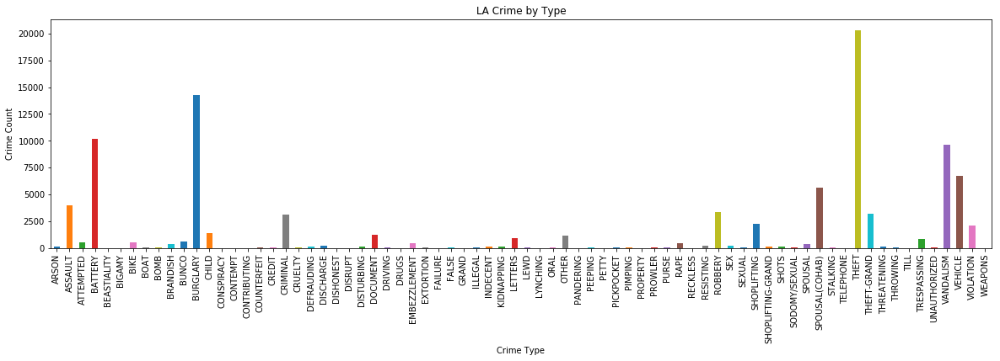

<Figure size 432x288 with 0 Axes>

In [14]:
count_chart = count_makers.plot(kind='bar', figsize =(20,5))
count_chart.set_xlabel("Crime Type")
count_chart.set_ylabel("Crime Count")
plt.title("LA Crime by Type")
# Sets the x limits of the current chart
#plt.xlim(-0.75, len(x_axis)-0.25)
plt.show()

plt.savefig("Images/la_crime_type.png")

In [15]:
#crime_amount= []
#for Date in crime_amount 
    #if response['Date'] == Date
        #date.append(response['Date'])
    #else:
        #print('City Data is not found')
    #print('-------------------------------------------')


In [51]:
weather_df.groupby(['Date','Temp_Max']).size()
weather_df.head()

,Unnamed: 0,Location,Date,Crime Code,Unix Date,Temp_Max,Wind_Speed,Weather_Type,Temp_Max_Fahrenheit,Offense Main,Offense Sub,Offense dump
149,149,"(34.1613, -118.4137)",04/01/2014,626,1396324800,290.37,1,Clear,63.00,SPOUSAL(COHAB),ABUSE - SIMPLE ASSAULT,None
223,223,"(33.9633, -118.2783)",07/21/2014,810,1405915200,295.15,3,Clear,71.60,SEX,UNLAWFUL,
240,240,"(33.9954, -118.2652)",04/06/2014,354,1396756800,292.15,3,Clear,66.20,THEFT,OF IDENTITY,None
325,325,"(33.951, -118.287)",02/01/2014,510,1391230800,289.26,1,Clear,61.00,VEHICLE,- STOLEN,None
336,336,"(34.3086, -118.4317)",01/28/2014,440,1390885200,290.37,0,Clear,63.00,THEFT,PLAIN - PETTY ($950 & UNDER),None


In [42]:
theft_df=weather_df.loc[weather_df['Offense Main'].str.contains('THEFT'), :]
theft_df

,Unnamed: 0,Location,Date,Crime Code,Unix Date,Temp_Max,Wind_Speed,Weather_Type,Temp_Max_Fahrenheit,Offense Main,Offense Sub,Offense dump
240,240,"(33.9954, -118.2652)",04/06/2014,354,1396756800,292.15,3,Clear,66.20,THEFT,OF IDENTITY,None
336,336,"(34.3086, -118.4317)",01/28/2014,440,1390885200,290.37,0,Clear,63.00,THEFT,PLAIN - PETTY ($950 & UNDER),None
347,347,"(34.2315, -118.4168)",03/01/2014,354,1393650000,289.15,1,Rain,60.80,THEFT,OF IDENTITY,None
364,364,"(34.0351, -118.3779)",07/17/2014,440,1405569600,295.37,2,Clear,72.00,THEFT,PLAIN - PETTY ($950 & UNDER),None
367,367,"(34.0464, -118.3338)",07/21/2014,331,1405915200,295.15,3,Clear,71.60,THEFT,FROM MOTOR VEHICLE - GRAND ($400 AND OVER),None
368,368,"(34.0459, -118.3454)",07/02/2014,440,1404273600,295.15,0,Clear,71.60,THEFT,PLAIN - PETTY ($950 & UNDER),None
375,375,"(34.0533, -118.3402)",07/11/2014,341,1405051200,296.15,0,Clear,73.40,THEFT-GRAND,"($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",None
377,377,"(34.0436, -118.3201)",07/21/2014,354,1405915200,295.15,3,Clear,71.60,THEFT,OF IDENTITY,None
378,378,"(34.0835, -118.3462)",07/22/2014,341,1406001600,295.93,3,Clear,73.00,THEFT-GRAND,"($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",None
379,379,"(34.0539, -118.3234)",07/21/2014,341,1405915200,295.15,3,Clear,71.60,THEFT-GRAND,"($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",None


In [58]:
temp_group = weather_df.groupby('Temp_Max_Fahrenheit')

# Count how many times each maker appears in our group
count_temp = temp_group['Temp_Max_Fahrenheit'].count()

count_temp.sort_values(ascending=False, na_position='first')
print(temp_group)


In [59]:
temp_df=pd.DataFrame({'Temp_Max_Fahrenheit': theft_df['Temp_Max_Fahrenheit'], 'THEFTS':count_temp})
temp_df.head()


,Temp_Max_Fahrenheit,THEFTS
240,66.20,NaN
336,63.00,NaN
347,60.80,NaN
364,72.00,NaN
367,71.60,NaN


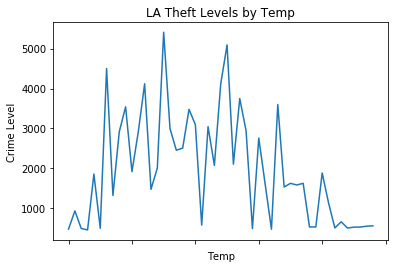

<Figure size 432x288 with 0 Axes>

In [62]:
temp_chart = count_temp.plot.line()
temp_chart.set_xlabel("Temp")
temp_chart.set_ylabel("Crime Level")
plt.title("LA Theft Levels by Temp")
# Sets the x limits of the current chart
#plt.xlim(-0.75, len(x_axis)-0.25)
plt.show()

plt.savefig("Images/la_crime_temp.png")

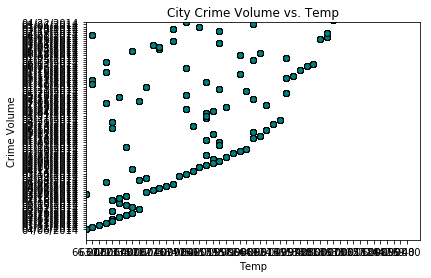

In [49]:
# Axes values
x_axis = theft_df['Temp_Max_Fahrenheit']
y_axis = theft_df['Date']

#set conditions for scatter plot
plt.scatter(x_axis, y_axis, c='teal', edgecolors='black')

#label chart highlight the Equator
plt.title('City Crime Volume vs. Temp')
plt.xlabel('Temp')
plt.xlim(0,50)
plt.ylabel('Crime Volume')
plt.ylim(-5,100)
plt.axvline(0, color = 'black', alpha = .25)

# Save chart
plt.savefig('TempVsCrime.png')

#Show chart
plt.show()

In [ ]:
top_crimes_tem = wrestled_over_hundred.loc[wrestler_name,["THEFT","BURGLARY", "BATTERY"
                                                            "VANDALISM"]]

In [23]:
# Create a list of the years that we will use as our x axis
crimes = [THEFT, BURGLARY , BATTERY, VANDALISM]

# Plot our line that will be used to track a wrestler's wins over the years
plt.plot(crimes, Temp_Max_Fahrenheit, color="green", label="Wins")

# Plot our line that will be used to track a wrestler's losses over the years
#plt.plot(years, losses_over_time, color="blue", label="Losses")

# Place a legend on the chart in what matplotlib believes to be the "best" location
plt.legend(loc="best")

plt.title("LA Top Crime VS Temp")
plt.xlabel("temp")
plt.ylabel("Crime")

# Print our chart to the screen
plt.show()

NameError: name 'THEFT' is not defined

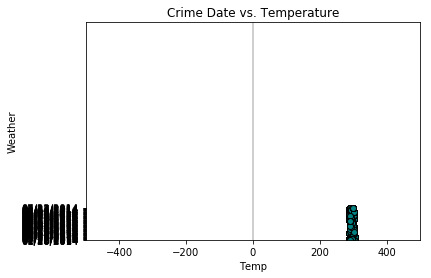

In [18]:
# Axes values
x_axis = weather_df['Temp_Max']
y_axis = weather_df['Date']

#set conditions for scatter plot
plt.scatter(x_axis, y_axis, c='teal', edgecolors='black')

#label chart highlight the Equator
plt.title('Crime Date vs. Temperature')
plt.xlabel('Temp')
plt.xlim(-500, 500)
plt.ylabel('Weather')
plt.ylim(100, 700)
plt.axvline(0, color = 'black', alpha = .25)

# Save chart
plt.savefig('DateVsTemperature.png')

#Show chart
plt.show()
